In [1]:
!pip install arviz
!pip install pymc3
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm

from scipy import stats
from scipy.special import expit as logistic

     |████████████████████████████████| 1.6 MB 513 kB/s eta 0:00:01
     |████████████████████████████████| 4.7 MB 55.6 MB/s eta 0:00:01
     |████████████████████████████████| 870 kB 37.6 MB/s eta 0:00:01
     |████████████████████████████████| 239 kB 56.8 MB/s eta 0:00:01
     |████████████████████████████████| 872 kB 519 kB/s eta 0:00:01
     |████████████████████████████████| 1.8 MB 24.8 MB/s eta 0:00:01
     |████████████████████████████████| 233 kB 35.4 MB/s eta 0:00:01
     |████████████████████████████████| 86 kB 2.2 MB/s  eta 0:00:01
     |████████████████████████████████| 77 kB 2.9 MB/s  eta 0:00:01
  Created wheel for theano-pymc: filename=Theano_PyMC-1.1.2-py3-none-any.whl size=1529963 sha256=176fedc691fbe4b2afdc05cc01e7595313a1b171f4b74f7da46dc07e9988e1d4
  Stored in directory: /root/.cache/pip/wheels/04/22/4d/832878ba2fe9ea3543f0189b9288a78e4aa4e0afc851a6890c
Successfully built theano-pymc


In [2]:
%config InlineBackend.figure_format = 'retina'
RANDOM_SEED = 8927
np.random.seed(RANDOM_SEED)
az.style.use("arviz-darkgrid")
az.rcParams["stats.hdi_prob"] = 0.89
az.rcParams["stats.ic_scale"] = "deviance"
az.rcParams["stats.information_criterion"] = "waic"

In [3]:
az.rcParams.keys()

KeysView(RcParams({'data.http_protocol': 'https',
          'data.index_origin': 0,
          'data.load': 'lazy',
          'data.log_likelihood': True,
          'data.metagroups': {'latent_vars': ('posterior', 'prior'),
                              'observed_vars': ('posterior_predictive',
                                                'observed_data',
                                                'prior_predictive'),
                              'posterior_groups': ('posterior',
                                                   'posterior_predictive',
                                                   'sample_stats',
                                                   'log_likelihood'),
                              'posterior_groups_warmup': ('_warmup_posterior',
                                                          '_warmup_posterior_predictive',
                                                          '_warmup_sample_stats'),
                              'prior_groups

#### Code 13.1

EF

In [4]:
import os
os.chdir('/ECT')
ef = pd.read_csv("./Abbott/Long_FS_Efield_Results2.txt", sep="\t")
print(ef.shape)
ef.head(10)

(4943, 5)


,Ursi,Region,Average_Intensity,Max_Intensity,Unnamed: 4
0,M87105256,2,44.713495,72.883247,NaN
1,M87105256,3,16.707266,18.307795,NaN
2,M87105256,7,37.381191,46.290985,NaN
3,M87105256,8,28.137607,40.835445,NaN
4,M87105256,10,35.980784,51.973476,NaN
5,M87105256,11,26.378476,40.006542,NaN
6,M87105256,12,31.791150,42.636517,NaN
7,M87105256,13,41.233026,52.369827,NaN
8,M87105256,16,38.471081,51.861031,NaN
9,M87105256,17,26.502785,41.310093,NaN


Delta Volume

In [5]:
dvol = pd.read_csv("./Abbott/Miklos_group_fs_vol_long.txt", sep=" ")
print(dvol.shape)
dvol.head(10)

(16724, 4)


,Ursi,Study,Region_Label,Volume
0,M87105256,1,ctx_lh_bankssts,2211.0
1,M87105256,1,ctx_lh_caudalanteriorcingulate,1756.0
2,M87105256,1,ctx_lh_caudalmiddlefrontal,7691.0
3,M87105256,1,ctx_lh_cuneus,3210.0
4,M87105256,1,ctx_lh_entorhinal,2291.0
5,M87105256,1,ctx_lh_fusiform,11471.0
6,M87105256,1,ctx_lh_inferiorparietal,9726.0
7,M87105256,1,ctx_lh_inferiortemporal,9075.0
8,M87105256,1,ctx_lh_isthmuscingulate,2932.0
9,M87105256,1,ctx_lh_lateraloccipital,10578.0


In [6]:
ECT_params = pd.read_csv('./Abbott/ECT-params.csv')
ECT_params.head(10)

,Unnamed: 0,id,cor,slope,inters,charge,pulsenumber,pulsewidth,duration,eeg,freq,amp
0,1,M87105256,-0.157913,-0.114422,-0.784451,619.2,2480,0.300000,26.0,178,40.000000,600
1,2,M87105615,0.263814,0.209864,0.009336,595.2,2480,0.300000,22.0,361,53.333333,800
2,3,M87106245,0.119097,0.142769,-0.134036,576.0,2120,0.416667,21.0,334,46.666667,800
3,4,M87107641,-0.012798,0.030454,0.345955,520.8,2480,0.300000,22.0,395,53.333333,700
4,5,M87112316,0.318465,0.198415,0.068148,892.0,4960,0.300000,34.0,321,70.000000,600
5,6,M87113155,0.019998,0.080674,-0.067843,1785.6,9920,0.300000,48.0,204,103.333333,600
6,7,M87121072,-0.030556,0.056069,0.166958,722.4,3440,0.300000,26.0,136,60.000000,700
7,8,M87123952,0.123968,0.113052,0.533284,1267.0,1810,1.000000,36.5,387,24.166667,700
8,9,M87125630,0.136420,0.114317,0.946861,616.8,2600,0.416667,23.0,340,50.000000,700
9,10,M87128072,0.059533,0.113342,0.321992,710.4,2960,0.300000,24.0,280,56.666667,800


In [7]:
volef_wide = pd.read_csv('./Abbott/volef-wide.csv')
volef_wide.head(10)
volef_wide.shape

(4368, 15)

In [1084]:
nmdata = pd.merge(volef_wide, ECT_params, left_on='Ursi', right_on='id')
nmdata.shape
nmdata.columns

(4284, 27)

Index(['Unnamed: 0_x', 'Region', 'Ursi', 'Region_Label', 'Volume.2',
       'Average_Intensity.2', 'Max_Intensity.2', 'Volume.1',
       'Average_Intensity.1', 'Max_Intensity.1', 'Volume.3',
       'Average_Intensity.3', 'Max_Intensity.3', 'dvol3', 'dvol',
       'Unnamed: 0_y', 'id', 'cor', 'slope', 'inters', 'charge', 'pulsenumber',
       'pulsewidth', 'duration', 'eeg', 'freq', 'amp'],
      dtype='object')

In [792]:
nmdata['Max_Intensity.1']

0        51.973476
1        66.514877
2        48.281452
3        49.747673
4        31.080307
           ...    
4279     84.840675
4280     68.018486
4281    103.637665
4282    113.339310
4283     46.290897
Name: Max_Intensity.1, Length: 4284, dtype: float64

In [9]:

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%qtconsole

In [1085]:
Nsubj = len(np.unique(nmdata.Ursi))
Nregi = len(np.unique(nmdata.Region_Label))
code = pd.DataFrame({'Ursi':list(np.unique(nmdata.Ursi)), 'sbj':list(range(Nsubj))})
coder = pd.DataFrame({'Region_Label':list(np.unique(nmdata.Region_Label)), 'rx':list(range(Nregi))})
nmdata['sbj'] = np.zeros(nmdata.shape[0]).astype(int)
nmdata['rgn'] = np.zeros(nmdata.shape[0]).astype(int)

for i in range(Nsubj):
    indx = np.where(nmdata.Ursi == code.Ursi[i])
    nmdata.sbj.iloc[indx[0]] = code.sbj[i]
for i in range(Nregi):
    indx = np.where(nmdata.Region_Label == coder.Region_Label[i])
    nmdata.rgn.iloc[indx[0]] = coder.rx[i]
nmdata.head()
np.unique(nmdata.rgn)

/tmp/ipykernel_1544/3272332842.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nmdata.sbj.iloc[indx[0]] = code.sbj[i]
/tmp/ipykernel_1544/3272332842.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nmdata.rgn.iloc[indx[0]] = coder.rx[i]


,Unnamed: 0_x,Region,Ursi,Region_Label,Volume.2,Average_Intensity.2,Max_Intensity.2,Volume.1,Average_Intensity.1,Max_Intensity.1,...,inters,charge,pulsenumber,pulsewidth,duration,eeg,freq,amp,sbj,rgn
0,1,10,M87105256,Left-Thalamus-Proper,7685.0,35.980784,51.973476,7441.5,35.980784,51.973476,...,-0.784451,619.2,2480,0.3,26.0,178,40.0,600,0,7
1,149,1002,M87105256,ctx-lh-caudalanteriorcingulate,1668.0,47.705159,66.514877,1756.0,47.705159,66.514877,...,-0.784451,619.2,2480,0.3,26.0,178,40.0,600,0,18
2,297,1003,M87105256,ctx-lh-caudalmiddlefrontal,8199.0,33.790458,48.281452,7691.0,33.790458,48.281452,...,-0.784451,619.2,2480,0.3,26.0,178,40.0,600,0,19
3,445,1005,M87105256,ctx-lh-cuneus,2891.0,37.719310,49.747673,3210.0,37.719310,49.747673,...,-0.784451,619.2,2480,0.3,26.0,178,40.0,600,0,20
4,593,1006,M87105256,ctx-lh-entorhinal,2192.0,20.984886,31.080307,2291.0,20.984886,31.080307,...,-0.784451,619.2,2480,0.3,26.0,178,40.0,600,0,21


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83])

In [115]:
!pip install sklearn

sbj=nmdata.sbj.astype(int).values
sbj
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
hm=ss.fit_transform(nmdata['Max_Intensity.1'].values.reshape(-1,1))
np.unique(hm)

array([ 0,  0,  0, ..., 50, 50, 50])

array([-1.49760548, -1.49446483, -1.4632142 , ...,  5.66009251,
        5.66990153,  5.73833199])

In [1086]:
bv = nmdata.groupby(['Region_Label'])['Volume.1'].agg(['mean'])
nmdata['volavbas'] = np.zeros(nmdata.shape[0]).astype(int)
for i in range(Nregi):
    indx = np.where(nmdata.Region_Label == bv.index.values[i])
    nmdata.volavbas.iloc[indx[0]] = int(bv.iloc[i])
nmdata.head()
np.unique(nmdata.volavbas)

/tmp/ipykernel_1544/1796799423.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nmdata.volavbas.iloc[indx[0]] = int(bv.iloc[i])


,Unnamed: 0_x,Region,Ursi,Region_Label,Volume.2,Average_Intensity.2,Max_Intensity.2,Volume.1,Average_Intensity.1,Max_Intensity.1,...,charge,pulsenumber,pulsewidth,duration,eeg,freq,amp,sbj,rgn,volavbas
0,1,10,M87105256,Left-Thalamus-Proper,7685.0,35.980784,51.973476,7441.5,35.980784,51.973476,...,619.2,2480,0.3,26.0,178,40.0,600,0,7,6729
1,149,1002,M87105256,ctx-lh-caudalanteriorcingulate,1668.0,47.705159,66.514877,1756.0,47.705159,66.514877,...,619.2,2480,0.3,26.0,178,40.0,600,0,18,1552
2,297,1003,M87105256,ctx-lh-caudalmiddlefrontal,8199.0,33.790458,48.281452,7691.0,33.790458,48.281452,...,619.2,2480,0.3,26.0,178,40.0,600,0,19,5768
3,445,1005,M87105256,ctx-lh-cuneus,2891.0,37.719310,49.747673,3210.0,37.719310,49.747673,...,619.2,2480,0.3,26.0,178,40.0,600,0,20,2796
4,593,1006,M87105256,ctx-lh-entorhinal,2192.0,20.984886,31.080307,2291.0,20.984886,31.080307,...,619.2,2480,0.3,26.0,178,40.0,600,0,21,1802


array([  238,   492,   858,   919,  1087,  1132,  1377,  1523,  1552,
        1731,  1784,  1790,  1802,  1832,  1845,  1856,  1918,  2087,
        2137,  2184,  2305,  2339,  2392,  2406,  2428,  2486,  2796,
        2823,  2886,  3103,  3301,  3307,  3347,  3484,  3501,  3584,
        3702,  3719,  3738,  3743,  3801,  4161,  4408,  4498,  4859,
        4963,  5626,  5768,  5884,  6273,  6430,  6484,  6659,  6706,
        6729,  6941,  8228,  8453,  8744,  8780,  9063,  9150,  9253,
        9387,  9457,  9871, 10443, 10560, 10563, 10735, 11006, 11298,
       11351, 11890, 12364, 12595, 12658, 12673, 13929, 13999, 19611,
       20580, 47502, 49455])

In [ ]:
sbj=nmdata.sbj.astype(int).values
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
ef=ss.fit_transform(nmdata['Max_Intensity.1'].values.reshape(-1,1)).ravel()#remove extra bracket
vol=ss.fit_transform(nmdata['dvol'].values.reshape(-1,1)).ravel() #remove extra bracket

with pm.Model() as m_1_2:
    # hyper-priors
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    b_bar = pm.Normal("b_bar", 0.0, 1.5)
    sigma_a = pm.Exponential("sigma_a", 1.0)
    sigma_b = pm.Exponential("sigma_b", 1.0)
    sigma = pm.Exponential("sigma", 1.0)
    # adaptive priors
    a = pm.Normal("a", a_bar, sigma_a, shape=Nsubj)
    b = pm.Normal("b", b_bar, sigma_b, shape=Nsubj)
    mu = pm.Deterministic("mu", a[sbj] + b[sbj] * ef)
    #mu = a[sbj] + b[sbj]*nmdata['Max_Intensity.1']
    V = pm.Normal("V", mu, sigma, observed=vol)
    
    #trace_1_2 = pm.sample(tune=3000, target_accept=0.95, random_seed=RANDOM_SEED)
    trace_1_2 = pm.sample(random_seed=RANDOM_SEED)
    idata_1_2 = az.from_pymc3(trace_1_2)

In [238]:
sbj=nmdata.sbj.astype(int).values
rgn=nmdata.rgn.astype(int).values
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
ef=ss.fit_transform(nmdata['Max_Intensity.1'].values.reshape(-1,1)).ravel()#remove extra bracket
vol=ss.fit_transform(nmdata['dvol'].values.reshape(-1,1)).ravel() #remove extra bracket
regionsize=ss.fit_transform(nmdata['volavbas'].values.reshape(-1,1)).ravel() #remove extra bracket

with pm.Model() as m_1_3:
    # hyper-priors
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    b_bar = pm.Normal("b_bar", 0.0, 1.5)
    sigma_a = pm.Exponential("sigma_a", 1.0)
    sigma_b = pm.Exponential("sigma_b", 1.0)
    c = pm.Normal("c", 0.0, 1.5)
    d = pm.Exponential("d", 1.0)
    sigma = pm.Exponential("sigma", 1)
    #sigma_=pm.Deterministic("sigma_", c + d * regionsize)
    sigma_ = pm.Exponential("sigma_", sigma, shape=Nregi)
    #sig = pm.Exponential("sigma", sigma_)
    # adaptive priors
    a = pm.Normal("a", a_bar, sigma_a, shape=Nsubj)
    b = pm.Normal("b", b_bar, sigma_b, shape=Nsubj)
    mu = pm.Deterministic("mu", a[sbj] + b[sbj] * ef)
    #mu = a[sbj] + b[sbj]*nmdata['Max_Intensity.1']
    V = pm.Normal("V", mu, sigma_[rgn], observed=vol)
    
    #trace_1_2 = pm.sample(tune=3000, target_accept=0.95, random_seed=RANDOM_SEED)
    trace_1_3 = pm.sample(random_seed=RANDOM_SEED)
    idata_1_3 = az.from_pymc3(trace_1_2)

/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, a, sigma_, sigma, d, c, sigma_b, sigma_a, b_bar, a_bar]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 12 seconds.
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/arviz/data/io_pymc3_3x.py:347: UserWarning: Could not compute log_likelihood, it will be omitted. Check your model object or set log_likelihood=False
  warnings.warn(warn_msg)


In [1083]:
nmdata.freqcat

0       0
1       0
2       0
3       0
4       0
       ..
4278    2
4279    2
4280    2
4282    2
4283    2
Name: freqcat, Length: 4182, dtype: int64

In [1087]:
nmdata['freqcat'] = np.zeros(nmdata.shape[0]).astype(int)
nmdata['freqcat'].iloc[np.where(nmdata.freq<=40)[0]]=0
nmdata['freqcat'].iloc[np.where((nmdata.freq>40) & (nmdata.freq<=70))[0]]=1
nmdata['freqcat'].iloc[np.where(nmdata.freq>70)[0]]=2
np.unique(nmdata.freqcat)

/tmp/ipykernel_1544/2836971676.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nmdata['freqcat'].iloc[np.where(nmdata.freq<=40)[0]]=0
/tmp/ipykernel_1544/2836971676.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nmdata['freqcat'].iloc[np.where((nmdata.freq>40) & (nmdata.freq<=70))[0]]=1
/tmp/ipykernel_1544/2836971676.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nmdata['freqcat'].iloc[np.where(nmdata.freq>70)[0]]=2


array([0, 1, 2])

In [1088]:
nmdata.shape
nmdata_orig=nmdata.copy()

(4284, 31)

In [1110]:
code = pd.read_csv('./Abbott/FsTutorial_AnatomicalROI_FreeSurferColorLUT.csv')
code.head(10)

,Unnamed: 0,struct_index,struct_name,r,g,b,a
0,1,0,Unknown,0,0,0,0
1,2,1,Left-Cerebral-Exterior,70,130,180,0
2,3,2,Left-Cerebral-White-Matter,245,245,245,0
3,4,3,Left-Cerebral-Cortex,205,62,78,0
4,5,4,Left-Lateral-Ventricle,120,18,134,0
5,6,5,Left-Inf-Lat-Vent,196,58,250,0
6,7,6,Left-Cerebellum-Exterior,0,148,0,0
7,8,7,Left-Cerebellum-White-Matter,220,248,164,0
8,9,8,Left-Cerebellum-Cortex,230,148,34,0
9,10,9,Left-Thalamus,0,118,14,0


In [257]:
sbj=nmdata.sbj.astype(int).values
rgn=nmdata.rgn.astype(int).values
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
ef=ss.fit_transform(nmdata['Max_Intensity.1'].values.reshape(-1,1)).ravel()#remove extra bracket
vol=ss.fit_transform(nmdata['dvol'].values.reshape(-1,1)).ravel() #remove extra bracket
regionsize=ss.fit_transform(nmdata['volavbas'].values.reshape(-1,1)).ravel() #remove extra bracket
pulsen=ss.fit_transform(nmdata['pulsenumber'].values.reshape(-1,1)).ravel() #remove extra bracket
with pm.Model() as m_1_3:
    # hyper-priors
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    b_bar = pm.Normal("b_bar", 0.0, 1.5)
    r_bar = pm.Normal("r_bar", 0.0, 1.5)
    sigma_a = pm.Exponential("sigma_a", 1.0)
    sigma_b = pm.Exponential("sigma_b", 1.0)
    sigma_r = pm.Exponential("sigma_r", 1.0)
    
    c = pm.Normal("c", 0.0, 1.5)
    d = pm.Exponential("d", 1.0)
    sigma = pm.Exponential("sigma", 1)
    #sigma_=pm.Deterministic("sigma_", c + d * regionsize)
    sigma_ = pm.Exponential("sigma_", sigma, shape=Nregi)
    #sig = pm.Exponential("sigma", sigma_)
    # adaptive priors
    a = pm.Normal("a", a_bar, sigma_a, shape=Nsubj)
    b_bar=pm.Deterministic("b_bar", r)
    
    b = pm.Normal("b", b_bar, sigma_b, shape=Nsubj)
    r = pm.HalfNormal("r", r_bar, sigma_r, shape=Nregi)
    
    mu = pm.Deterministic("mu", a[sbj] + b[sbj] * ef)
    #mu = a[sbj] + b[sbj]*nmdata['Max_Intensity.1']
    V = pm.Normal("V", mu, sigma_[rgn], observed=vol)
    
    #trace_1_2 = pm.sample(tune=3000, target_accept=0.95, random_seed=RANDOM_SEED)
    trace_1_3 = pm.sample(random_seed=RANDOM_SEED)
    idata_1_3 = az.from_pymc3(trace_1_3)

/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [r, b, a, sigma_, sigma, d, c, sigma_r, sigma_b, sigma_a, r_bar, b_bar, a_bar]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 25 seconds.
There were 122 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6739284474474696, but should be close to 0.8. Try to increase the number of tuning steps.
There were 324 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6652863696049796, but should be close to 0.8. Try to increase the number of tuning steps.
There were 21 divergences after tuning. Increase `target_accept` or reparameterize.
There were 113 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-package

In [369]:
nmdata=nmdata_orig.iloc[np.where((nmdata_orig.volavbas>600) & (nmdata_orig['Max_Intensity.1']<200) & (nmdata_orig.freq>=40))[0]]

In [322]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import xarray as xr

m_quantiles = [0.025, 0.25, 0.5, 0.75, 0.975]
def make_scalarMap(m):
    return ScalarMappable(norm=Normalize(vmin=np.min(m), vmax=np.max(m)), cmap="viridis")

scalarMap = make_scalarMap(pulsen1)

def plot_data(x, moderator, y, ax=None):
    if ax is None:
        fig, ax = plt.subplots(1, 1)
    else:
        fig = plt.gcf()

    h = ax.scatter(x, y, c=moderator, cmap=scalarMap.cmap)
    ax.set(xlabel="x", ylabel="y")
    # colourbar for moderator
    cbar = fig.colorbar(h)
    cbar.ax.set_ylabel("moderator")
    return ax

def posterior_prediction_plot(result, x, moderator, m_quantiles, ax=None):
    """Plot posterior predicted `y`"""
    if ax is None:
        fig, ax = plt.subplots(1, 1)

    post = result.posterior.stack(sample=("chain", "draw"))
    xi = xr.DataArray(np.linspace(np.min(x), np.max(x), 20), dims=["x_plot"])
    m_levels = result.constant_data["pulsen"].quantile(m_quantiles).rename({"quantile": "m_level"})

    for p, m in zip(m_quantiles, m_levels):
        y = post.a + post.b * xi + post.d * xi * m + post.c * m
        region = y.quantile([0.025, 0.5, 0.975], dim="sample")
        ax.fill_between(
            xi,
            region.sel(quantile=0.025),
            region.sel(quantile=0.975),
            alpha=0.2,
            color=scalarMap.to_rgba(m),
            edgecolor="w",
        )
        ax.plot(
            xi,
            region.sel(quantile=0.5),
            color=scalarMap.to_rgba(m),
            linewidth=2,
            label=f"{p*100}th percentile of moderator",
        )

    ax.legend(fontsize=9)
    ax.set(xlabel="x", ylabel="y")
    return ax


/tmp/ipykernel_1544/287168485.py:20: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(h)


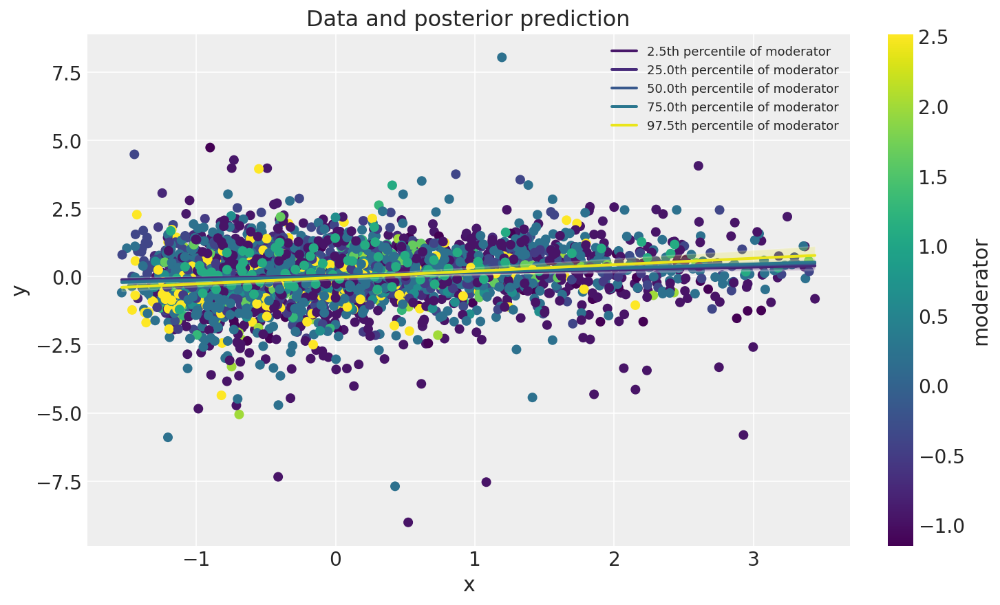

In [372]:
fig, ax = plt.subplots(figsize=(10, 6))
ax = plot_data(ef, pulsen1, vol, ax=ax)
posterior_prediction_plot(idata_1_4, ef, pulsen1, m_quantiles, ax=ax)
ax.set_title("Data and posterior prediction");

In [1010]:
np.unique(((nmdata.amp.values/100)-6).astype('int'))

array([0, 1, 2])

In [1089]:
#nmdata=nmdata_orig.iloc[np.where((nmdata_orig.volavbas>600) & (nmdata_orig['Max_Intensity.1']<200) & (nmdata_orig.freq>=40))[0]]
#nmdata=nmdata_orig.iloc[np.where((nmdata_orig.volavbas>600) & (nmdata_orig.pulsenumber>=3720))].copy()
nmdata=nmdata_orig.iloc[np.where((nmdata_orig.volavbas>600))].copy()
#nmdata=nmdata_orig


In [1014]:
from theano import tensor as tt

In [1116]:
sbj=nmdata.sbj.astype(int).values
amp=((nmdata.amp.values/100)-6).astype('int')
rgn=nmdata.rgn.astype(int).values
frc=nmdata.freqcat.astype(int).values
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
#ef=ss.fit_transform(nmdata['Max_Intensity.1'].values.reshape(-1,1)).ravel()#remove extra bracket
ef=ss.fit_transform(nmdata['Average_Intensity.1'].values.reshape(-1,1)).ravel()#remove extra bracket

vol=ss.fit_transform(nmdata['dvol'].values.reshape(-1,1)).ravel() #remove extra bracket
regionsize=ss.fit_transform(nmdata['volavbas'].values.reshape(-1,1)).ravel() #remove extra bracket
pulsen1=ss.fit_transform(nmdata['pulsenumber'].values.reshape(-1,1)).ravel() #remove extra bracket
with pm.Model() as m_1_5:
    # hyper-priors
    pulsen = pm.Data("pulsen", pulsen1)
    region = pm.Data("region", nmdata.Region)
    myrgn = pm.Data("myrgn", rgn)
    myamp = pm.Data("myamp", amp)
    sigma = pm.Exponential("sigma", 1)
    #sigma_=pm.Deterministic("sigma_", c + d * regionsize)
    #sigma_ = pm.Exponential("sigma_", sigma, shape=Nregi)
    #sig = pm.Exponential("sigma", sigma_)
    # adaptive priors
    #mr = pm.Normal("mr",0,1.5)
    #sr = pm.Exponential("sr",1)
    #ma = pm.Normal("ma",0,1.5)
    #sa = pm.Exponential("sa",1)
    #mb = pm.Normal("mb",0,1.5)
    #sb = pm.Exponential("sb",1)
    chol, Rho_, sigma_amp = pm.LKJCholeskyCov("chol_cov", n=3, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True)

    #b600 = pm.Normal("b600", mu=0, sd=2.0)  # prior for average for 600
    #b700 = pm.Normal("b700", mu=0, sd=2.0)  # prior for average for 700
    #b800 = pm.Normal("b800", mu=0, sd=2.0)  # prior for average for 700
    b_l = pm.Normal("b_l", mu=0, sd=2.0)  # prior for average for 600
    b_m = pm.Normal("b_m", mu=0, sd=2.0)  # prior for average for 700
    b_u = pm.Normal("b_u", mu=0, sd=2.0)  # prior for average for 700
    
    b1 = pm.MvNormal("b1", mu=tt.stack([b_l, b_m, b_u]), chol=chol, shape=(Nregi, 3))  # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe

    #b1 = pm.Normal("b1", 0, 1)
    a1 = pm.Normal("a1", 0, 1)
    #a1 = pm.Normal("a1", ma, sa, shape=Nregi)
    
    #smb = pm.Exponential("smb", 1)
    #mb = pm.Deterministic("mb", a1 + b1 * pulsen)
    #b = pm.Normal("b", mb, smb)
    #b = pm.Deterministic("b", a1[rgn] + b1[rgn] * pulsen)
    b = pm.Deterministic("b", a1 + b1[rgn,frc] * pulsen)
    #b = pm.Normal("b", mb, sb, shape=Nregi)
    a = pm.Normal("a", 0, 1.5)
    
    #c = pm.Normal("c", 0, 1.0)
    #d = pm.Normal("d", 0, 1.0)
    
    nu = pm.Exponential('nu', 1/30)
    
    #mu = pm.Deterministic("mu", a + b * ef + c * pulsen + d * ef * pulsen)
    mu = pm.Deterministic("mu",a + b * ef)
    #mu = pm.Deterministic("mu",a + b[rgn] * ef)
    #means = pm.StudentT('means', nu = nu, mu = hyper_mean, sd = hyper_sigma, shape = n_individuals)

    #mu = a[sbj] + b[sbj]*nmdata['Max_Intensity.1']
    #V = pm.Normal("V", mu, sigma_[rgn], observed=vol)
    #V = pm.Normal("V", mu, sigma, observed=vol)
    #nu = pm.Exponential('nu', 1./10, testval = 5.)
    V = pm.StudentT("V",nu, mu, sigma, observed=vol)
    
    #trace_1_2 = pm.sample(tune=3000, target_accept=0.95, random_seed=RANDOM_SEED)
    trace_1_5 = pm.sample(random_seed=RANDOM_SEED)
    idata_1_5 = az.from_pymc3(trace_1_5)

/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu, a, a1, b1, b_u, b_m, b_l, chol_cov, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 85 seconds.
There were 47 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.652175486971873, but should be close to 0.8. Try to increase the number of tuning steps.
There were 17 divergences after tuning. Increase `target_accept` or reparameterize.
There were 111 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.5737305619968145, but should be close to 0.8. Try to increase the number of tuning steps.
There were 27 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6690755787798992, but should be close to 0.8. Try to increase the number of tuning steps.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampli

In [1130]:
sbj=nmdata.sbj.astype(int).values
amp=((nmdata.amp.values/100)-6).astype('int')
rgn=nmdata.rgn.astype(int).values
frc=nmdata.freqcat.astype(int).values
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
#ef=ss.fit_transform(nmdata['Max_Intensity.1'].values.reshape(-1,1)).ravel()#remove extra bracket
ef=ss.fit_transform(nmdata['Average_Intensity.1'].values.reshape(-1,1)).ravel()#remove extra bracket

vol=ss.fit_transform(nmdata['dvol'].values.reshape(-1,1)).ravel() #remove extra bracket
regionsize=ss.fit_transform(nmdata['volavbas'].values.reshape(-1,1)).ravel() #remove extra bracket
pulsen1=ss.fit_transform(nmdata['pulsenumber'].values.reshape(-1,1)).ravel() #remove extra bracket
with pm.Model() as m_1_5:
    # hyper-priors
    pulsen = pm.Data("pulsen", pulsen1)
    region = pm.Data("region", nmdata.Region)
    myrgn = pm.Data("myrgn", rgn)
    myamp = pm.Data("myamp", amp)
    sigma = pm.Exponential("sigma", 1)
    # adaptive priors
    #mr = pm.Normal("mr",0,1.5)
    #sr = pm.Exponential("sr",1)
    ma = pm.Normal("ma",0,1.5)
    sa = pm.Exponential("sa",1)
    #mb = pm.Normal("mb",0,1.5)
    #sb = pm.Exponential("sb",1)
    chol, Rho_, sigma_amp = pm.LKJCholeskyCov("chol_cov", n=3, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True)

    #b600 = pm.Normal("b600", mu=0, sd=2.0)  # prior for average for 600
    #b700 = pm.Normal("b700", mu=0, sd=2.0)  # prior for average for 700
    #b800 = pm.Normal("b800", mu=0, sd=2.0)  # prior for average for 700
    b_l = pm.Normal("b_l", mu=0, sd=2.0)  # prior for average for 600
    b_m = pm.Normal("b_m", mu=0, sd=2.0)  # prior for average for 700
    b_u = pm.Normal("b_u", mu=0, sd=2.0)  # prior for average for 700
    
    b1 = pm.MvNormal("b1", mu=tt.stack([b_l, b_m, b_u]), chol=chol, shape=(Nregi, 3))  # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe

    #b1 = pm.Normal("b1", 0, 1)
    #a1 = pm.Normal("a1", 0, 1)
    a1 = pm.Normal("a1", ma, sa, shape=Nregi)
    
    #smb = pm.Exponential("smb", 1)
    #mb = pm.Deterministic("mb", a1 + b1 * pulsen)
    #b = pm.Normal("b", mb, smb)
    #b = pm.Deterministic("b", a1[rgn] + b1[rgn] * pulsen)
    b = pm.Deterministic("b", a1[rgn] + b1[rgn,frc] * pulsen)
    #b = pm.Normal("b", mb, sb, shape=Nregi)
    a = pm.Normal("a", 0, 1.5)
    
    #c = pm.Normal("c", 0, 1.0)
    #d = pm.Normal("d", 0, 1.0)
    
    nu = pm.Exponential('nu', 1/30)
    
    #mu = pm.Deterministic("mu", a + b * ef + c * pulsen + d * ef * pulsen)
    mu = pm.Deterministic("mu",a + b * ef)
 
    V = pm.StudentT("V",nu, mu, sigma, observed=vol)
    
    trace_1_5 = pm.sample(random_seed=RANDOM_SEED)
    idata_1_5 = az.from_pymc3(trace_1_5)

/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu, a, a1, b1, b_u, b_m, b_l, chol_cov, sa, ma, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 143 seconds.
There were 199 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.46741109666285435, but should be close to 0.8. Try to increase the number of tuning steps.
There were 42 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6334558831205527, but should be close to 0.8. Try to increase the number of tuning steps.
There were 40 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6661187809462482, but should be close to 0.8. Try to increase the number of tuning steps.
There were 20 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.2 for some parameters.
The estimated number of effective samples 

In [803]:
np.where(coder["Region_Label"]=="Right-Accumbens-area")
coder

(array([9]),)

,Region_Label,rx
0,Left-Accumbens-area,0
1,Left-Amygdala,1
2,Left-Caudate,2
3,Left-Cerebellum-Cortex,3
4,Left-Hippocampus,4
...,...,...
79,ctx-rh-superiorparietal,79
80,ctx-rh-superiortemporal,80
81,ctx-rh-supramarginal,81
82,ctx-rh-temporalpole,82


In [1131]:
#res = az.summary(trace_1_5, var_names=['b','a1', 'b1', 'ma', 'sa'], round_to=2)
res = az.summary(trace_1_5, var_names=['a1','nu','b1'], round_to=2)
res

Got error No model on context stack. trying to find log_likelihood in translation.
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/arviz/data/io_pymc3_3x.py:98: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a1[0],0.18,0.16,-0.07,0.43,0.01,0.00,508.77,757.92,1.02
a1[1],0.21,0.10,0.06,0.38,0.01,0.01,69.06,341.69,1.05
a1[2],0.10,0.10,-0.05,0.25,0.01,0.01,137.03,1246.14,1.03
a1[3],0.23,0.09,0.08,0.37,0.00,0.00,518.73,706.59,1.00
a1[4],0.13,0.10,-0.03,0.28,0.00,0.00,429.32,829.20,1.01
...,...,...,...,...,...,...,...,...,...
"b1[82, 1]",-0.03,0.12,-0.23,0.13,0.02,0.01,42.40,346.15,1.06
"b1[82, 2]",0.01,0.08,-0.10,0.14,0.01,0.00,117.95,156.91,1.01
"b1[83, 0]",0.05,0.11,-0.14,0.20,0.01,0.00,461.94,690.68,1.04
"b1[83, 1]",-0.06,0.13,-0.28,0.12,0.02,0.01,66.81,687.07,1.05


In [1132]:
with m_1_5:
    ppc = pm.sample_posterior_predictive(
        #trace_1_5, var_names=["ma", "a1", "b1", "V"], random_seed=RANDOM_SEED
        trace_1_5, var_names=["a1", "b1","V"], random_seed=RANDOM_SEED
    )



In [1093]:
ppc['b1'].shape

(4000, 84, 3)

In [856]:
rgn=nmdata.rgn.astype(int).values+1
np.unique(rgn)

array([ 2,  3,  4,  5,  6,  7,  8,  9, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84])

In [1133]:
post = idata_1_5.posterior.stack(sample=("chain", "draw"))
#idata_1_5.constant_data['region']
#np.unique(idata_1_5.constant_data['myrgn'].values)
post['b'].values.mean(1)
#post['b1'].values.mean(1)
#post['ma'].values.mean()
#post['sa'].values.mean()


array([ 0.00736182,  0.26091936, -0.15534346, ...,  0.28131733,
        0.06924821,  0.29724479])

In [1100]:
post['b'].values[0]

array([ 0.11420869, -0.01542953,  0.18301344, ...,  0.1423929 ,
        0.09440062,  0.10555062])

Text(0.5, 0, 'Value')

Text(0, 0.5, 'Frequency')

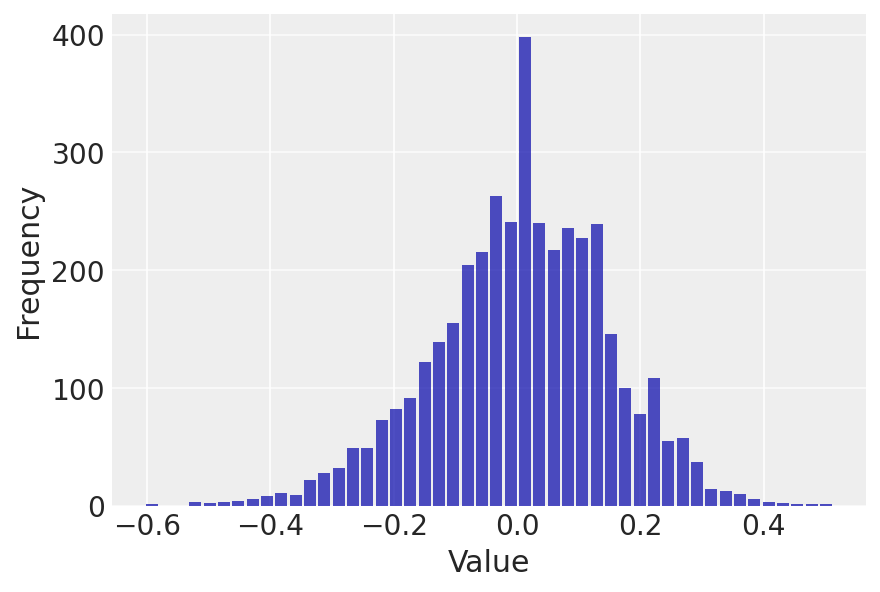

In [1134]:
n, bins, patches = plt.hist(x=post['b'].values[0], bins='auto', color='#0504aa',
 #                           alpha=0.7, rwidth=0.85)
#n, bins, patches = plt.hist(x=nmdata.freq, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')

In [1135]:
ppc['b1'][:,:,1].mean(0)
np.unique(nmdata.freq)


array([ 0.01460014,  0.03013991,  0.01766422, -0.05913986, -0.02217253,
        0.0498014 , -0.00858282, -0.00049045,  0.08231172,  0.01890679,
       -0.02772132,  0.00140862, -0.02148596, -0.07362402,  0.00899208,
       -0.0124175 ,  0.0318908 ,  0.03111763, -0.03763105, -0.00201041,
        0.00455511,  0.15843713, -0.01293192,  0.11779328,  0.03904838,
        0.10622205, -0.04886903,  0.01230353,  0.02079211,  0.04552581,
        0.05224204,  0.07255884,  0.04902818, -0.01719475,  0.02922553,
        0.06192989,  0.05188427,  0.03092496, -0.0789759 ,  0.0219515 ,
       -0.00276706,  0.02676621,  0.00964562,  0.03713642,  0.00538386,
       -0.0425293 , -0.00855992,  0.00886225,  0.02300517,  0.09224926,
       -0.0170141 ,  0.0209093 ,  0.09916145, -0.01652789, -0.1235533 ,
        0.04169073, -0.05910114, -0.02477826, -0.05708225,  0.01643937,
        0.00334247, -0.04491297, -0.02685274,  0.00070761, -0.01292395,
       -0.01530794, -0.02723867, -0.02143812,  0.05836915,  0.07

array([ 24.16666667,  30.83333333,  36.66666667,  40.        ,
        40.83333333,  46.66666667,  50.        ,  53.33333333,
        56.66666667,  60.        ,  63.33333333,  70.        ,
        76.66666667,  83.33333333,  86.66666667,  96.66666667,
       103.33333333])

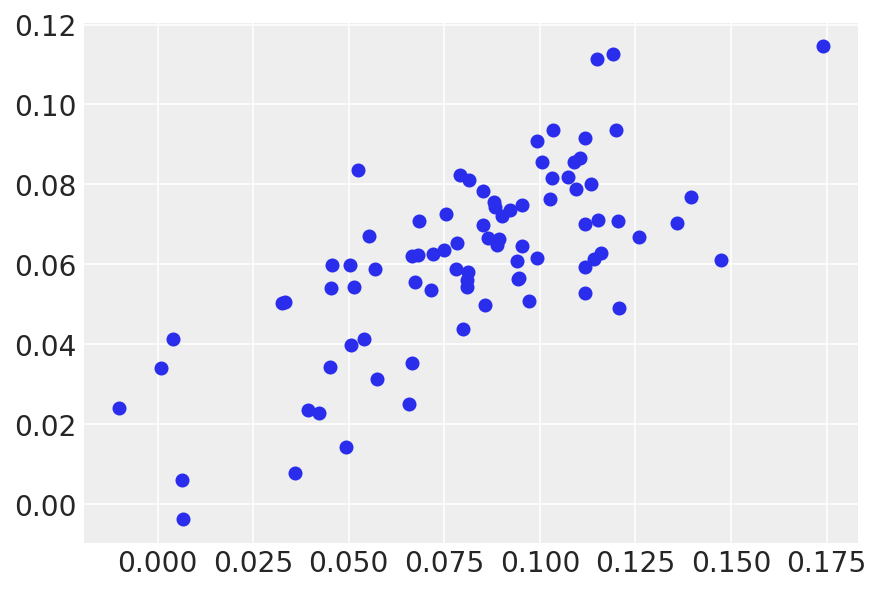

In [1141]:
_, ax=plt.subplots()
#ax.plot(nmdata["dvol"],ppc['b'].mean(0),'o')#nincs osszefugges dvol es ef meg a b kozott ami jo...
ax.plot(ppc['b1'][:,:,0].mean(0),ppc['b1'][:,:,2].mean(0),'o')#nincs osszefugges dvol es ef meg a b kozott ami jo...
#ax.plot(ppc['b1'][:,:,0].mean(0),ppc['b1'][:,:,2].mean(0),'o')#nincs osszefugges dvol es ef meg a b kozott ami jo...


In [664]:
!pip install nilearn


     |████████████████████████████████| 9.6 MB 455 kB/s eta 0:00:01
     |████████████████████████████████| 63 kB 227 kB/s  eta 0:00:01
     |████████████████████████████████| 3.3 MB 47.9 MB/s eta 0:00:01
     |████████████████████████████████| 6.9 MB 74.6 MB/s eta 0:00:01
     |████████████████████████████████| 61 kB 2.4 MB/s  eta 0:00:01
     |████████████████████████████████| 138 kB 57.1 MB/s eta 0:00:01


In [745]:
from nilearn import image
template_data = image.get_data('./Abbott/template.nii.gz')
template_data.shape

(256, 256, 256)

In [746]:
np.unique(template_data)
ixs=np.where(template_data==2)
template_data[ixs]

array([   0,    2,    4,    5,    7,    8,   10,   11,   12,   13,   14,
         15,   16,   17,   18,   24,   26,   28,   30,   31,   41,   43,
         44,   46,   47,   49,   50,   51,   52,   53,   54,   58,   60,
         62,   63,   77,   80,   85,  251,  252,  253,  254,  255, 1000,
       1001, 1002, 1003, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012,
       1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023,
       1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034,
       1035, 2000, 2001, 2002, 2003, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,
       2022, 2023, 2024, 2025, 2026, 2027, 2028, 2029, 2030, 2031, 2032,
       2033, 2034, 2035], dtype=int32)

array([2, 2, 2, ..., 2, 2, 2], dtype=int32)

In [1109]:
#regt = code.struct_name.iloc[np.where(code['struct_index']==2028)]
#regt.values[0]
code

,Ursi,sbj
0,M87105256,0
1,M87105615,1
2,M87106245,2
3,M87107641,3
4,M87112316,4
...,...,...
46,M87196140,46
47,M87196446,47
48,M87196690,48
49,M87198089,49


In [786]:
coder.rx.iloc[np.where(coder.Region_Label==regt.values[0])].values[0]
post['a1'].values.mean(1)/post['a1'].values.std(1)

59

array([ 1.05684085,  1.48032431,  0.75646884,  1.7203438 ,  1.01879922,
        0.7747381 ,  0.03792749,  0.55004406,  0.61165932,  1.03897956,
        1.20685623,  2.08098166,  2.06204231,  2.14091644, -0.69427775,
        2.28357797,  1.94143626,  0.22386639,  2.06760952,  0.23893597,
        2.08215808, -0.35829181,  1.52222049,  1.696308  ,  0.79510127,
        1.62303269,  1.19203604,  1.10067932,  2.0751179 ,  1.68143264,
        1.94351294,  1.65612796,  2.11277637,  0.12435052,  2.03517187,
        0.63779944,  1.8717538 ,  1.88352519,  1.35382177,  0.79314548,
        0.91247664,  1.26781857,  1.44479082,  1.10031342,  1.55541166,
        1.00048654,  1.09298434,  2.57597908,  0.68915459,  0.5044095 ,
        2.90980068,  1.78016908,  2.02904077,  1.84691707,  4.74444445,
        1.51315305,  2.11331592,  2.32250617,  2.18854872,  4.18452948,
        0.77153917,  1.65270695,  1.59811585,  1.40315033,  1.78350503,
        1.54898591,  1.16586673,  1.57587228,  1.98347161,  1.31

In [1145]:
b_data=template_data.copy();
for i in np.unique(template_data):
    print(i)
    if (i!=0):
        ixs=np.where(template_data==i)
        regt = code.struct_name.iloc[np.where(code['struct_index']==i)]
        ixs2 = np.where(coder.Region_Label==regt.values[0])
        if (ixs2[0].size!=0):
            k=coder.rx.iloc[ixs2].values[0]
            #b_data[ixs]=((post['b1'][k].mean().values)*1000).round().astype('int') + ((post['a1'][k].mean().values)*1000).round().astype('int')#here we multiply so that no need to deal integer/float issue
            #b_data[ixs]=((post['a1'][k].mean().values)*1000).round().astype('int')/((post['a1'][k].std().values)*1000).round().astype('int')#here we multiply so that no need to deal integer/float issue
            b_data[ixs]=((post['a1'][k].mean().values)*1000).round().astype('int')#here we multiply so that no need to deal integer/float issue
            #b_data[ixs]=((ppc['b1'][:,:,2].mean(0)[k])*1000).round().astype('int')
            
        else:
            b_data[ixs]=0 #we overwrite the template data

0
2
4
5
7
8
10
11
12
13
14
15
16
17
18
24
26
28
30
31
41
43
44
46
47
49
50
51
52
53
54
58
60
62
63
77
80
85
251
252
253
254
255
1000
1001
1002
1003
1005
1006
1007
1008
1009
1010
1011
1012
1013
1014
1015
1016
1017
1018
1019
1020
1021
1022
1023
1024
1025
1026
1027
1028
1029
1030
1031
1032
1033
1034
1035
2000
2001
2002
2003
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035


In [1146]:
from nilearn import plotting
new_image = image.new_img_like('./Abbott/template.nii.gz', b_data)
#new_image.to_filename('./Abbott/test_im1.nii.gz')
#plotting.plot_stat_map(new_image)

/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:76: UserWarning: you have specified symmetric_cmap=False but the map contains negative values; setting symmetric_cmap to True
  warnings.warn('you have specified symmetric_cmap=False '
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:81: UserWarning: vmin cannot be chosen when cmap is symmetric
  warnings.warn('vmin cannot be chosen when cmap is symmetric')
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/nilearn/image/resampling.py:531: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:57: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn


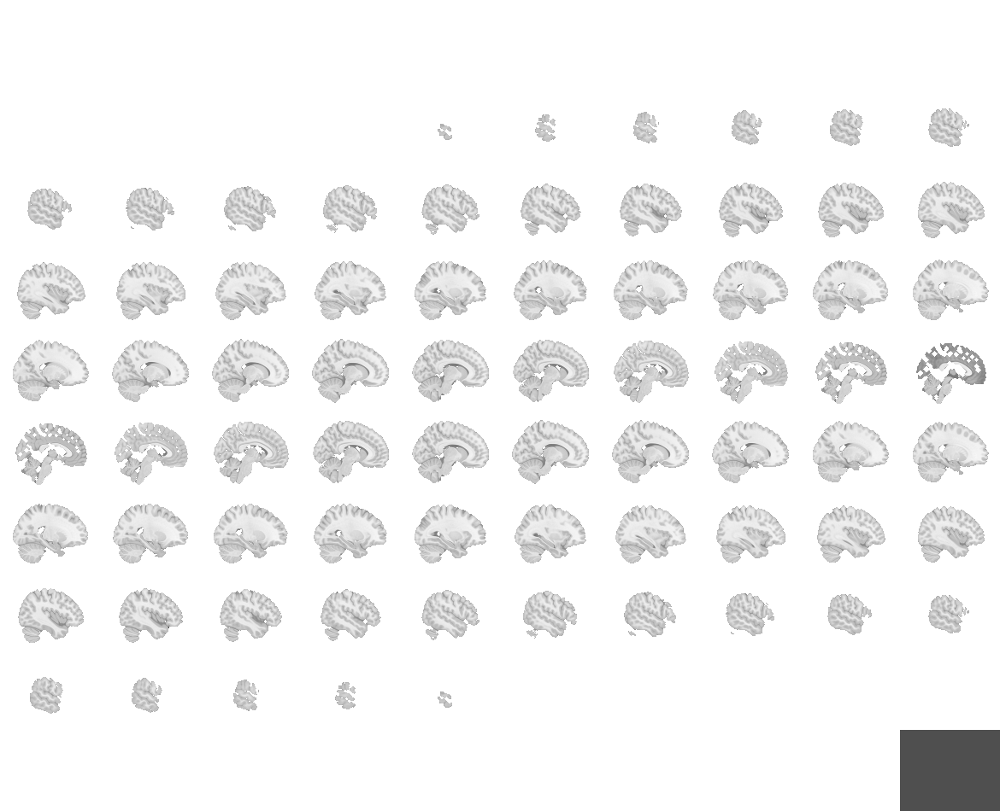
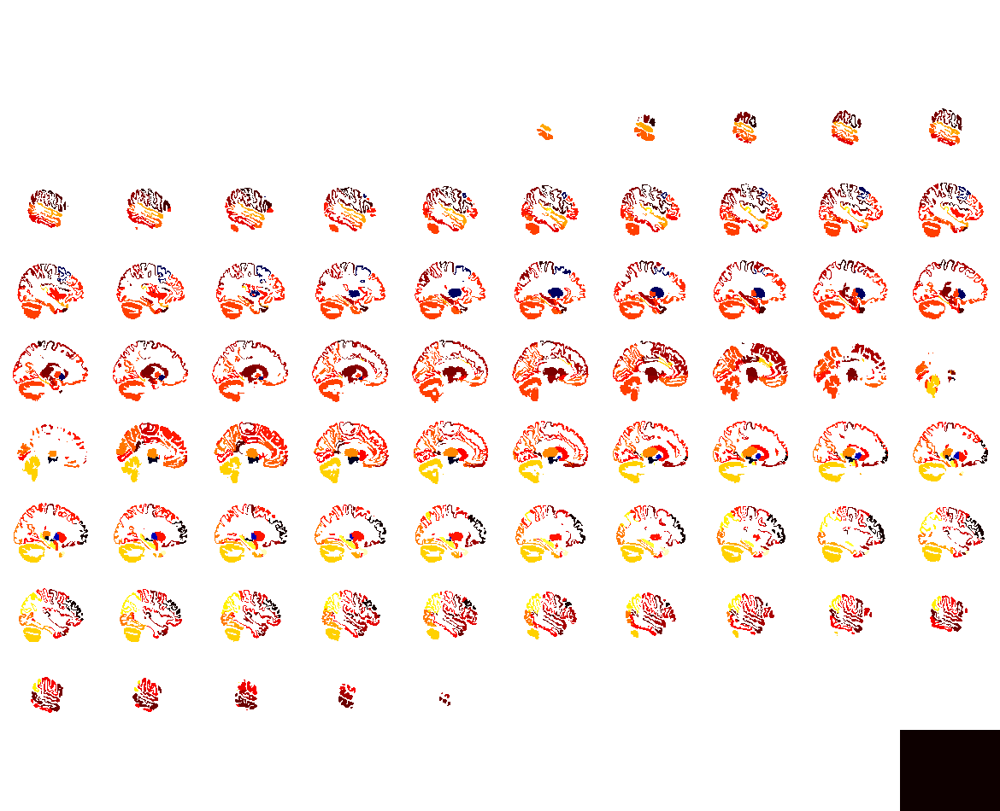

In [1147]:
view = plotting.view_img(new_image, symmetric_cmap=False, vmin=0.0, threshold =0.0, black_bg=False)
view

In [741]:
((post['b1'][k].mean().values)*1000).round().astype('int')

33

0


Text(0.5, 1.0, 'Region: Left-Amygdala')

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

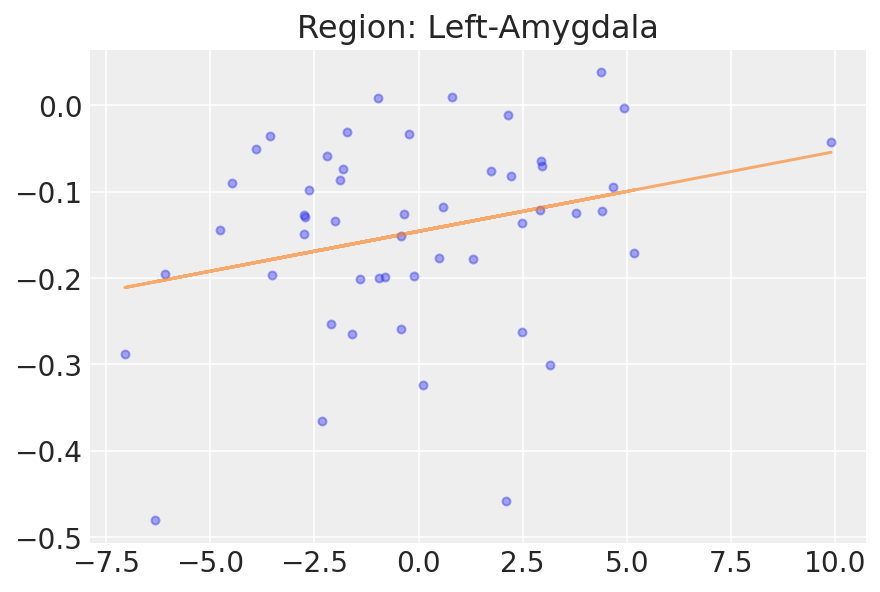

1


Text(0.5, 1.0, 'Region: Left-Caudate')

<Figure size 432x288 with 0 Axes>

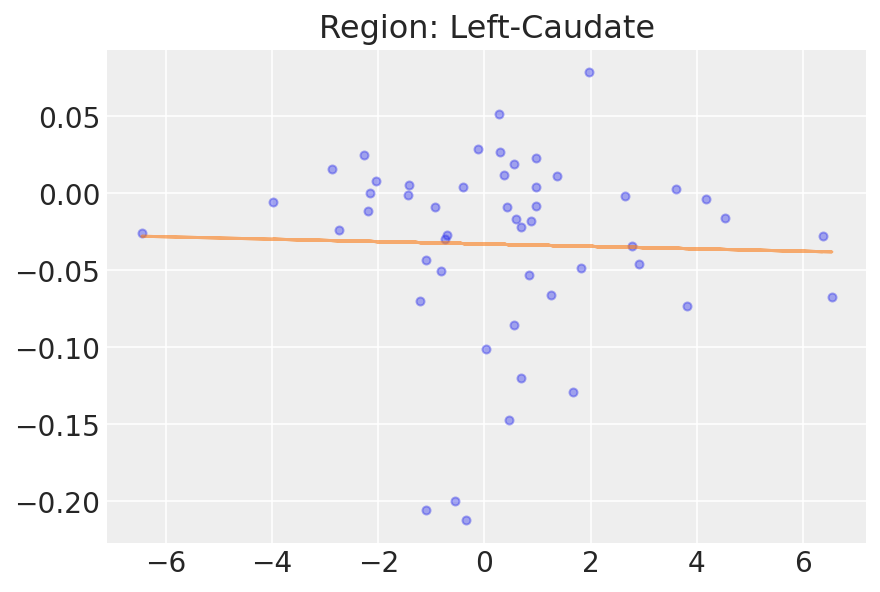

2


Text(0.5, 1.0, 'Region: Left-Cerebellum-Cortex')

<Figure size 432x288 with 0 Axes>

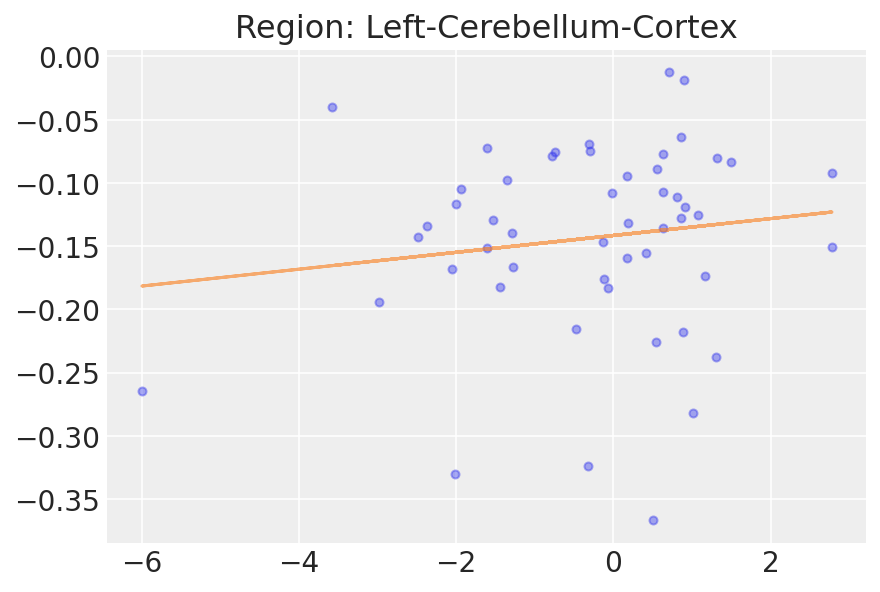

3


Text(0.5, 1.0, 'Region: Left-Hippocampus')

<Figure size 432x288 with 0 Axes>

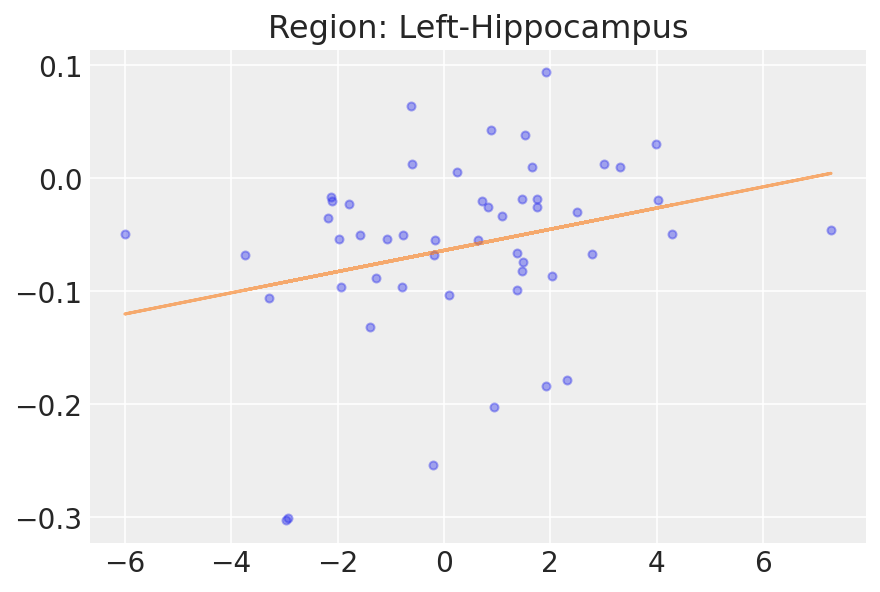

4


Text(0.5, 1.0, 'Region: Left-Pallidum')

<Figure size 432x288 with 0 Axes>

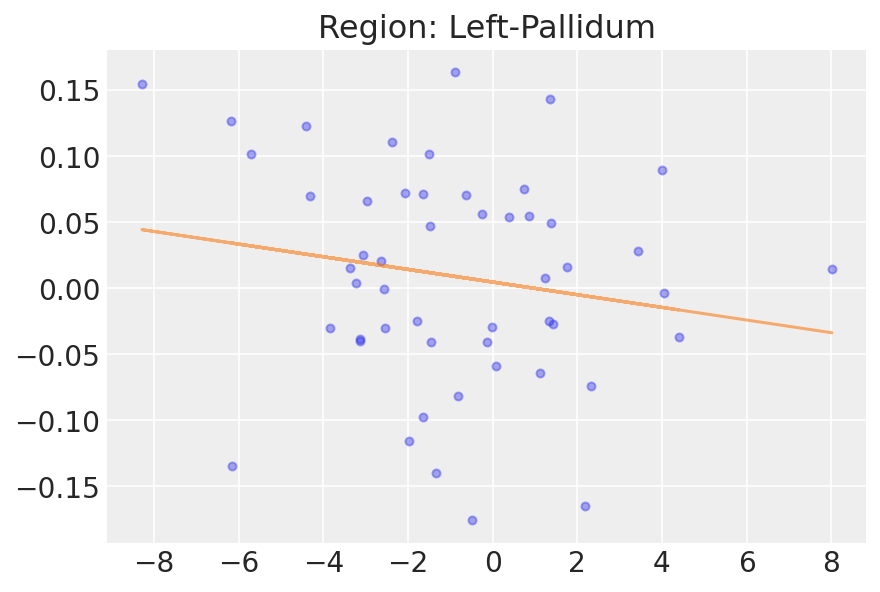

5


Text(0.5, 1.0, 'Region: Left-Putamen')

<Figure size 432x288 with 0 Axes>

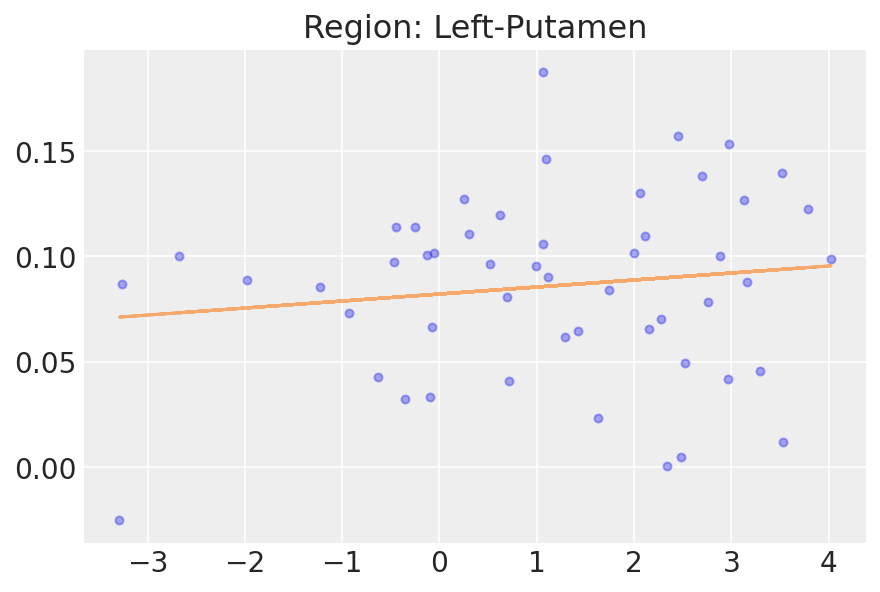

6


Text(0.5, 1.0, 'Region: Left-Thalamus-Proper')

<Figure size 432x288 with 0 Axes>

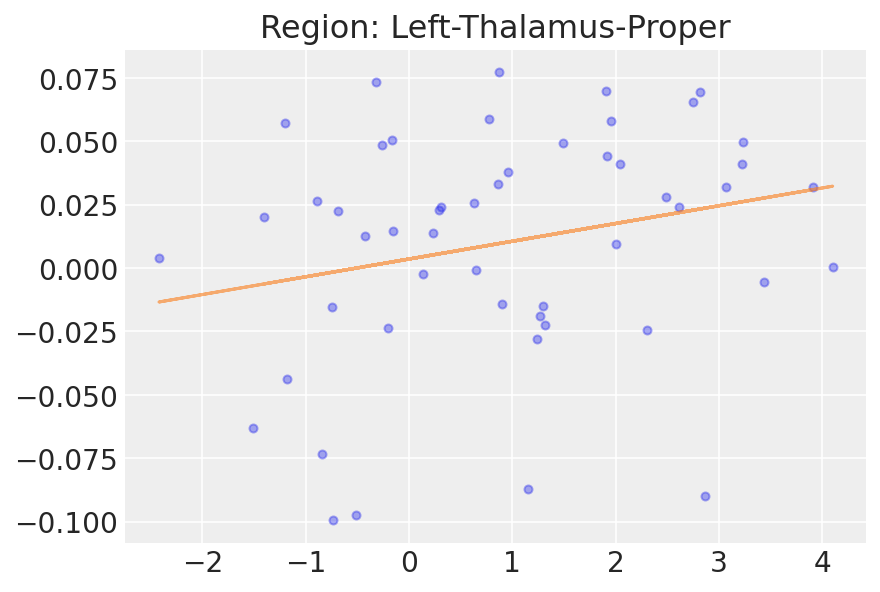

7


Text(0.5, 1.0, 'Region: Left-VentralDC')

<Figure size 432x288 with 0 Axes>

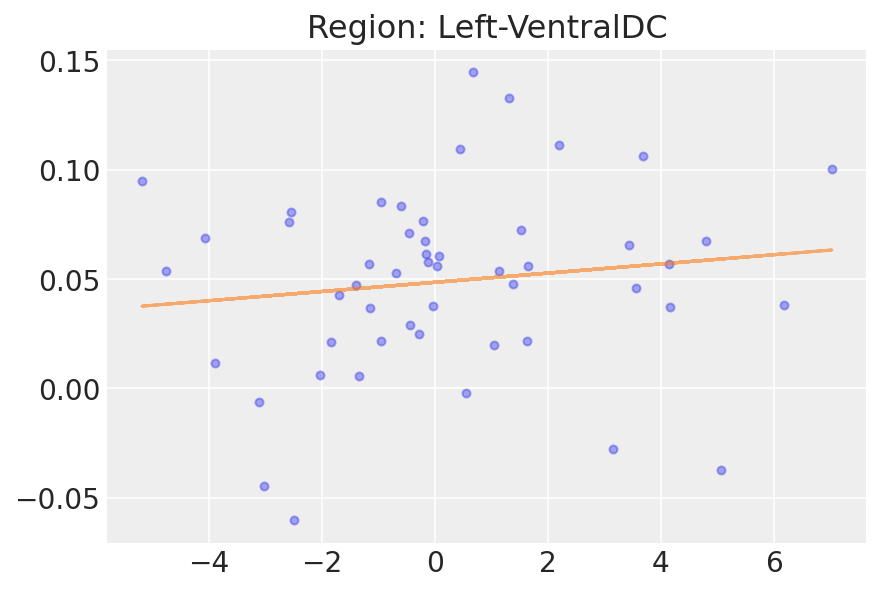

8
9


Text(0.5, 1.0, 'Region: Right-Amygdala')

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

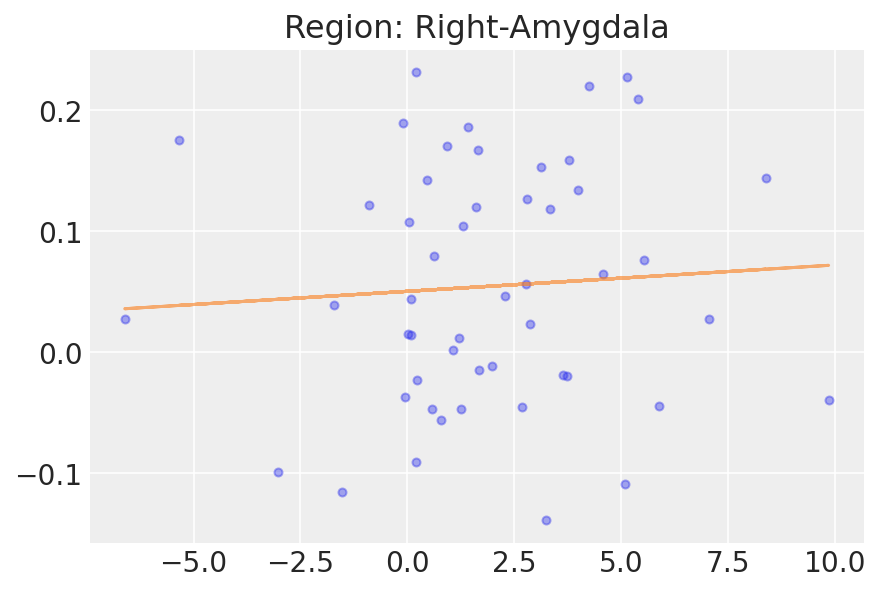

10


Text(0.5, 1.0, 'Region: Right-Caudate')

<Figure size 432x288 with 0 Axes>

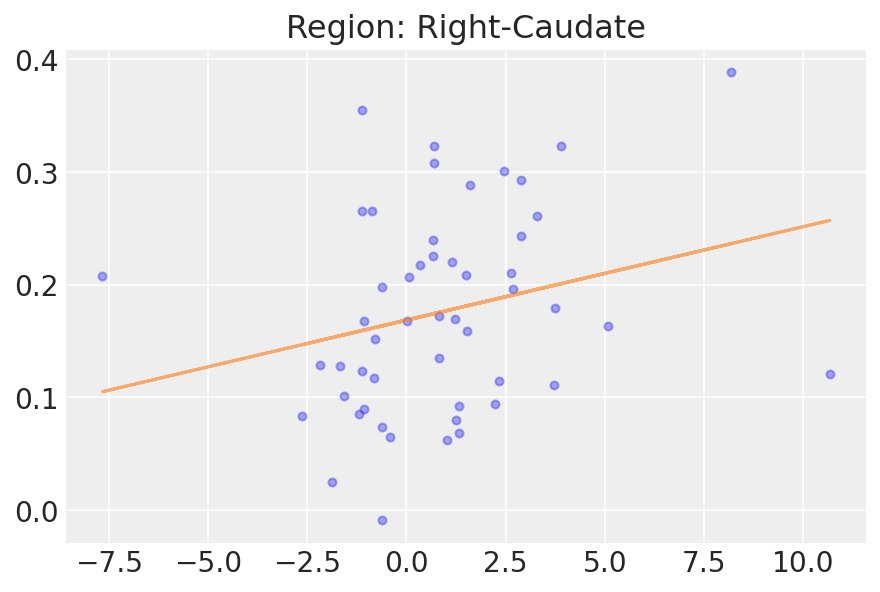

11


Text(0.5, 1.0, 'Region: Right-Cerebellum-Cortex')

<Figure size 432x288 with 0 Axes>

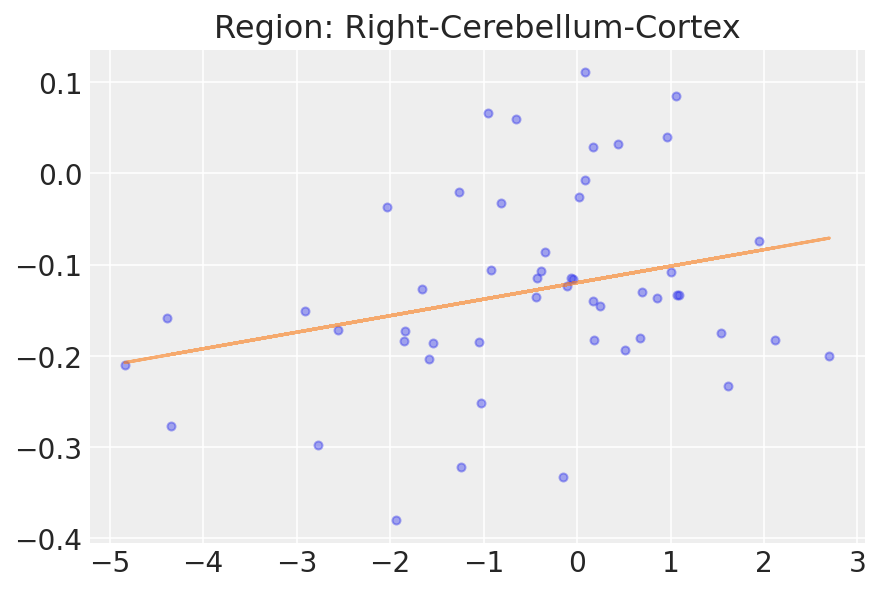

12


Text(0.5, 1.0, 'Region: Right-Hippocampus')

<Figure size 432x288 with 0 Axes>

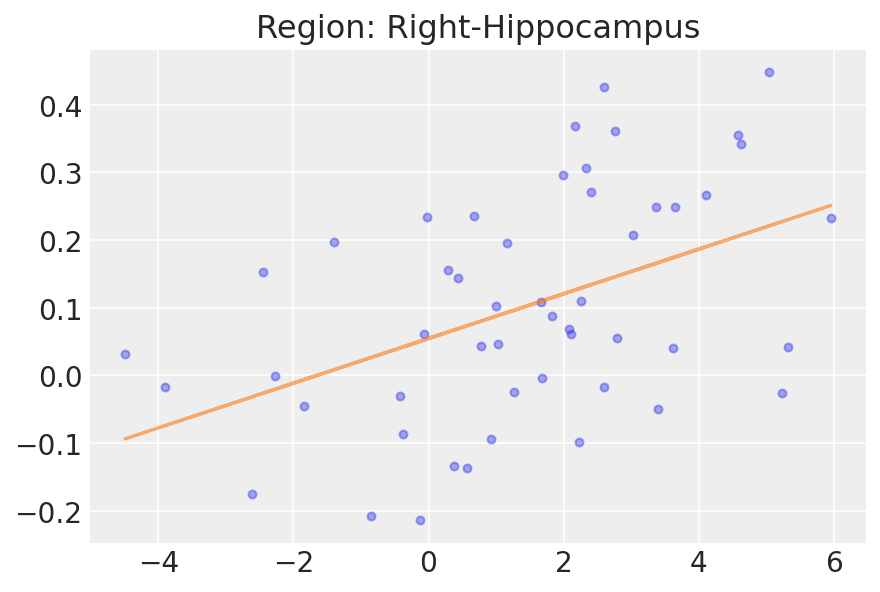

13


Text(0.5, 1.0, 'Region: Right-Pallidum')

<Figure size 432x288 with 0 Axes>

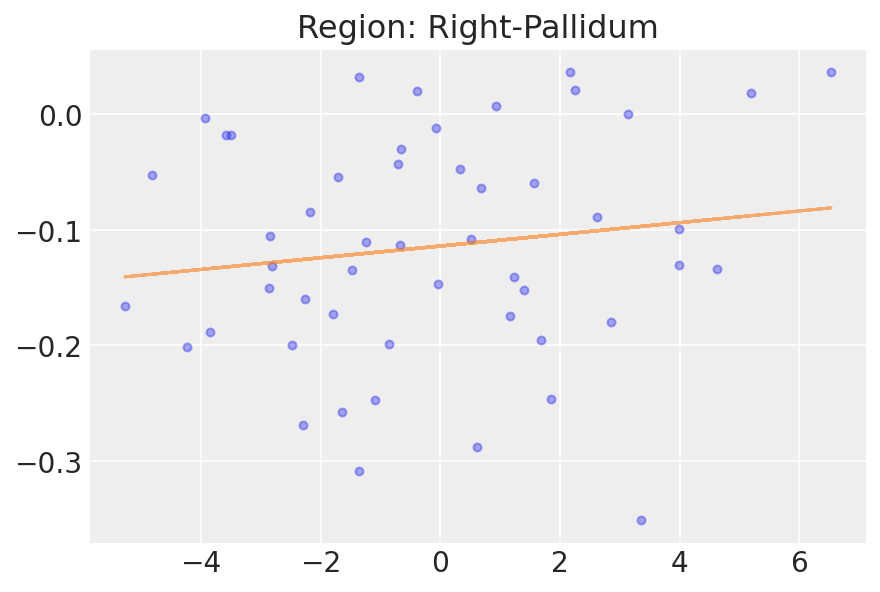

14


Text(0.5, 1.0, 'Region: Right-Putamen')

<Figure size 432x288 with 0 Axes>

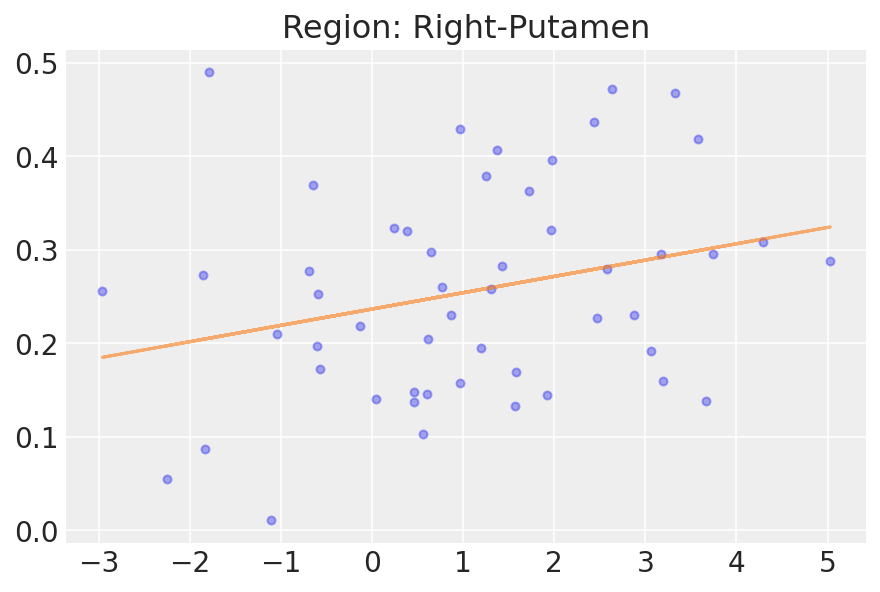

15


Text(0.5, 1.0, 'Region: Right-Thalamus-Proper')

<Figure size 432x288 with 0 Axes>

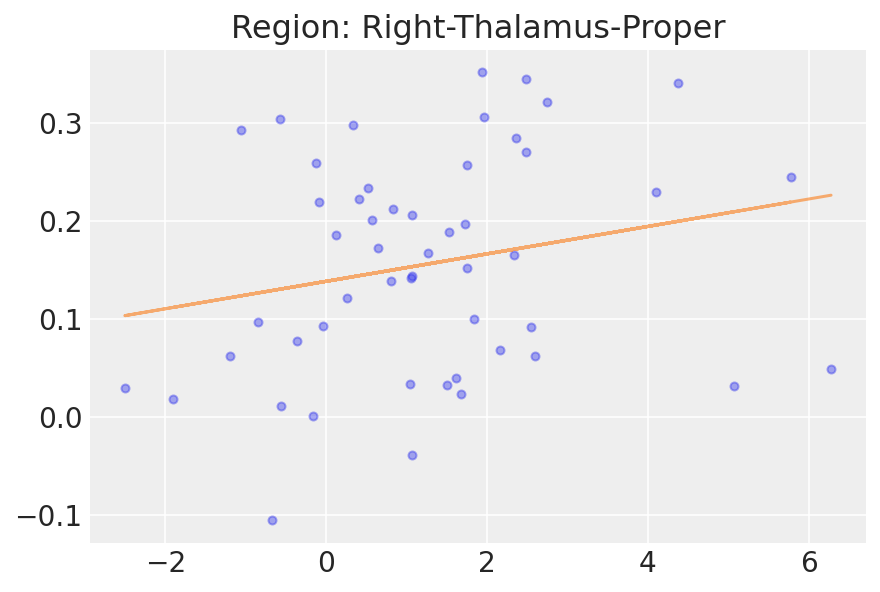

16


Text(0.5, 1.0, 'Region: Right-VentralDC')

<Figure size 432x288 with 0 Axes>

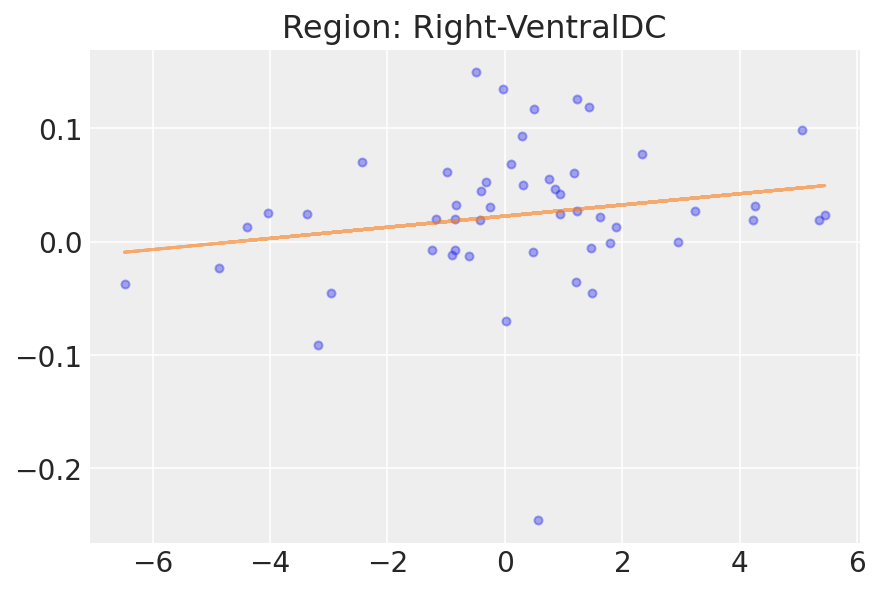

17


Text(0.5, 1.0, 'Region: ctx-lh-caudalanteriorcingulate')

<Figure size 432x288 with 0 Axes>

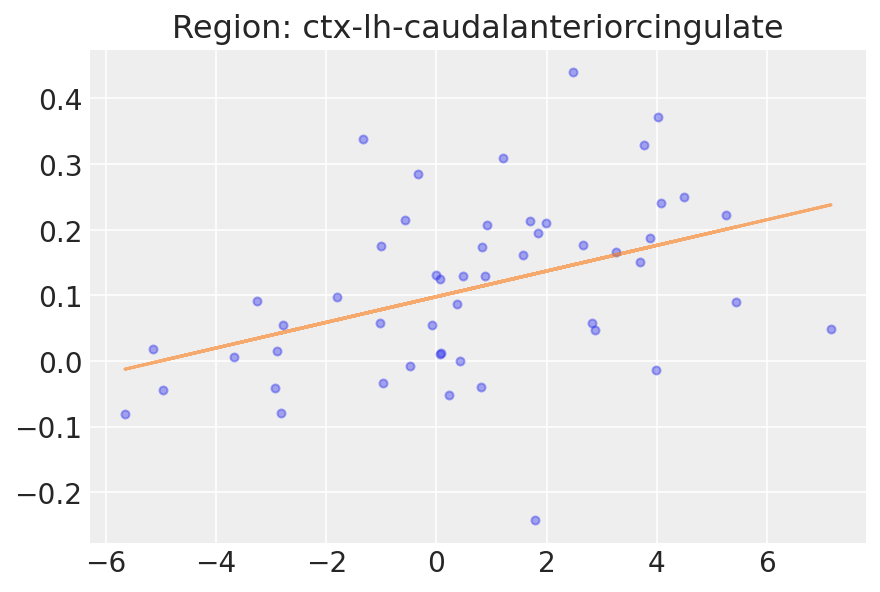

18


Text(0.5, 1.0, 'Region: ctx-lh-caudalmiddlefrontal')

<Figure size 432x288 with 0 Axes>

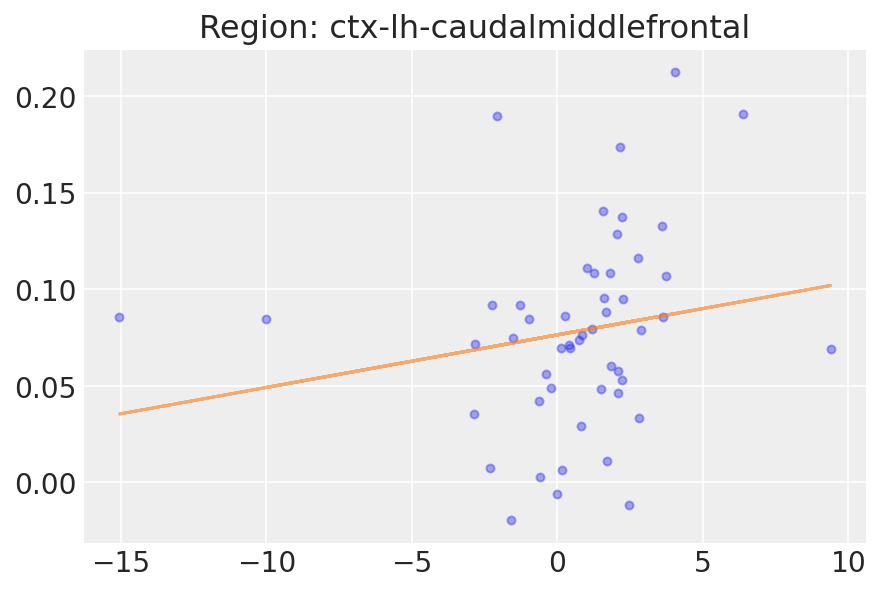

19


Text(0.5, 1.0, 'Region: ctx-lh-cuneus')

<Figure size 432x288 with 0 Axes>

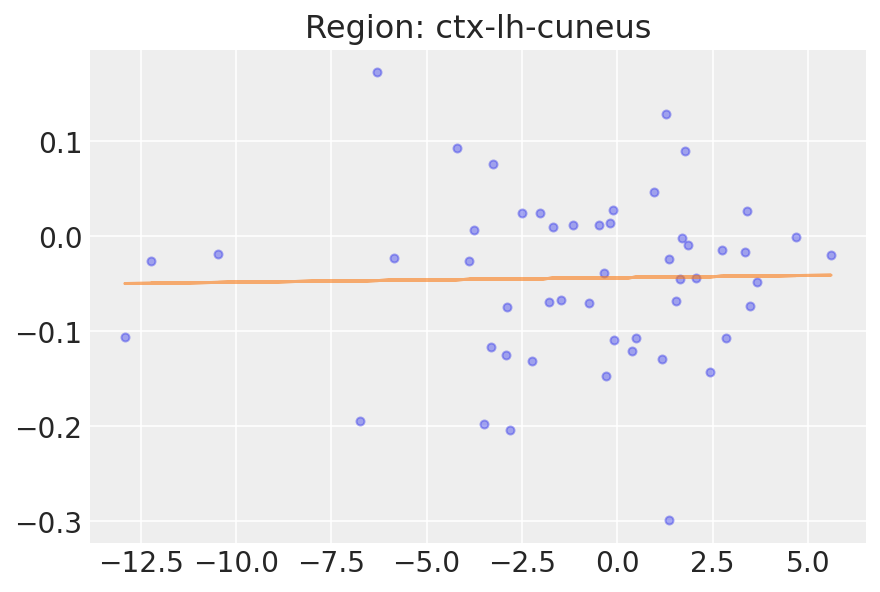

20


Text(0.5, 1.0, 'Region: ctx-lh-entorhinal')

<Figure size 432x288 with 0 Axes>

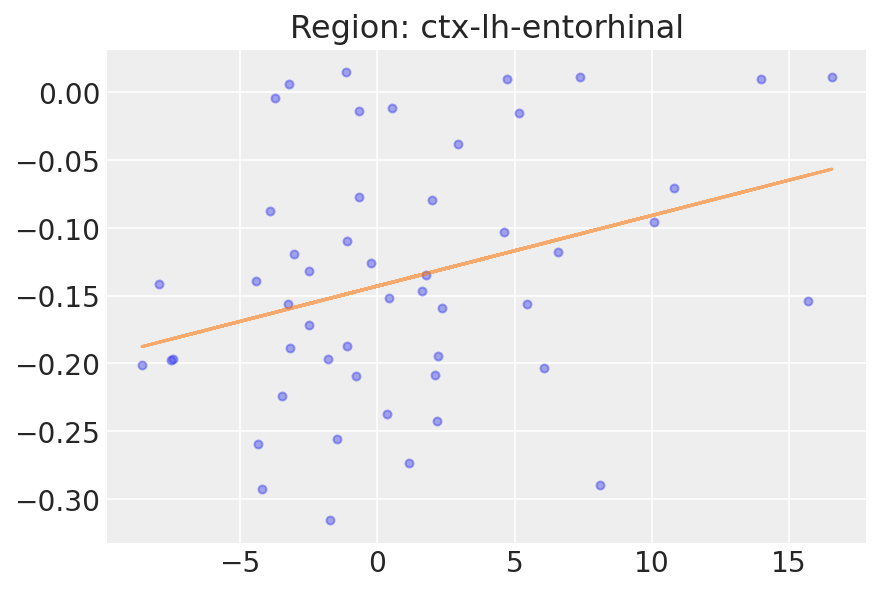

21


Text(0.5, 1.0, 'Region: ctx-lh-frontalpole')

<Figure size 432x288 with 0 Axes>

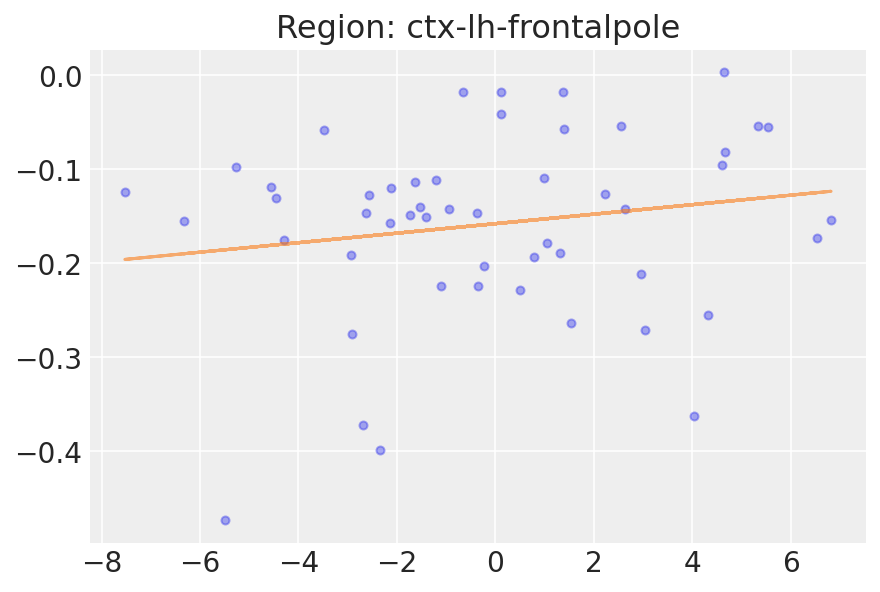

22


Text(0.5, 1.0, 'Region: ctx-lh-fusiform')

<Figure size 432x288 with 0 Axes>

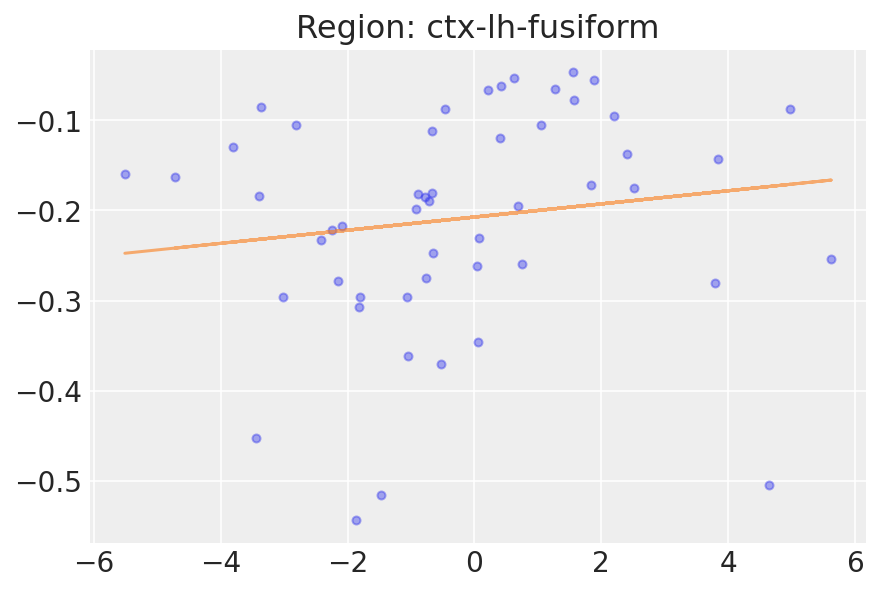

23


Text(0.5, 1.0, 'Region: ctx-lh-inferiorparietal')

<Figure size 432x288 with 0 Axes>

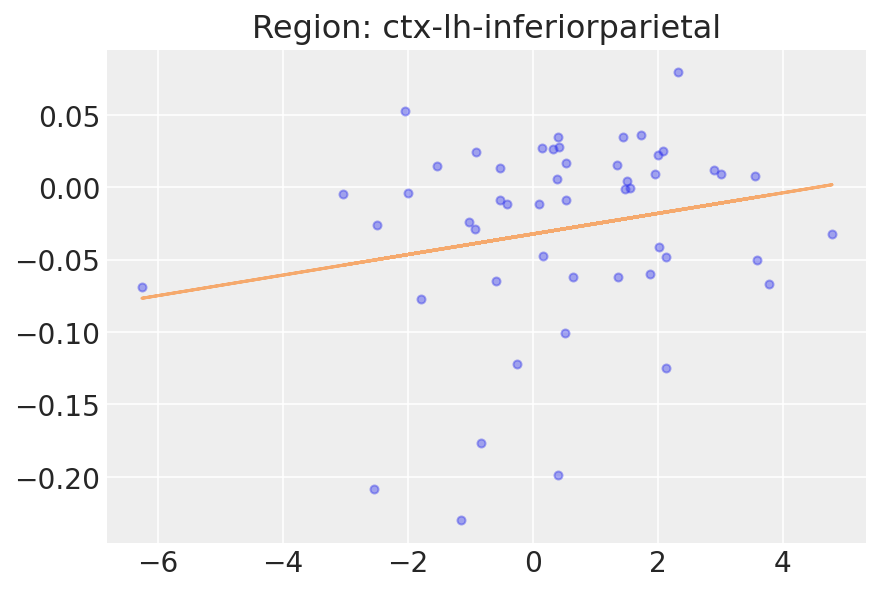

24


Text(0.5, 1.0, 'Region: ctx-lh-inferiortemporal')

<Figure size 432x288 with 0 Axes>

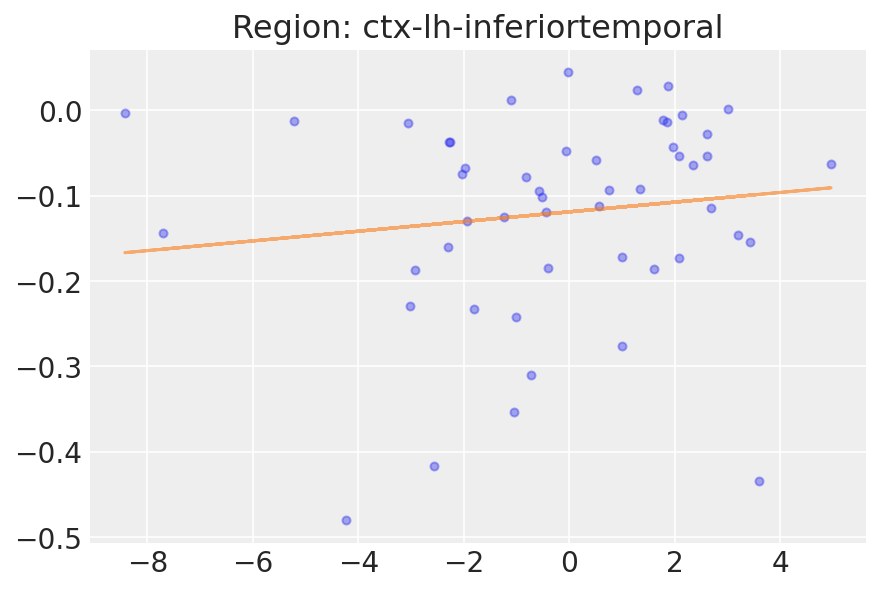

25


Text(0.5, 1.0, 'Region: ctx-lh-insula')

<Figure size 432x288 with 0 Axes>

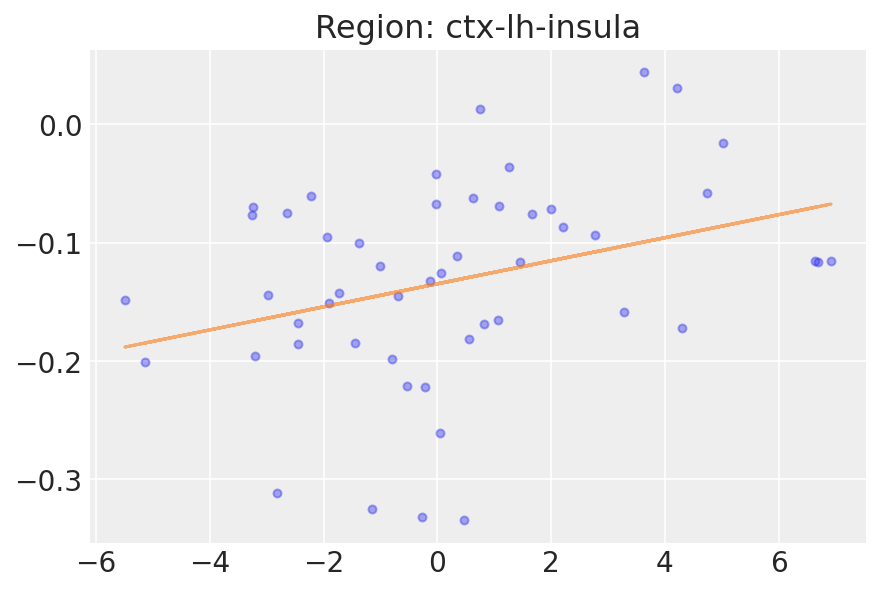

26


Text(0.5, 1.0, 'Region: ctx-lh-isthmuscingulate')

<Figure size 432x288 with 0 Axes>

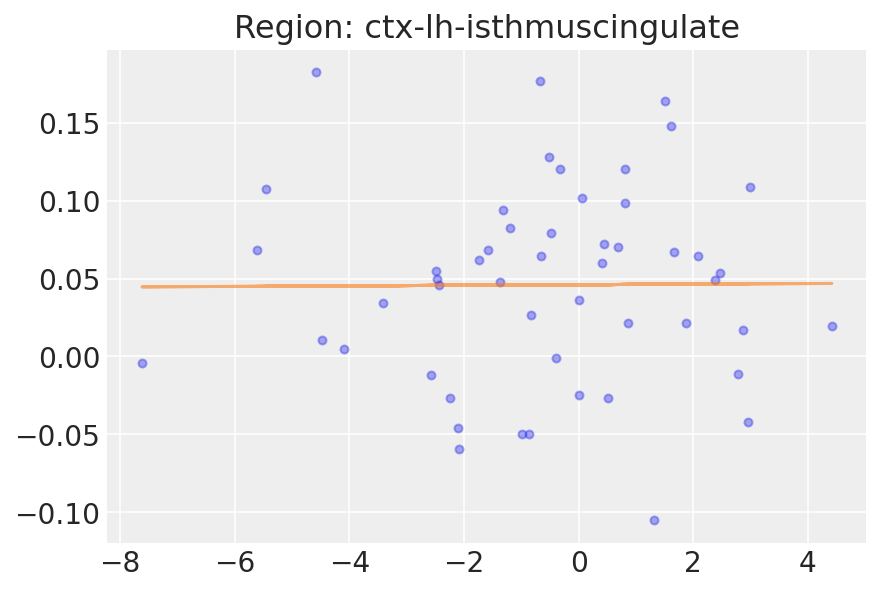

27


Text(0.5, 1.0, 'Region: ctx-lh-lateraloccipital')

<Figure size 432x288 with 0 Axes>

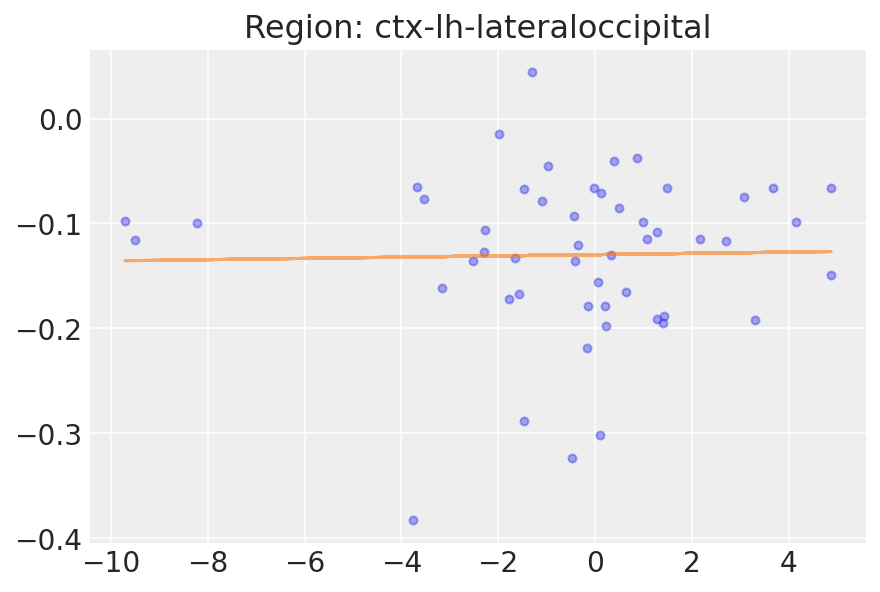

28


Text(0.5, 1.0, 'Region: ctx-lh-lateralorbitofrontal')

<Figure size 432x288 with 0 Axes>

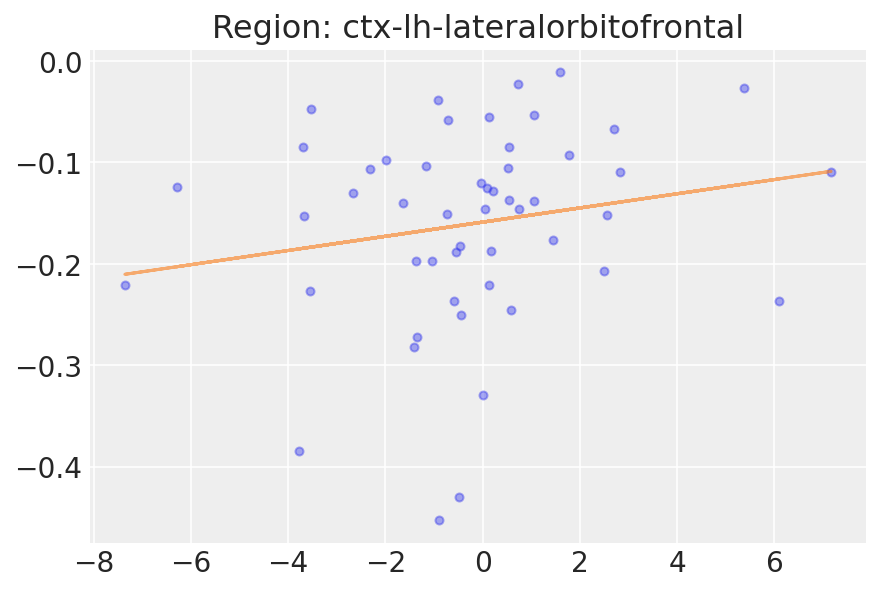

29


Text(0.5, 1.0, 'Region: ctx-lh-lingual')

<Figure size 432x288 with 0 Axes>

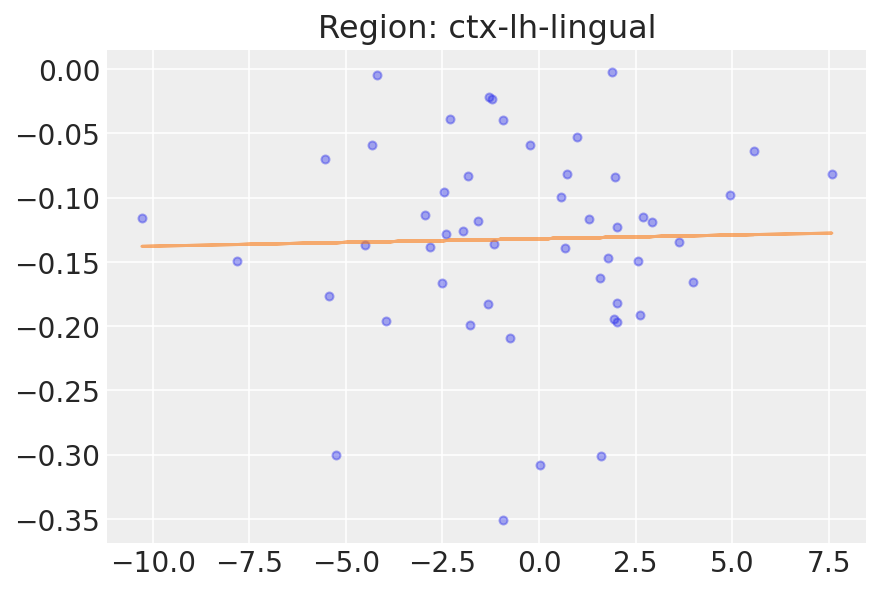

30


Text(0.5, 1.0, 'Region: ctx-lh-medialorbitofrontal')

<Figure size 432x288 with 0 Axes>

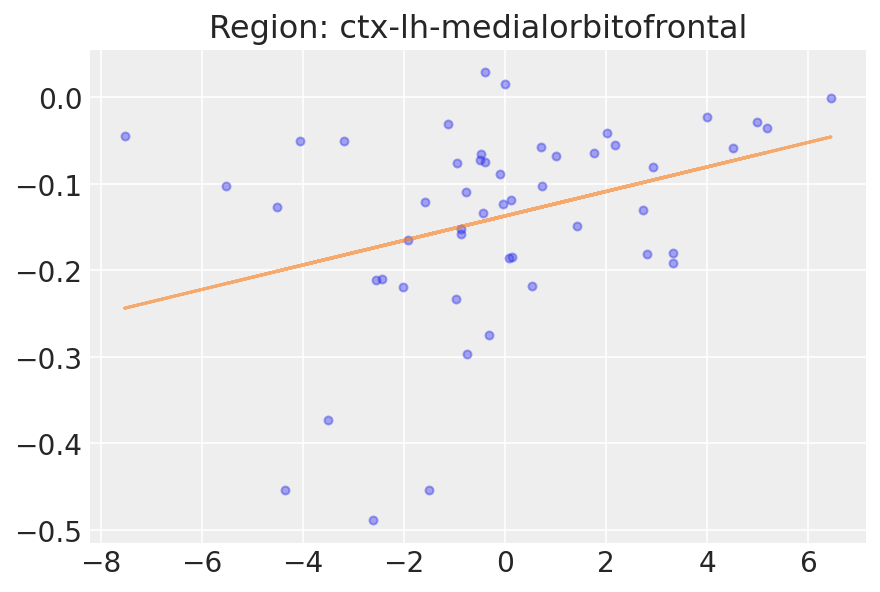

31


Text(0.5, 1.0, 'Region: ctx-lh-middletemporal')

<Figure size 432x288 with 0 Axes>

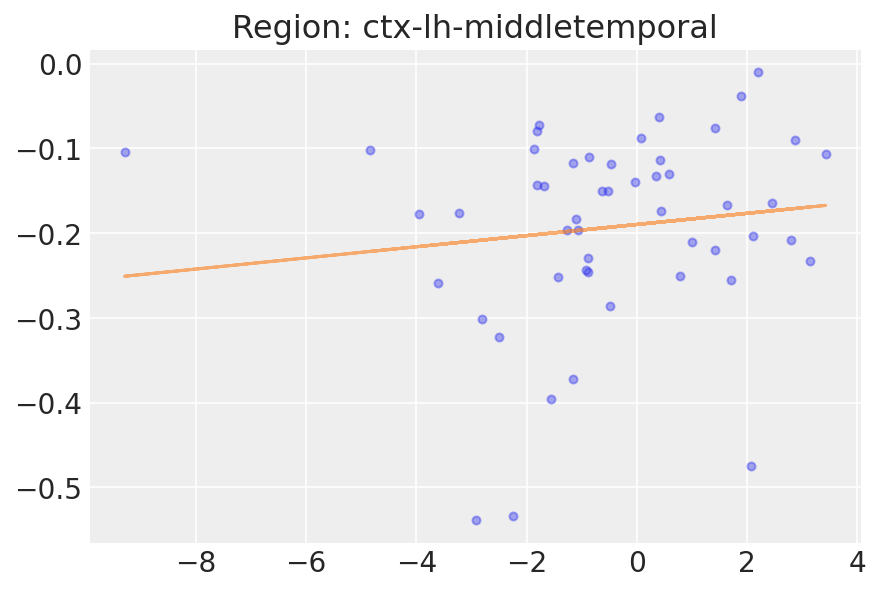

32


Text(0.5, 1.0, 'Region: ctx-lh-paracentral')

<Figure size 432x288 with 0 Axes>

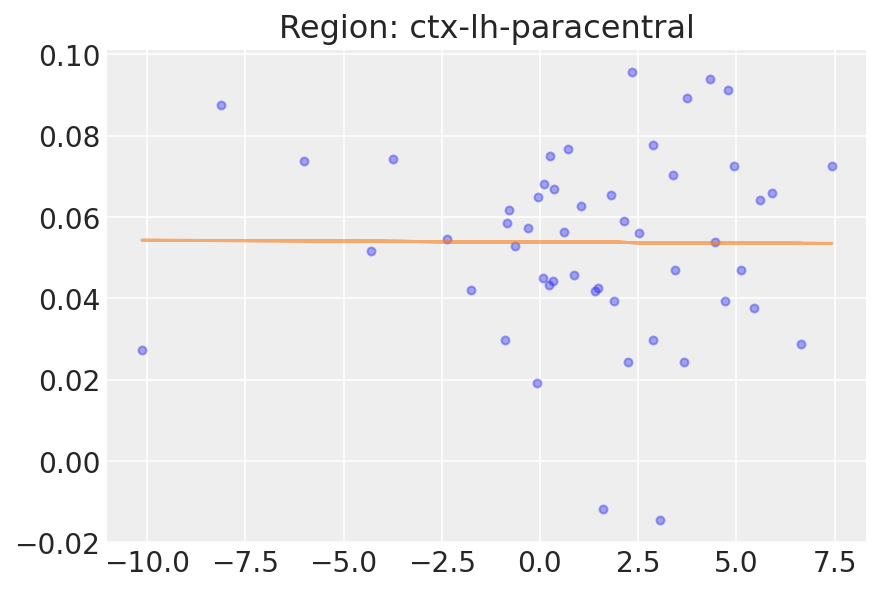

33


Text(0.5, 1.0, 'Region: ctx-lh-parahippocampal')

<Figure size 432x288 with 0 Axes>

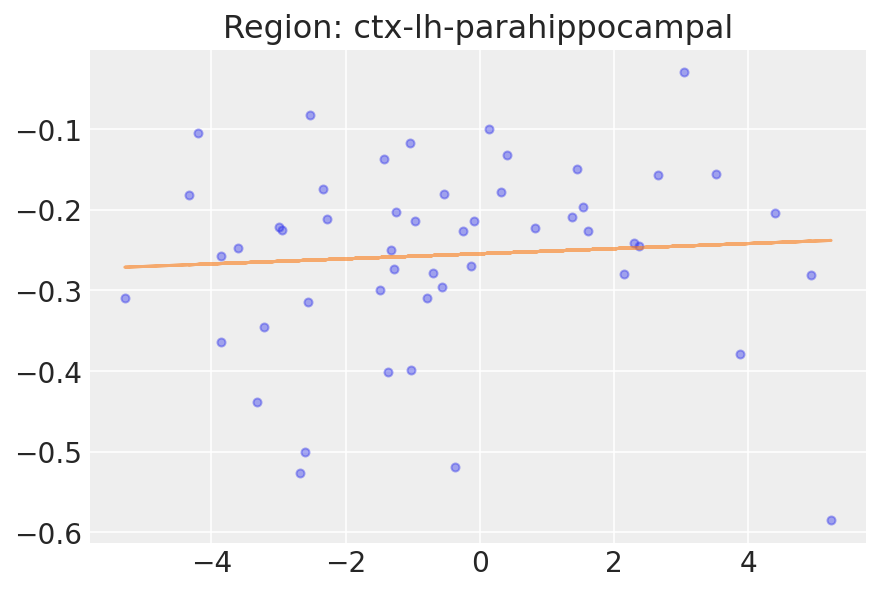

34


Text(0.5, 1.0, 'Region: ctx-lh-parsopercularis')

<Figure size 432x288 with 0 Axes>

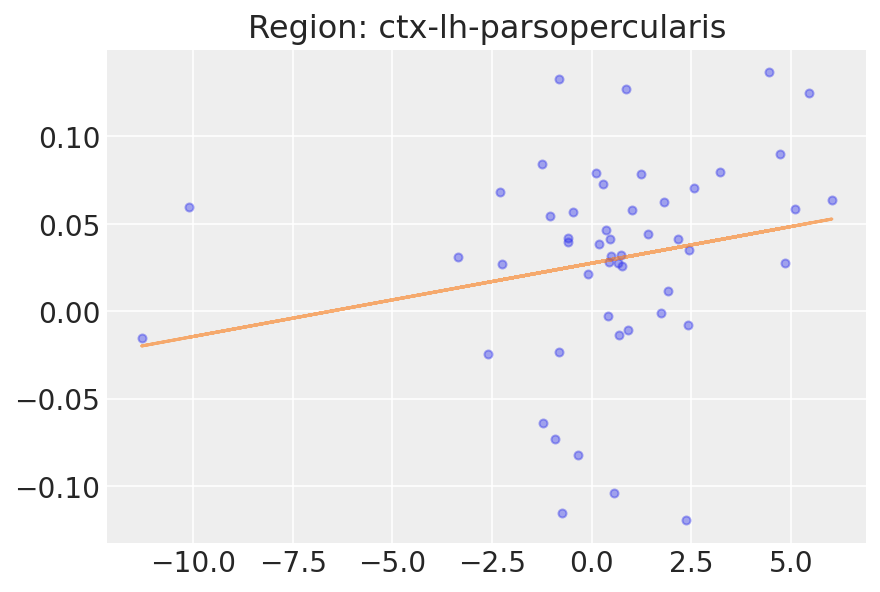

35


Text(0.5, 1.0, 'Region: ctx-lh-parsorbitalis')

<Figure size 432x288 with 0 Axes>

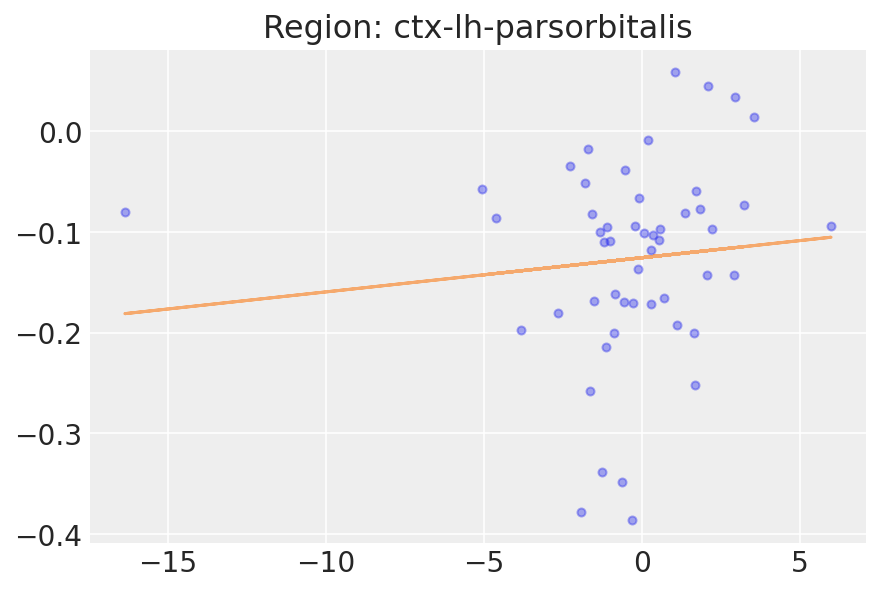

36


Text(0.5, 1.0, 'Region: ctx-lh-parstriangularis')

<Figure size 432x288 with 0 Axes>

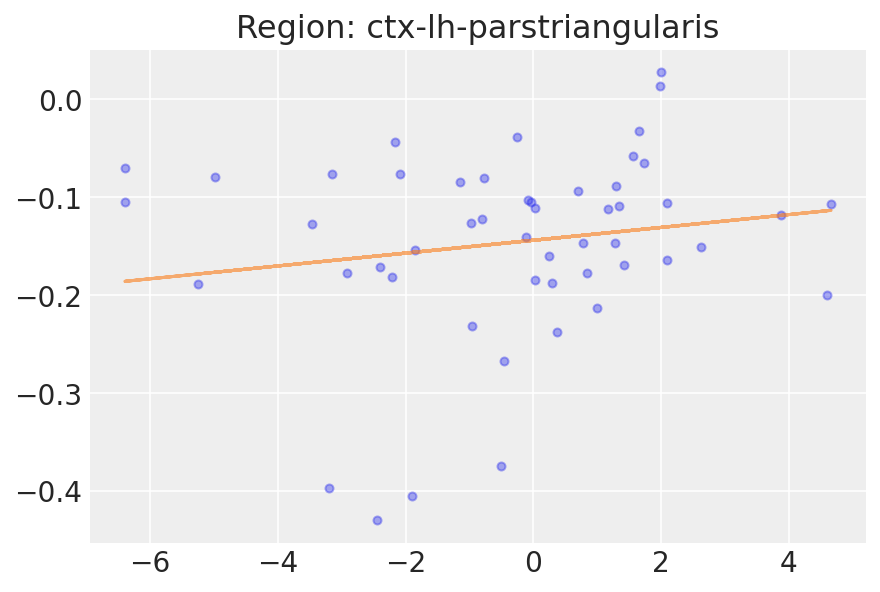

37


Text(0.5, 1.0, 'Region: ctx-lh-pericalcarine')

<Figure size 432x288 with 0 Axes>

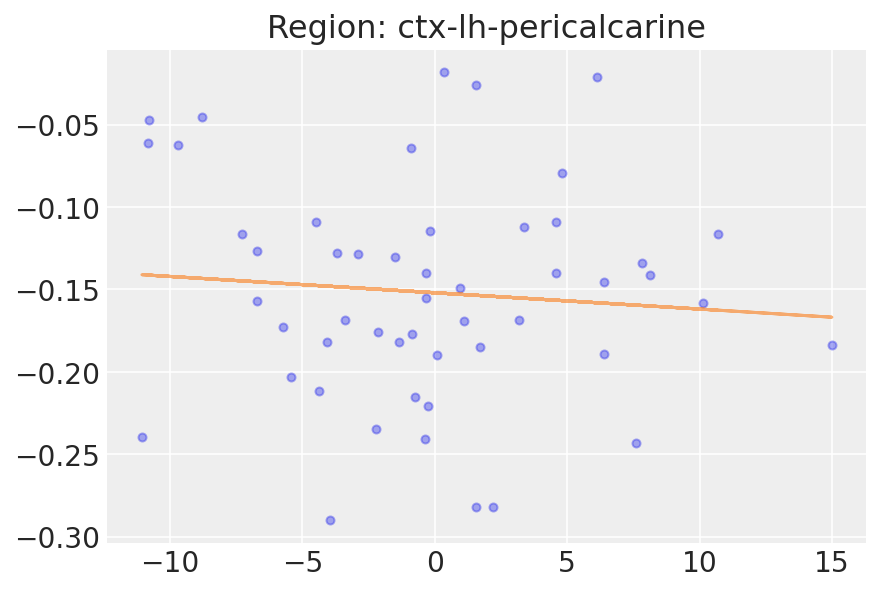

38


Text(0.5, 1.0, 'Region: ctx-lh-postcentral')

<Figure size 432x288 with 0 Axes>

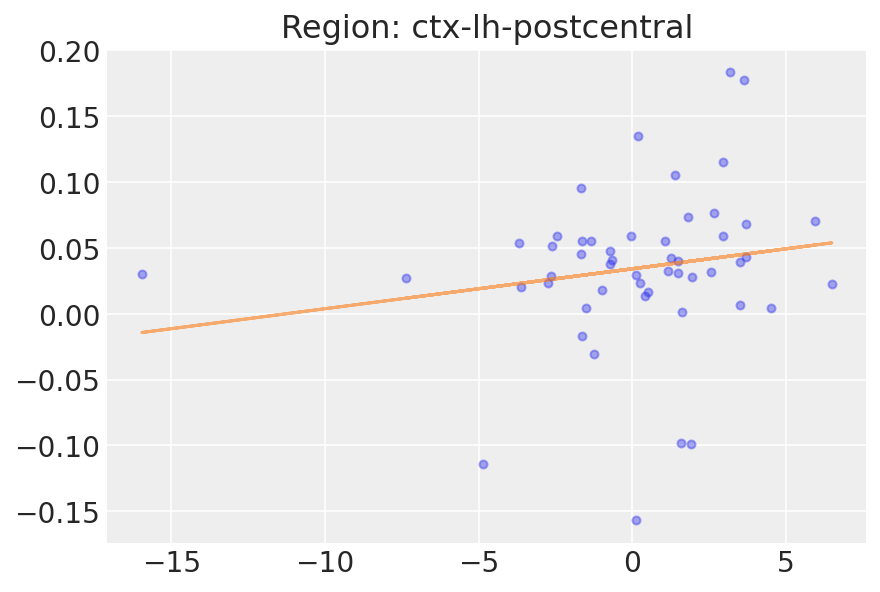

39


Text(0.5, 1.0, 'Region: ctx-lh-posteriorcingulate')

<Figure size 432x288 with 0 Axes>

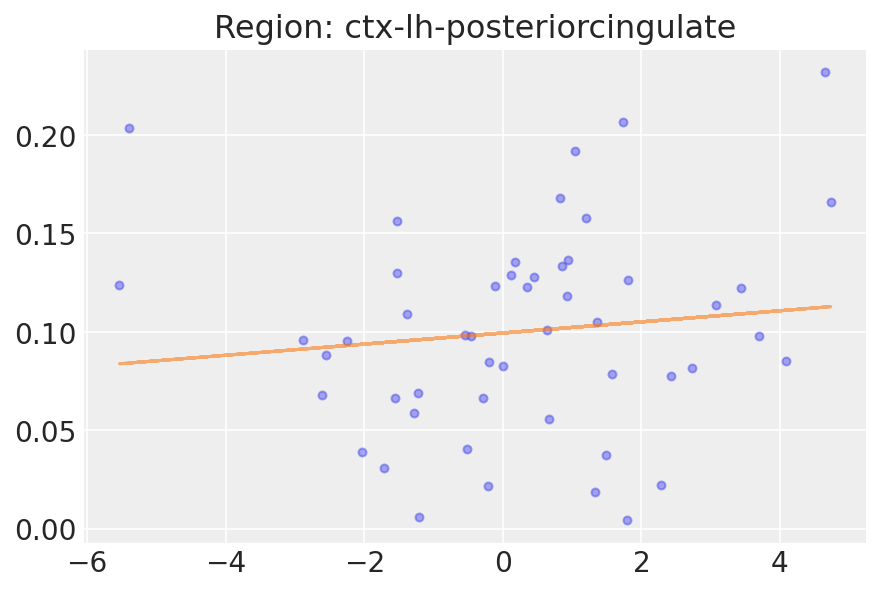

40


Text(0.5, 1.0, 'Region: ctx-lh-precentral')

<Figure size 432x288 with 0 Axes>

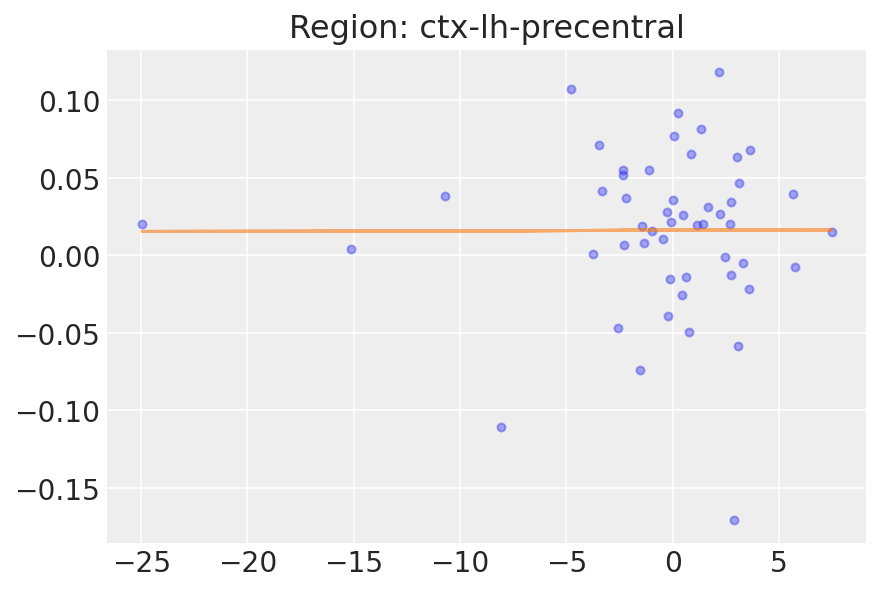

41


Text(0.5, 1.0, 'Region: ctx-lh-precuneus')

<Figure size 432x288 with 0 Axes>

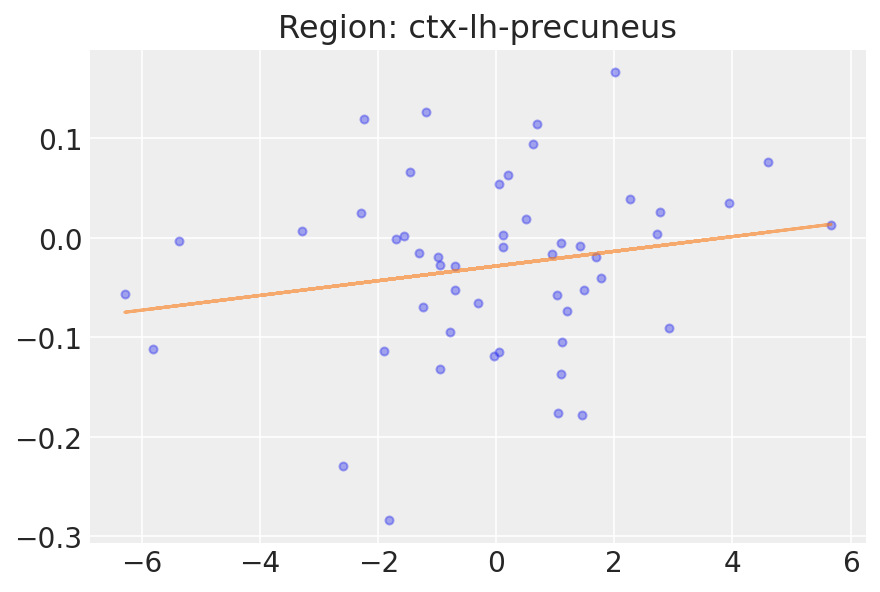

42


Text(0.5, 1.0, 'Region: ctx-lh-rostralanteriorcingulate')

<Figure size 432x288 with 0 Axes>

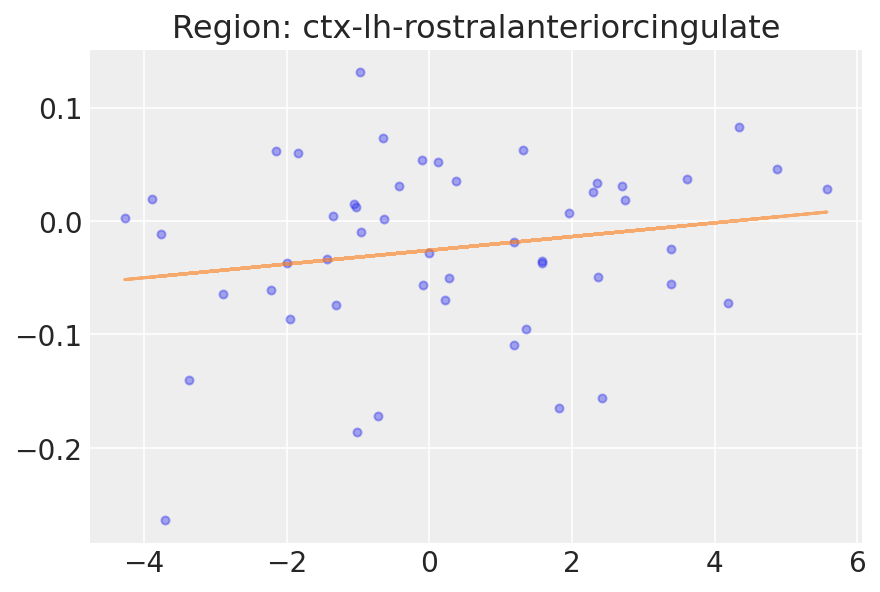

43


Text(0.5, 1.0, 'Region: ctx-lh-rostralmiddlefrontal')

<Figure size 432x288 with 0 Axes>

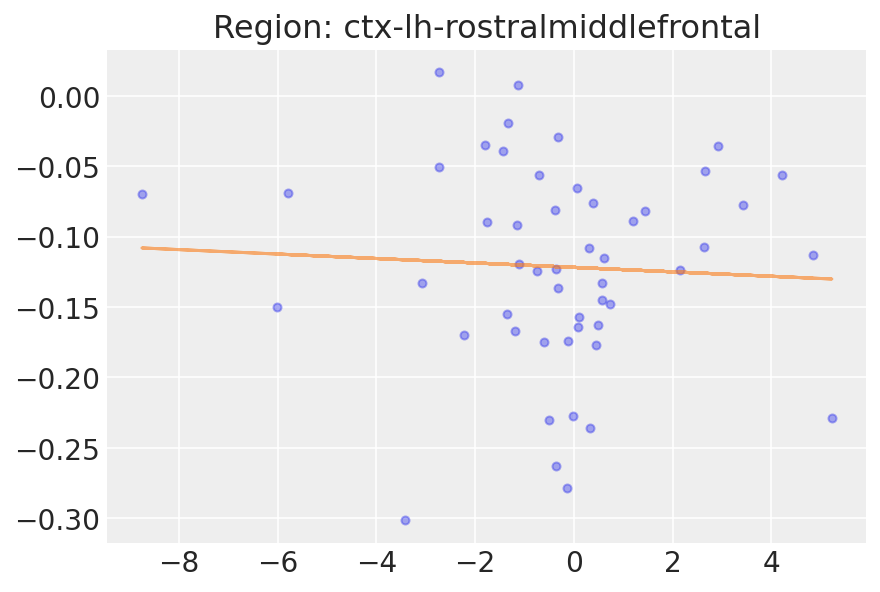

44


Text(0.5, 1.0, 'Region: ctx-lh-superiorfrontal')

<Figure size 432x288 with 0 Axes>

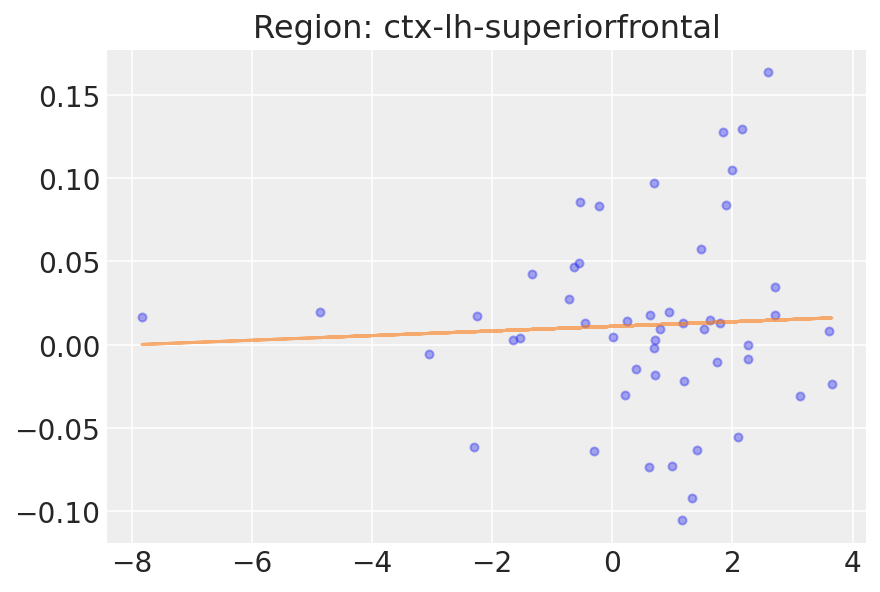

45


Text(0.5, 1.0, 'Region: ctx-lh-superiorparietal')

<Figure size 432x288 with 0 Axes>

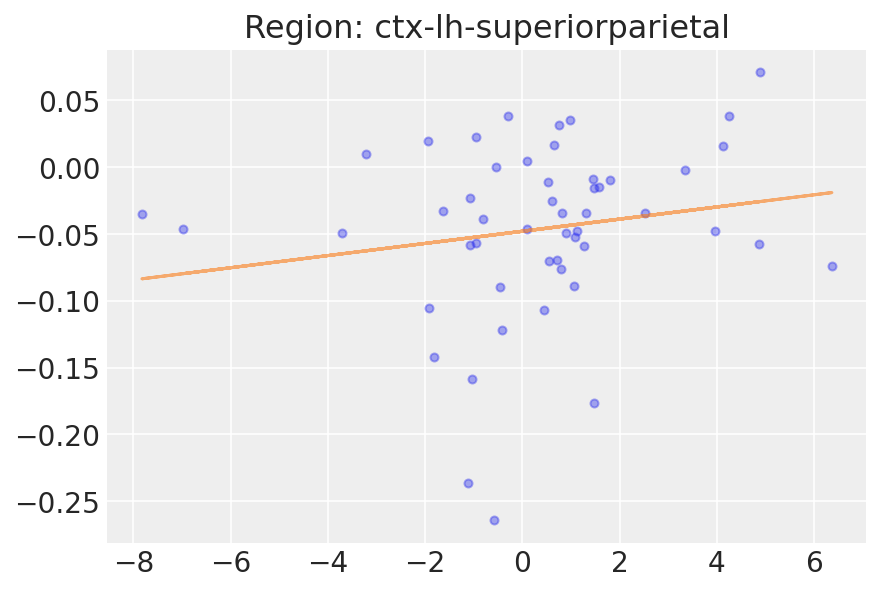

46


Text(0.5, 1.0, 'Region: ctx-lh-superiortemporal')

<Figure size 432x288 with 0 Axes>

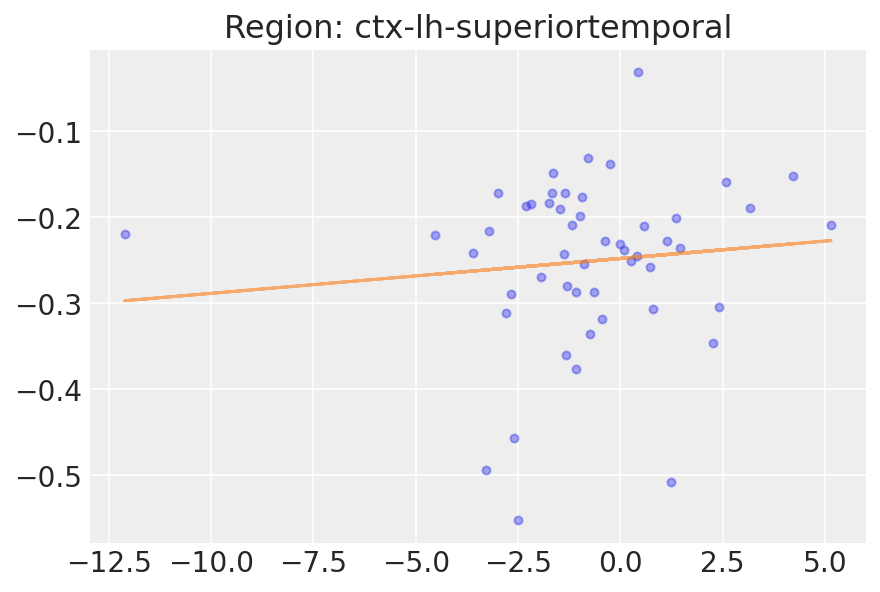

47


Text(0.5, 1.0, 'Region: ctx-lh-supramarginal')

<Figure size 432x288 with 0 Axes>

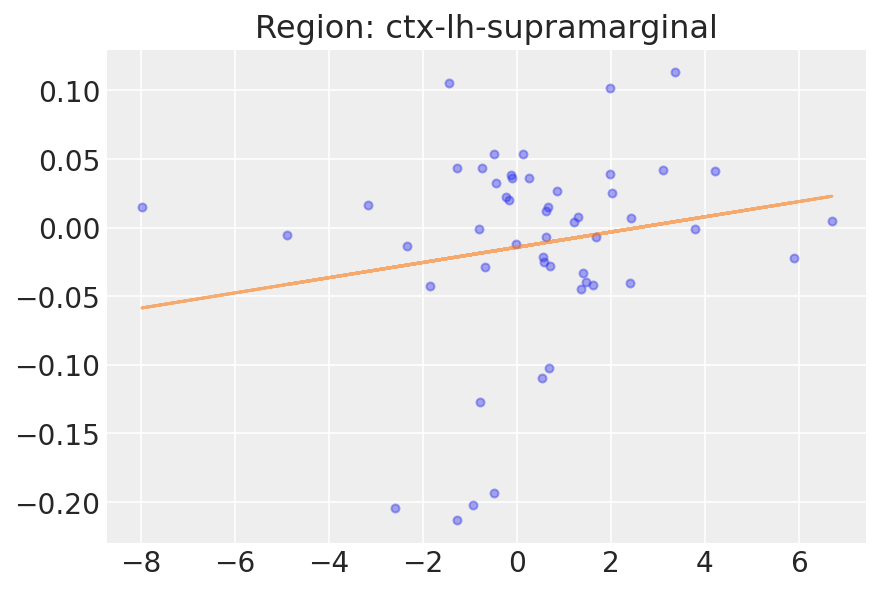

48


Text(0.5, 1.0, 'Region: ctx-lh-temporalpole')

<Figure size 432x288 with 0 Axes>

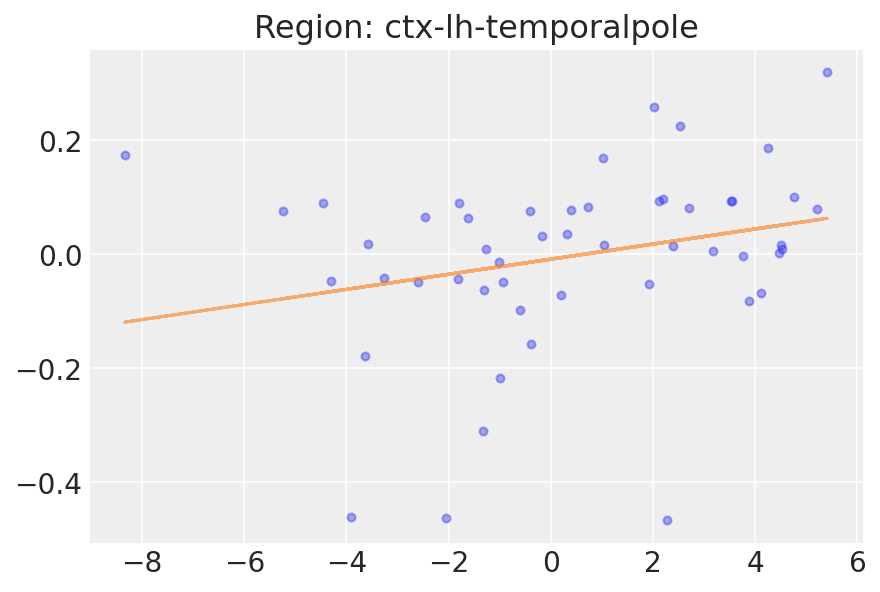

49


Text(0.5, 1.0, 'Region: ctx-lh-transversetemporal')

<Figure size 432x288 with 0 Axes>

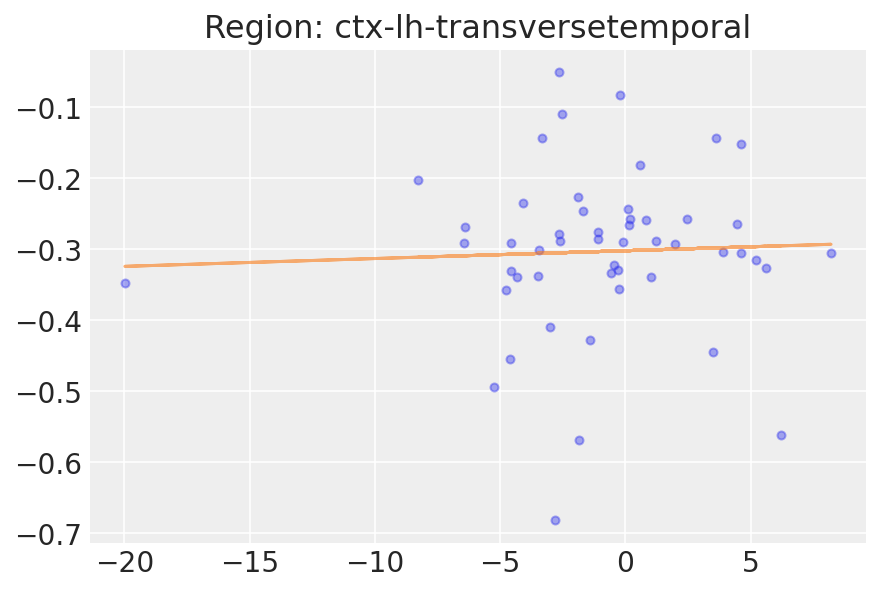

50


Text(0.5, 1.0, 'Region: ctx-rh-caudalanteriorcingulate')

<Figure size 432x288 with 0 Axes>

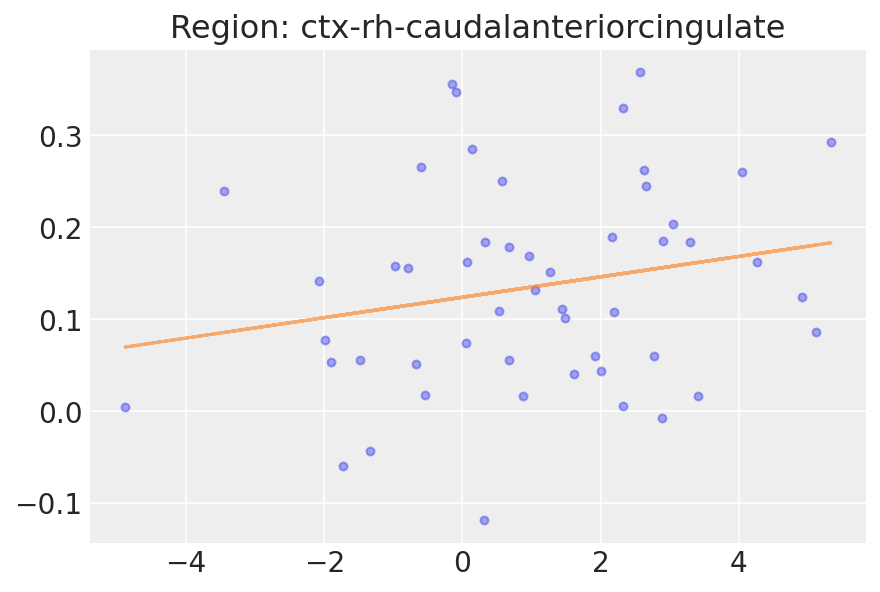

51


Text(0.5, 1.0, 'Region: ctx-rh-caudalmiddlefrontal')

<Figure size 432x288 with 0 Axes>

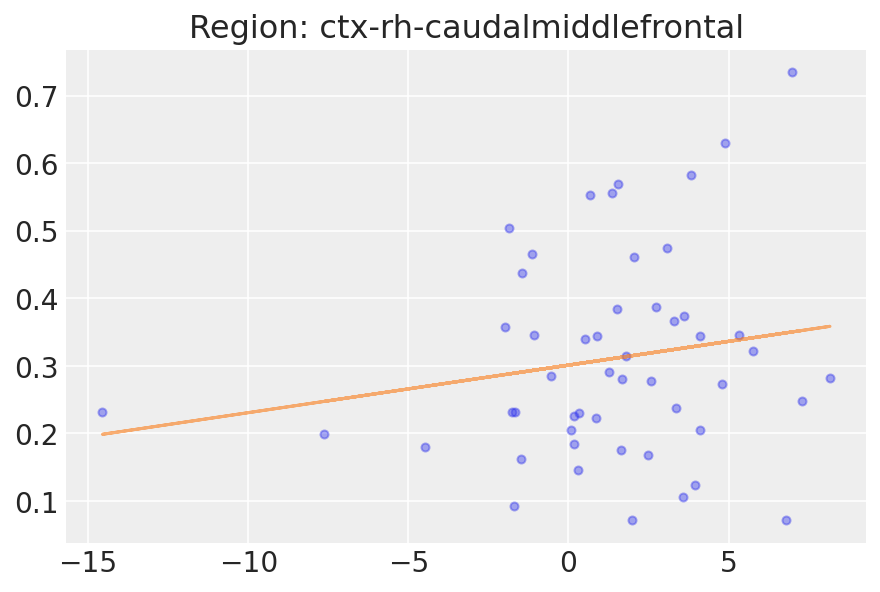

52


Text(0.5, 1.0, 'Region: ctx-rh-cuneus')

<Figure size 432x288 with 0 Axes>

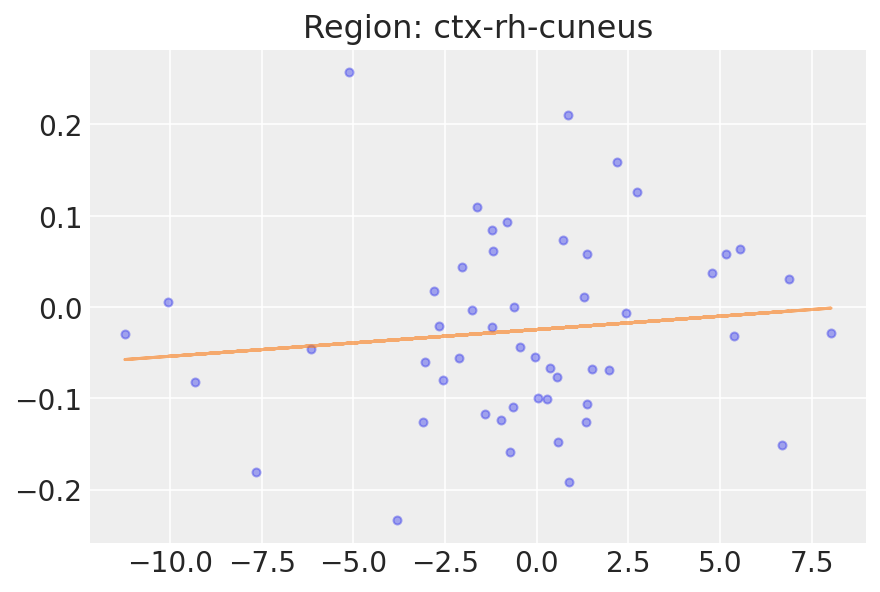

53


Text(0.5, 1.0, 'Region: ctx-rh-entorhinal')

<Figure size 432x288 with 0 Axes>

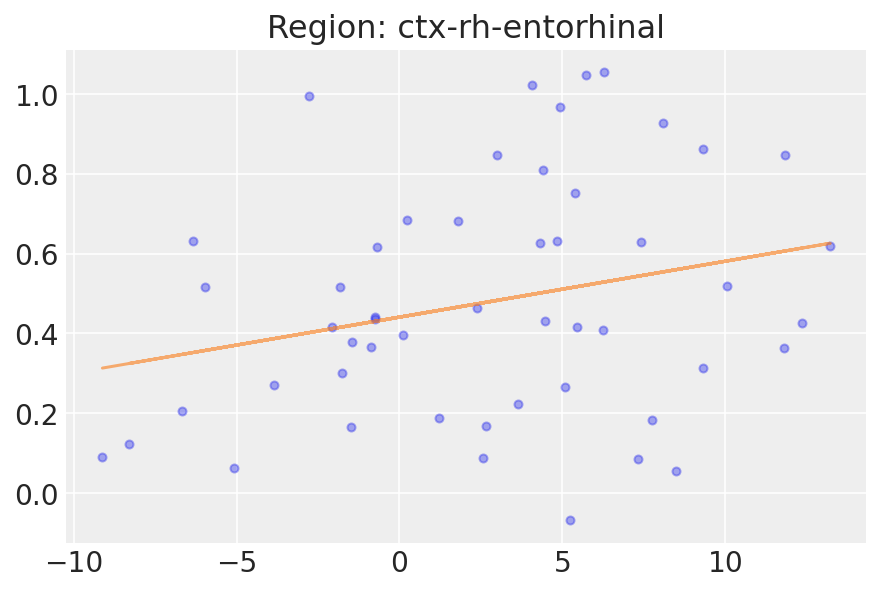

54


Text(0.5, 1.0, 'Region: ctx-rh-frontalpole')

<Figure size 432x288 with 0 Axes>

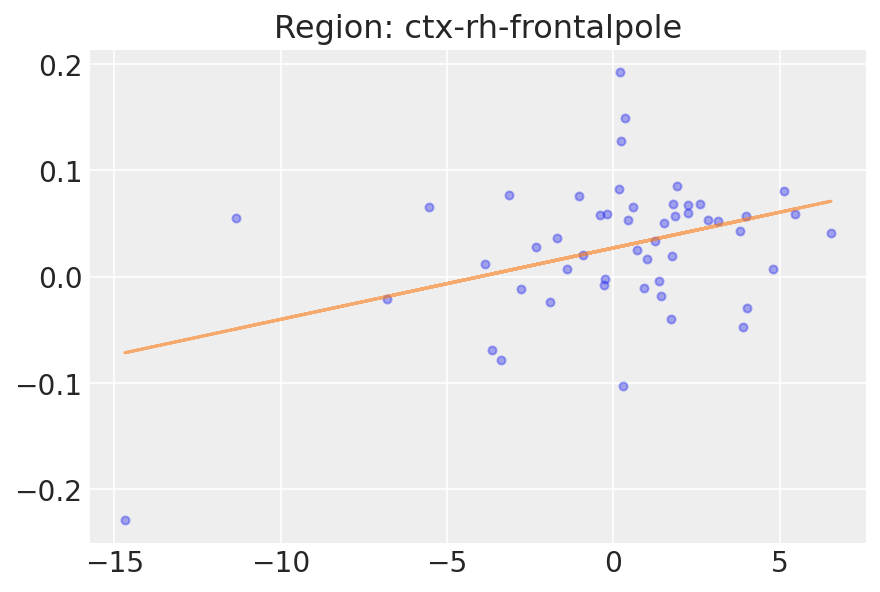

55


Text(0.5, 1.0, 'Region: ctx-rh-fusiform')

<Figure size 432x288 with 0 Axes>

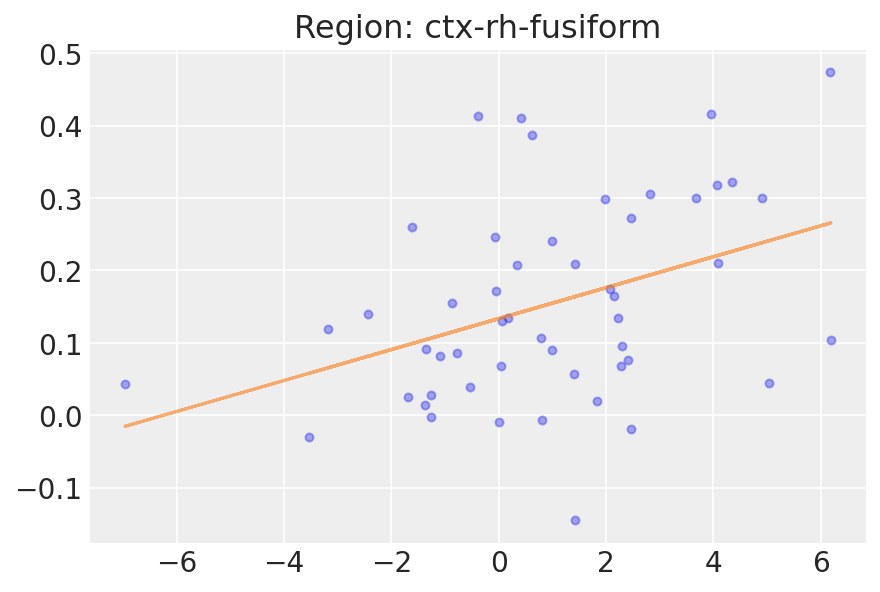

56


Text(0.5, 1.0, 'Region: ctx-rh-inferiorparietal')

<Figure size 432x288 with 0 Axes>

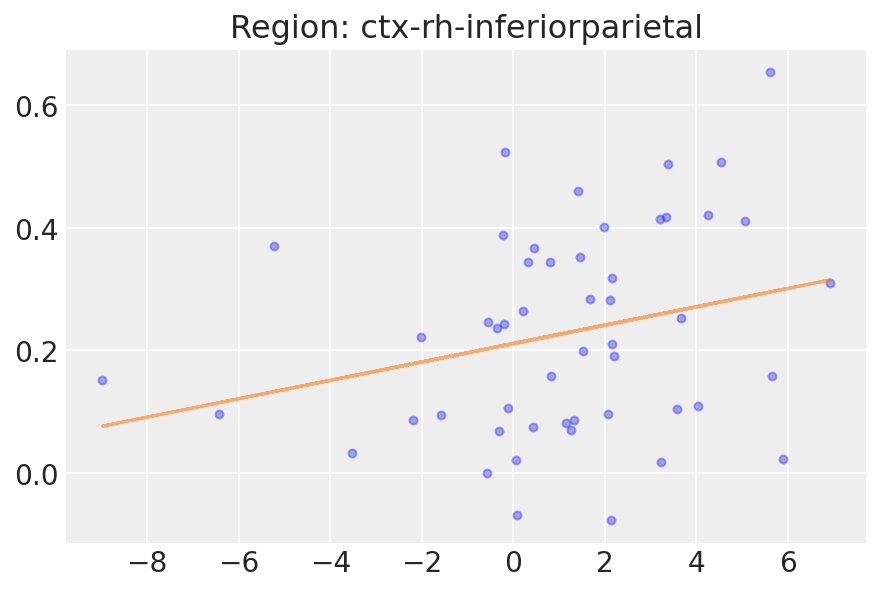

57


Text(0.5, 1.0, 'Region: ctx-rh-inferiortemporal')

<Figure size 432x288 with 0 Axes>

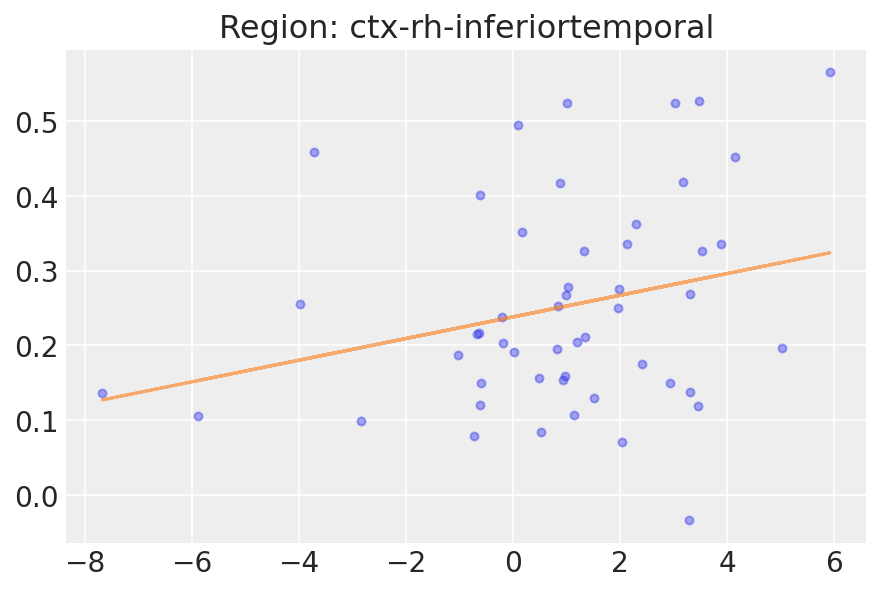

58


Text(0.5, 1.0, 'Region: ctx-rh-insula')

<Figure size 432x288 with 0 Axes>

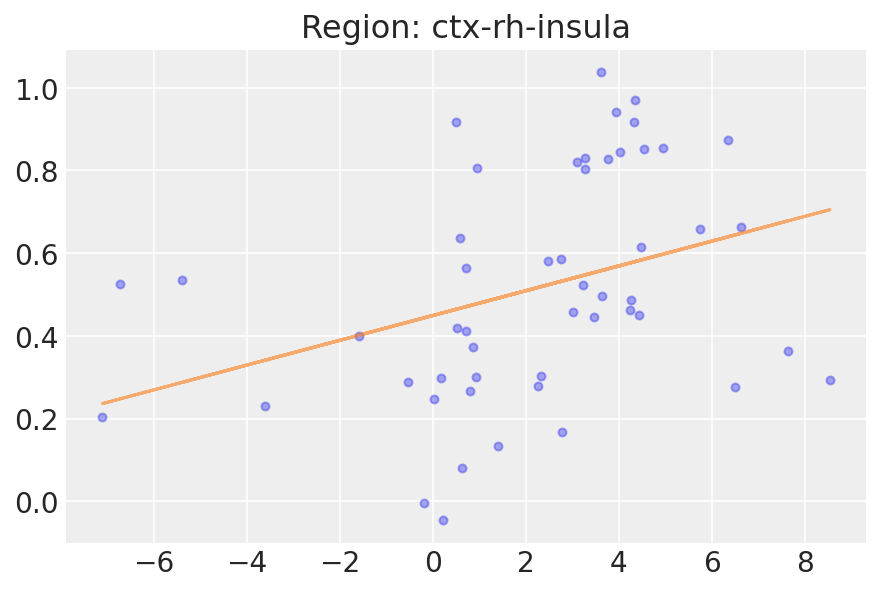

59


Text(0.5, 1.0, 'Region: ctx-rh-isthmuscingulate')

<Figure size 432x288 with 0 Axes>

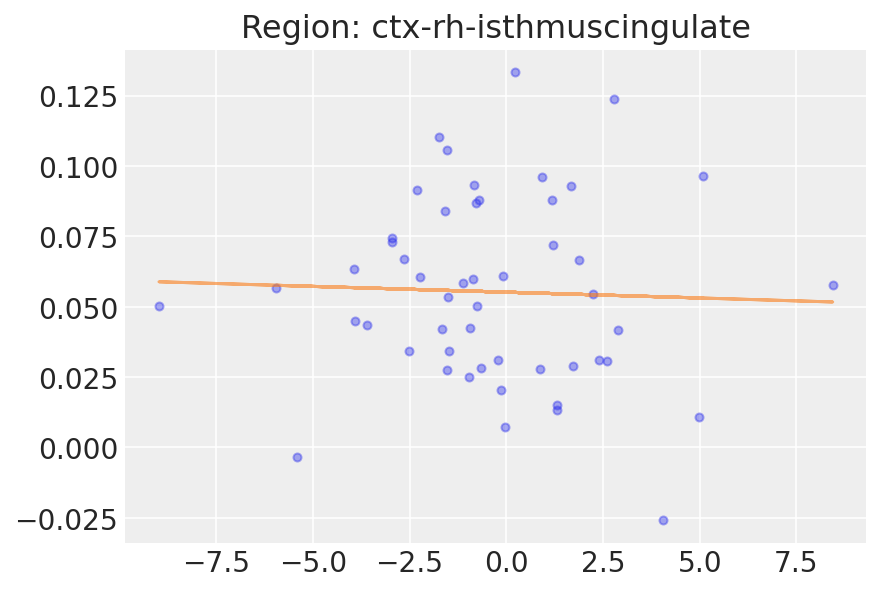

60


Text(0.5, 1.0, 'Region: ctx-rh-lateraloccipital')

<Figure size 432x288 with 0 Axes>

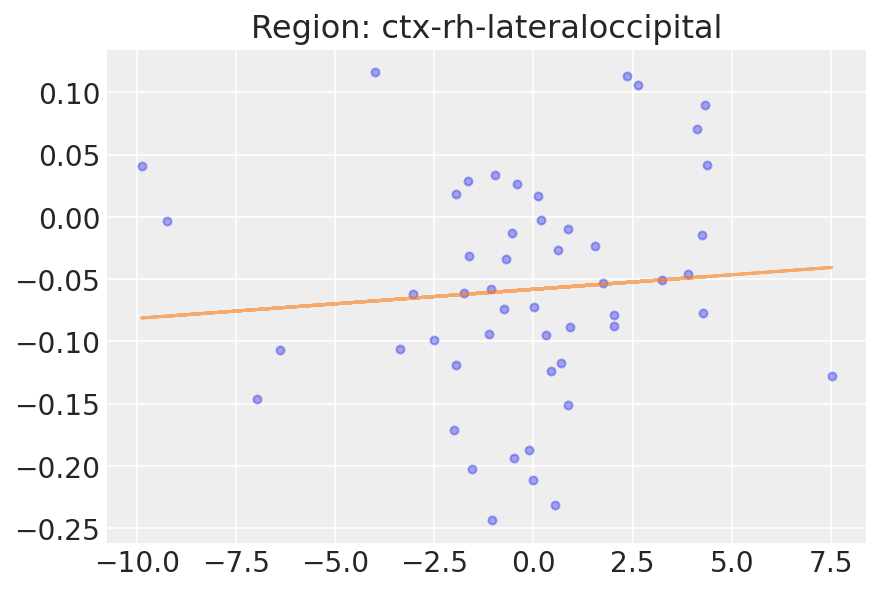

61


Text(0.5, 1.0, 'Region: ctx-rh-lateralorbitofrontal')

<Figure size 432x288 with 0 Axes>

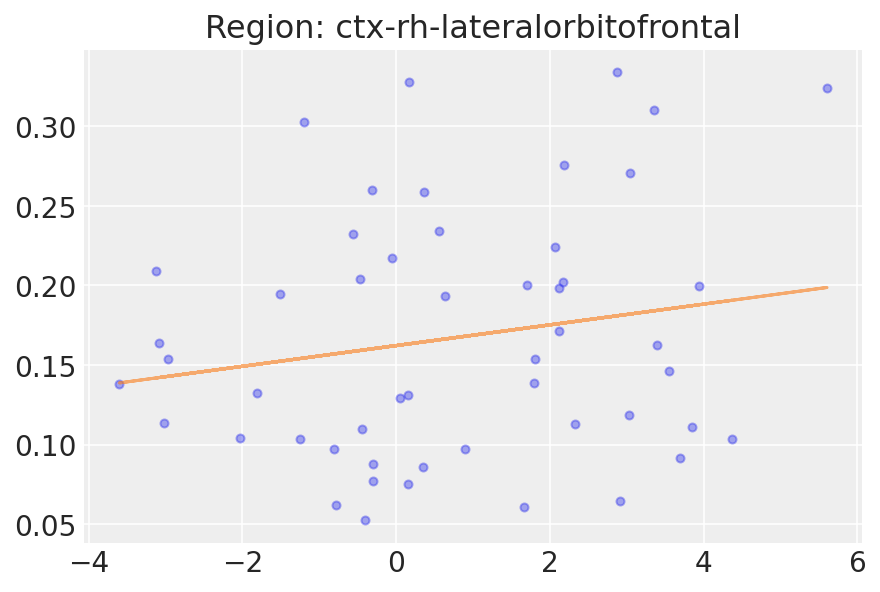

62


Text(0.5, 1.0, 'Region: ctx-rh-lingual')

<Figure size 432x288 with 0 Axes>

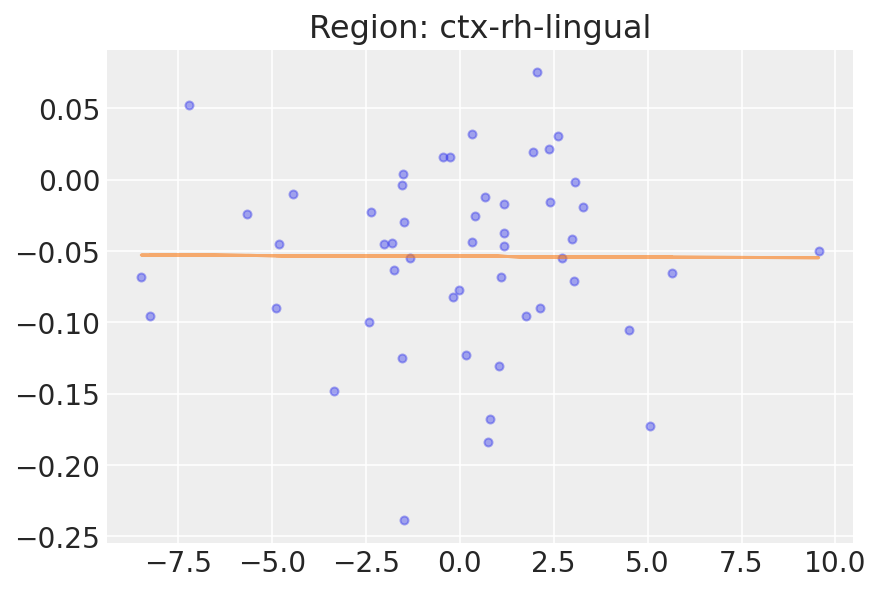

63


Text(0.5, 1.0, 'Region: ctx-rh-medialorbitofrontal')

<Figure size 432x288 with 0 Axes>

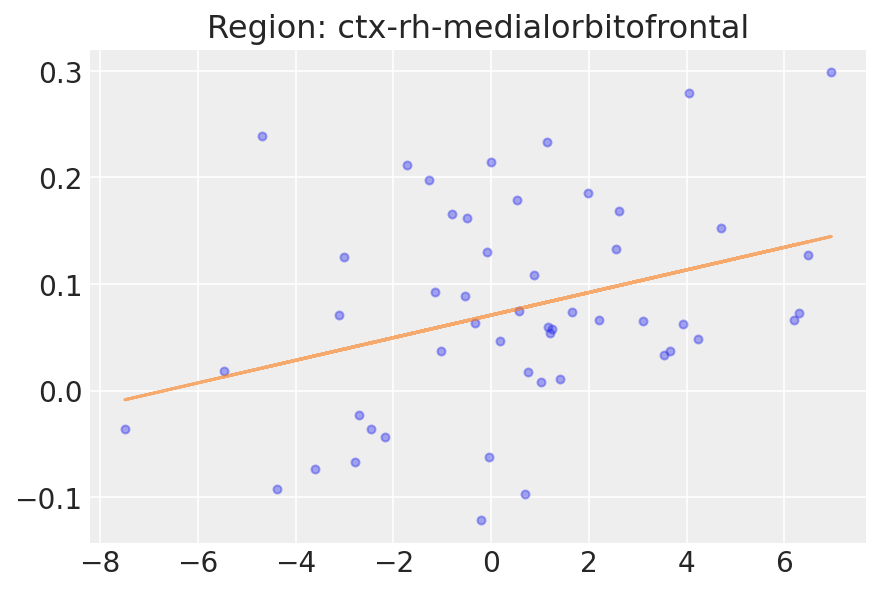

64


Text(0.5, 1.0, 'Region: ctx-rh-middletemporal')

<Figure size 432x288 with 0 Axes>

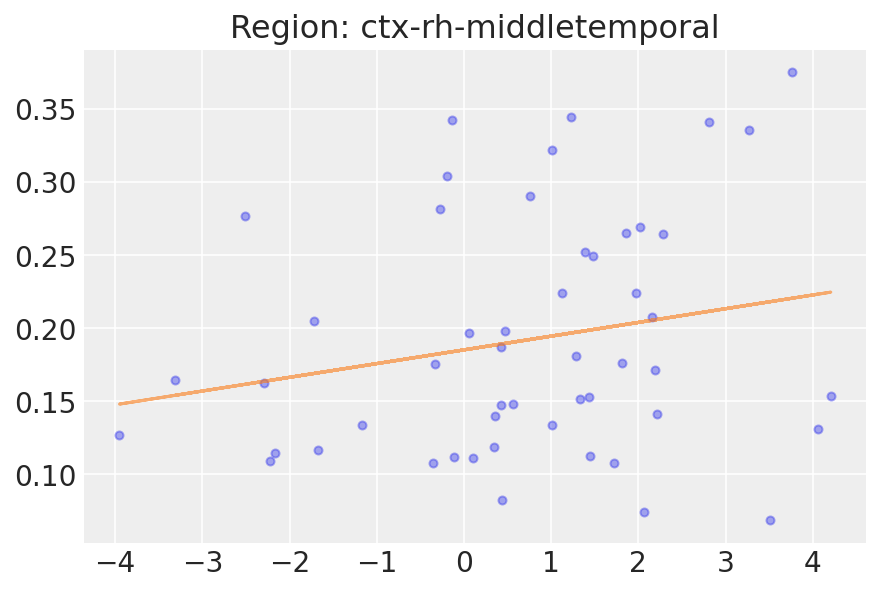

65


Text(0.5, 1.0, 'Region: ctx-rh-paracentral')

<Figure size 432x288 with 0 Axes>

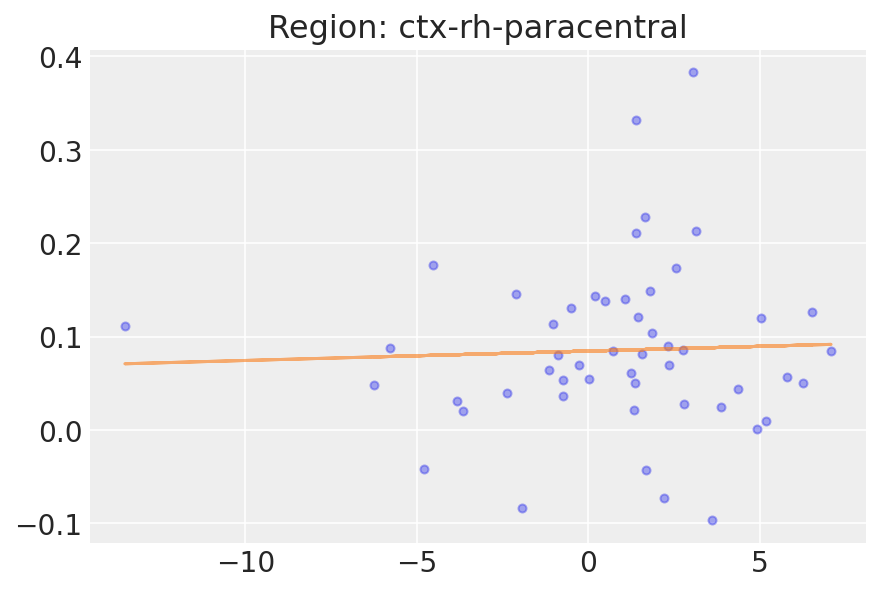

66


Text(0.5, 1.0, 'Region: ctx-rh-parahippocampal')

<Figure size 432x288 with 0 Axes>

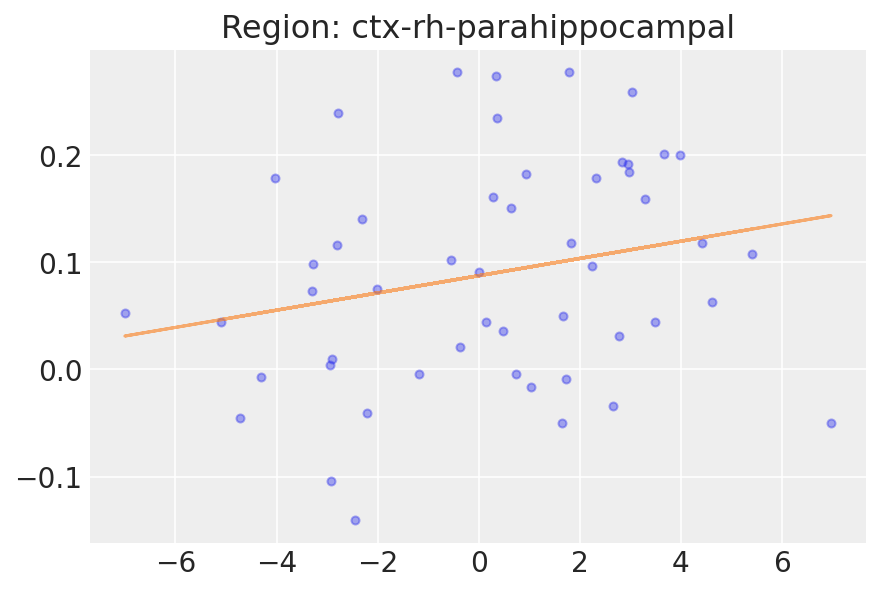

67


Text(0.5, 1.0, 'Region: ctx-rh-parsopercularis')

<Figure size 432x288 with 0 Axes>

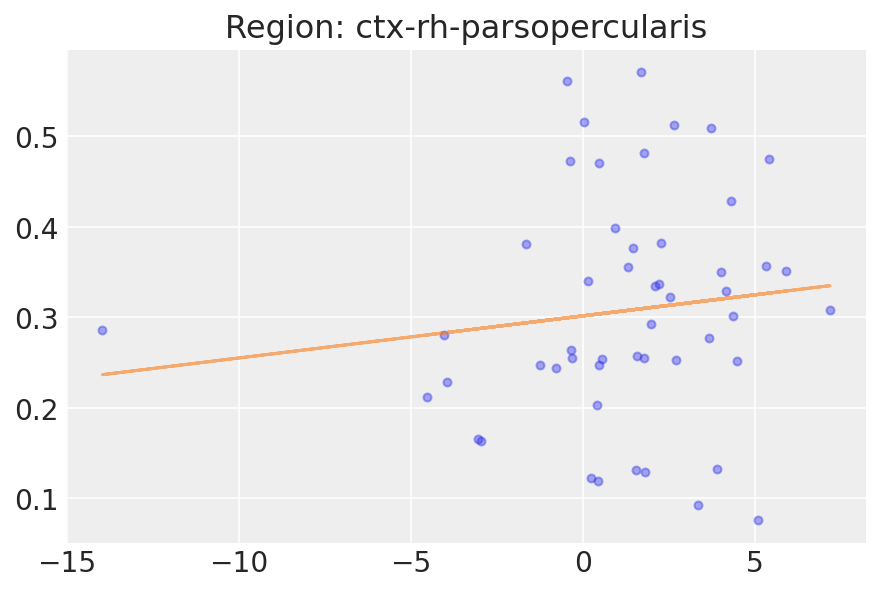

68


Text(0.5, 1.0, 'Region: ctx-rh-parsorbitalis')

<Figure size 432x288 with 0 Axes>

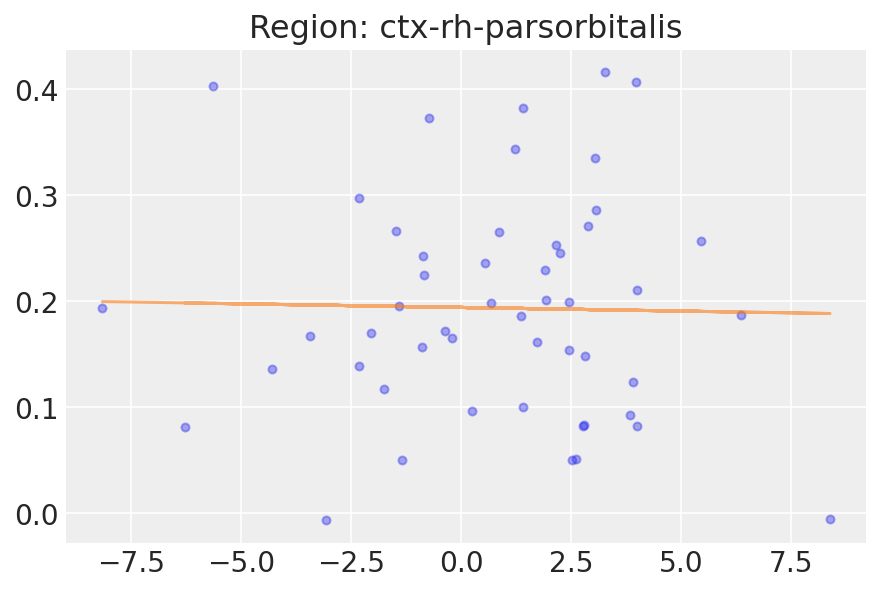

69


Text(0.5, 1.0, 'Region: ctx-rh-parstriangularis')

<Figure size 432x288 with 0 Axes>

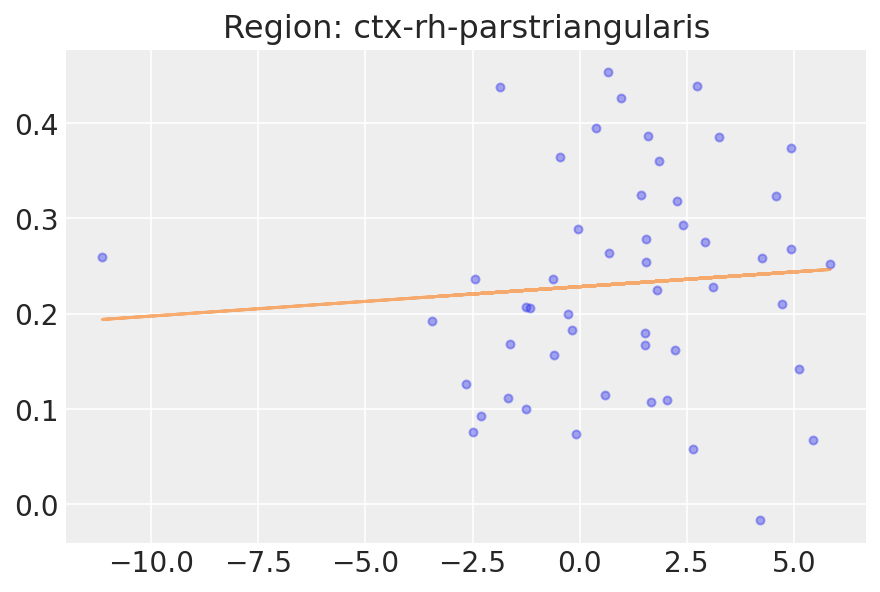

70


Text(0.5, 1.0, 'Region: ctx-rh-pericalcarine')

<Figure size 432x288 with 0 Axes>

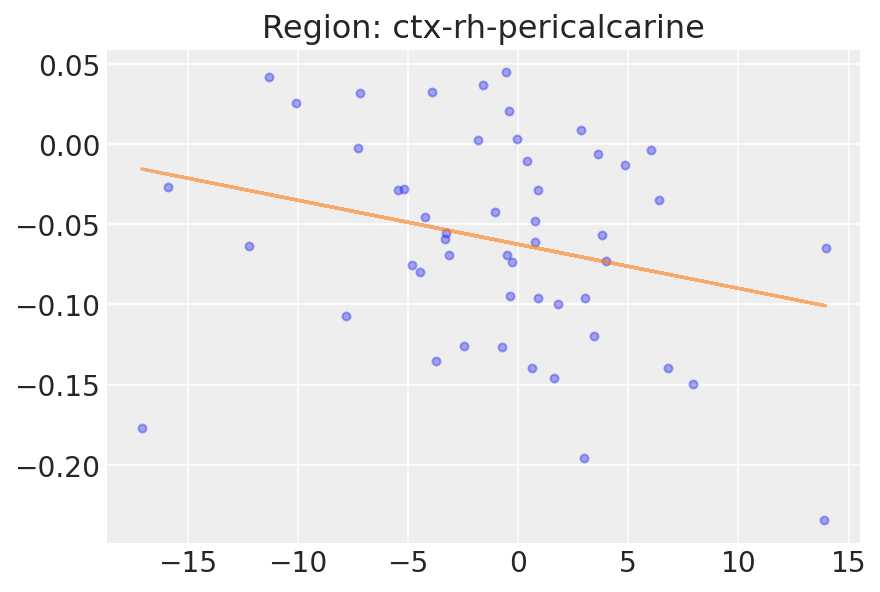

71


Text(0.5, 1.0, 'Region: ctx-rh-postcentral')

<Figure size 432x288 with 0 Axes>

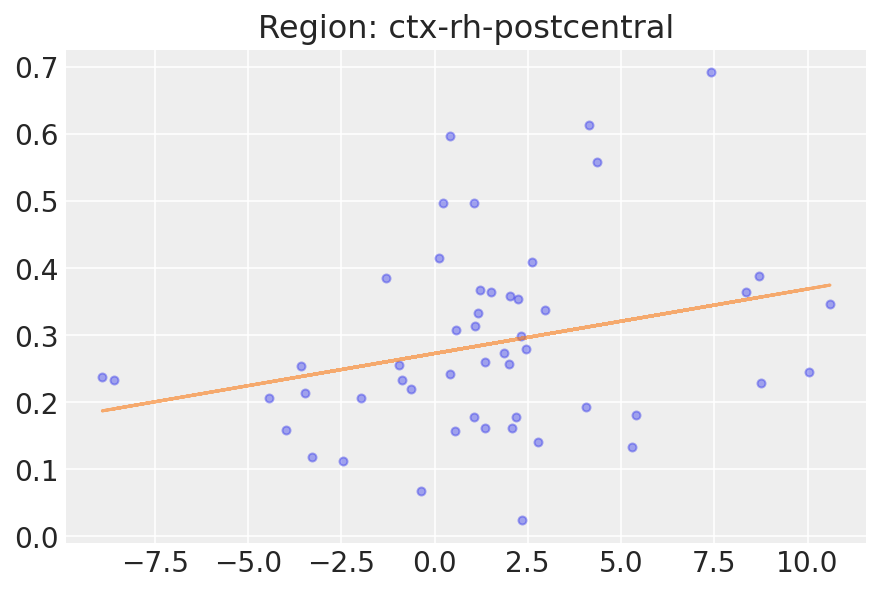

72


Text(0.5, 1.0, 'Region: ctx-rh-posteriorcingulate')

<Figure size 432x288 with 0 Axes>

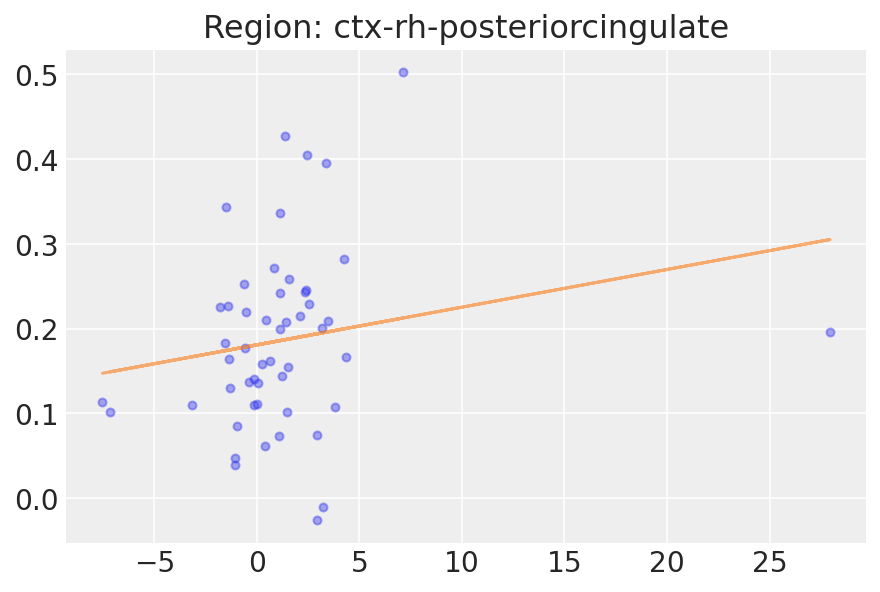

73


Text(0.5, 1.0, 'Region: ctx-rh-precentral')

<Figure size 432x288 with 0 Axes>

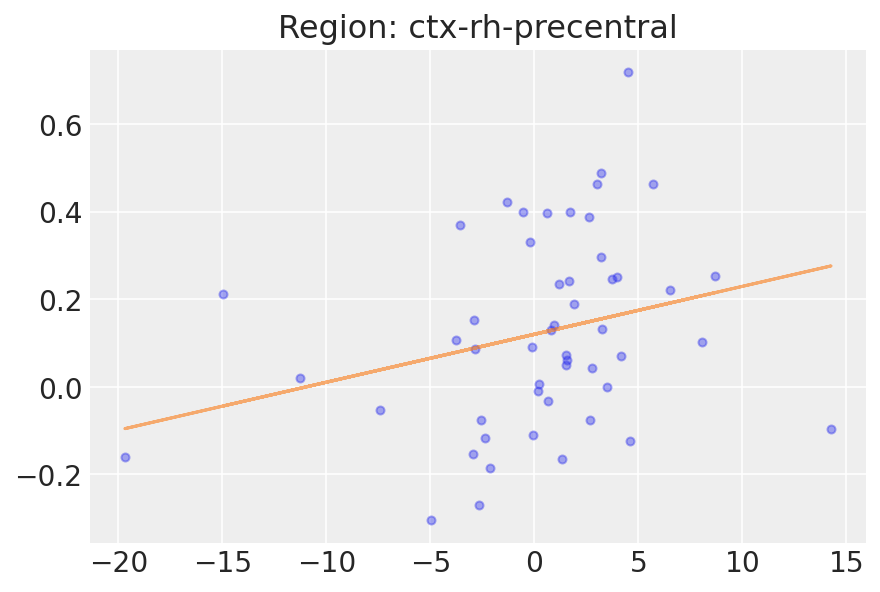

74


Text(0.5, 1.0, 'Region: ctx-rh-precuneus')

<Figure size 432x288 with 0 Axes>

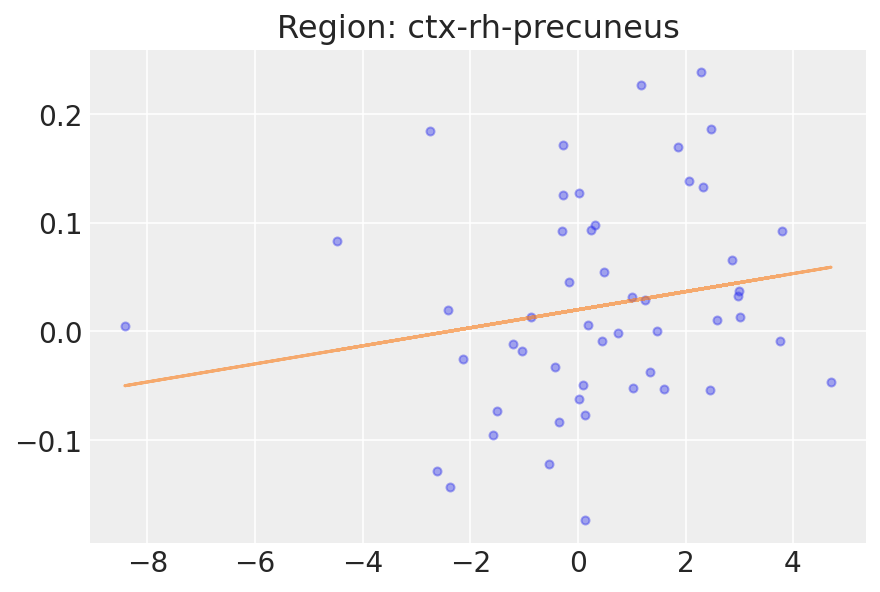

75


Text(0.5, 1.0, 'Region: ctx-rh-rostralanteriorcingulate')

<Figure size 432x288 with 0 Axes>

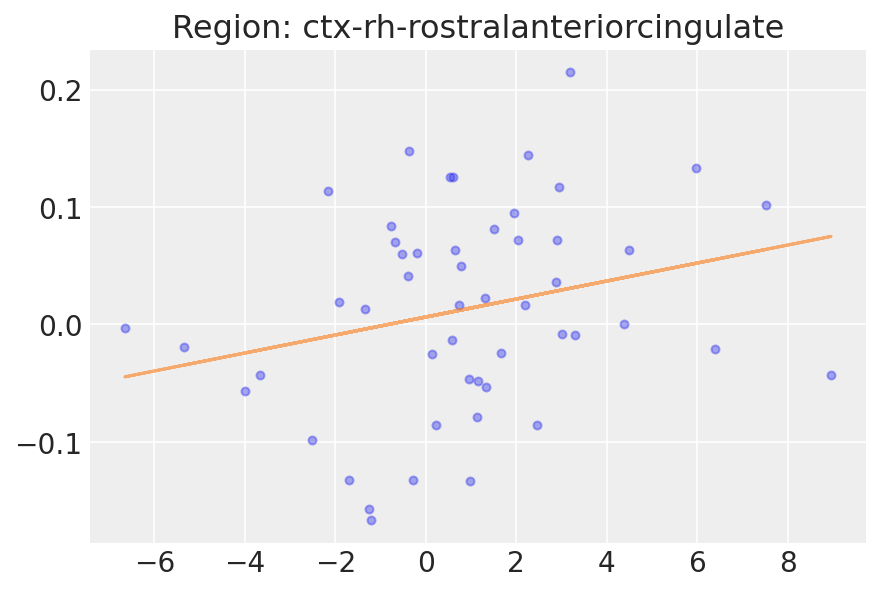

76


Text(0.5, 1.0, 'Region: ctx-rh-rostralmiddlefrontal')

<Figure size 432x288 with 0 Axes>

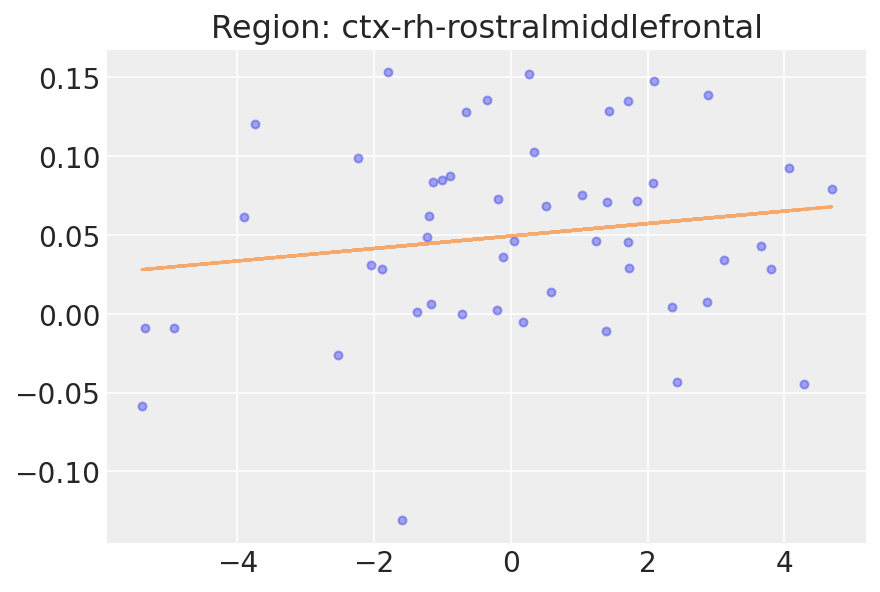

77


Text(0.5, 1.0, 'Region: ctx-rh-superiorfrontal')

<Figure size 432x288 with 0 Axes>

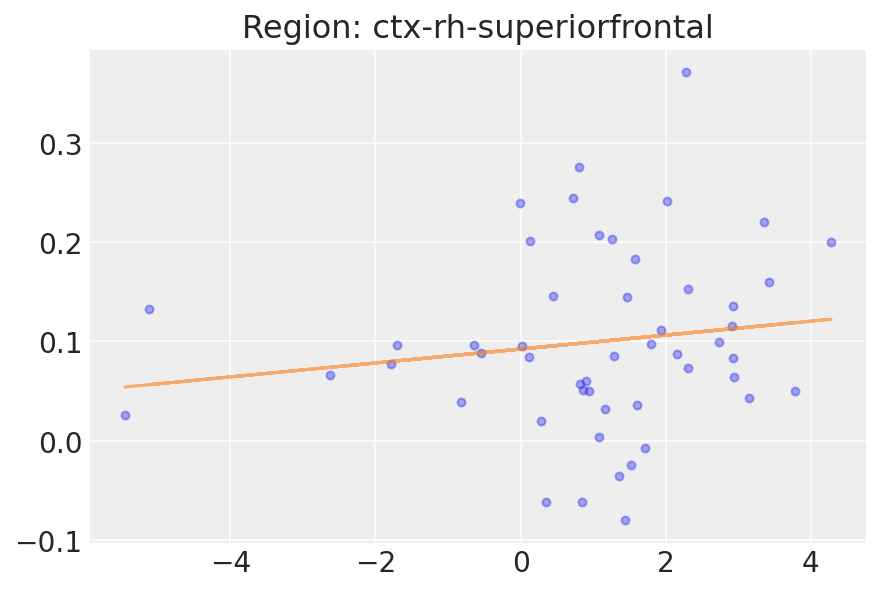

78


Text(0.5, 1.0, 'Region: ctx-rh-superiorparietal')

<Figure size 432x288 with 0 Axes>

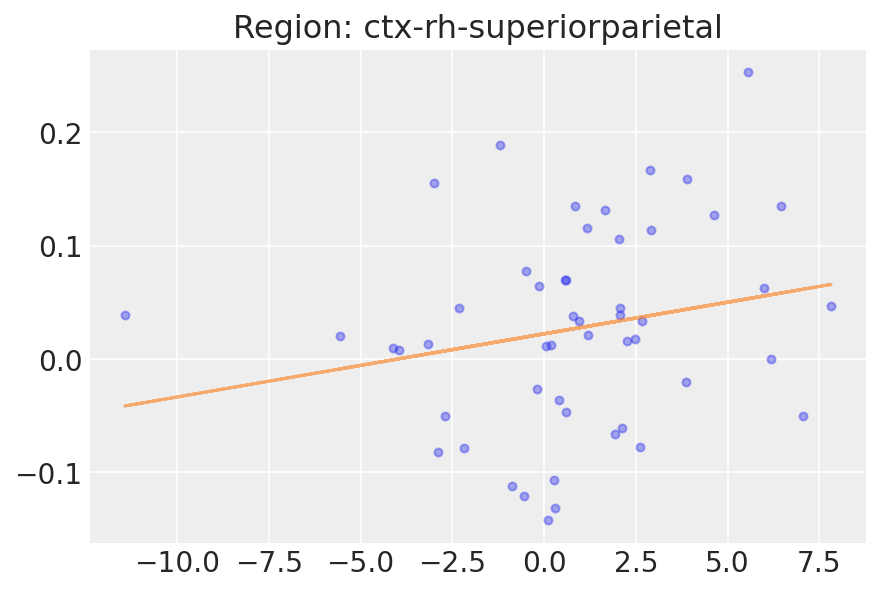

79


Text(0.5, 1.0, 'Region: ctx-rh-superiortemporal')

<Figure size 432x288 with 0 Axes>

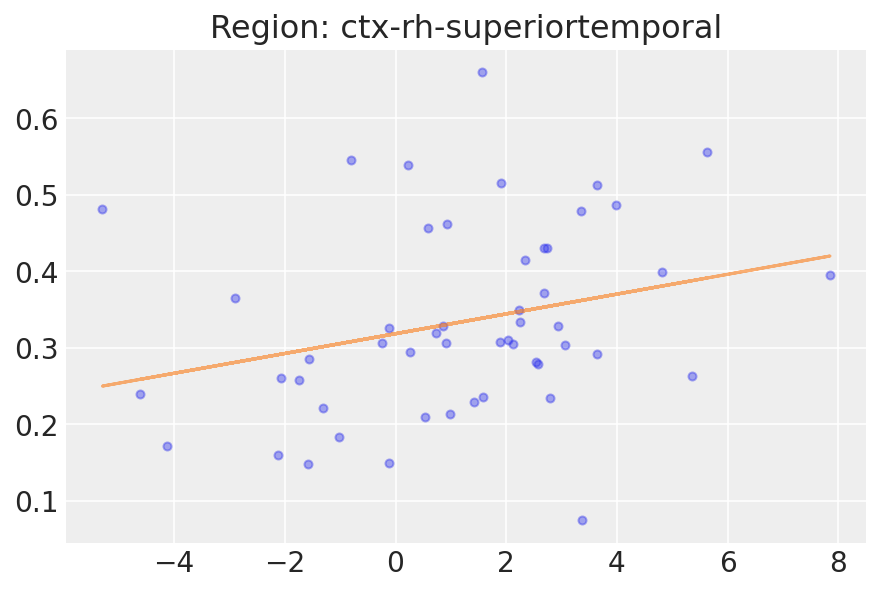

80


Text(0.5, 1.0, 'Region: ctx-rh-supramarginal')

<Figure size 432x288 with 0 Axes>

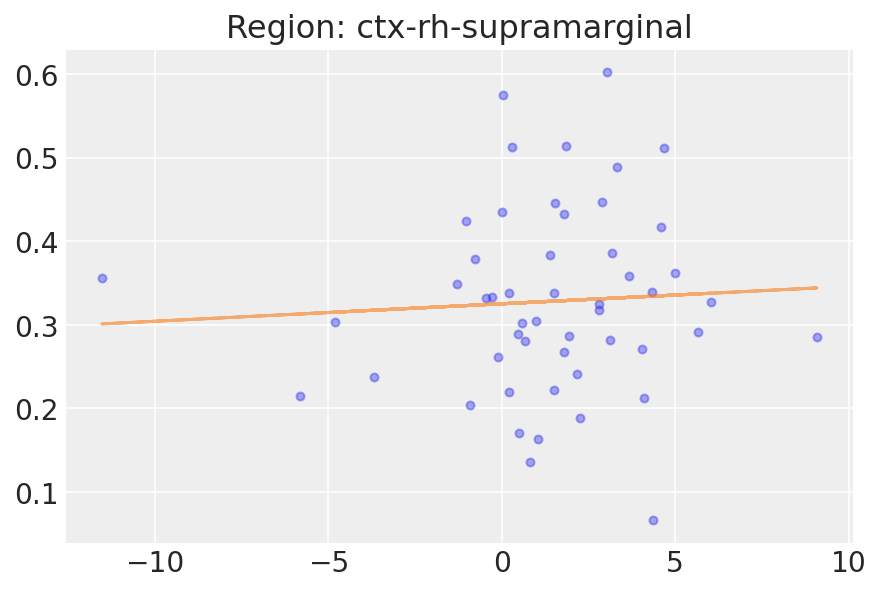

81


Text(0.5, 1.0, 'Region: ctx-rh-temporalpole')

<Figure size 432x288 with 0 Axes>

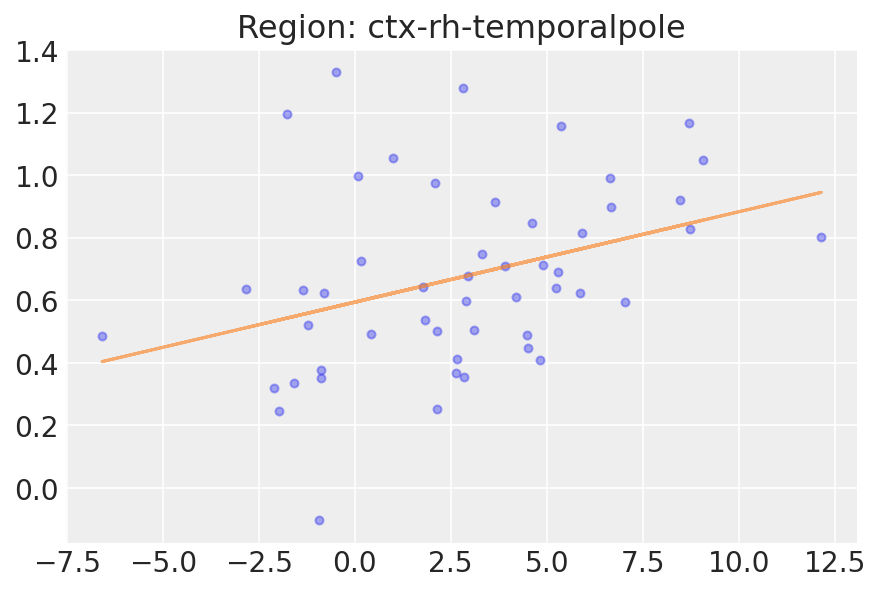

82


Text(0.5, 1.0, 'Region: ctx-rh-transversetemporal')

<Figure size 432x288 with 0 Axes>

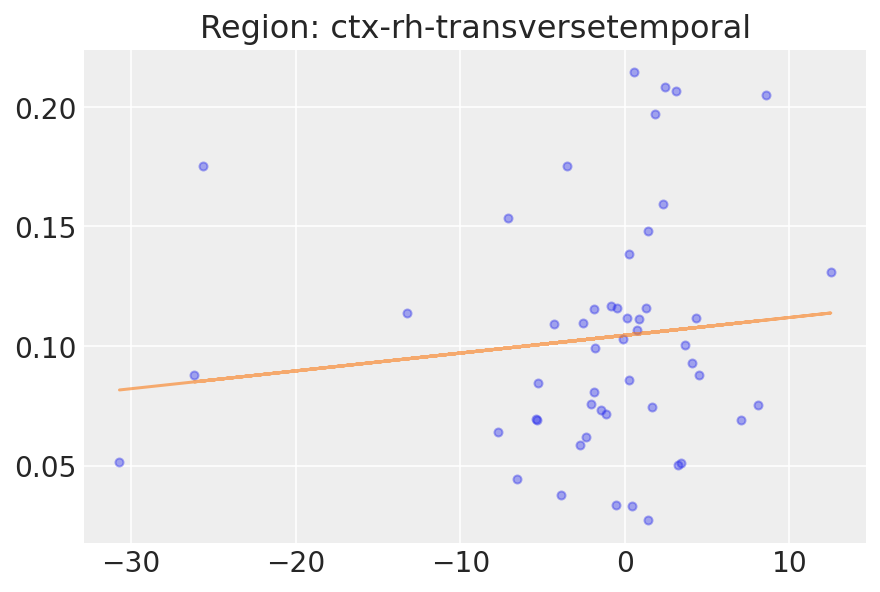

83


In [1148]:
#msbj=44
#mreg=10
#ix = np.where(nmdata.sbj==msbj)[0]
#ix = np.where(nmdata.rgn==rgn[mreg])[0]
#int_pp = (ppc["a1"]+ppc["b1"][:,mreg]*pulsen1[ix, None]).T
#k=int_pp.mean(1)
#mu_pp = (ppc["a"] + k * ef[ix, None]).T



for i in range(84):
  plt.clf()
  _, ax = plt.subplots()
  mreg=i
  #ix = np.where(nmdata.rgn==rgn[mreg])[0]
  ix = np.where(nmdata.rgn==mreg)[0]
  if (ix.size!=0):
    ax.plot(nmdata.dvol.iloc[ix], ppc["V"].mean(0)[ix], "o", ms=4, alpha=0.4, label="Data") 
    m, b = np.polyfit(nmdata.dvol.iloc[ix], ppc["V"].mean(0)[ix],1)
    ax.plot(nmdata.dvol.iloc[ix], m*nmdata.dvol.iloc[ix]+b, label="Mean outcome", alpha=0.6)
    ax.set_title('Region: '+ str(coder.Region_Label.iloc[mreg]))
    #plt.savefig('./Abbott/testfig_'+str(i)+'.pdf')
    plt.show()
  print(i)

In [938]:
nmdata.columns

Index(['Unnamed: 0_x', 'Region', 'Ursi', 'Region_Label', 'Volume.2',
       'Average_Intensity.2', 'Max_Intensity.2', 'Volume.1',
       'Average_Intensity.1', 'Max_Intensity.1', 'Volume.3',
       'Average_Intensity.3', 'Max_Intensity.3', 'dvol3', 'dvol',
       'Unnamed: 0_y', 'id', 'cor', 'slope', 'inters', 'charge', 'pulsenumber',
       'pulsewidth', 'duration', 'eeg', 'freq', 'amp', 'sbj', 'rgn',
       'volavbas'],
      dtype='object')

Text(0.5, 1.0, 'Subject: 0, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

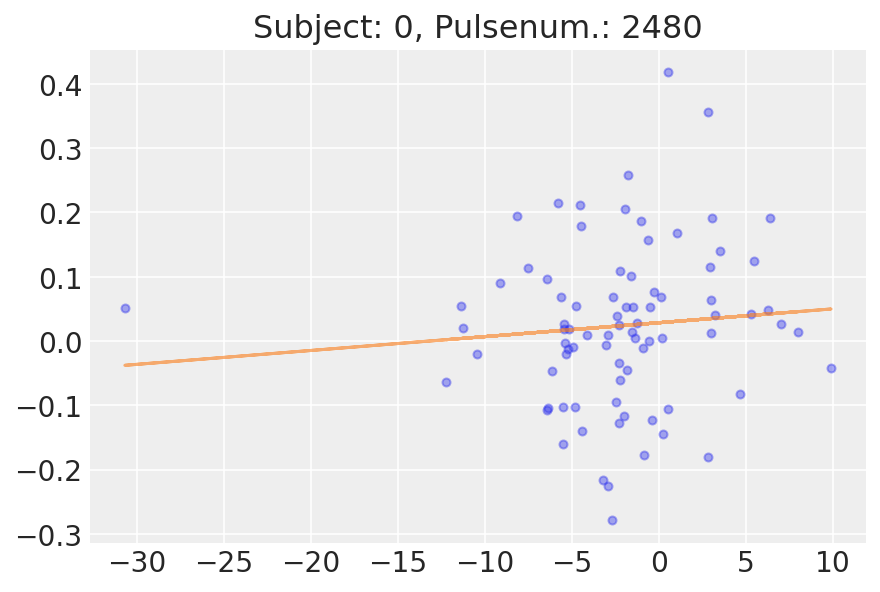

0


Text(0.5, 1.0, 'Subject: 1, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

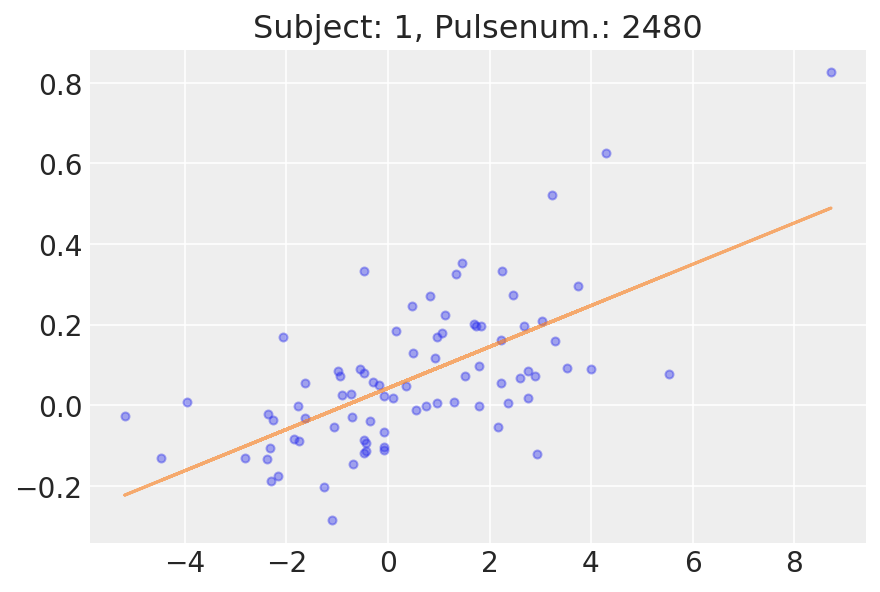

1


Text(0.5, 1.0, 'Subject: 2, Pulsenum.: 2120')

<Figure size 432x288 with 0 Axes>

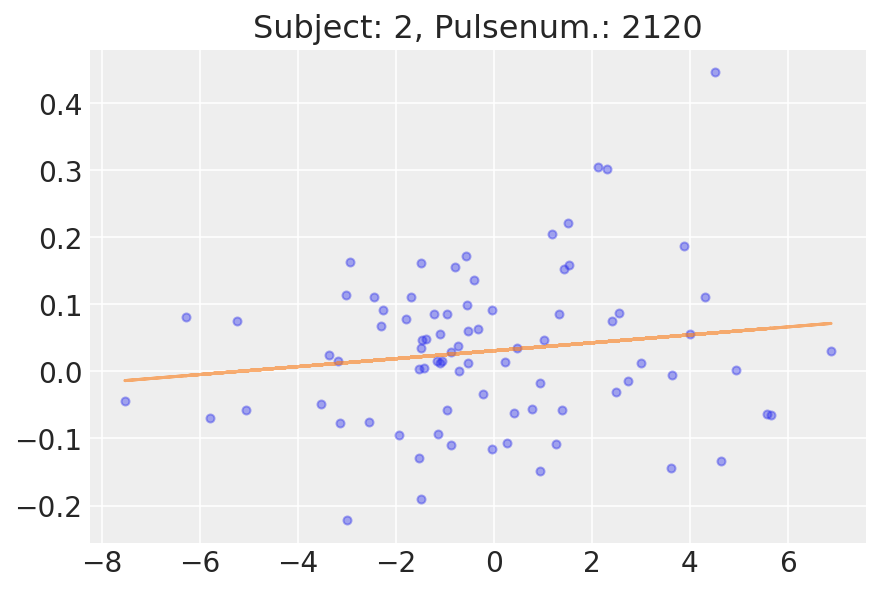

2


Text(0.5, 1.0, 'Subject: 3, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

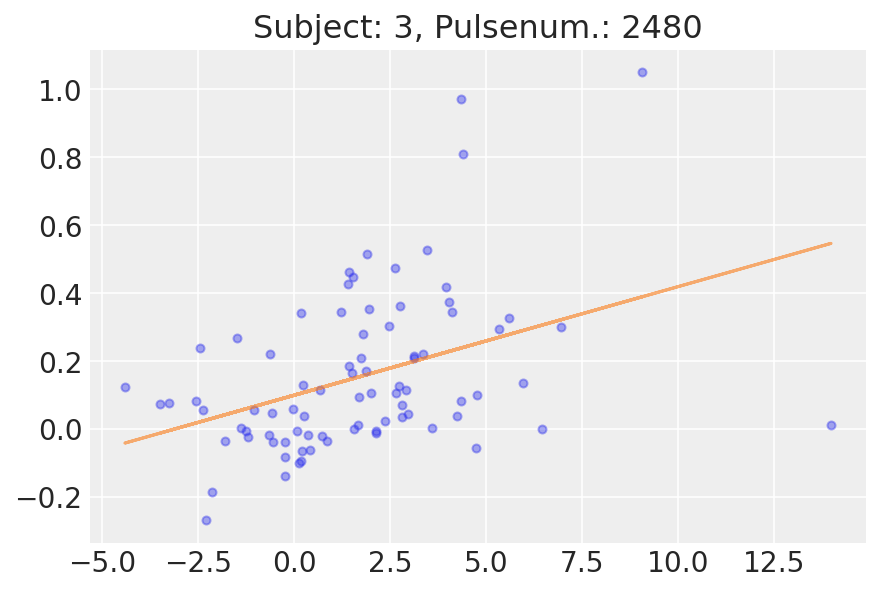

3


Text(0.5, 1.0, 'Subject: 4, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

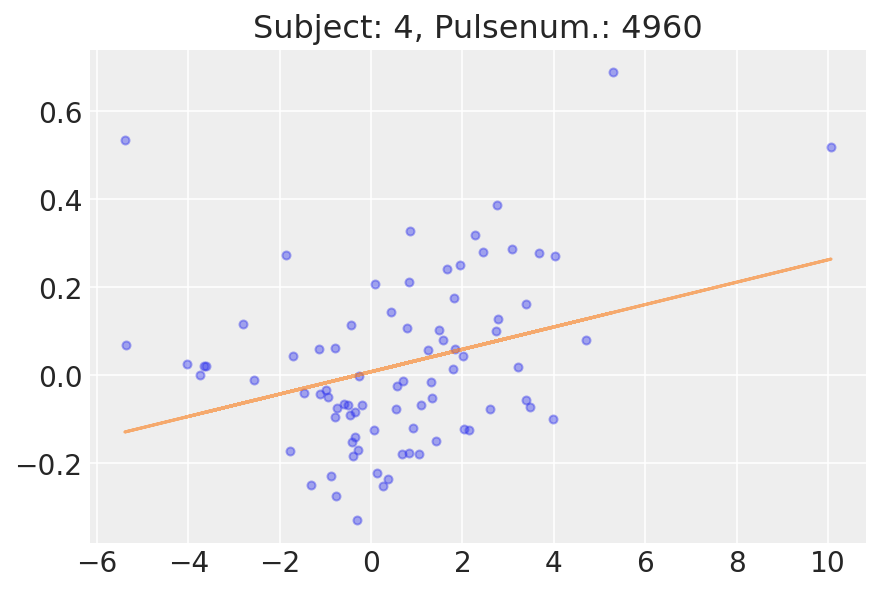

4


Text(0.5, 1.0, 'Subject: 5, Pulsenum.: 9920')

<Figure size 432x288 with 0 Axes>

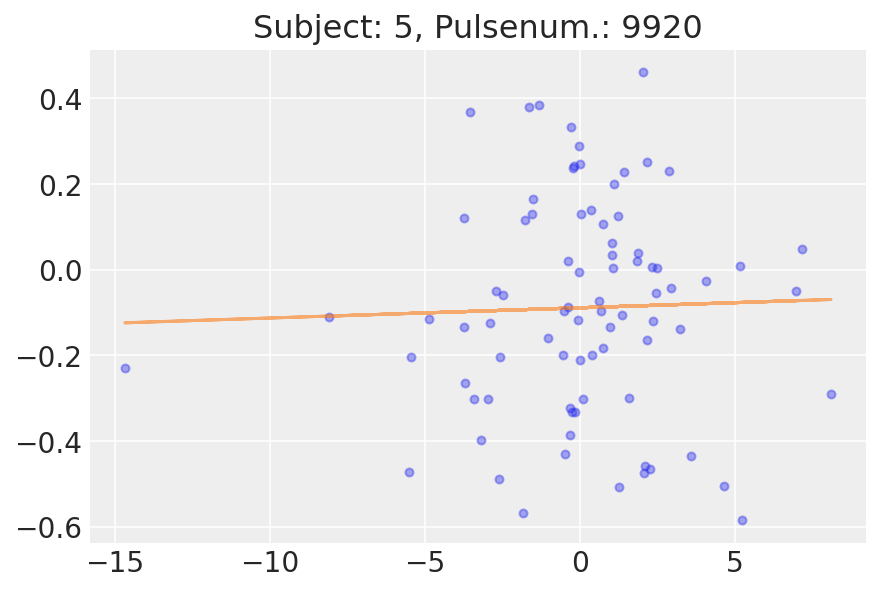

5


Text(0.5, 1.0, 'Subject: 6, Pulsenum.: 3440')

<Figure size 432x288 with 0 Axes>

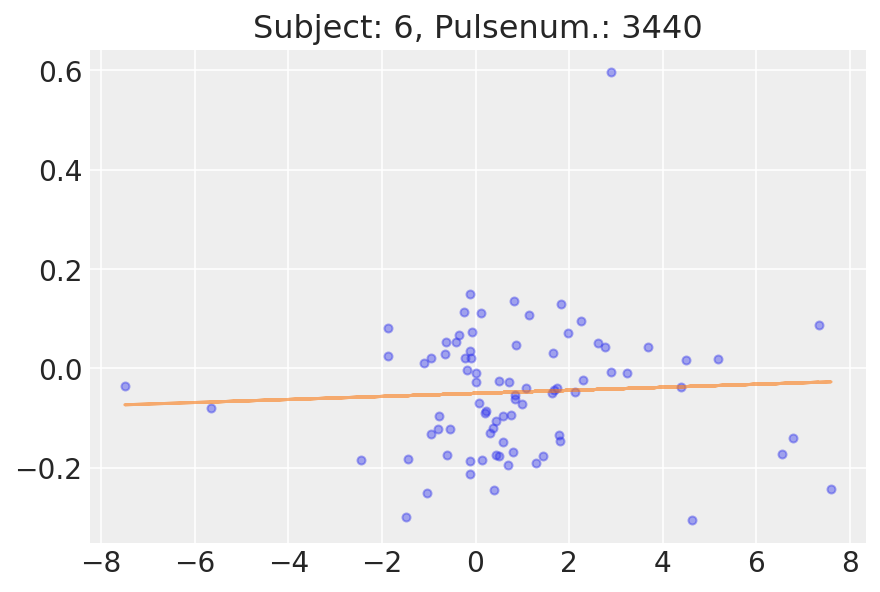

6


Text(0.5, 1.0, 'Subject: 7, Pulsenum.: 1810')

<Figure size 432x288 with 0 Axes>

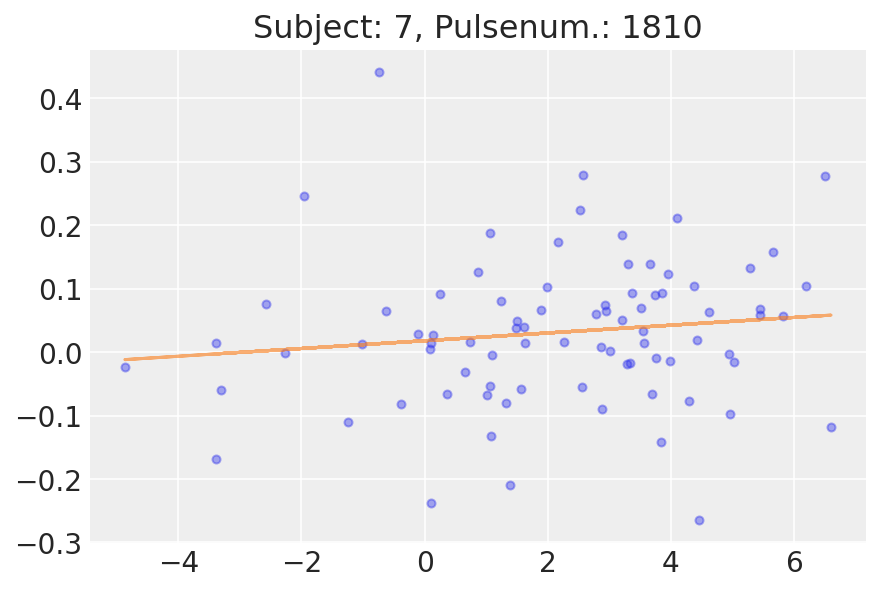

7


Text(0.5, 1.0, 'Subject: 8, Pulsenum.: 2600')

<Figure size 432x288 with 0 Axes>

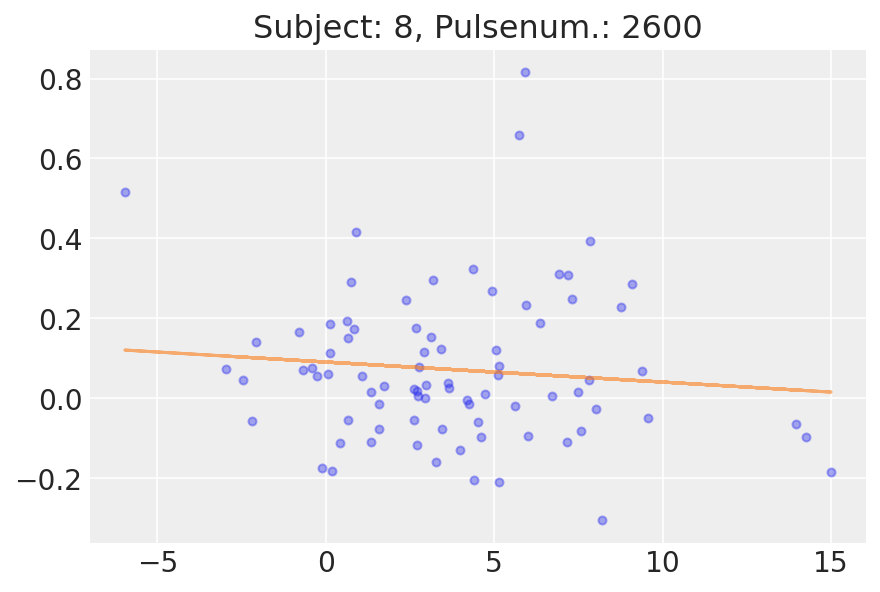

8


Text(0.5, 1.0, 'Subject: 9, Pulsenum.: 2960')

<Figure size 432x288 with 0 Axes>

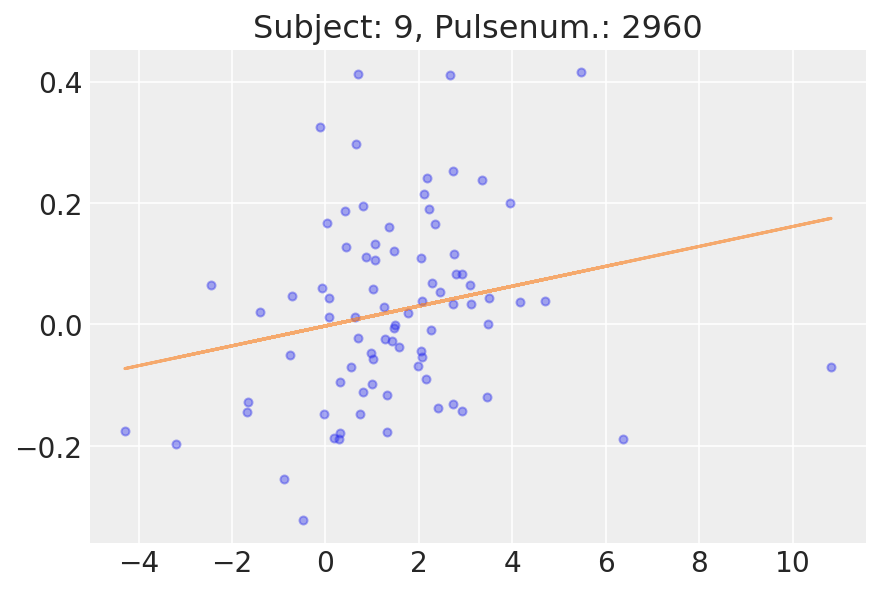

9


Text(0.5, 1.0, 'Subject: 10, Pulsenum.: 8800')

<Figure size 432x288 with 0 Axes>

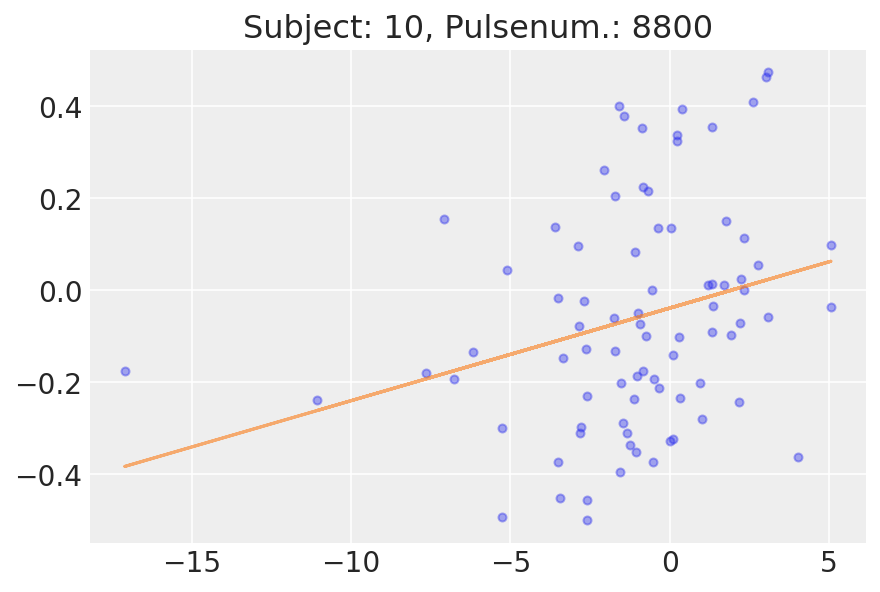

10


Text(0.5, 1.0, 'Subject: 11, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

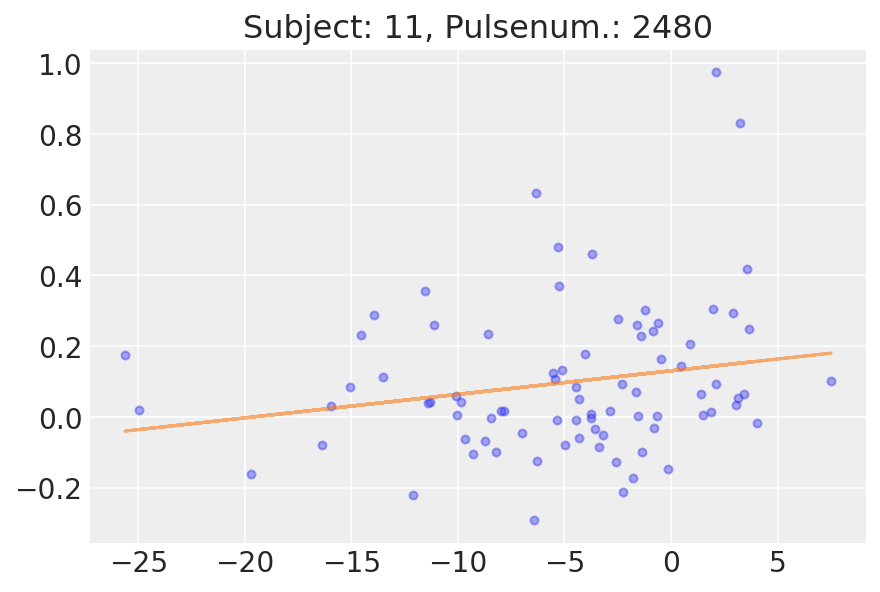

11


Text(0.5, 1.0, 'Subject: 12, Pulsenum.: 3720')

<Figure size 432x288 with 0 Axes>

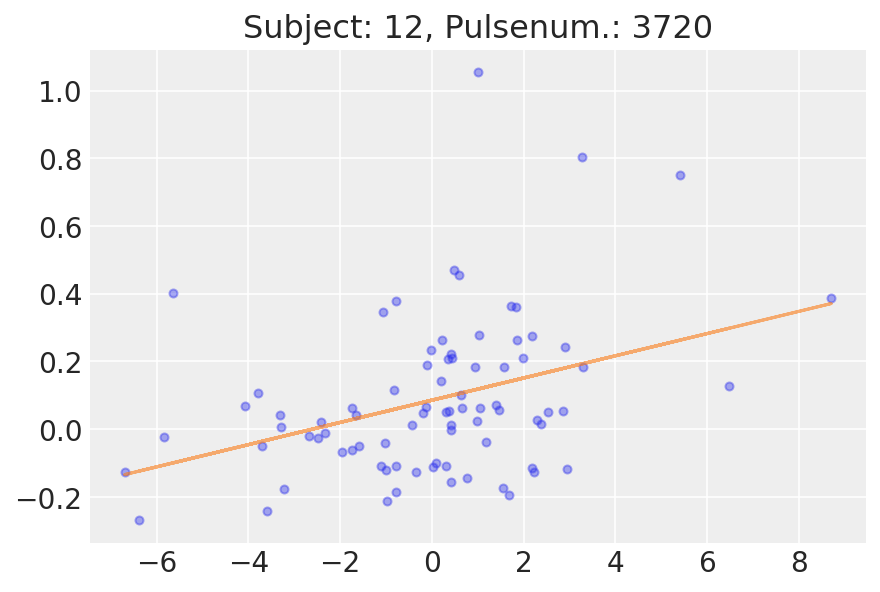

12


Text(0.5, 1.0, 'Subject: 13, Pulsenum.: 1810')

<Figure size 432x288 with 0 Axes>

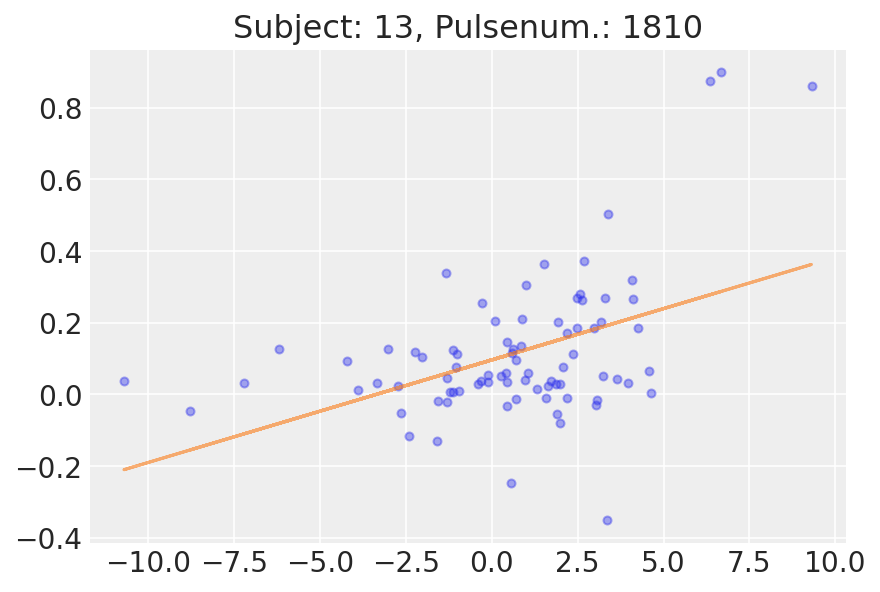

13


Text(0.5, 1.0, 'Subject: 14, Pulsenum.: 2080')

<Figure size 432x288 with 0 Axes>

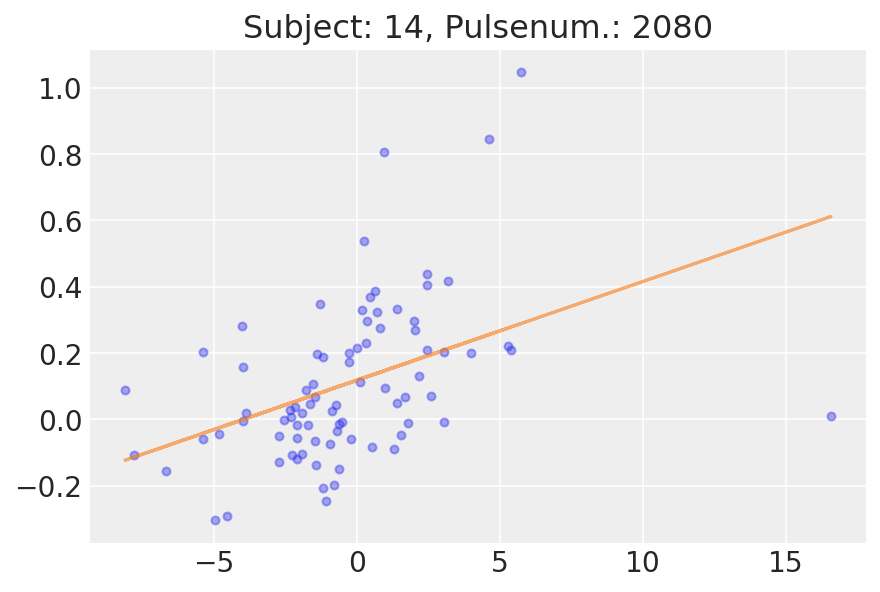

14


Text(0.5, 1.0, 'Subject: 15, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

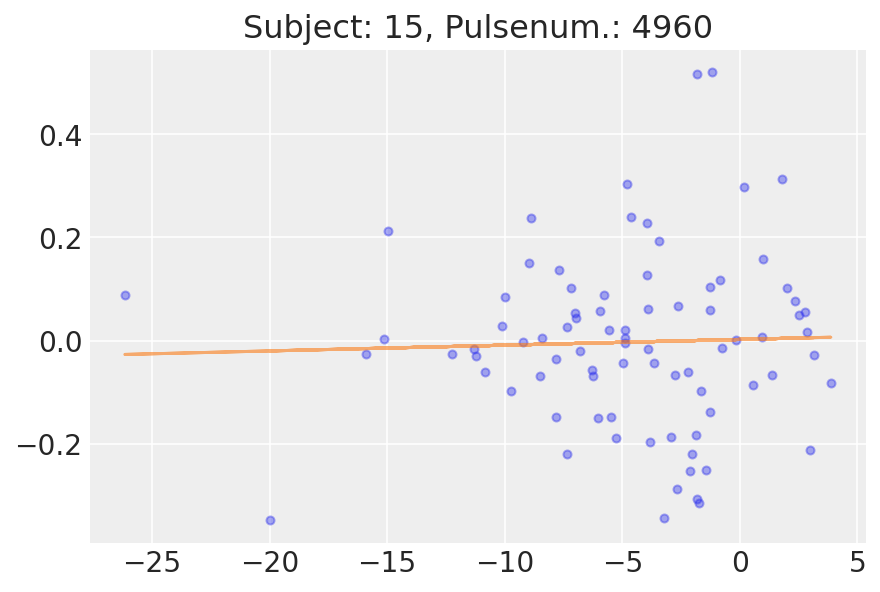

15


Text(0.5, 1.0, 'Subject: 16, Pulsenum.: 3720')

<Figure size 432x288 with 0 Axes>

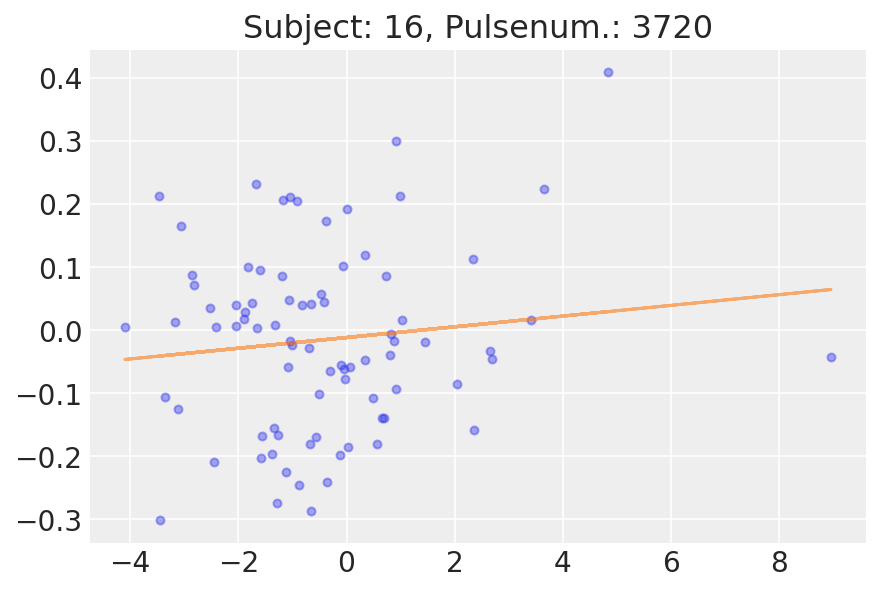

16


Text(0.5, 1.0, 'Subject: 17, Pulsenum.: 3720')

<Figure size 432x288 with 0 Axes>

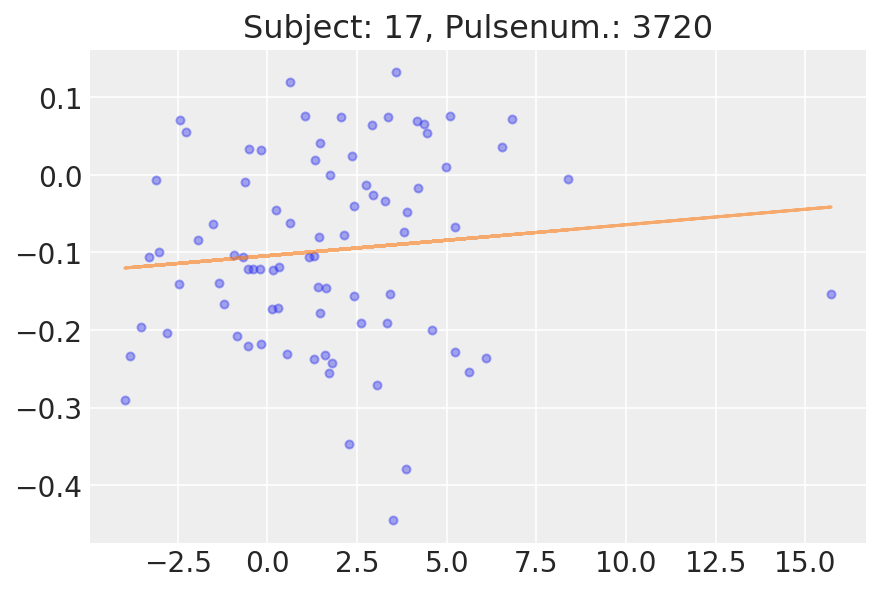

17


Text(0.5, 1.0, 'Subject: 18, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

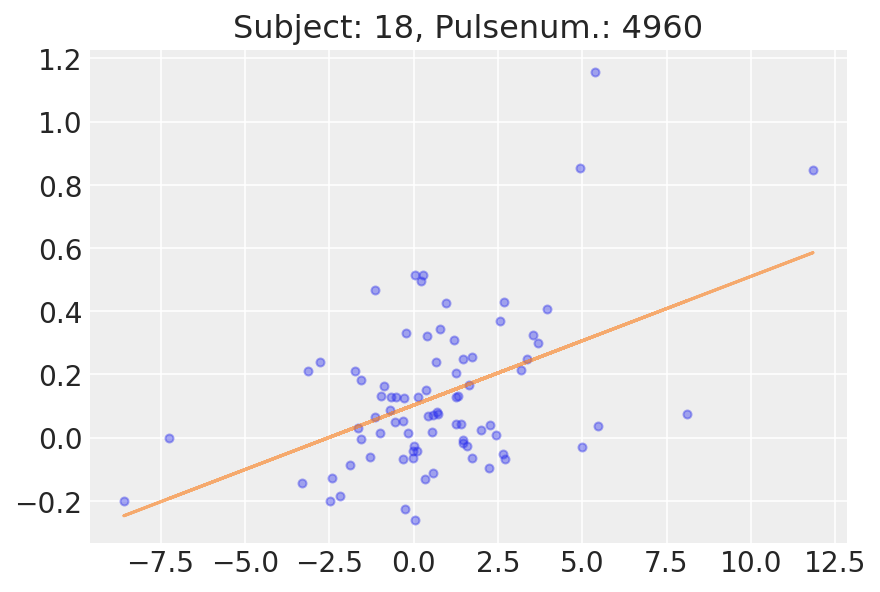

18


Text(0.5, 1.0, 'Subject: 19, Pulsenum.: 3720')

<Figure size 432x288 with 0 Axes>

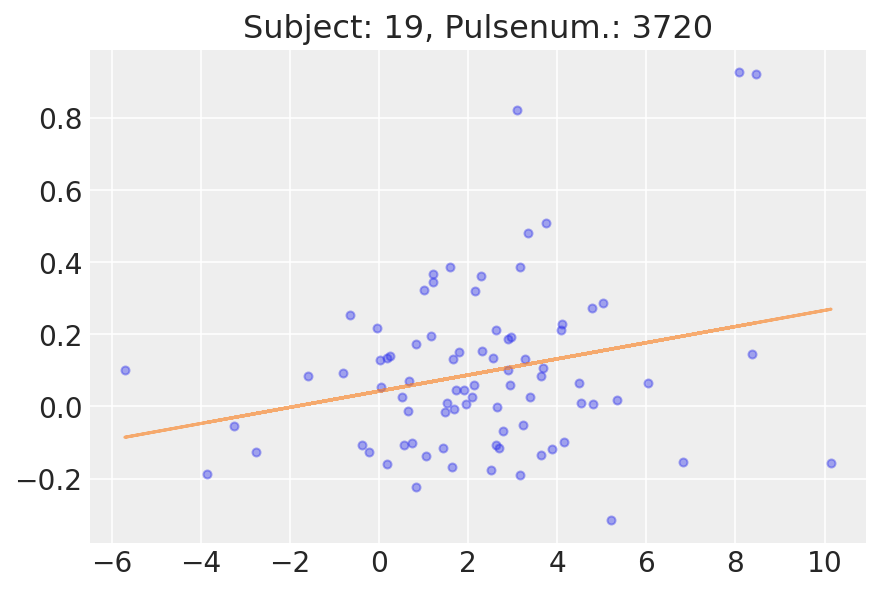

19


Text(0.5, 1.0, 'Subject: 20, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

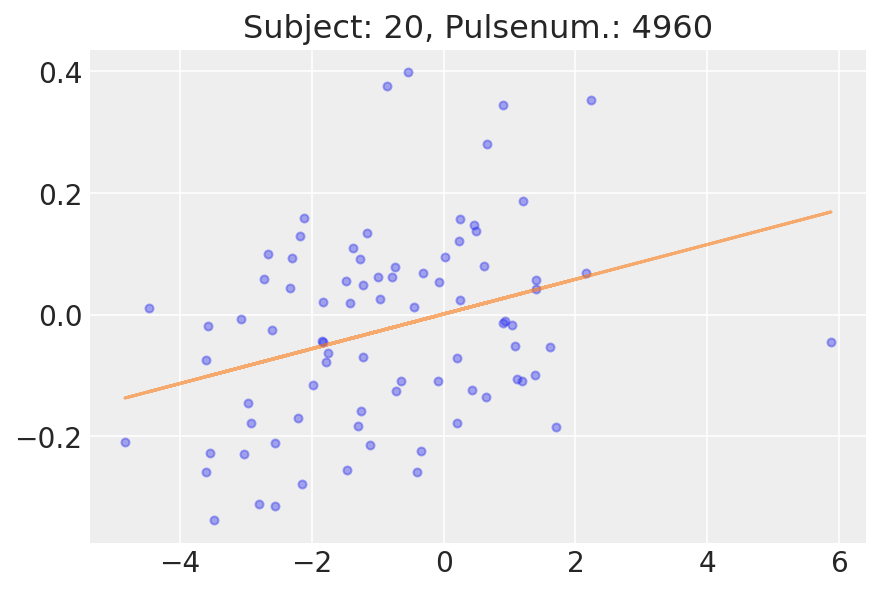

20


Text(0.5, 1.0, 'Subject: 21, Pulsenum.: 1810')

<Figure size 432x288 with 0 Axes>

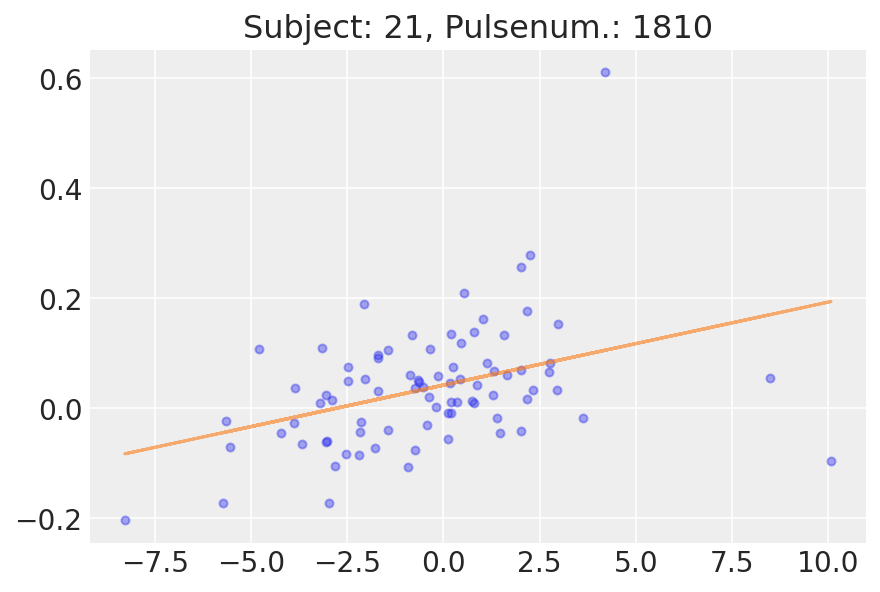

21


Text(0.5, 1.0, 'Subject: 22, Pulsenum.: 3240')

<Figure size 432x288 with 0 Axes>

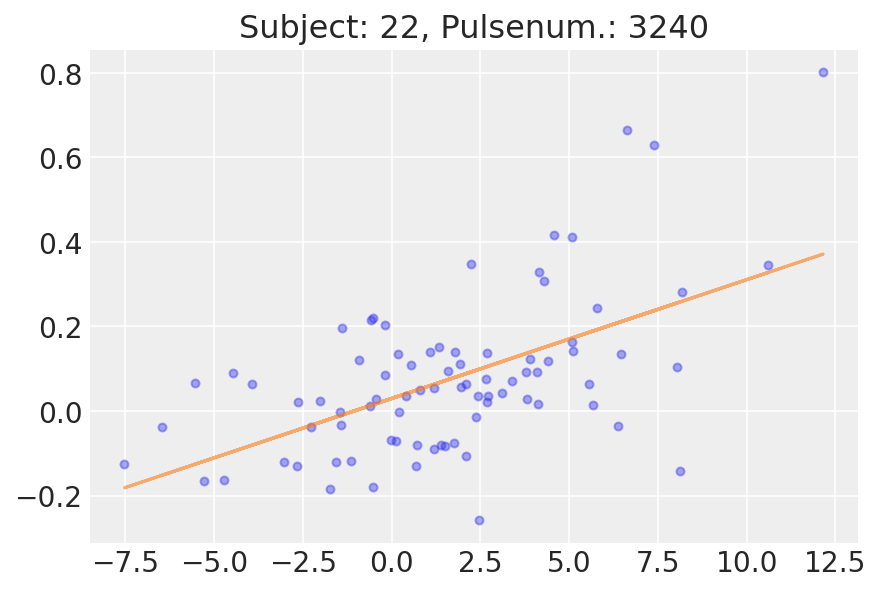

22


Text(0.5, 1.0, 'Subject: 23, Pulsenum.: 7280')

<Figure size 432x288 with 0 Axes>

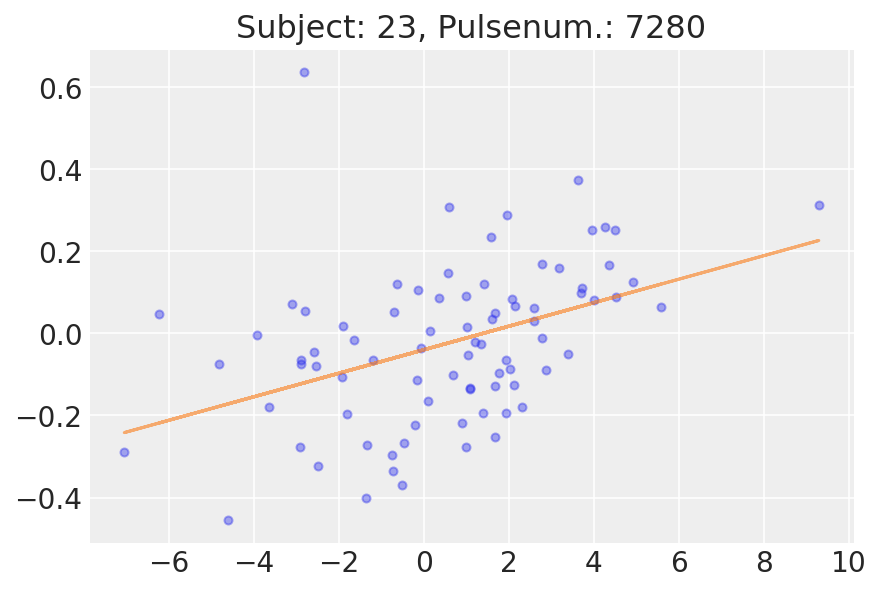

23


Text(0.5, 1.0, 'Subject: 24, Pulsenum.: 3440')

<Figure size 432x288 with 0 Axes>

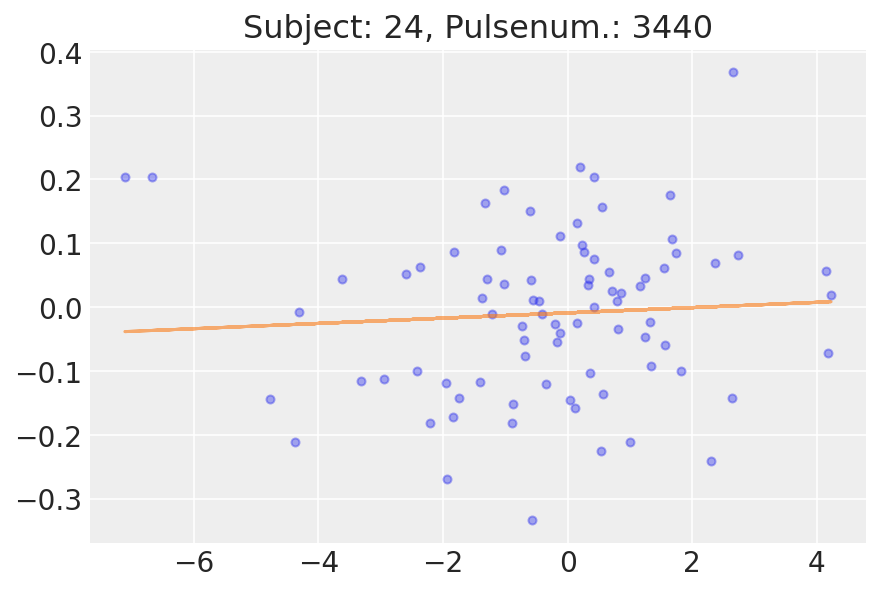

24


Text(0.5, 1.0, 'Subject: 25, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

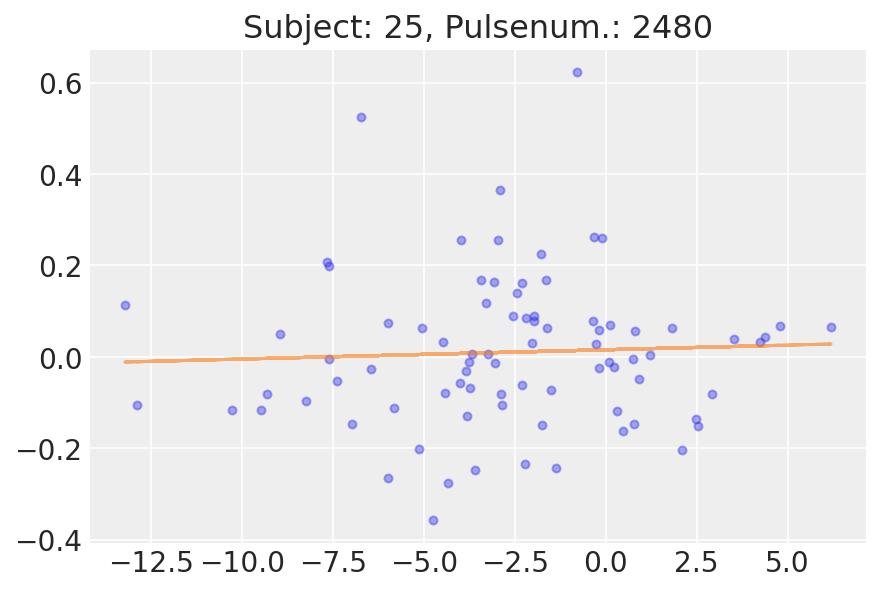

25


Text(0.5, 1.0, 'Subject: 26, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

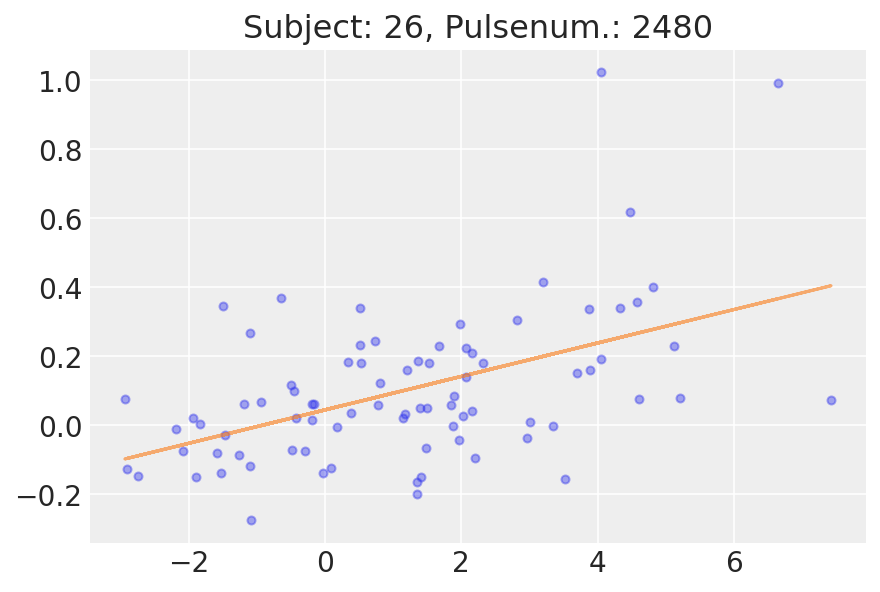

26


Text(0.5, 1.0, 'Subject: 27, Pulsenum.: 3000')

<Figure size 432x288 with 0 Axes>

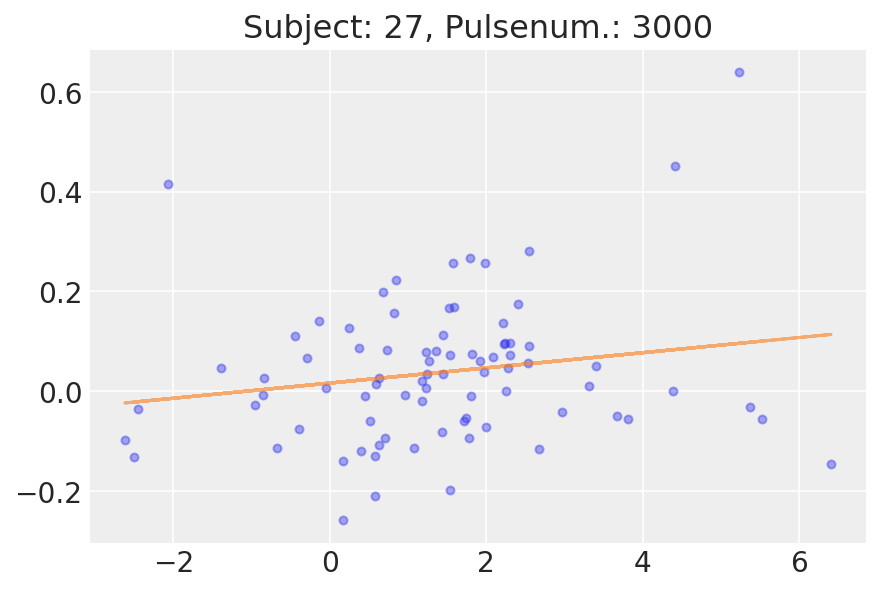

27


Text(0.5, 1.0, 'Subject: 28, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

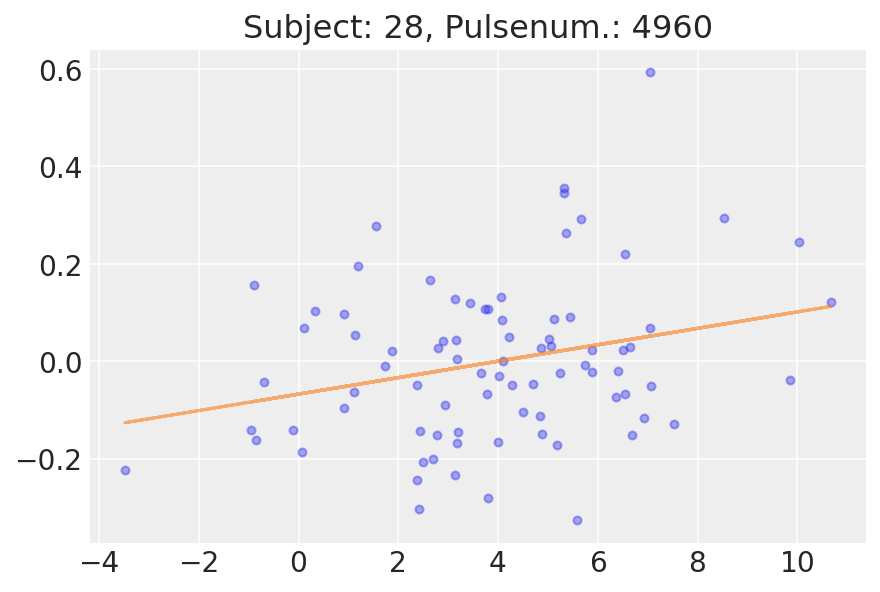

28


Text(0.5, 1.0, 'Subject: 29, Pulsenum.: 2550')

<Figure size 432x288 with 0 Axes>

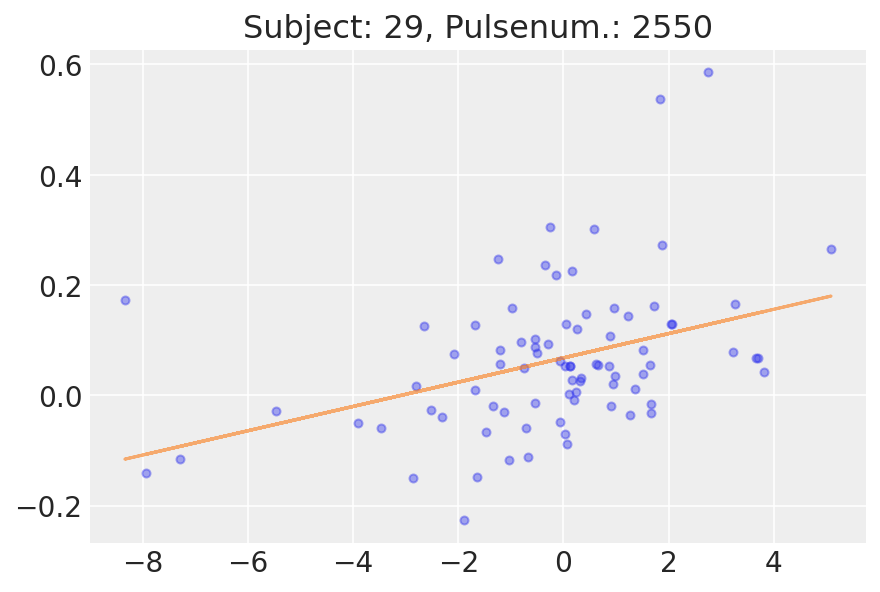

29


Text(0.5, 1.0, 'Subject: 30, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

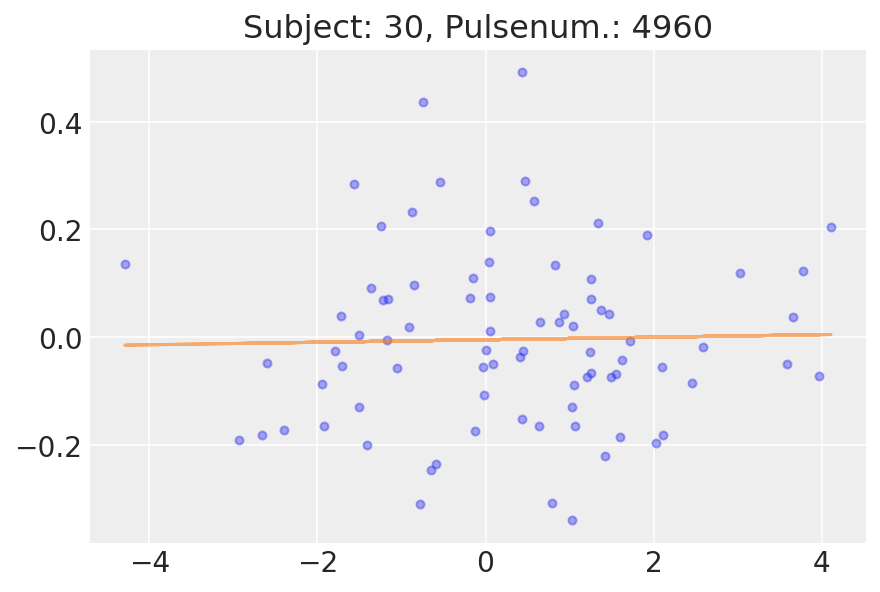

30


Text(0.5, 1.0, 'Subject: 31, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

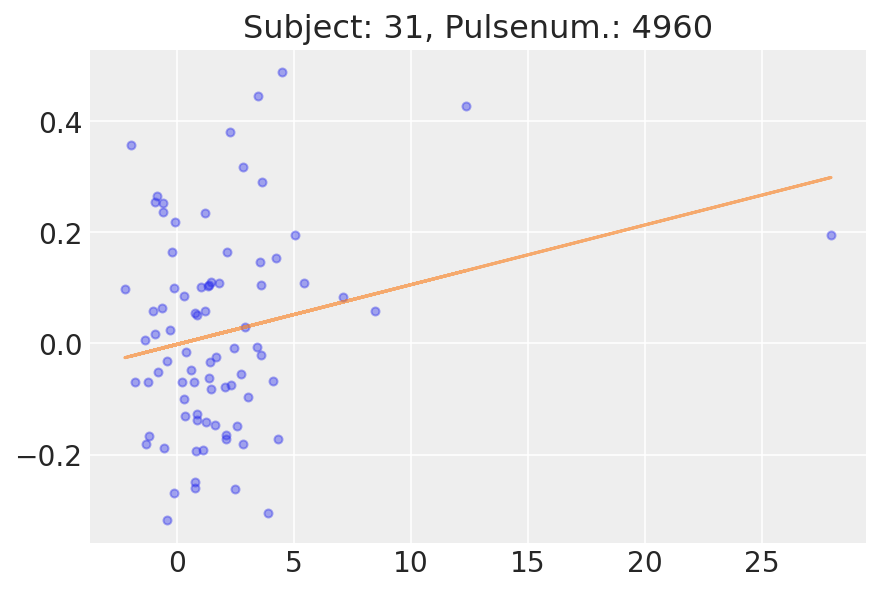

31


Text(0.5, 1.0, 'Subject: 32, Pulsenum.: 3120')

<Figure size 432x288 with 0 Axes>

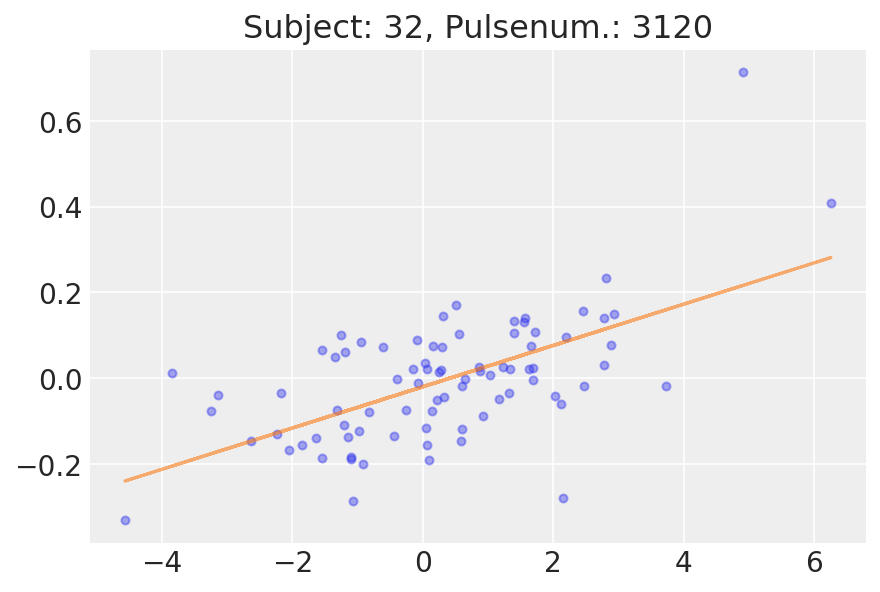

32


Text(0.5, 1.0, 'Subject: 33, Pulsenum.: 3920')

<Figure size 432x288 with 0 Axes>

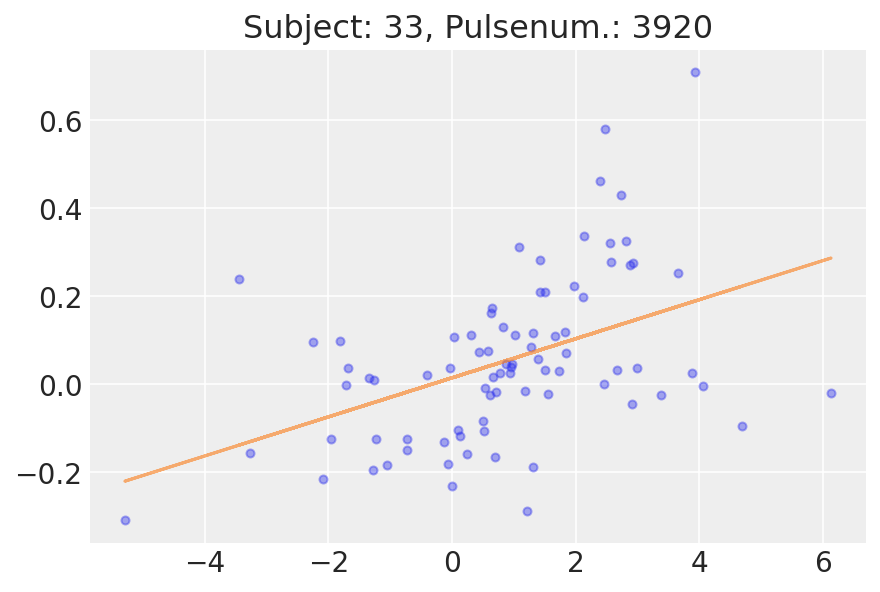

33


Text(0.5, 1.0, 'Subject: 34, Pulsenum.: 1240')

<Figure size 432x288 with 0 Axes>

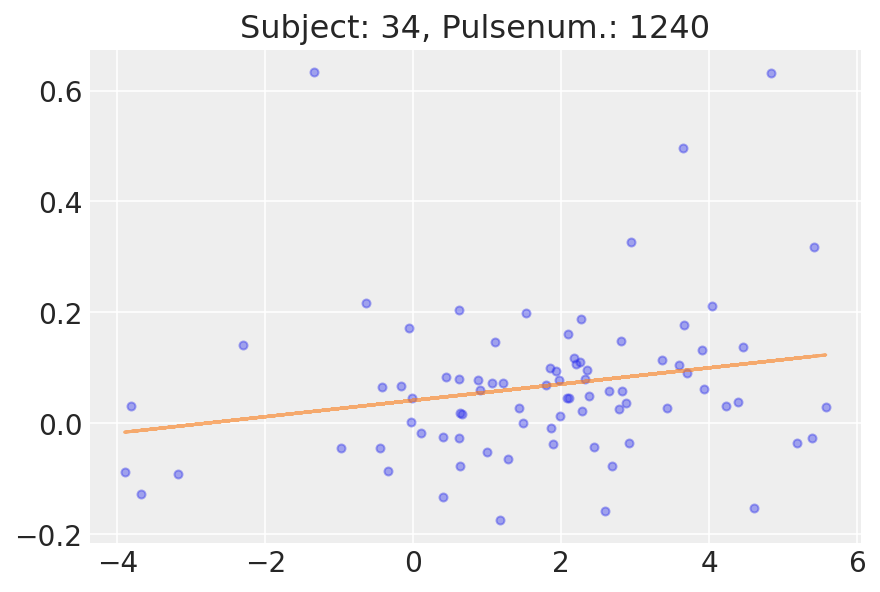

34


Text(0.5, 1.0, 'Subject: 35, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

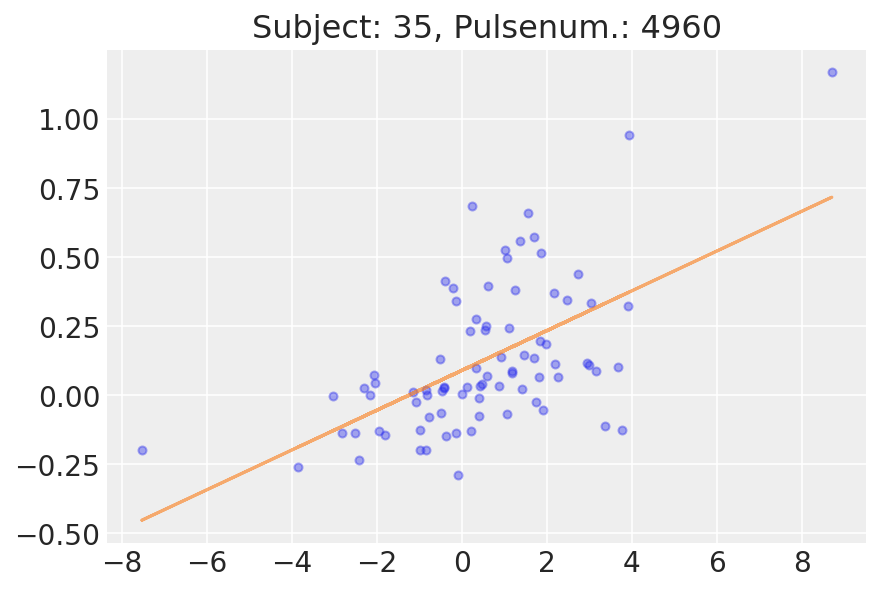

35


Text(0.5, 1.0, 'Subject: 36, Pulsenum.: 9920')

<Figure size 432x288 with 0 Axes>

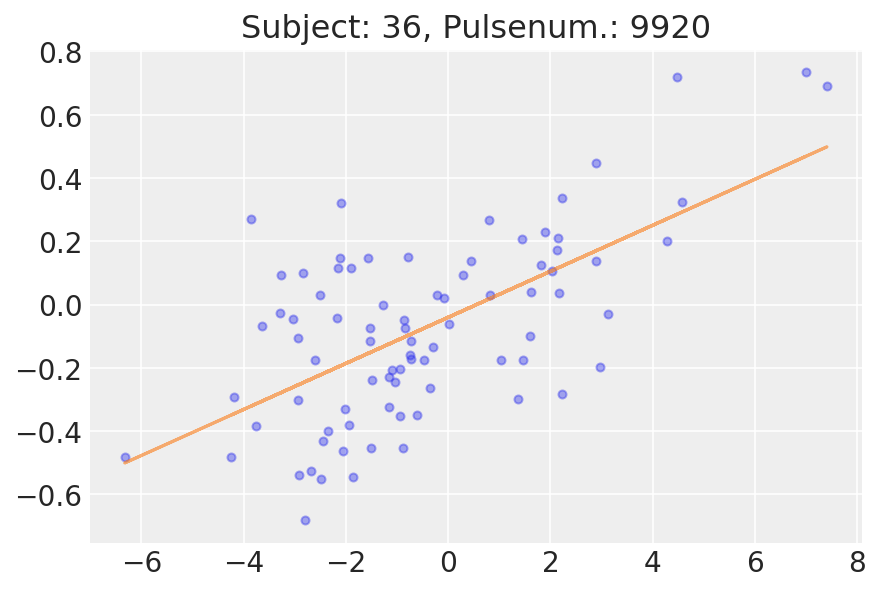

36


Text(0.5, 1.0, 'Subject: 37, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

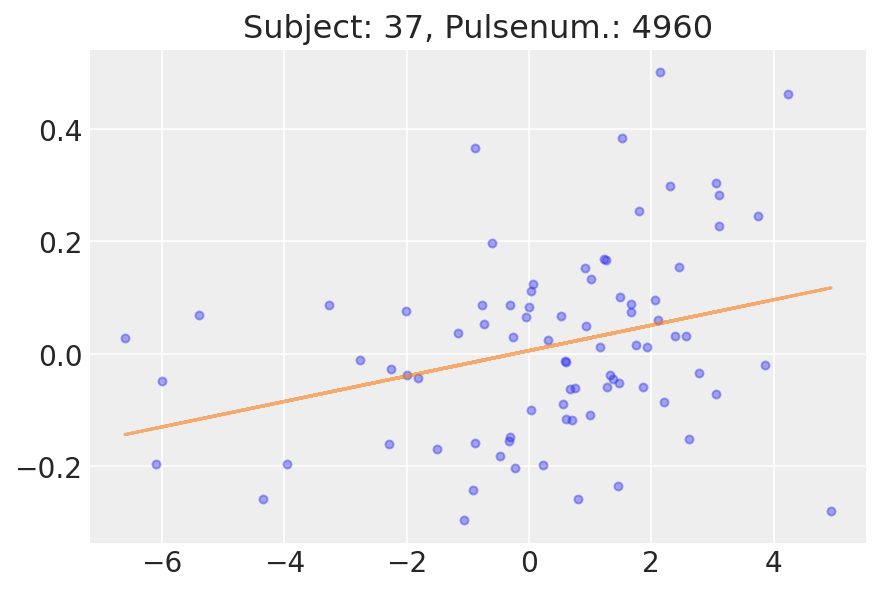

37


Text(0.5, 1.0, 'Subject: 38, Pulsenum.: 3720')

<Figure size 432x288 with 0 Axes>

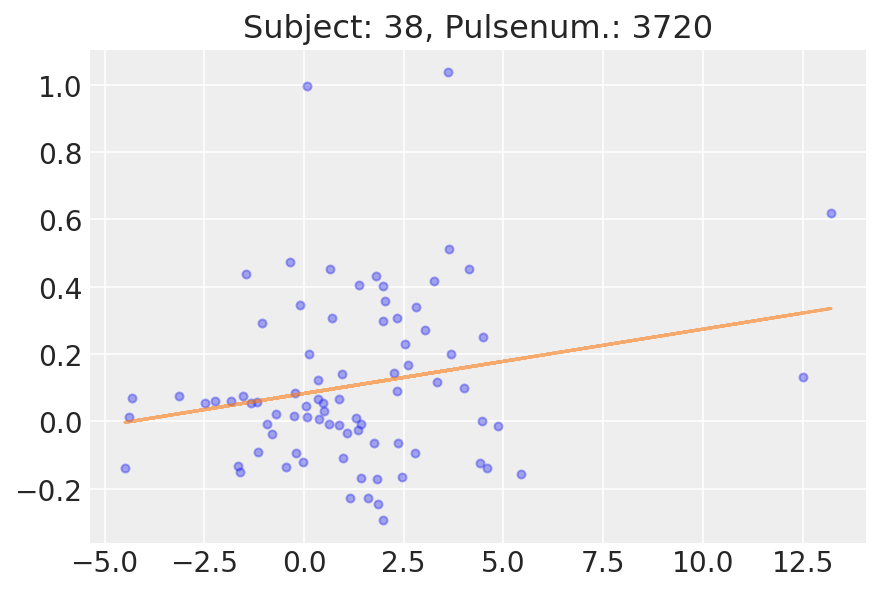

38


Text(0.5, 1.0, 'Subject: 39, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

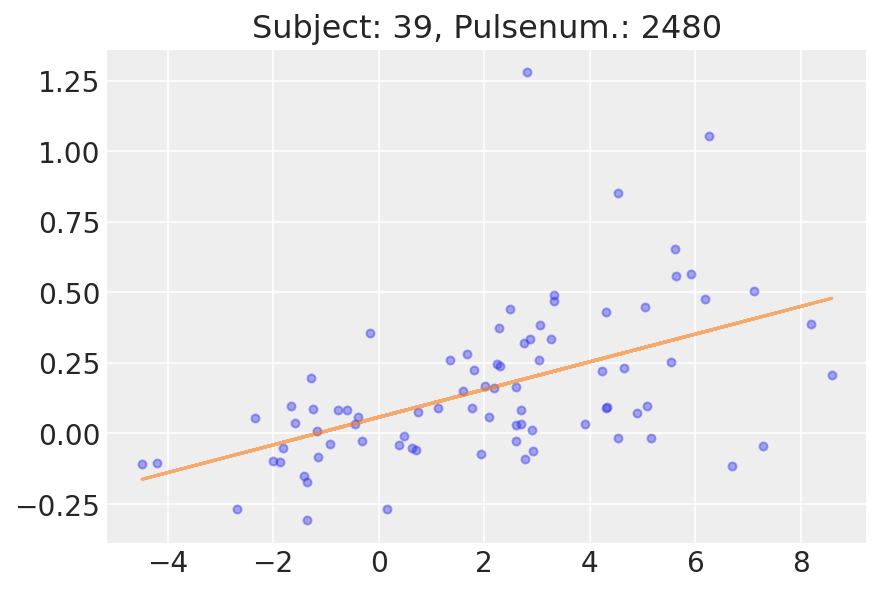

39


Text(0.5, 1.0, 'Subject: 40, Pulsenum.: 8080')

<Figure size 432x288 with 0 Axes>

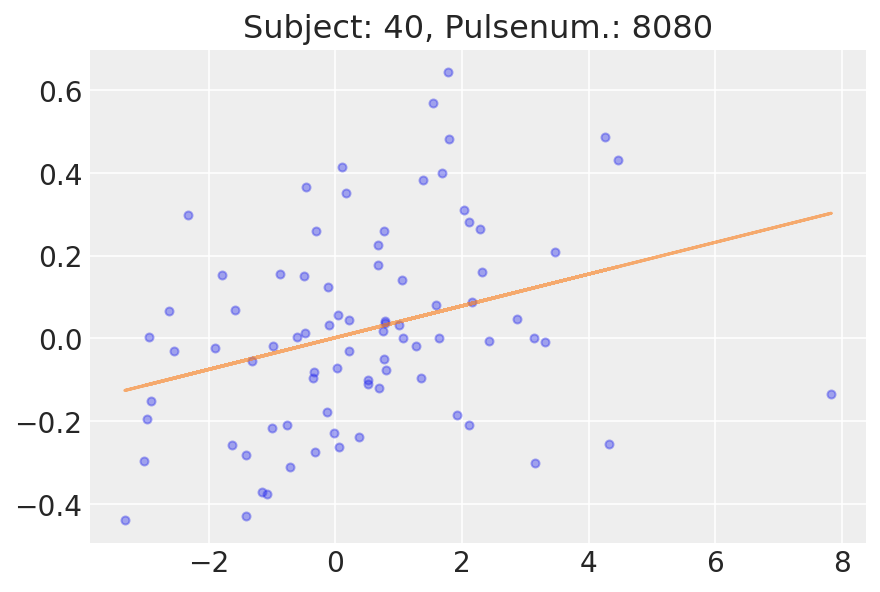

40


Text(0.5, 1.0, 'Subject: 41, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

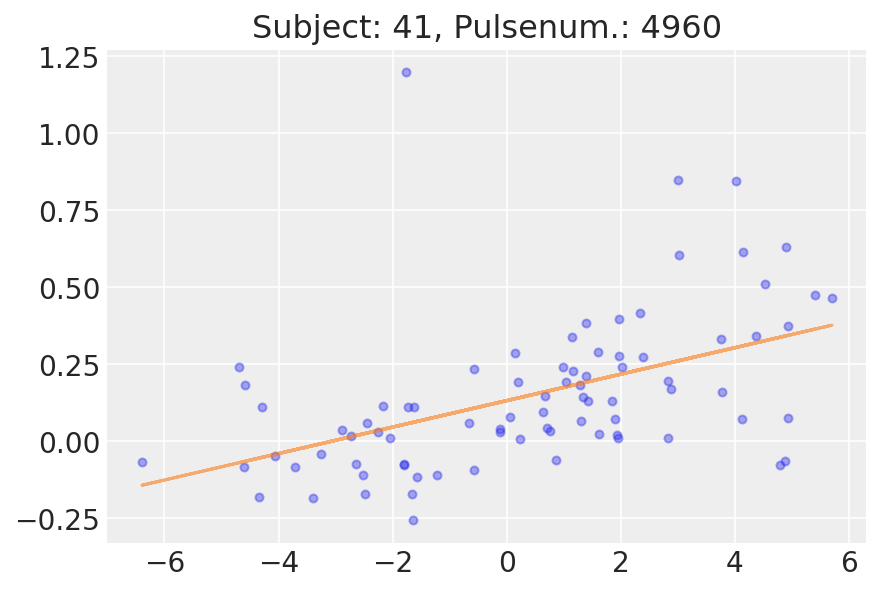

41


Text(0.5, 1.0, 'Subject: 42, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

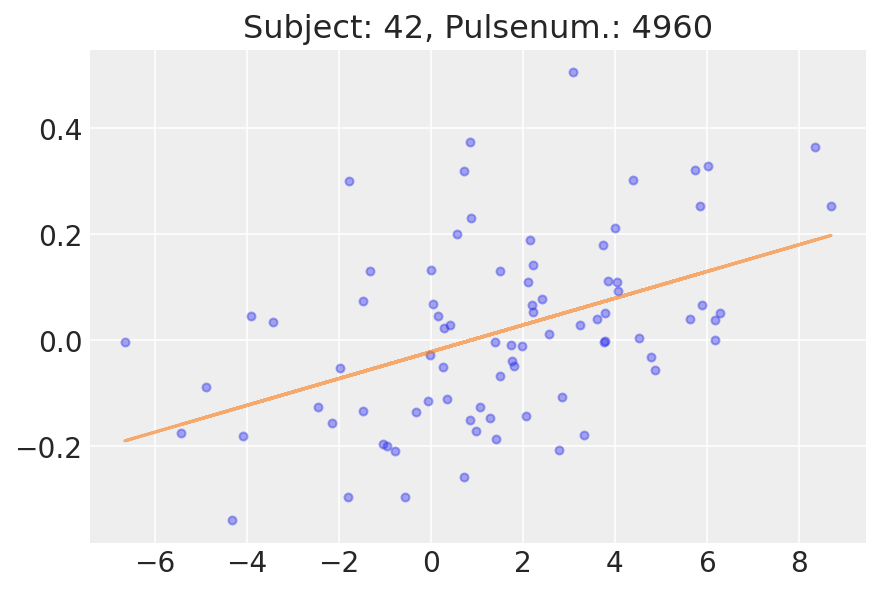

42


Text(0.5, 1.0, 'Subject: 43, Pulsenum.: 5920')

<Figure size 432x288 with 0 Axes>

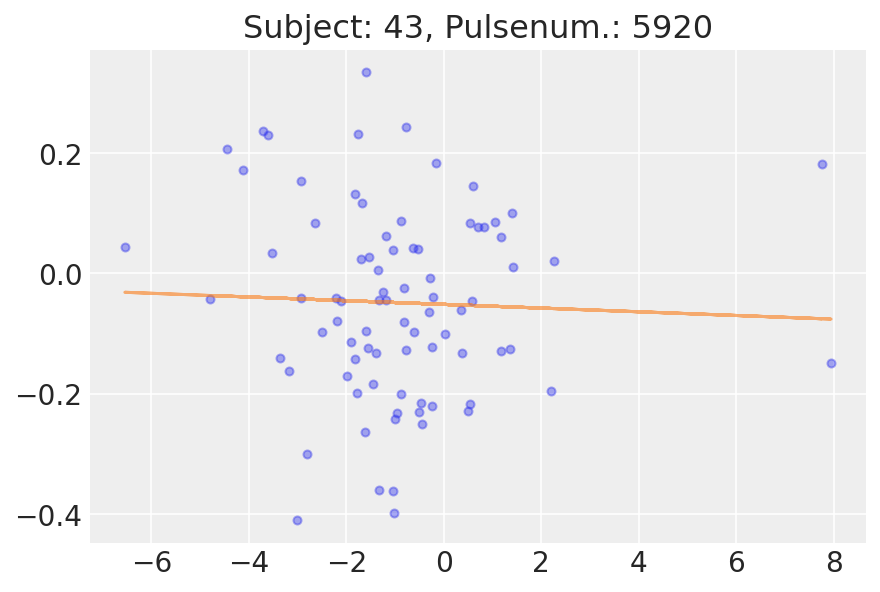

43


Text(0.5, 1.0, 'Subject: 44, Pulsenum.: 9920')

<Figure size 432x288 with 0 Axes>

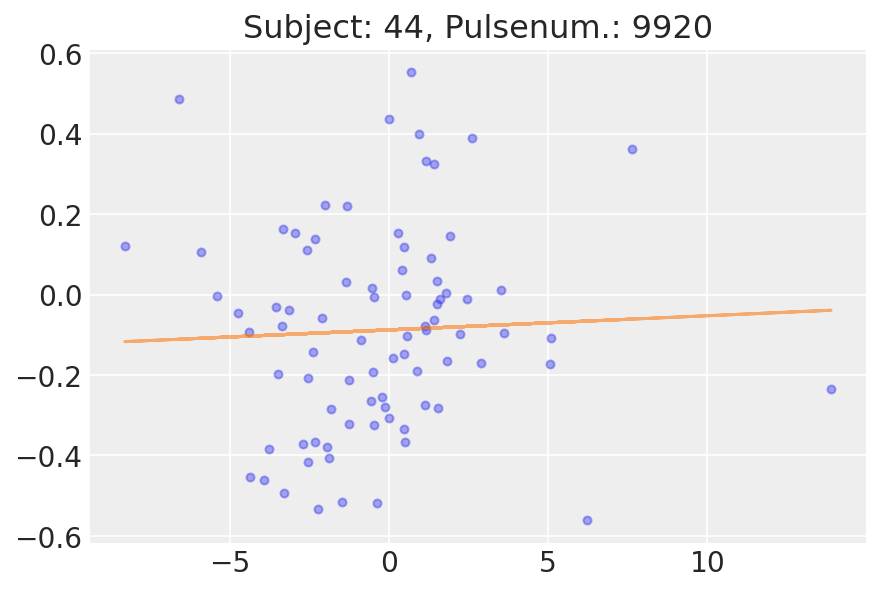

44


Text(0.5, 1.0, 'Subject: 45, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

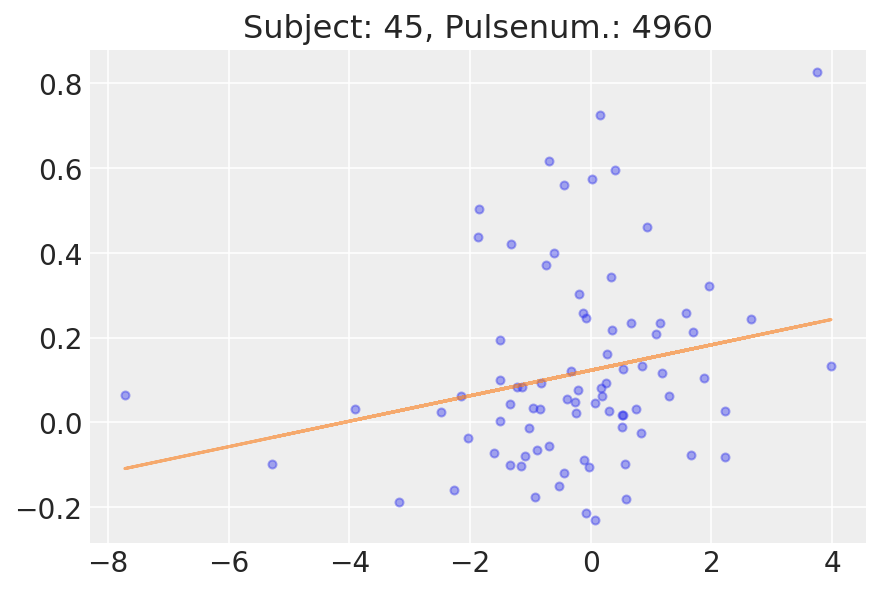

45


Text(0.5, 1.0, 'Subject: 46, Pulsenum.: 3440')

<Figure size 432x288 with 0 Axes>

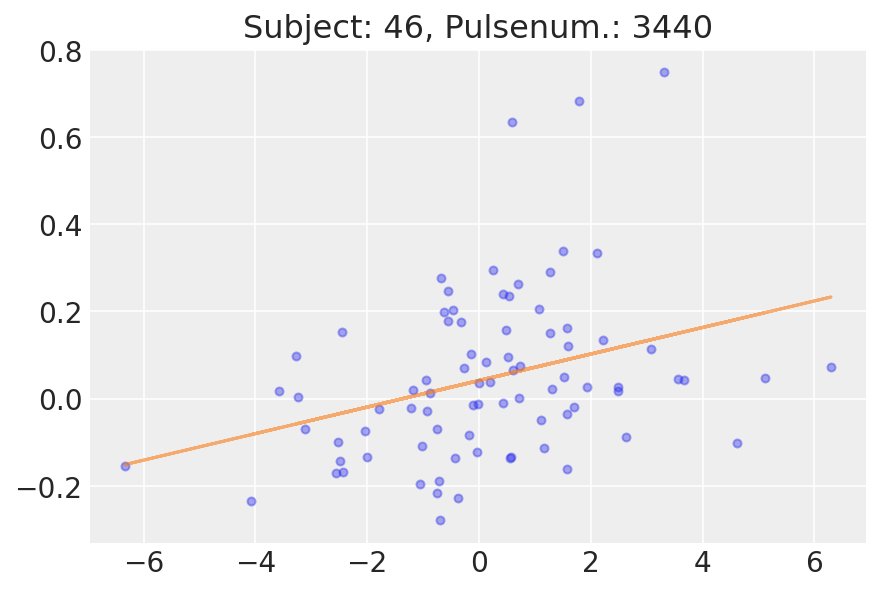

46


Text(0.5, 1.0, 'Subject: 47, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

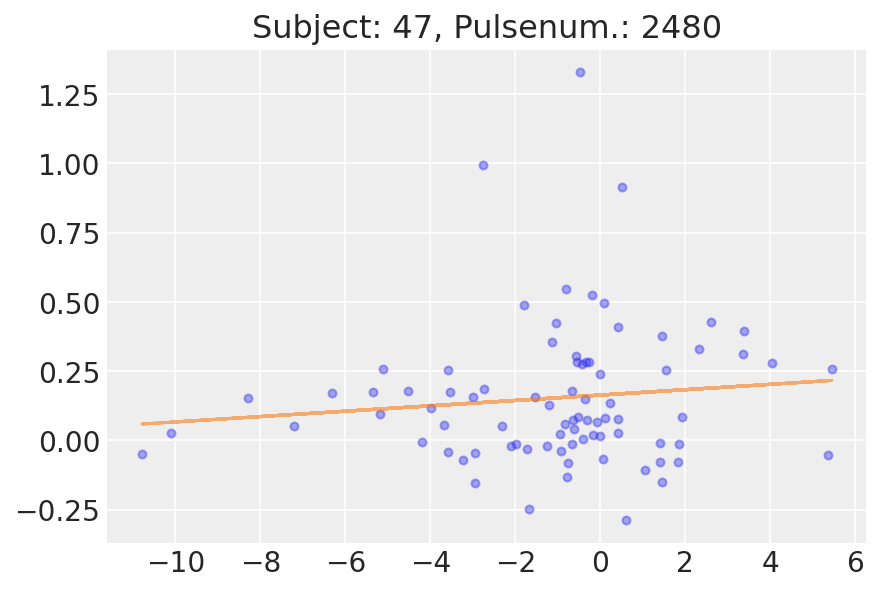

47


Text(0.5, 1.0, 'Subject: 48, Pulsenum.: 2480')

<Figure size 432x288 with 0 Axes>

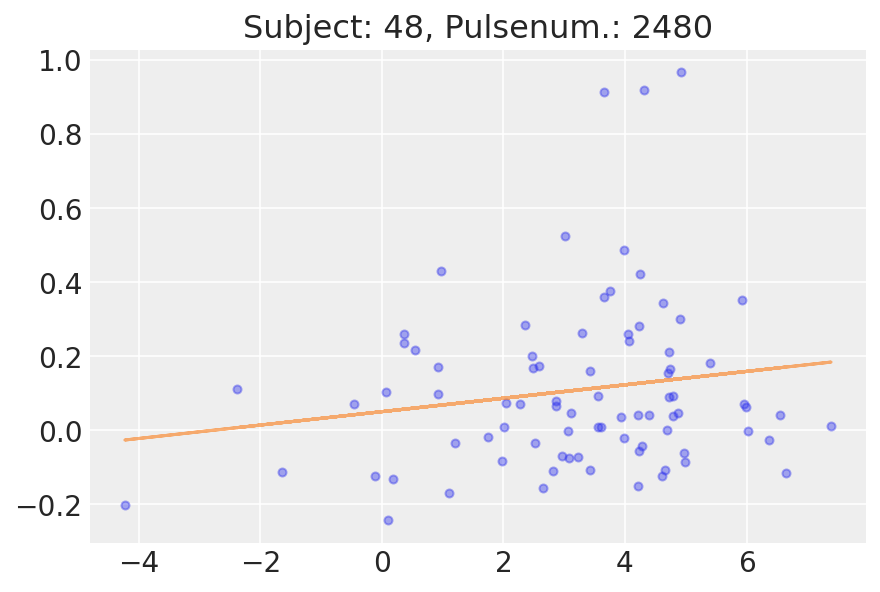

48


Text(0.5, 1.0, 'Subject: 49, Pulsenum.: 4960')

<Figure size 432x288 with 0 Axes>

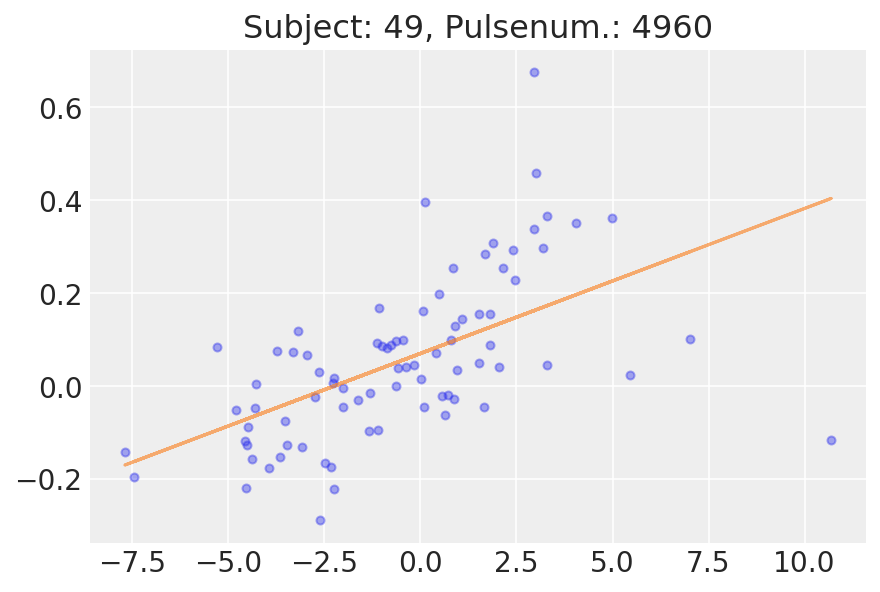

49


Text(0.5, 1.0, 'Subject: 50, Pulsenum.: 6880')

<Figure size 432x288 with 0 Axes>

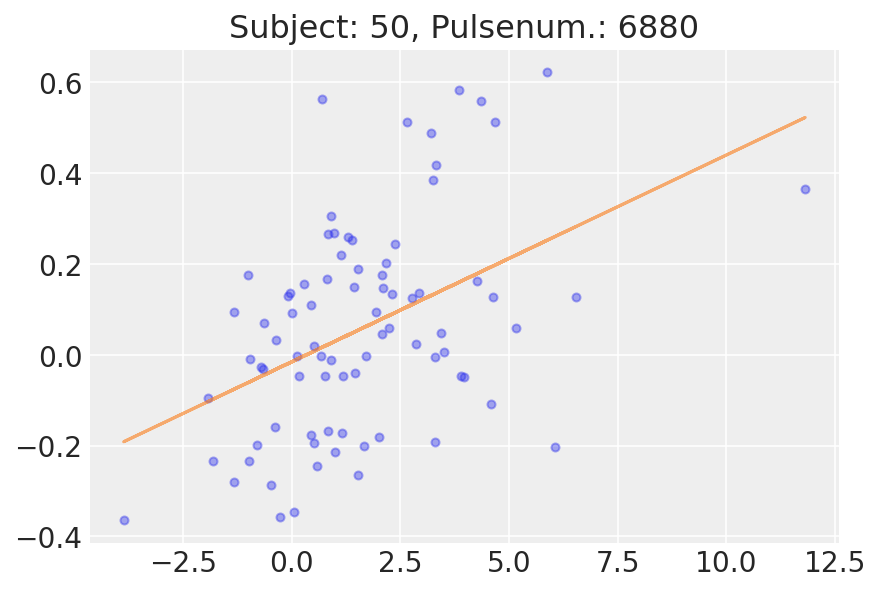

50


In [1149]:

for i in range(51):
  plt.clf()
  _, ax = plt.subplots()
  mreg=i
  ix = np.where(nmdata.sbj==mreg)[0]
  if (ix.size!=0):
    ax.plot(nmdata.dvol.iloc[ix], ppc["V"].mean(0)[ix], "o", ms=4, alpha=0.4, label="Data") 
    m, b = np.polyfit(nmdata.dvol.iloc[ix], ppc["V"].mean(0)[ix],1)
    ax.plot(nmdata.dvol.iloc[ix], m*nmdata.dvol.iloc[ix]+b, label="Mean outcome", alpha=0.6)
    ax.set_title('Subject: ' + str(i) + ', Pulsenum.: ' + str(nmdata.pulsenumber.iloc[ix].values[0]))
    #plt.savefig('./Abbott/testfig_'+str(i)+'.pdf')
    plt.show()
  print(i)

In [1165]:
hipdata = nmdata.iloc[np.where((nmdata.Region_Label=='Right-Hippocampus') | (nmdata.Region_Label=='Left-Hippocampus'))].copy()
hipdata.sbj
hipdata['Max_Intensity.1']

37       0
79       0
121      1
163      1
205      2
        ..
4111    48
4153    49
4195    49
4237    50
4279    50
Name: sbj, Length: 102, dtype: int64

37       41.310093
79       73.851601
121      57.746021
163     102.223709
205      54.250652
           ...    
4111    123.099869
4153     57.848705
4195     90.387749
4237     53.307381
4279     84.840675
Name: Max_Intensity.1, Length: 102, dtype: float64

In [1167]:
with pm.Model() as m_2_1:
    vol=pm.Data('vol', hipdata.dvol.values)
    ef=pm.Data('ef', hipdata['Max_Intensity.1'].values)
    pn=pm.Data('pn', hipdata.pulsenumber.values)
    sbj=pm.Data('sbj',hipdata.sbj.values)

    mb = pm.Normal('mb', 0, 1.0)
    sb = pm.Exponential('sb', 1)
    a = pm.Normal("a", 0, 1.5)
    b = pm.Normal("b", mb, sb, shape=51)
    
    
    nu = pm.Exponential('nu', 1/30)
    sigma = pm.Exponential('sigma', 1)
    
    #mu = pm.Deterministic("mu", a + b * ef + c * pulsen + d * ef * pulsen)
    mu = pm.Deterministic("mu",a + b[sbj] * ef*pn)
 
    V = pm.StudentT("V",nu, mu, sigma, observed=vol)
    
    trace_2_1 = pm.sample(random_seed=RANDOM_SEED)
    idata_2_1 = az.from_pymc3(trace_2_1)

/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, nu, b, a, sb, mb]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 349 seconds.
The acceptance probability does not match the target. It is 0.6202277839579133, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The acceptance probability does not match the target. It is 0.5378392218178956, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some

In [1169]:
with m_2_1:
    ppc = pm.sample_posterior_predictive(
        #trace_1_5, var_names=["ma", "a1", "b1", "V"], random_seed=RANDOM_SEED
        trace_2_1, var_names=["a", "b","nu"], random_seed=RANDOM_SEED
    )

res = az.summary(trace_2_1, var_names=['a','nu','b','mb'], round_to=2)
res
#ez hulyeseg...

Got error No model on context stack. trying to find log_likelihood in translation.
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/arviz/data/io_pymc3_3x.py:98: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,0.02,0.71,-0.78,0.98,0.35,0.27,4.39,11.28,3.59
nu,0.08,0.01,0.08,0.09,0.00,0.00,4.33,11.42,3.92
b[0],0.01,0.40,-0.63,0.41,0.20,0.15,4.52,11.42,3.11
b[1],-0.18,0.52,-1.00,0.27,0.26,0.20,4.38,10.87,3.60
b[2],0.19,0.38,-0.18,0.77,0.19,0.14,4.45,16.20,3.39
...,...,...,...,...,...,...,...,...,...
b[47],-0.01,0.47,-0.54,0.64,0.24,0.18,4.46,18.13,3.31
b[48],0.02,0.42,-0.60,0.58,0.21,0.16,4.31,11.15,4.01
b[49],0.07,0.65,-0.58,0.73,0.32,0.25,4.47,13.40,3.29
b[50],-0.05,0.79,-0.86,0.85,0.39,0.30,4.32,11.12,3.96


Text(0.5, 1.0, 'Sbj: 0[2480][0.3]')

<Figure size 432x288 with 0 Axes>

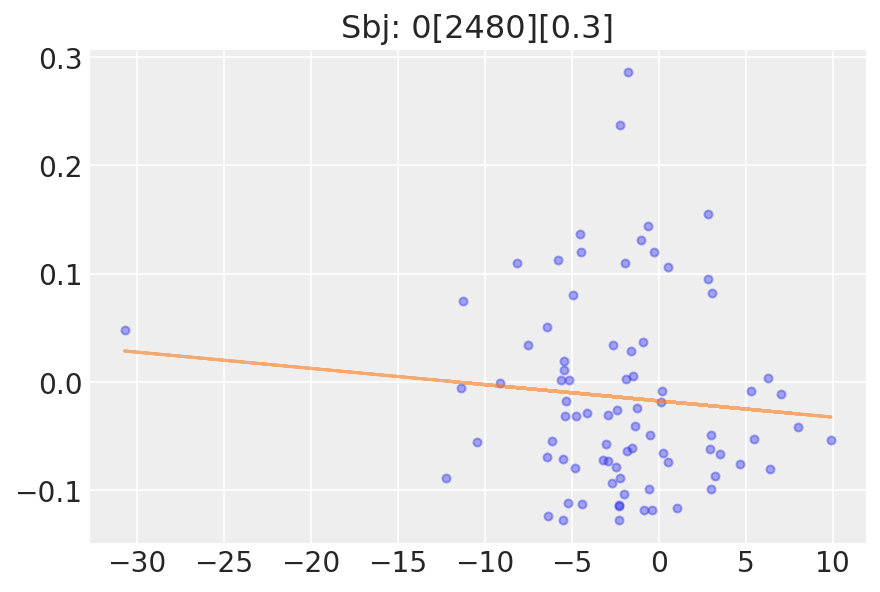

0


Text(0.5, 1.0, 'Sbj: 1[2480][0.3]')

<Figure size 432x288 with 0 Axes>

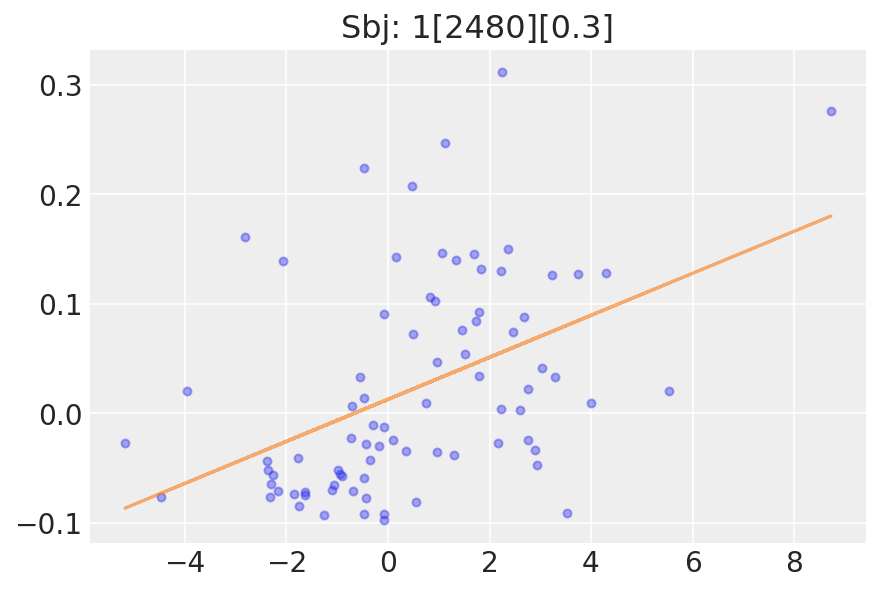

1


Text(0.5, 1.0, 'Sbj: 2[2120][0.41666667]')

<Figure size 432x288 with 0 Axes>

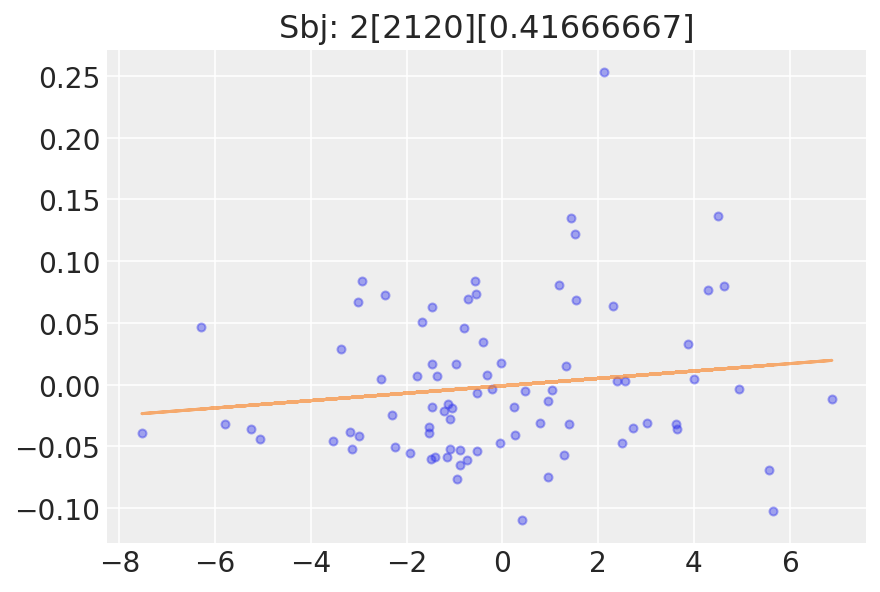

2


Text(0.5, 1.0, 'Sbj: 3[2480][0.3]')

<Figure size 432x288 with 0 Axes>

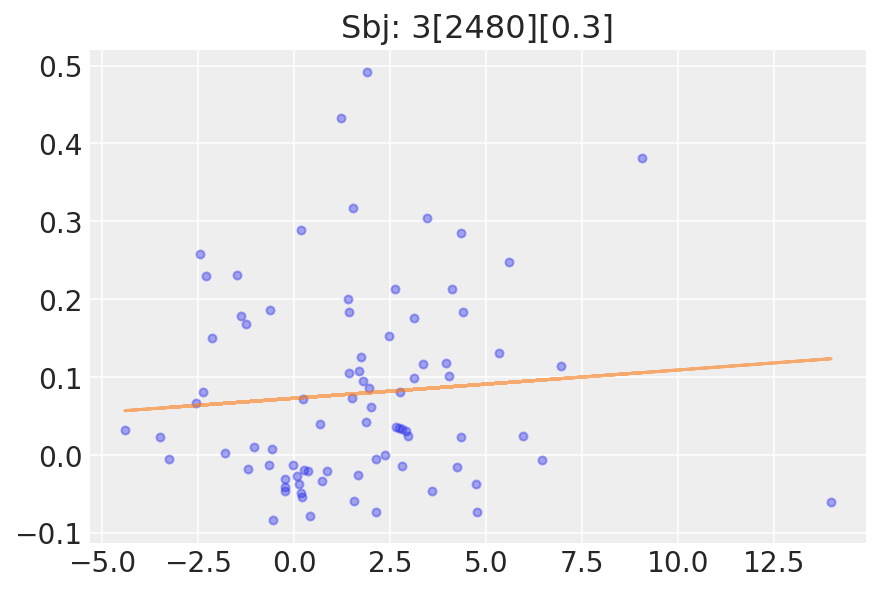

3


Text(0.5, 1.0, 'Sbj: 4[4960][0.3]')

<Figure size 432x288 with 0 Axes>

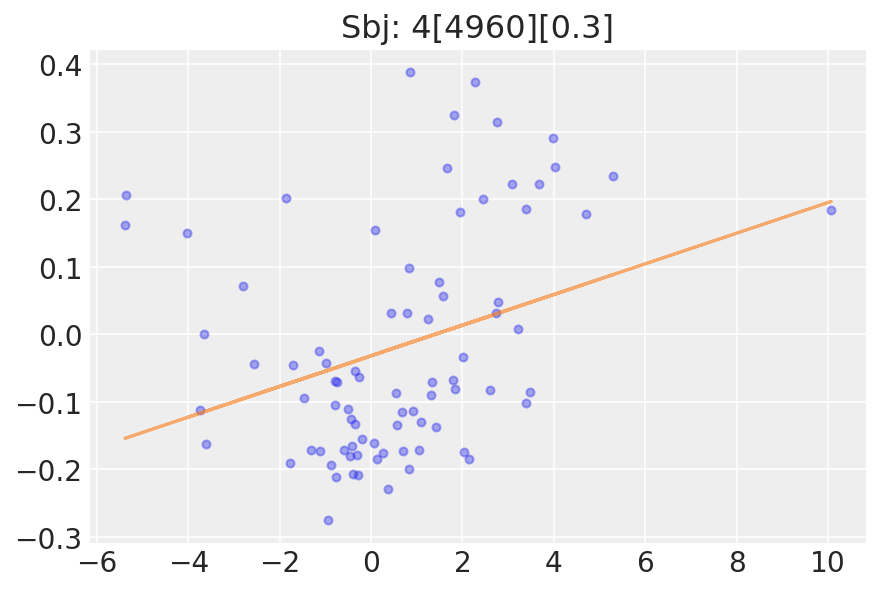

4


Text(0.5, 1.0, 'Sbj: 5[9920][0.3]')

<Figure size 432x288 with 0 Axes>

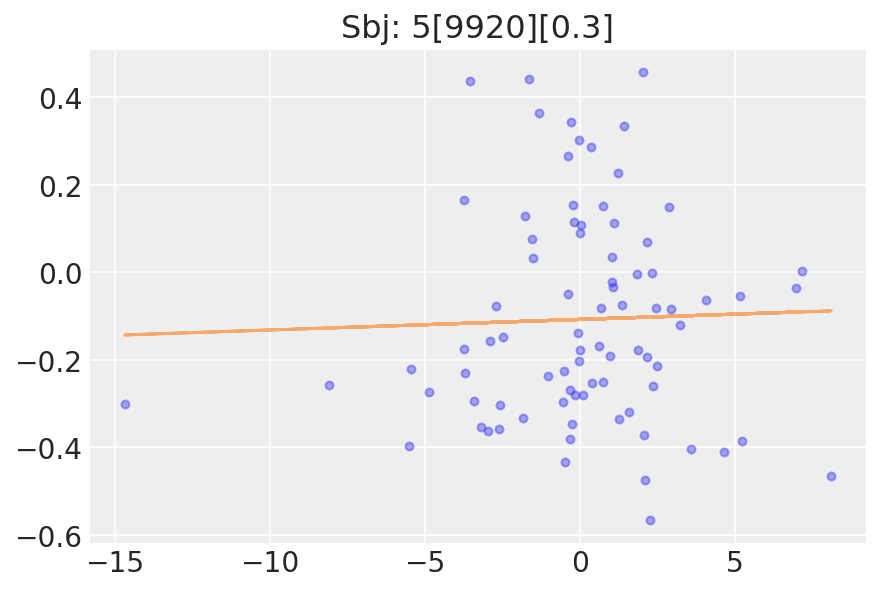

5


Text(0.5, 1.0, 'Sbj: 6[3440][0.3]')

<Figure size 432x288 with 0 Axes>

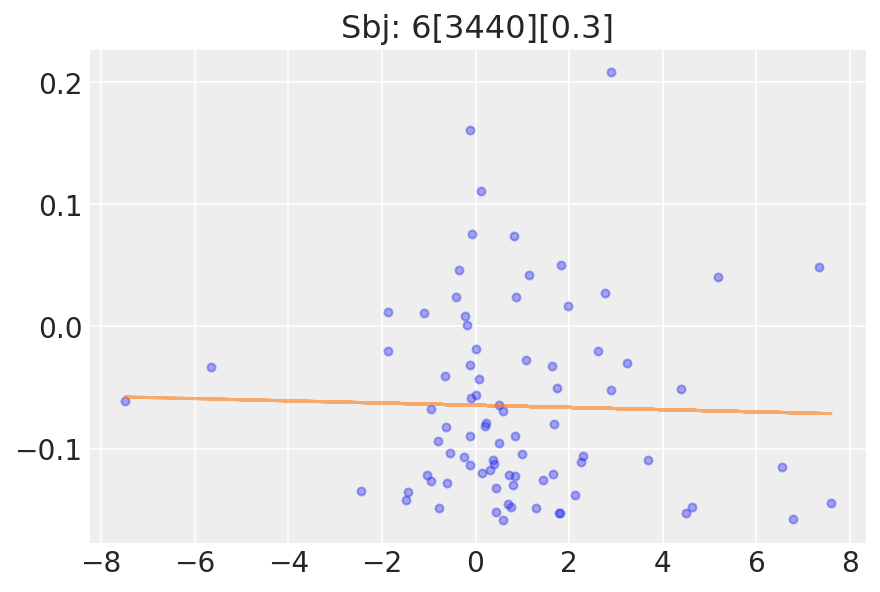

6


Text(0.5, 1.0, 'Sbj: 7[1810][1.]')

<Figure size 432x288 with 0 Axes>

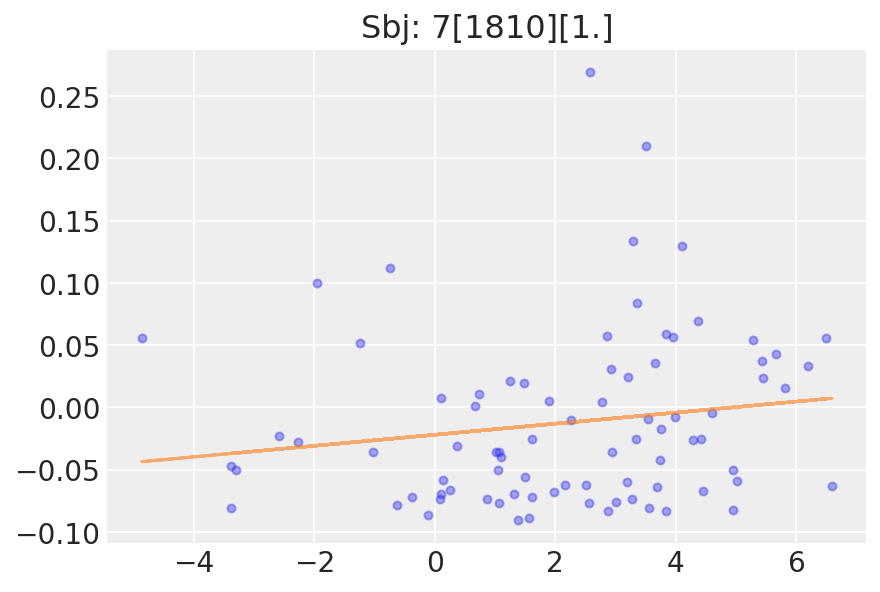

7


Text(0.5, 1.0, 'Sbj: 8[2600][0.41666667]')

<Figure size 432x288 with 0 Axes>

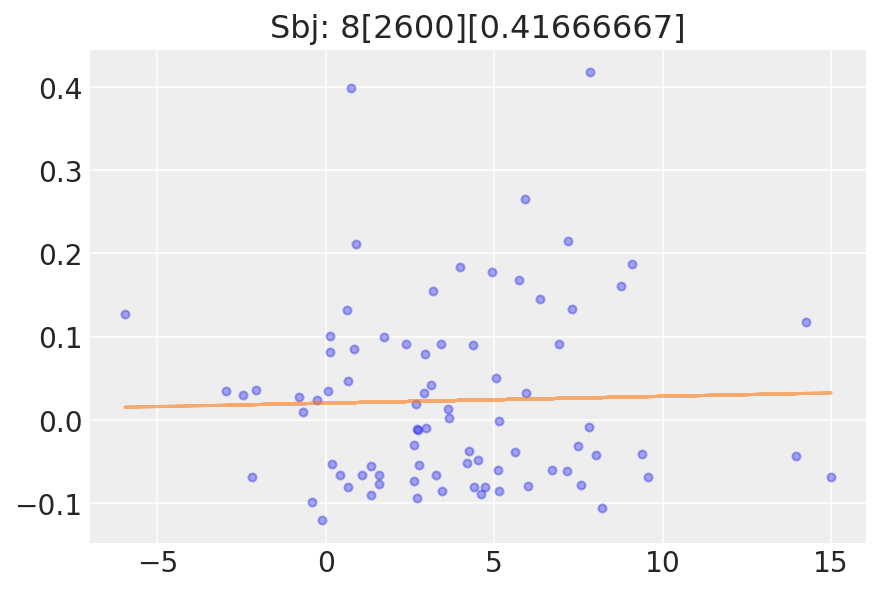

8


Text(0.5, 1.0, 'Sbj: 9[2960][0.3]')

<Figure size 432x288 with 0 Axes>

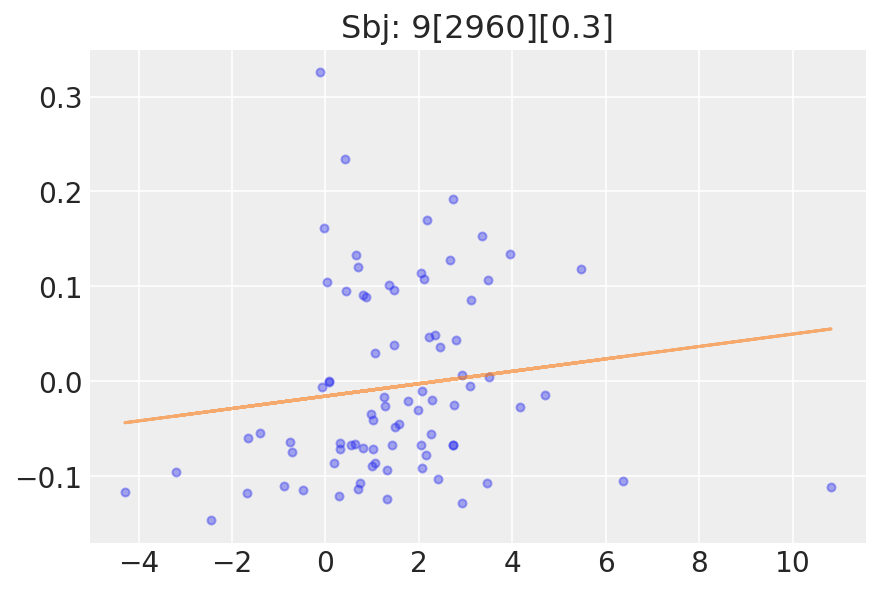

9


Text(0.5, 1.0, 'Sbj: 10[8800][0.3]')

<Figure size 432x288 with 0 Axes>

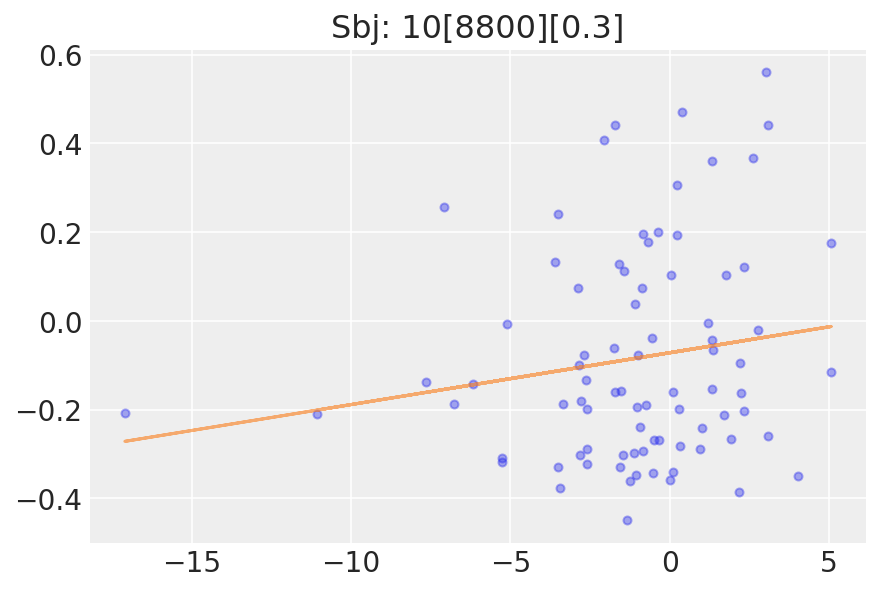

10


Text(0.5, 1.0, 'Sbj: 11[2480][0.3]')

<Figure size 432x288 with 0 Axes>

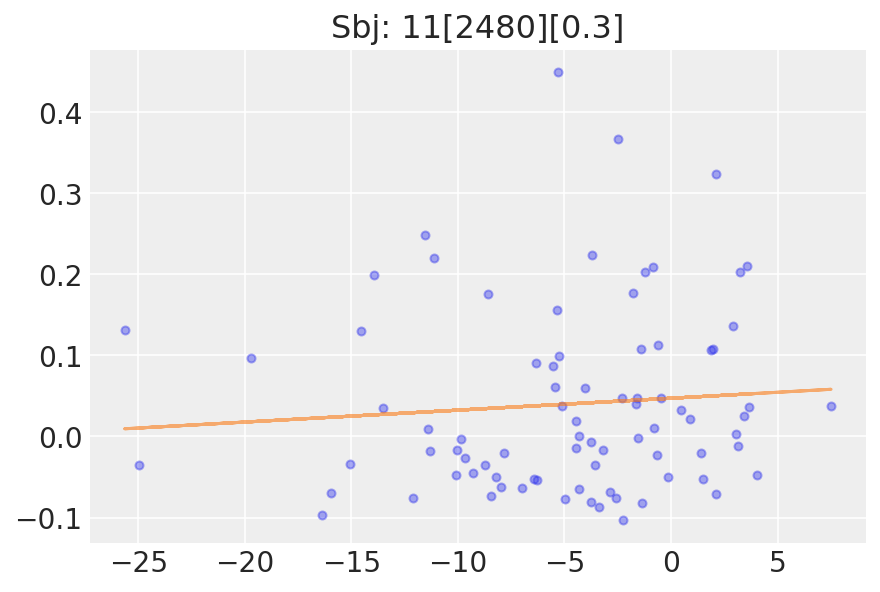

11


Text(0.5, 1.0, 'Sbj: 12[3720][1.]')

<Figure size 432x288 with 0 Axes>

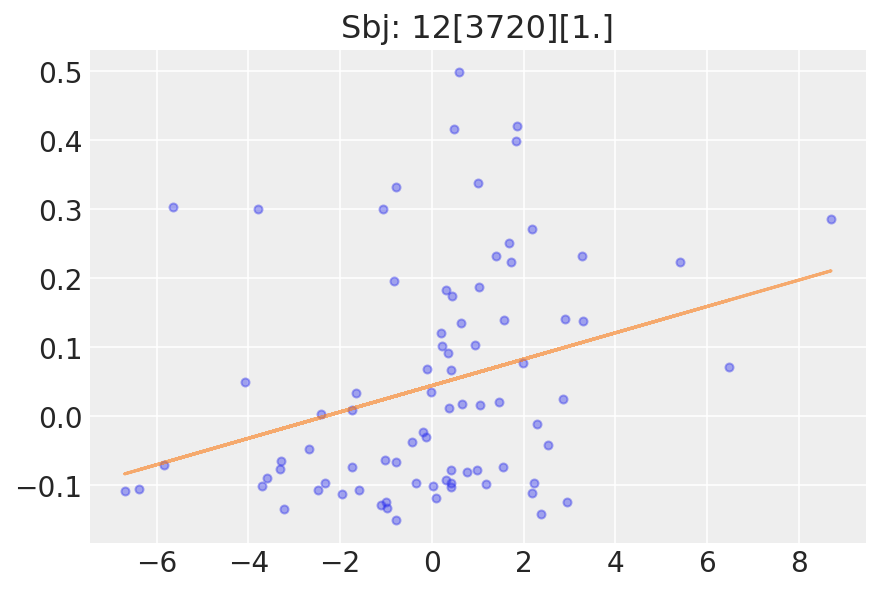

12


Text(0.5, 1.0, 'Sbj: 13[1810][1.]')

<Figure size 432x288 with 0 Axes>

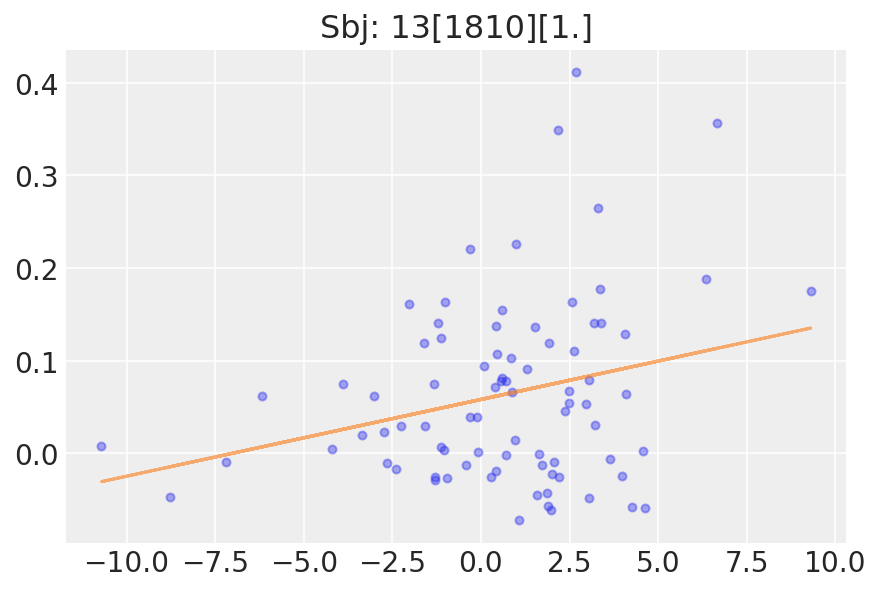

13


Text(0.5, 1.0, 'Sbj: 14[2080][0.3]')

<Figure size 432x288 with 0 Axes>

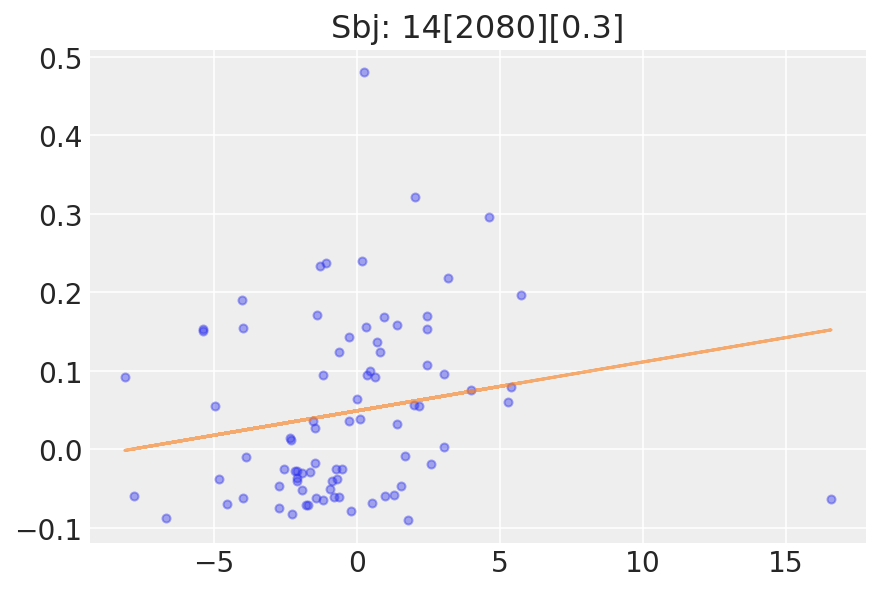

14


Text(0.5, 1.0, 'Sbj: 15[4960][0.3]')

<Figure size 432x288 with 0 Axes>

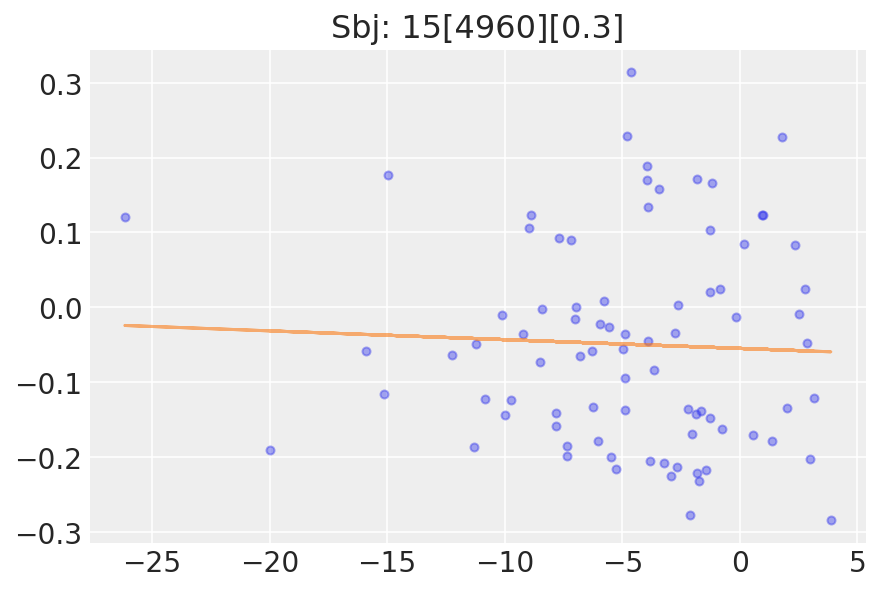

15


Text(0.5, 1.0, 'Sbj: 16[3720][1.]')

<Figure size 432x288 with 0 Axes>

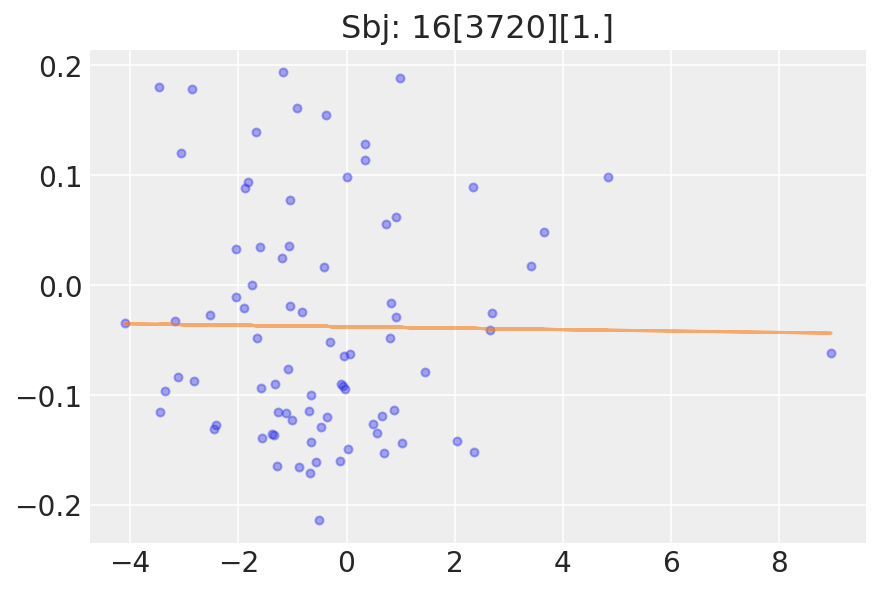

16


Text(0.5, 1.0, 'Sbj: 17[3720][1.]')

<Figure size 432x288 with 0 Axes>

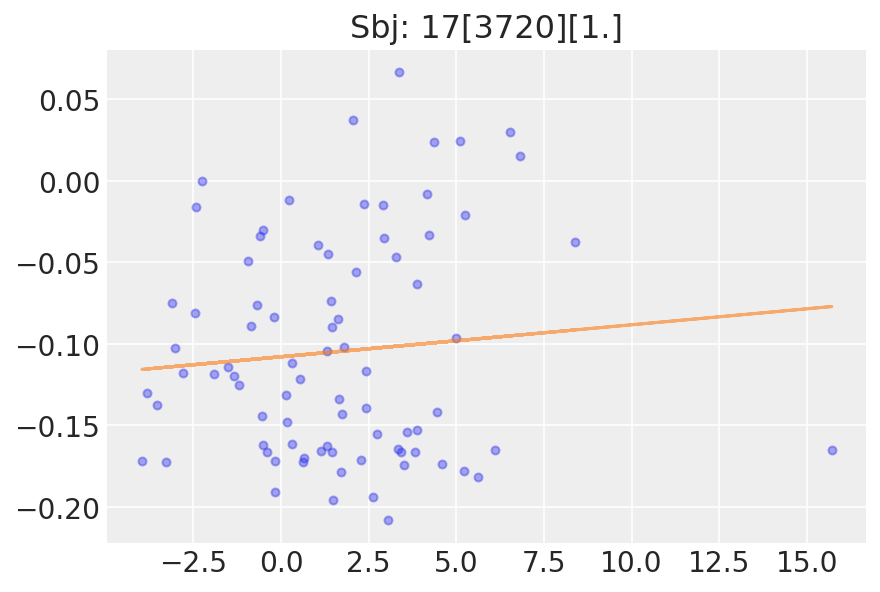

17


Text(0.5, 1.0, 'Sbj: 18[4960][0.3]')

<Figure size 432x288 with 0 Axes>

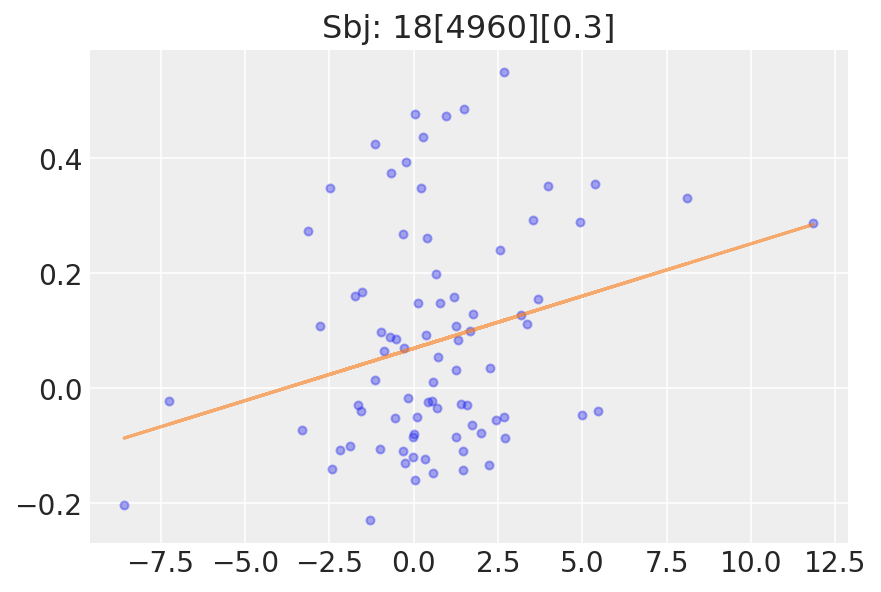

18


Text(0.5, 1.0, 'Sbj: 19[3720][1.]')

<Figure size 432x288 with 0 Axes>

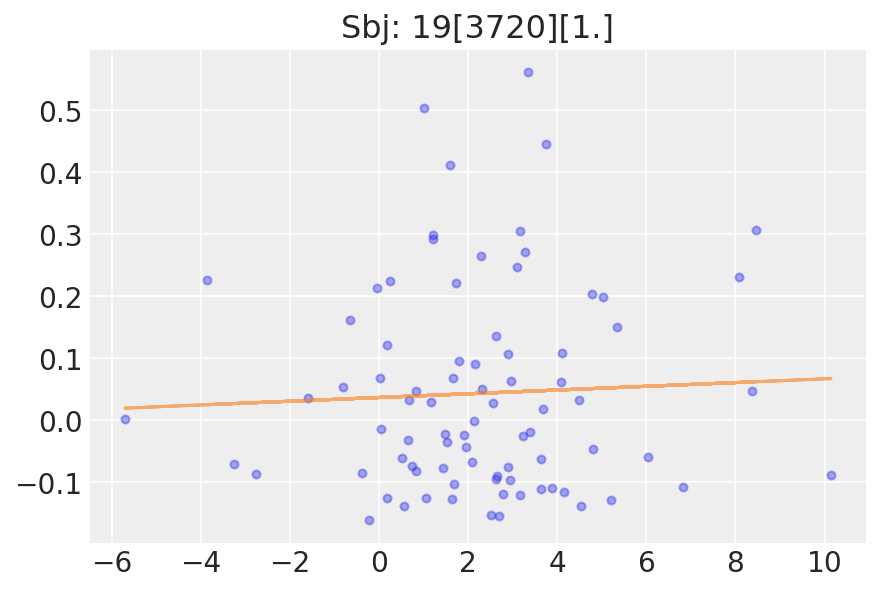

19


Text(0.5, 1.0, 'Sbj: 20[4960][0.3]')

<Figure size 432x288 with 0 Axes>

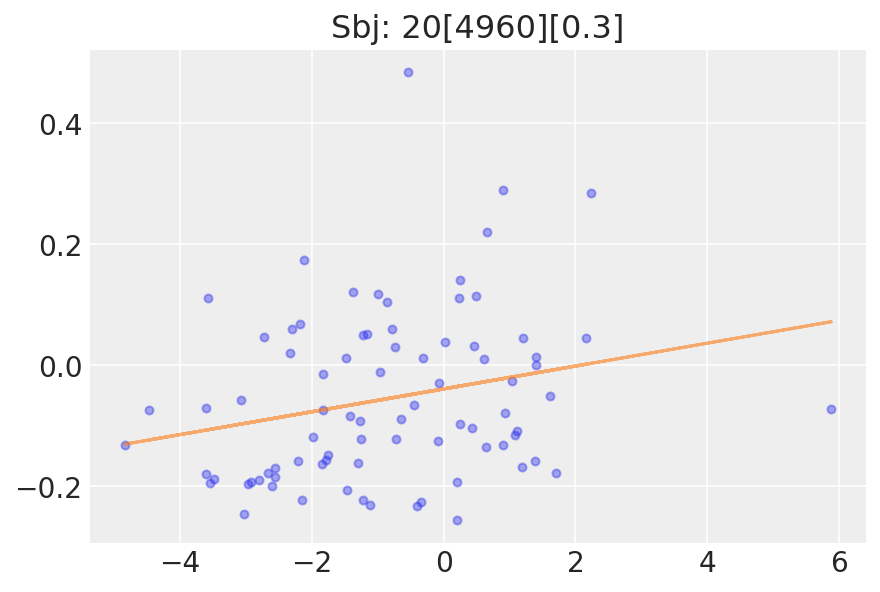

20


Text(0.5, 1.0, 'Sbj: 21[1810][1.]')

<Figure size 432x288 with 0 Axes>

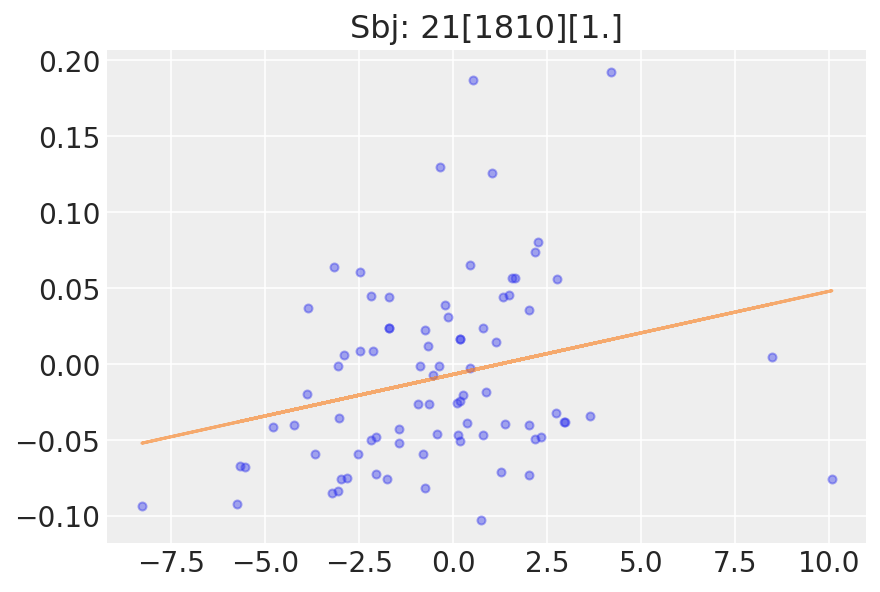

21


Text(0.5, 1.0, 'Sbj: 22[3240][1.]')

<Figure size 432x288 with 0 Axes>

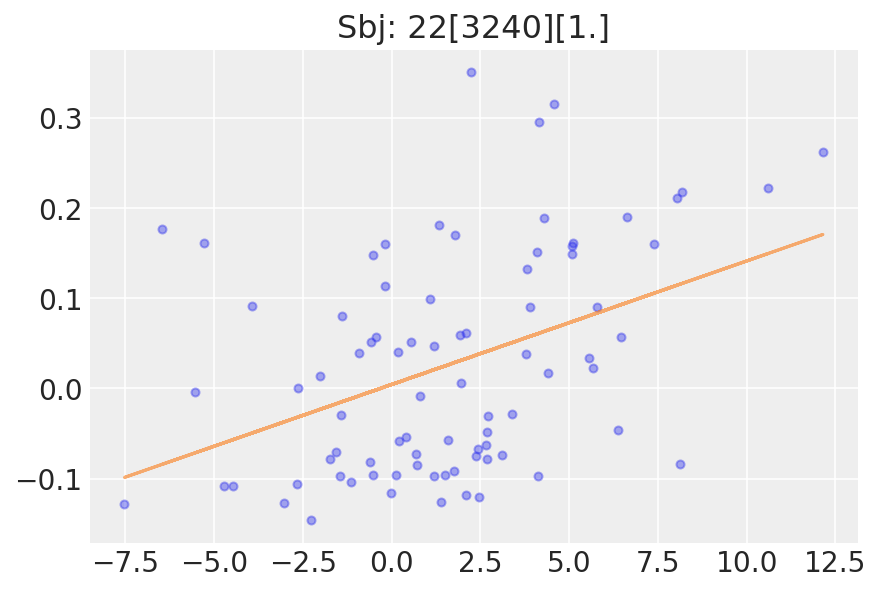

22


Text(0.5, 1.0, 'Sbj: 23[7280][0.3]')

<Figure size 432x288 with 0 Axes>

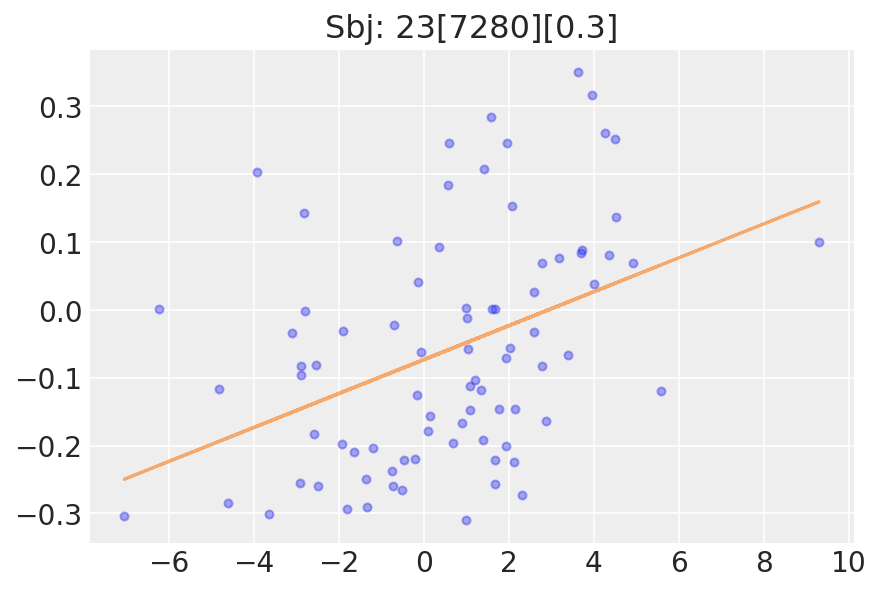

23


Text(0.5, 1.0, 'Sbj: 24[3440][0.3]')

<Figure size 432x288 with 0 Axes>

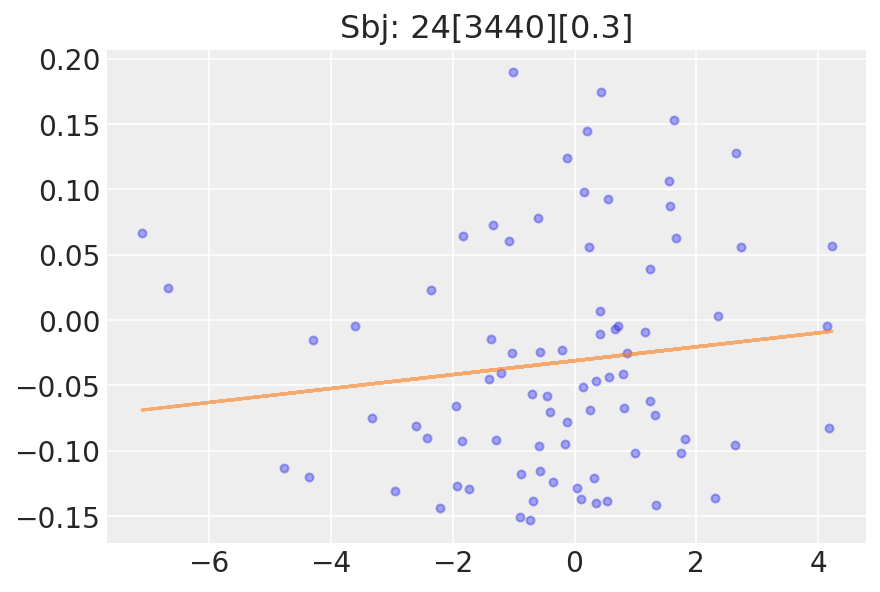

24


Text(0.5, 1.0, 'Sbj: 25[2480][0.3]')

<Figure size 432x288 with 0 Axes>

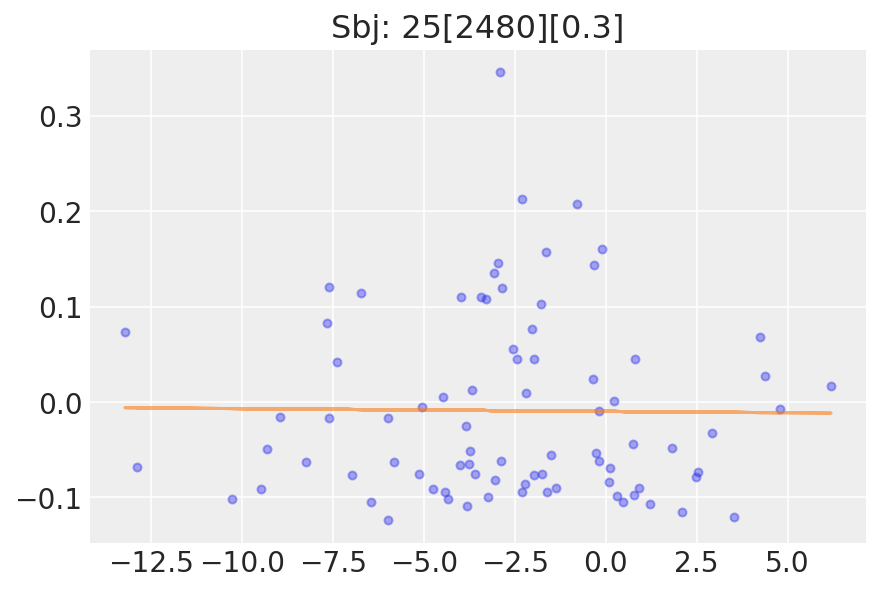

25


Text(0.5, 1.0, 'Sbj: 26[2480][0.3]')

<Figure size 432x288 with 0 Axes>

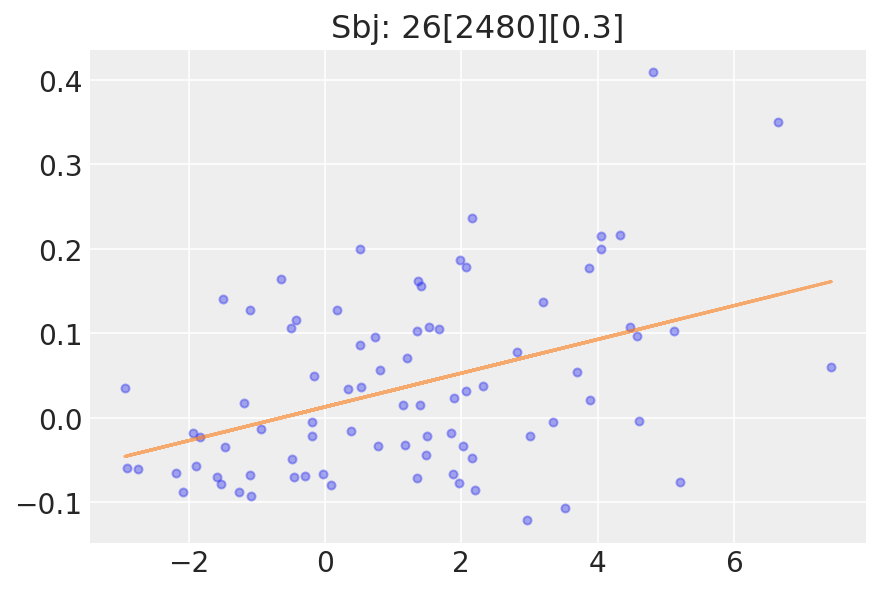

26


Text(0.5, 1.0, 'Sbj: 27[3000][1.]')

<Figure size 432x288 with 0 Axes>

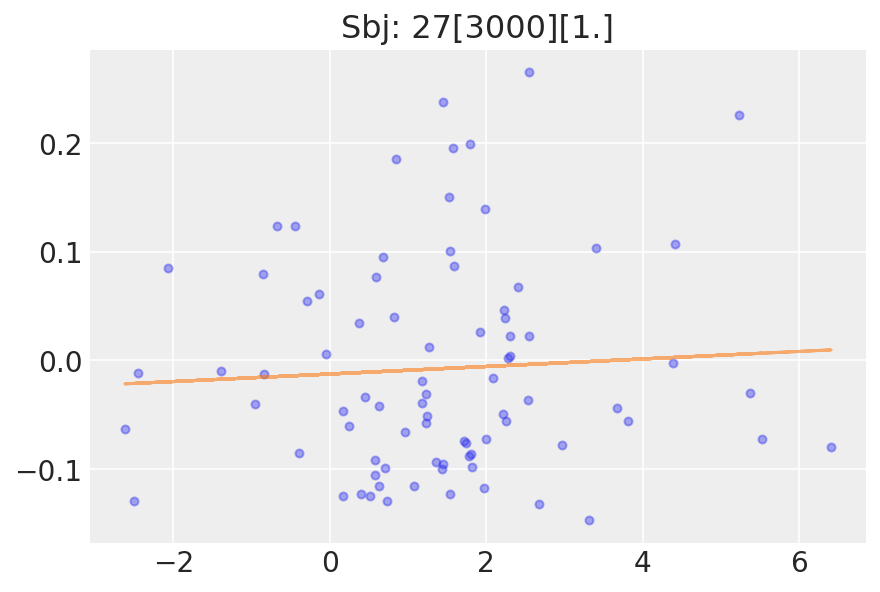

27


Text(0.5, 1.0, 'Sbj: 28[4960][0.3]')

<Figure size 432x288 with 0 Axes>

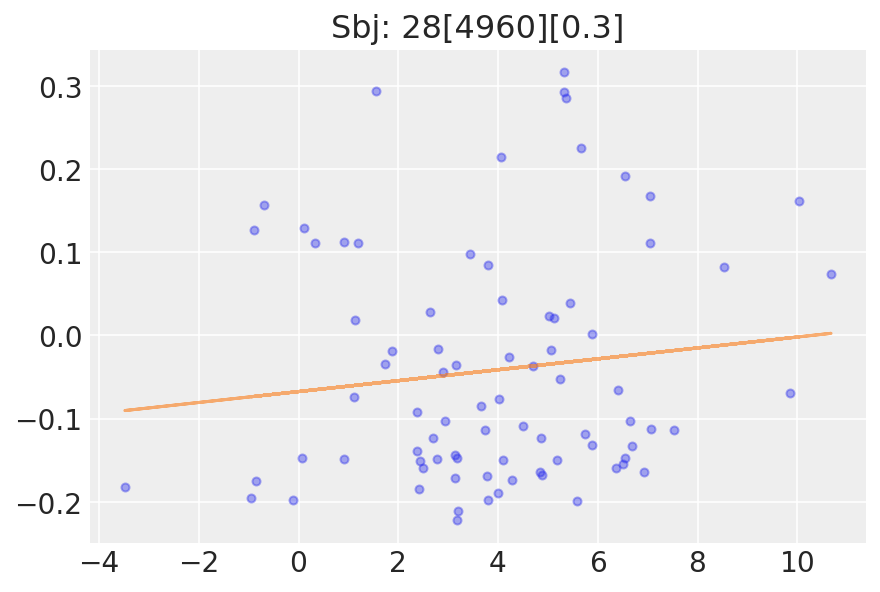

28


Text(0.5, 1.0, 'Sbj: 29[2550][1.]')

<Figure size 432x288 with 0 Axes>

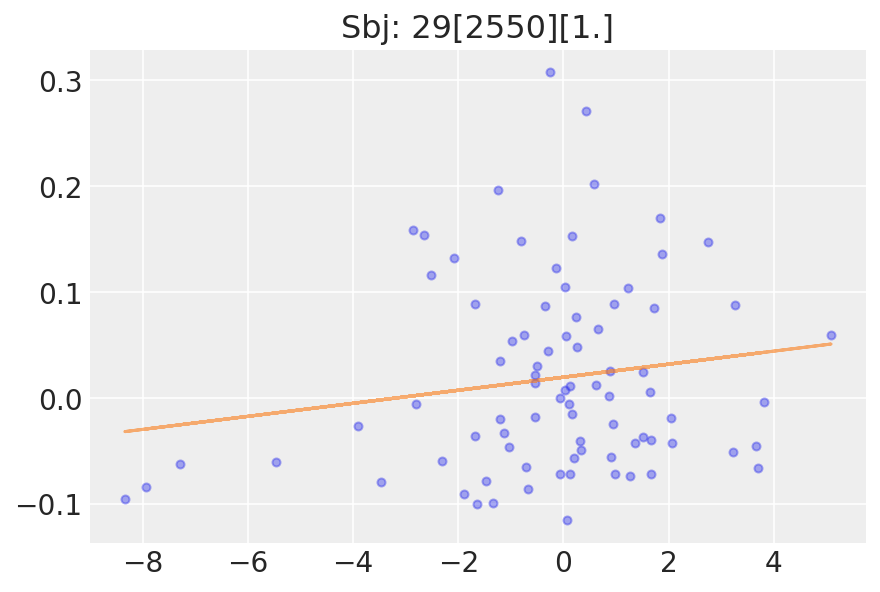

29


Text(0.5, 1.0, 'Sbj: 30[4960][0.3]')

<Figure size 432x288 with 0 Axes>

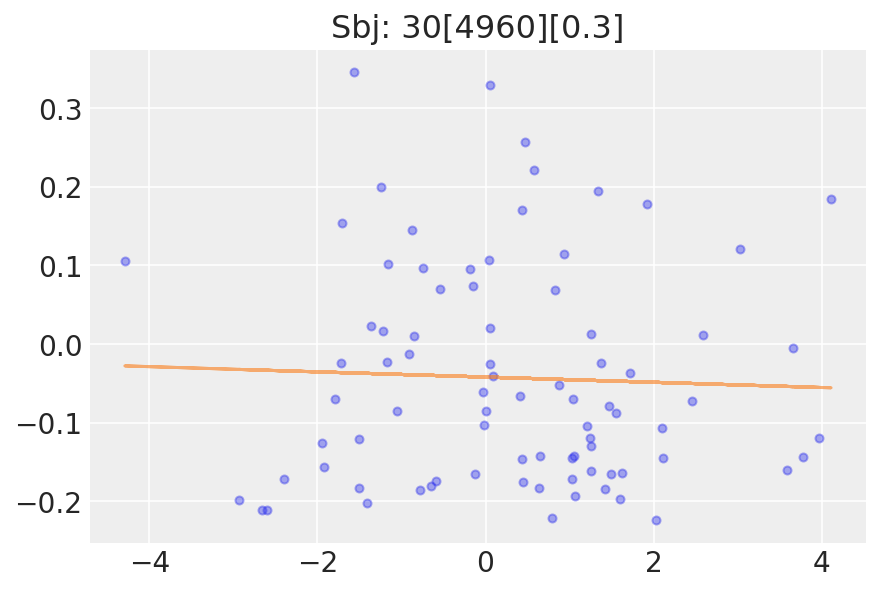

30


Text(0.5, 1.0, 'Sbj: 31[4960][0.3]')

<Figure size 432x288 with 0 Axes>

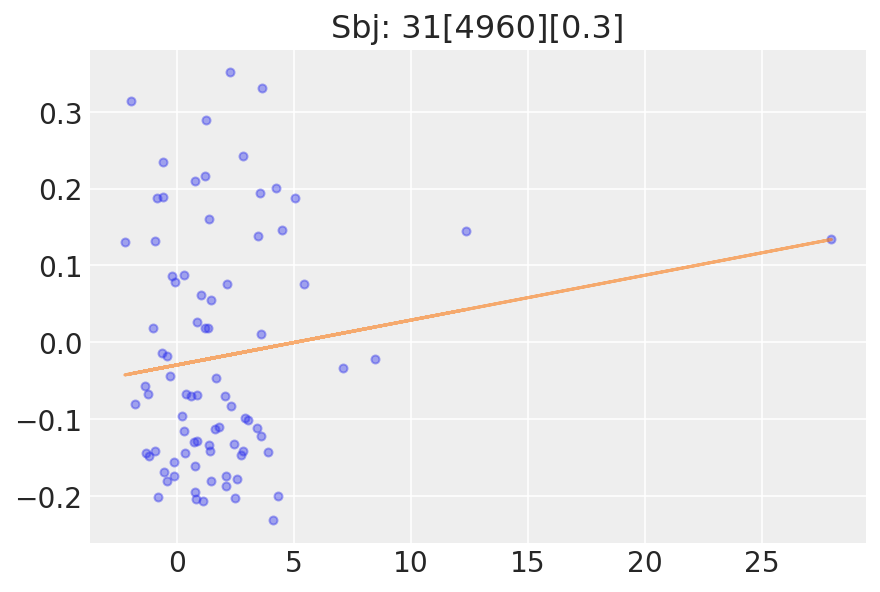

31


Text(0.5, 1.0, 'Sbj: 32[3120][1.]')

<Figure size 432x288 with 0 Axes>

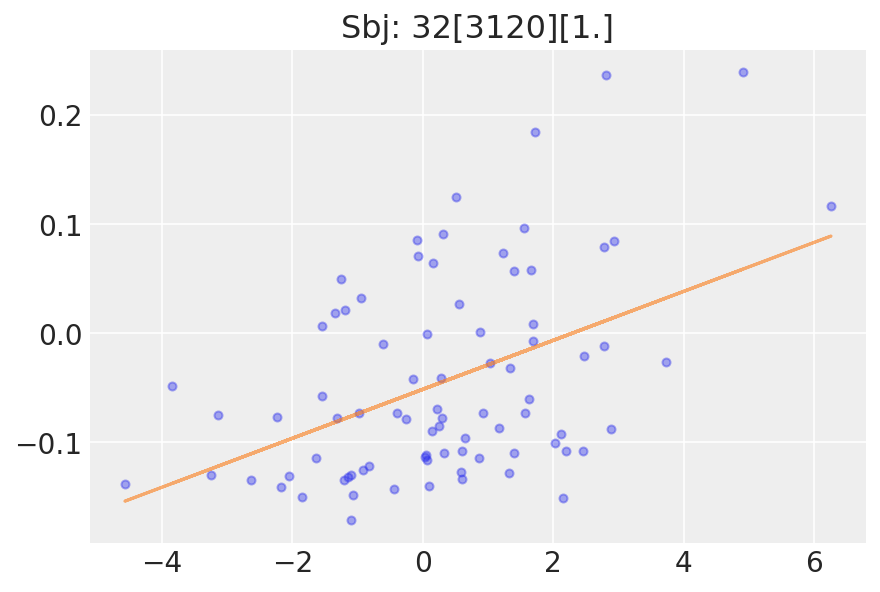

32


Text(0.5, 1.0, 'Sbj: 33[3920][0.3]')

<Figure size 432x288 with 0 Axes>

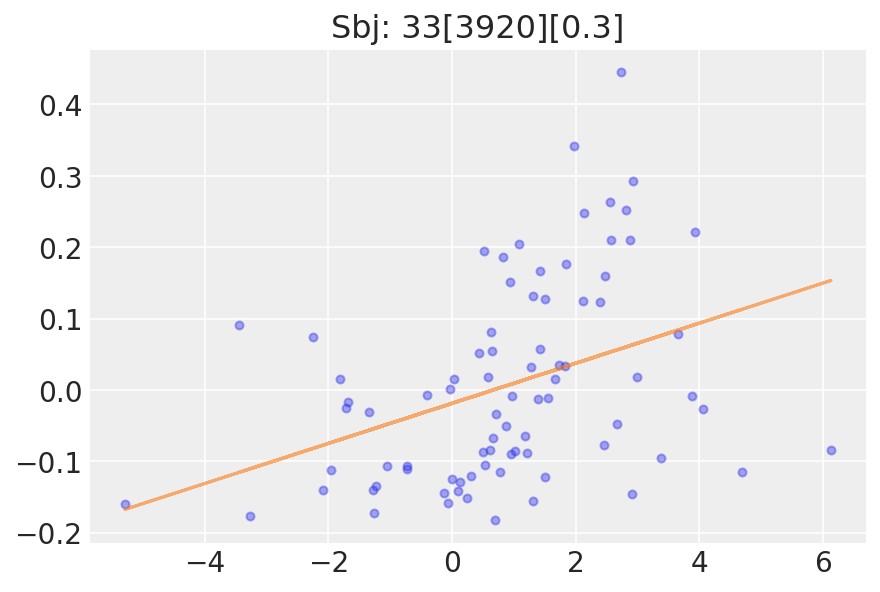

33


Text(0.5, 1.0, 'Sbj: 34[1240][0.3]')

<Figure size 432x288 with 0 Axes>

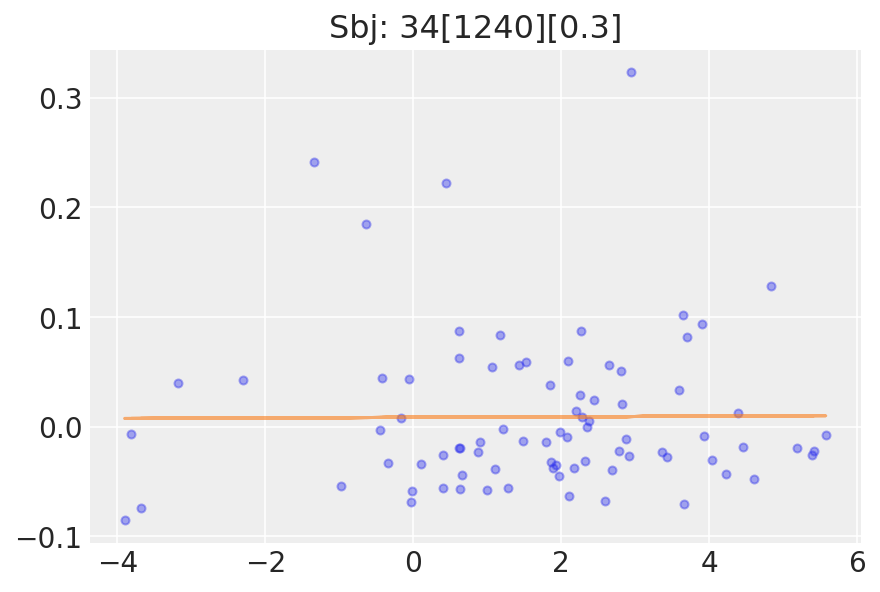

34


Text(0.5, 1.0, 'Sbj: 35[4960][0.3]')

<Figure size 432x288 with 0 Axes>

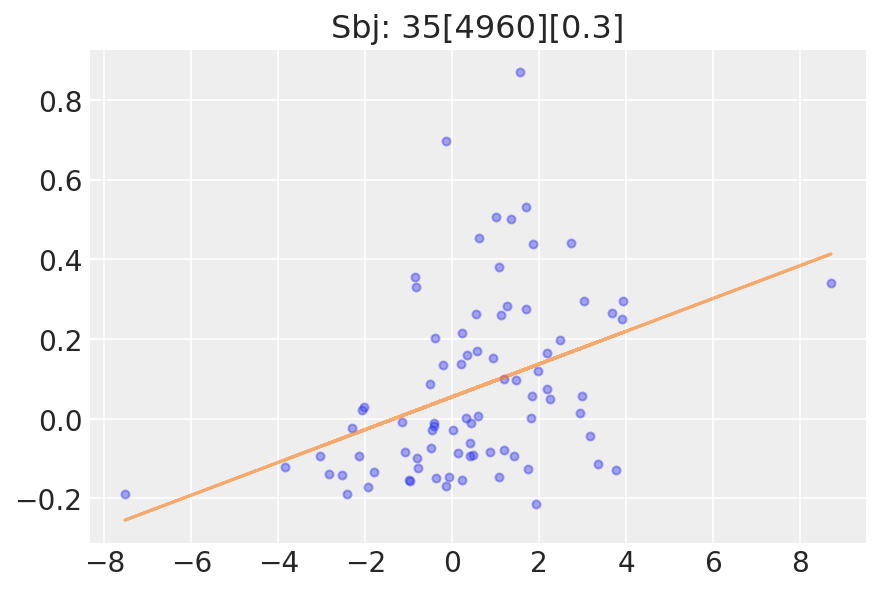

35


Text(0.5, 1.0, 'Sbj: 36[9920][0.3]')

<Figure size 432x288 with 0 Axes>

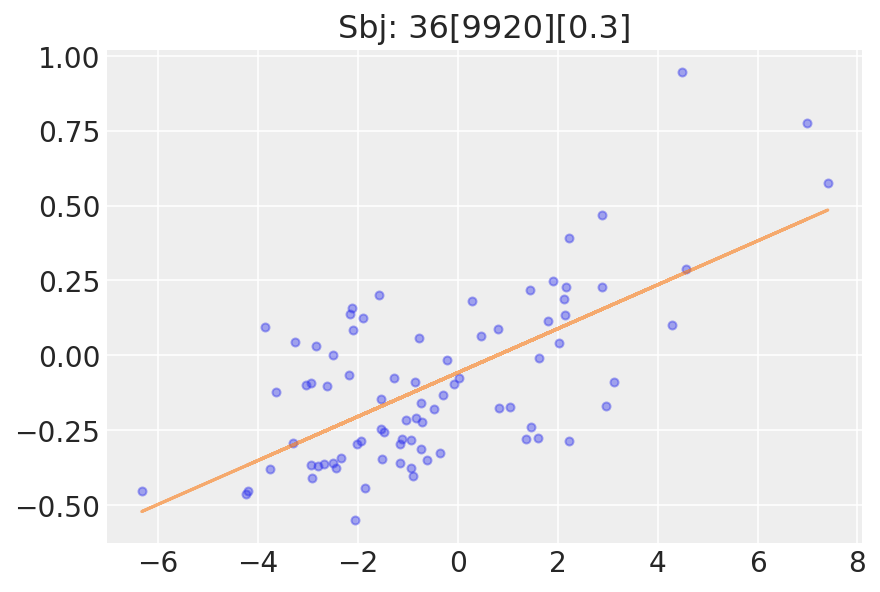

36


Text(0.5, 1.0, 'Sbj: 37[4960][0.3]')

<Figure size 432x288 with 0 Axes>

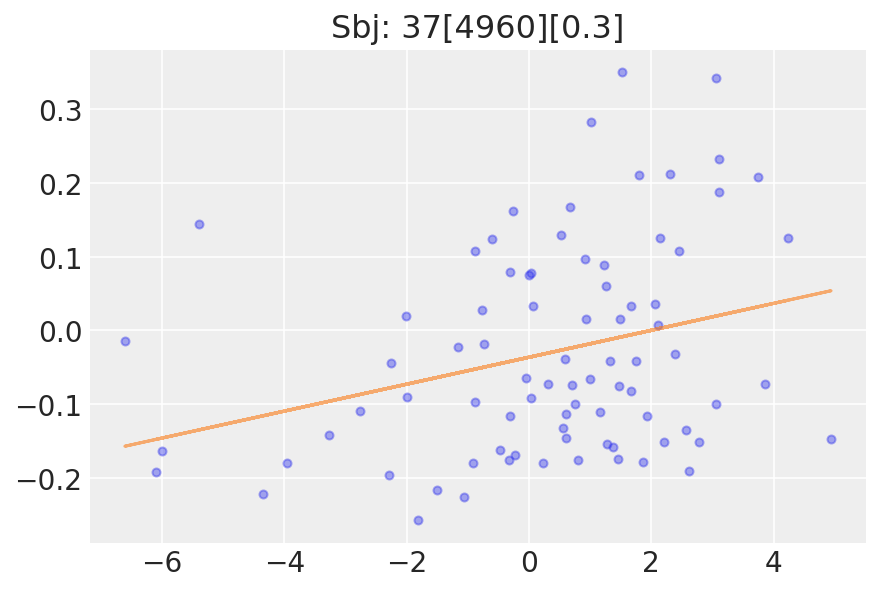

37


Text(0.5, 1.0, 'Sbj: 38[3720][1.]')

<Figure size 432x288 with 0 Axes>

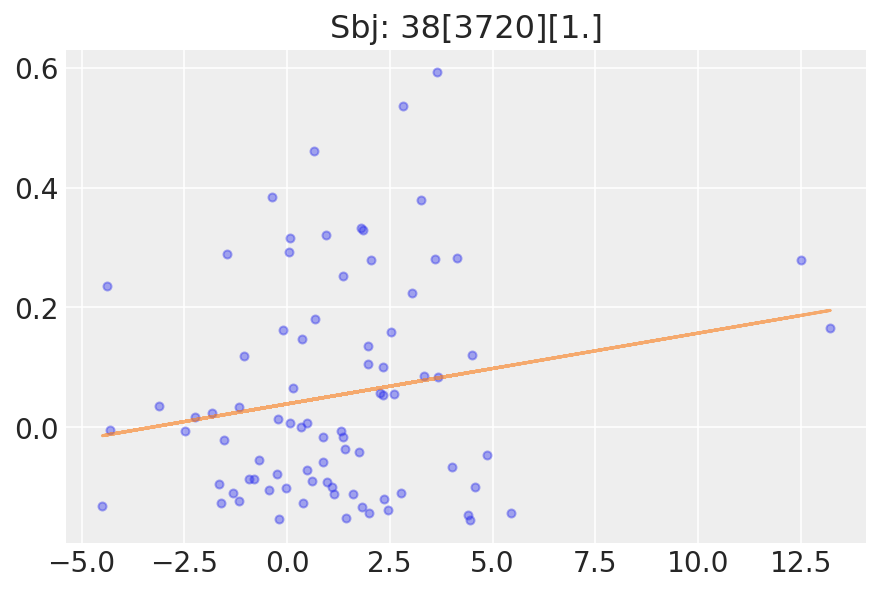

38


Text(0.5, 1.0, 'Sbj: 39[2480][0.3]')

<Figure size 432x288 with 0 Axes>

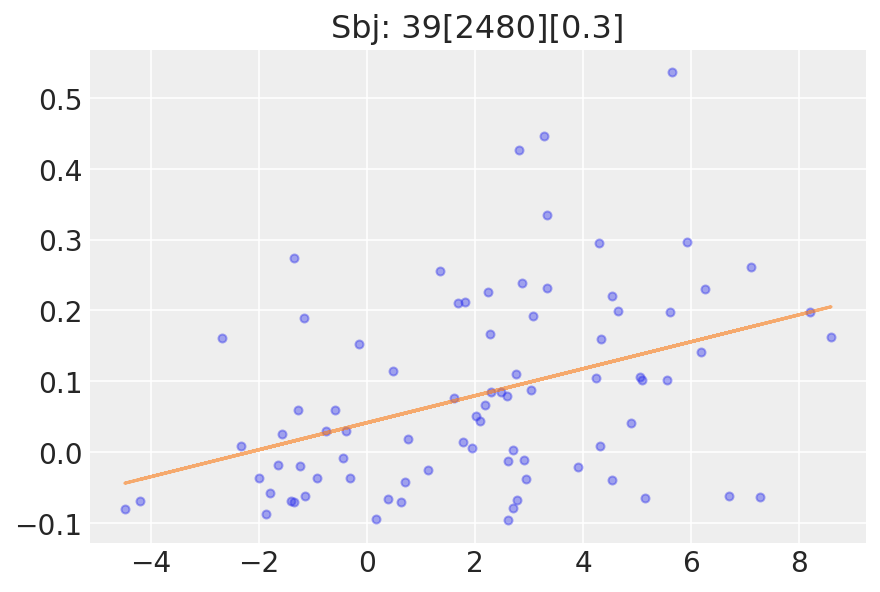

39


Text(0.5, 1.0, 'Sbj: 40[8080][0.3]')

<Figure size 432x288 with 0 Axes>

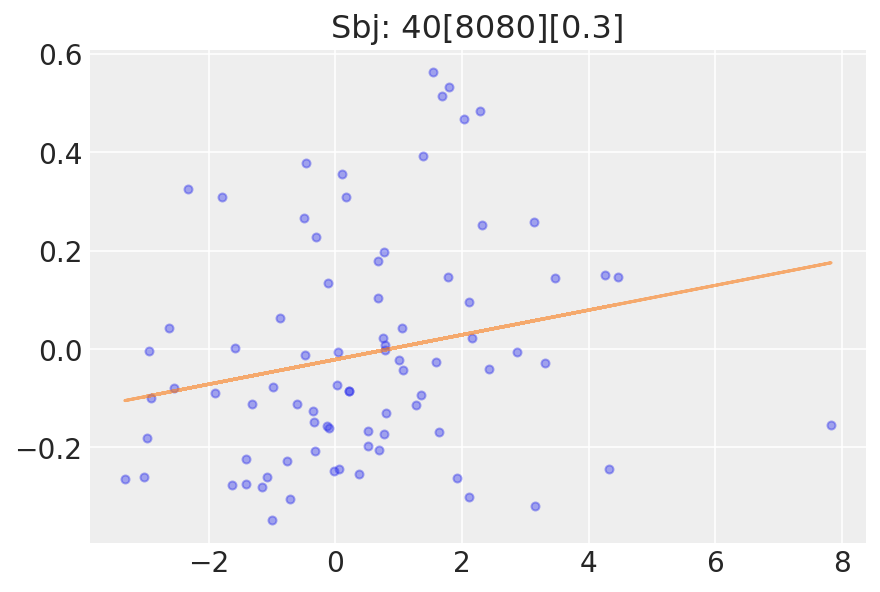

40


Text(0.5, 1.0, 'Sbj: 41[4960][0.3]')

<Figure size 432x288 with 0 Axes>

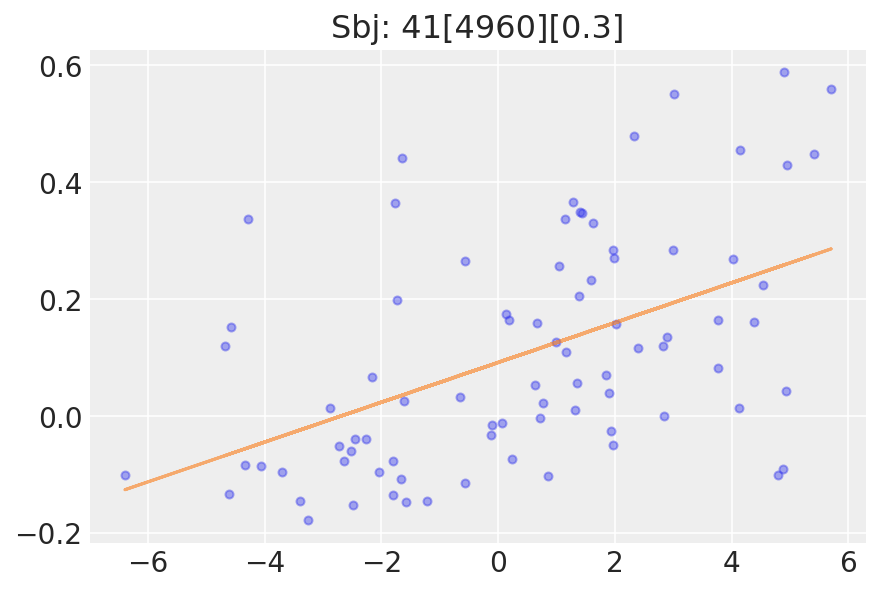

41


Text(0.5, 1.0, 'Sbj: 42[4960][0.3]')

<Figure size 432x288 with 0 Axes>

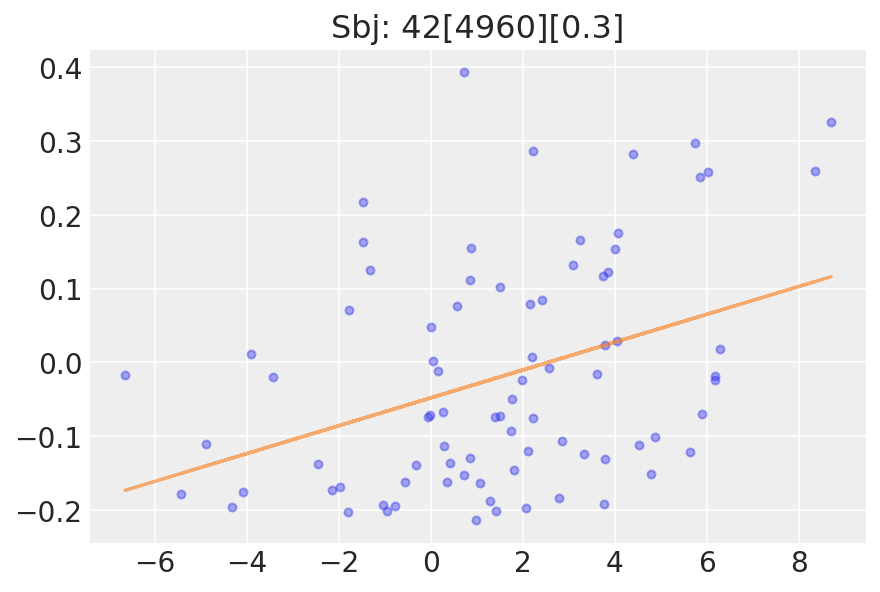

42


Text(0.5, 1.0, 'Sbj: 43[5920][0.3]')

<Figure size 432x288 with 0 Axes>

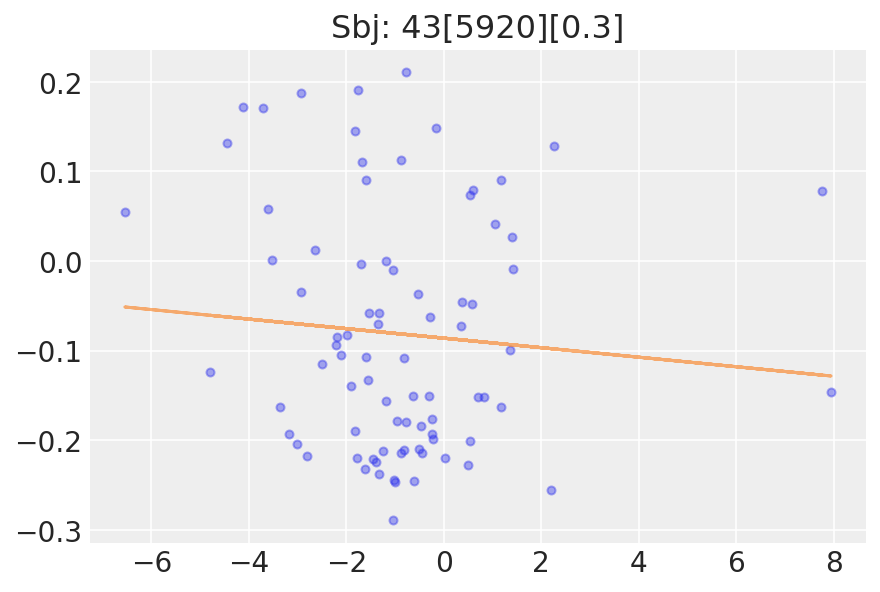

43


Text(0.5, 1.0, 'Sbj: 44[9920][0.3]')

<Figure size 432x288 with 0 Axes>

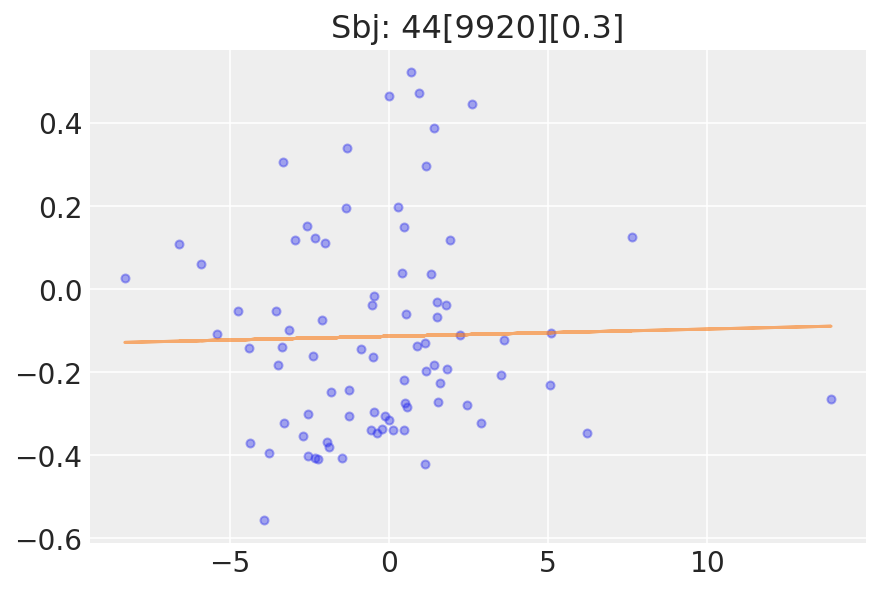

44


Text(0.5, 1.0, 'Sbj: 45[4960][0.3]')

<Figure size 432x288 with 0 Axes>

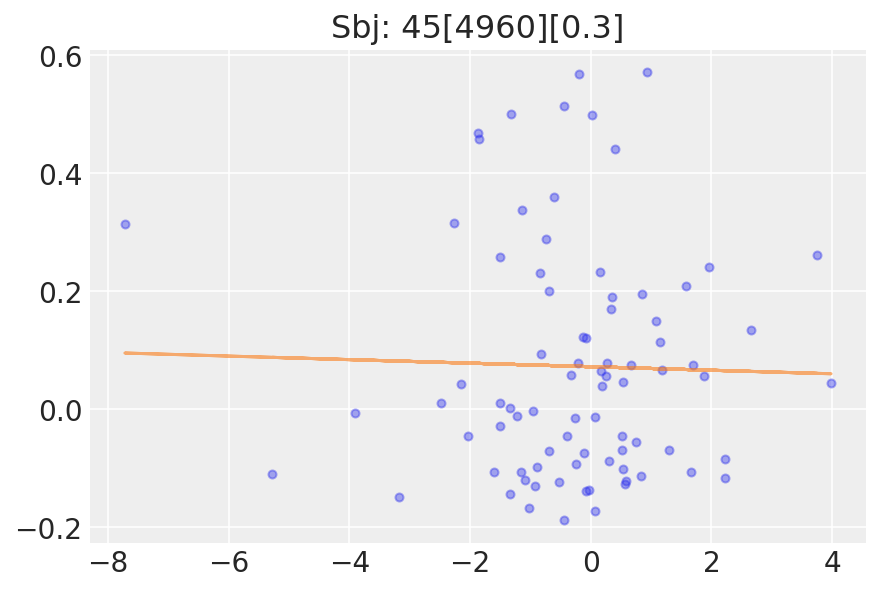

45


Text(0.5, 1.0, 'Sbj: 46[3440][0.3]')

<Figure size 432x288 with 0 Axes>

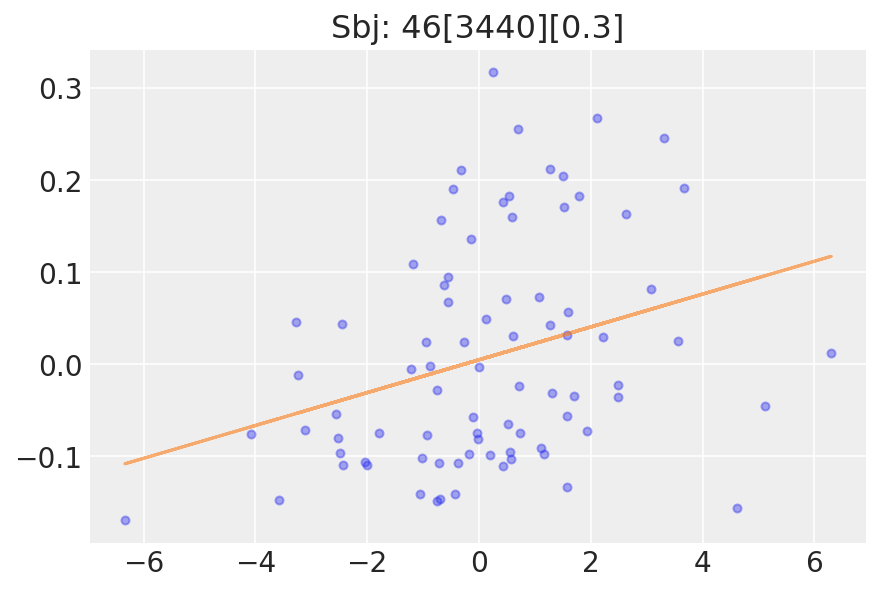

46


Text(0.5, 1.0, 'Sbj: 47[2480][0.3]')

<Figure size 432x288 with 0 Axes>

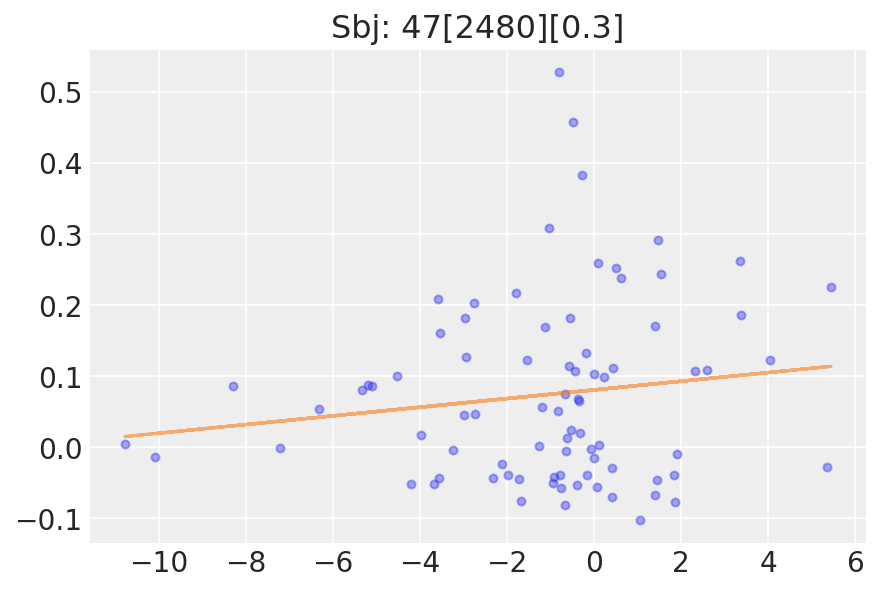

47


Text(0.5, 1.0, 'Sbj: 48[2480][0.3]')

<Figure size 432x288 with 0 Axes>

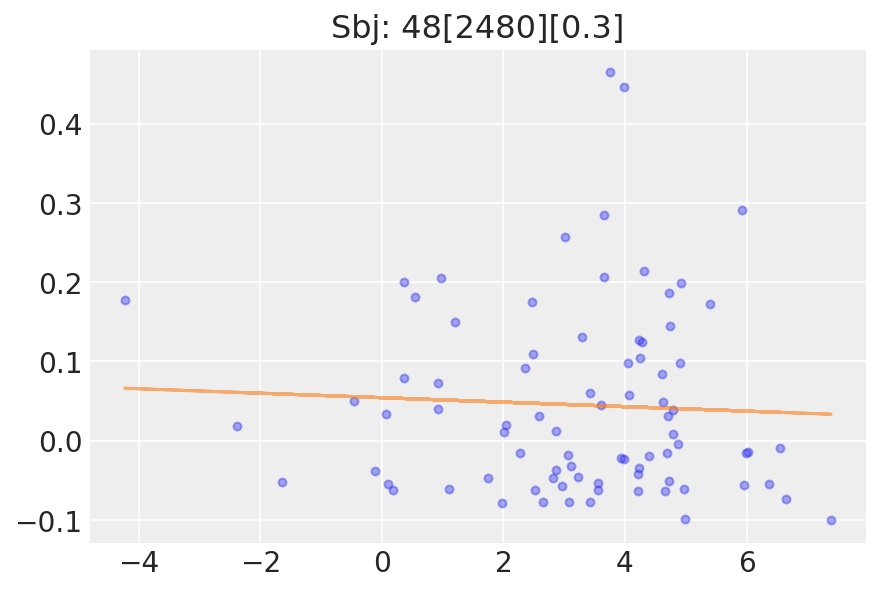

48


Text(0.5, 1.0, 'Sbj: 49[4960][0.3]')

<Figure size 432x288 with 0 Axes>

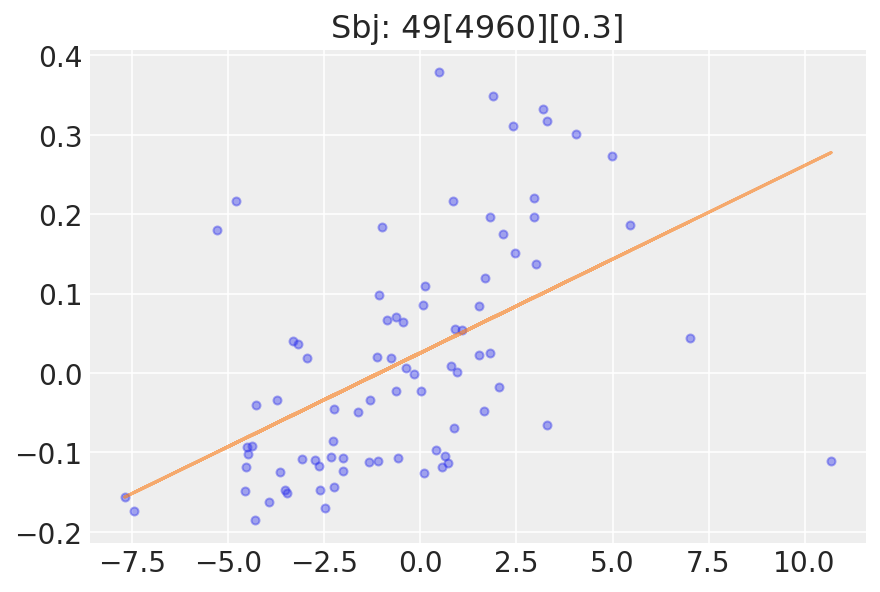

49


Text(0.5, 1.0, 'Sbj: 50[6880][0.3]')

<Figure size 432x288 with 0 Axes>

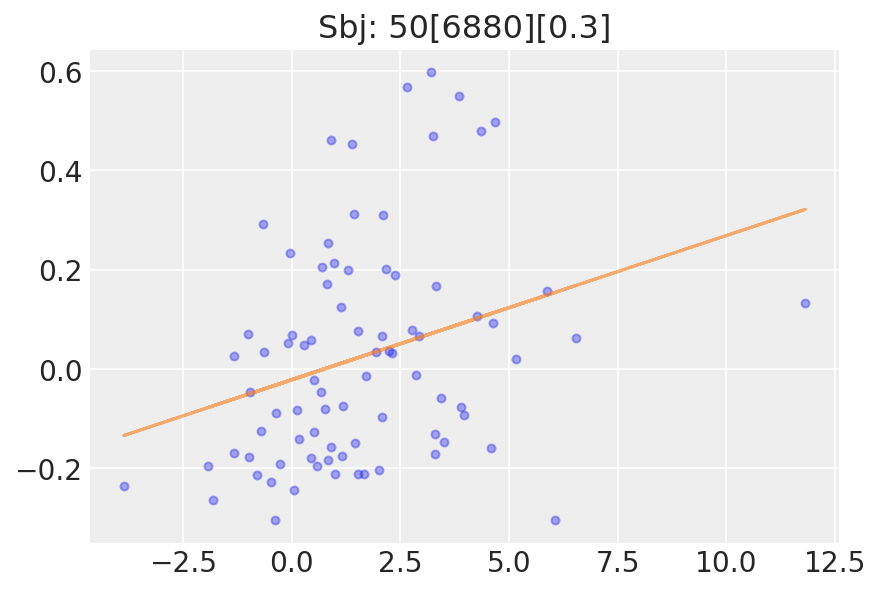

50


In [649]:
#go through the individuals

for i in range(51):
  plt.clf()
  _, ax = plt.subplots()
  #i
  ix = np.where(nmdata.sbj==i)[0]
  if (ix.size!=0):
    ax.plot(nmdata.dvol.iloc[ix], ppc["V"].mean(0)[ix], "o", ms=4, alpha=0.4, label="Data") 
    m, b = np.polyfit(nmdata.dvol.iloc[ix], ppc["V"].mean(0)[ix],1)
    ax.plot(nmdata.dvol.iloc[ix], m*nmdata.dvol.iloc[ix]+b, label="Mean outcome", alpha=0.6)
    ax.set_title('Sbj: '+ str(i)+str(np.unique(nmdata.pulsenumber.iloc[ix])) + str(np.unique(nmdata.pulsewidth.iloc[ix])))
    #plt.savefig('./Abbott/subj-testfig_'+str(i)+'.pdf')
    plt.show()
  print(i)

/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/arviz/plots/hdiplot.py:157: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/arviz/plots/hdiplot.py:157: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


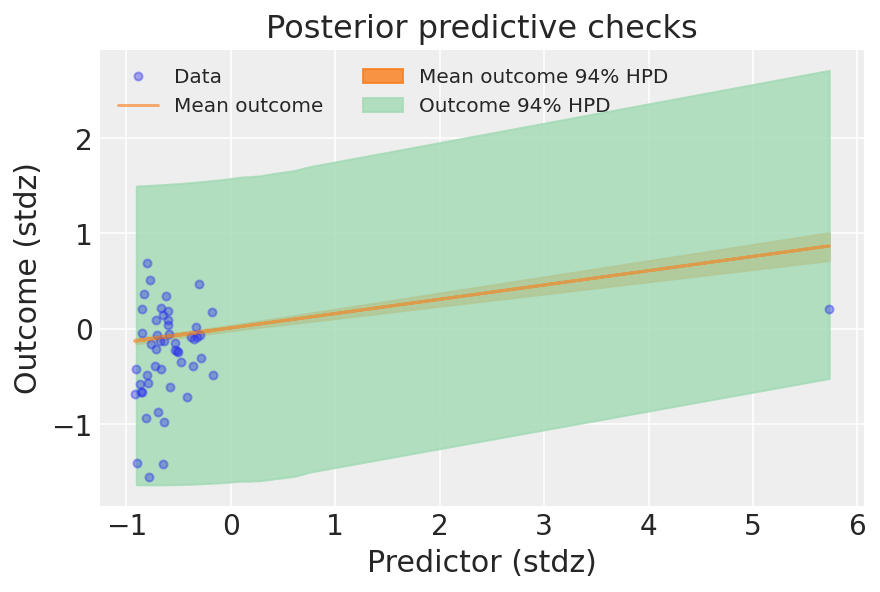

In [505]:
az.plot_hdi(
    ef[ix],
    mu_pp,
    ax=ax,
    fill_kwargs={"alpha": 0.8, "label": "Mean outcome 94% HPD"},
)
az.plot_hdi(
    ef[ix],
    ppc["V"][:,ix],
    ax=ax,
    fill_kwargs={"alpha": 0.8, "color": "#a1dab4", "label": "Outcome 94% HPD"},
)

ax.set_xlabel("Predictor (stdz)")
ax.set_ylabel("Outcome (stdz)")
ax.set_title("Posterior predictive checks")
ax.legend(ncol=2, fontsize=10);

In [ ]:
#generalj adatot a modelbol es estimateld meg....

In [6]:
d = pd.read_csv("Data/reedfrogs.csv", sep=",")
print(d.shape)
d.head(10)

(48, 5)


,density,pred,size,surv,propsurv
0,10,no,big,9,0.9
1,10,no,big,10,1.0
2,10,no,big,7,0.7
3,10,no,big,10,1.0
4,10,no,small,9,0.9
5,10,no,small,9,0.9
6,10,no,small,10,1.0
7,10,no,small,9,0.9
8,10,pred,big,4,0.4
9,10,pred,big,9,0.9


In [7]:

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


In [8]:
%qtconsole

#### Code 13.2

In [148]:
!pip install bokeh
from ipywidgets import interact
import numpy as np
import pandas as pd
import scipy.stats as st
import matplotlib.pylab as plt

from bokeh.io import push_notebook, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import LinearColorMapper, ColumnDataSource
import bokeh.palettes as bkpal

output_notebook()


     |████████████████████████████████| 18.5 MB 313 kB/s eta 0:00:01
     |████████████████████████████████| 661 kB 37.1 MB/s eta 0:00:01


Loading BokehJS ...

In [150]:


import numpy as np
import pymc3 as pm
import seaborn as sns
import scipy.stats as st
%matplotlib inline

nmax = 25
k, n = 7, 10
pv = np.linspace(0., 1., 50)
nv = np.arange(50)
pv_, nv_ = np.meshgrid(pv, nv)
ll = st.binom.pmf(k, nv_, pv_)



In [151]:
with pm.Model() as m:
    n = pm.DiscreteUniform('n', 0, 25)
    p = pm.Uniform('p', 0., 1., transform=None)
    y = pm.Binomial('k', n, p, observed=7)

In [190]:
m.logp({'n':20, 'p': 0.5})

array(-5.8627489)

/tmp/ipykernel_1544/1933930833.py:26: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.tight_layout()


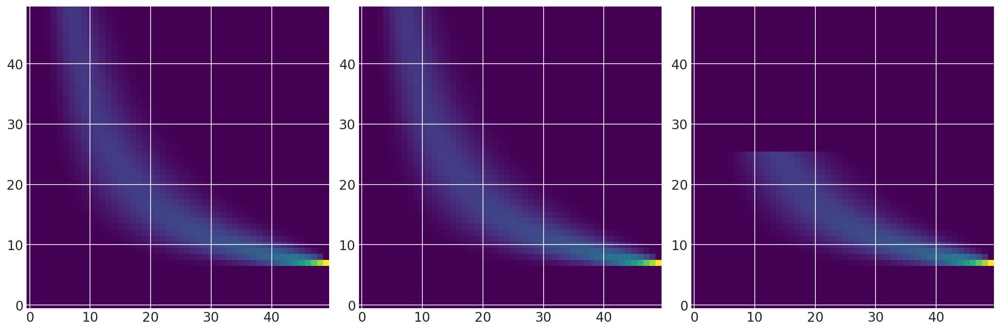

In [156]:
point=m.test_point


logp_m = m.logp
logp_y = y.logp



ll2 = np.zeros_like(ll)
lly = ll2.flatten()
llm = np.zeros_like(lly)

for i in range(len(lly)):
    point['n'] = nv_.flatten()[i]
    point['p'] = pv_.flatten()[i]
    llm[i] = np.exp(logp_m(point))
    lly[i] = np.exp(logp_y(point))
llm = llm.reshape(nv_.shape)
lly = lly.reshape(nv_.shape)

_, ax = plt.subplots(1, 3, figsize=(15, 5))
ll = st.binom.pmf(7, nv_, pv_)
ax[0].imshow(ll, origin='lower')
ax[1].imshow(lly, origin='lower')
ax[2].imshow(llm, origin='lower')
plt.tight_layout()
plt.show()


In [149]:


with pm.Model() as m2:
    n = pm.Uniform('n', 0, nmax)
    p = pm.Uniform('p', 0., 1.)
    y = pm.Binomial('k', n, p, observed=7)
#     tr = pm.sample(10000, tune=5000)
    tr = pm.sample(10000, step=pm.Metropolis())



NameError: name 'nmax' is not defined

In [9]:
# make the tank cluster variable
tank = np.arange(d.shape[0])
n_tanks = d.shape[0]

# fit
with pm.Model() as m_13_1:
    a = pm.Normal("a", 0, 1.5, shape=n_tanks)
    p = pm.math.invlogit(a[tank])

    S = pm.Binomial("S", n=d.density, p=p, observed=d.surv)
    trace_13_1 = pm.sample(random_seed=RANDOM_SEED)

az.summary(trace_13_1, round_to=2)

/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/deprecat/classic.py:215: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  return wrapped_(*args_, **kwargs_)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/theano/tensor/elemwise.py:826: RuntimeWarning: divide by zero encountered in log
  variables = ufunc(*ufunc_args, **ufunc_kwargs)
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/theano/tensor/elemwise.py:826: RuntimeWarning: invalid value encountered in multiply
  variables = ufunc(*ufunc_args, **ufunc_kwargs)
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 125 seconds.
Got error No model on context stack. trying to find log_likelihood in translation.
/opt/conda/envs/stat-rethink2-pymc3/lib/python3.9/site-packages/arviz/data/io_pymc3_3x.py:98: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a[0],1.71,0.77,0.51,2.86,0.01,0.01,7715.46,2887.82,1.00
a[1],2.41,0.90,0.96,3.77,0.01,0.01,9547.17,2705.02,1.00
a[2],0.76,0.64,-0.20,1.82,0.01,0.01,7722.24,2802.72,1.00
a[3],2.41,0.92,0.93,3.84,0.01,0.01,9145.78,2824.63,1.00
a[4],1.72,0.76,0.57,2.98,0.01,0.01,7431.82,2925.48,1.00
a[5],1.73,0.77,0.54,2.97,0.01,0.01,7341.99,2886.17,1.00
a[6],2.39,0.89,1.01,3.82,0.01,0.01,7949.02,2718.62,1.00
a[7],1.73,0.79,0.50,2.99,0.01,0.01,7392.57,2802.60,1.00
a[8],-0.37,0.61,-1.34,0.60,0.01,0.01,8158.28,2824.60,1.00
a[9],1.71,0.75,0.50,2.85,0.01,0.01,8024.70,3011.25,1.00


#### Code 13.3

In [13]:
with pm.Model() as m_13_2:
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    sigma = pm.Exponential("sigma", 1.0)

    a = pm.Normal("a", a_bar, sigma, shape=n_tanks)
    p = pm.math.invlogit(a[tank])

    S = pm.Binomial("S", n=d.density, p=p, observed=d.surv)
    trace_13_2 = pm.sample(random_seed=RANDOM_SEED)

/opt/miniconda-latest/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  if __name__ == '__main__':
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [a, sigma, a_bar]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 4 seconds.


#### Code 13.4

In [14]:
az.compare({"m13_1": trace_13_1, "m13_2": trace_13_2})

/opt/miniconda-latest/lib/python3.7/site-packages/arviz/stats/stats.py:146: UserWarning: The default method used to estimate the weights for each model,has changed from BB-pseudo-BMA to stacking
  "The default method used to estimate the weights for each model,"
/opt/miniconda-latest/lib/python3.7/site-packages/arviz/data/io_pymc3.py:100: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
/opt/miniconda-latest/lib/python3.7/site-packages/arviz/stats/stats.py:1407: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
/opt/miniconda-latest/lib/python3.7/site-pa

,rank,waic,p_waic,d_waic,weight,se,dse,warning,waic_scale
m13_2,0,201.065328,21.485242,0.000000,1.0,7.053256,0.000000,True,deviance
m13_1,1,214.245063,25.399350,13.179735,0.0,4.750226,3.355971,True,deviance


#### Code 13.5

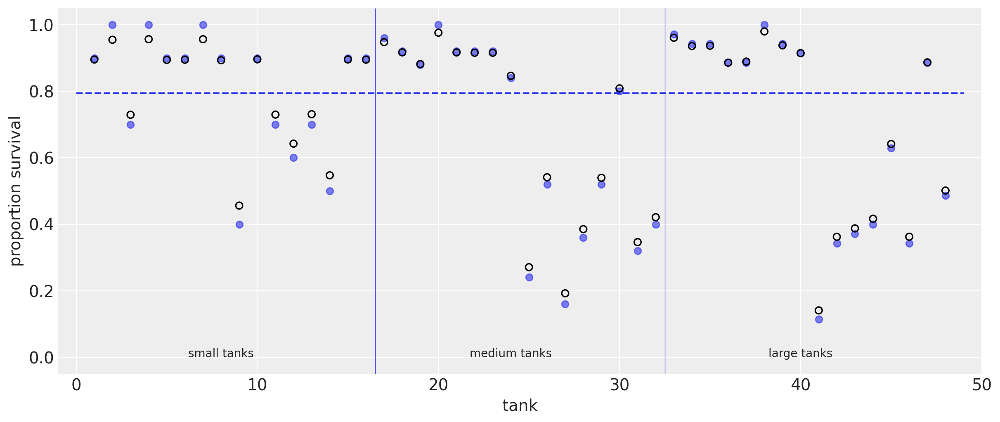

In [15]:
# compute mean intercept for each tank
# also transform to probability with logistic
propsurv_est = logistic(trace_13_2["a"].mean(0))

_, ax = plt.subplots(1, 1, figsize=(12, 5))

# display raw proportions surviving in each tank
ax.scatter(np.arange(1, 49), d.propsurv, alpha=0.6)

# overlay posterior means
ax.scatter(np.arange(1, 49), propsurv_est, facecolors="none", edgecolors="k", lw=1.2)

# mark posterior mean probability across tanks
ax.hlines(logistic(trace_13_2["a_bar"].mean()), 0, 49, linestyles="--")

# draw vertical dividers between tank densities
ax.vlines([16.5, 32.5], -0.05, 1.05, lw=0.5)
ax.text(8, 0, "small tanks", horizontalalignment="center")
ax.text(16 + 8, 0, "medium tanks", horizontalalignment="center")
ax.text(32 + 8, 0, "large tanks", horizontalalignment="center")

ax.set_xlabel("tank", fontsize=14)
ax.set_ylabel("proportion survival", fontsize=14)
ax.set_xlim(-1, 50)
ax.set_ylim(-0.05, 1.05);

#### Code 13.6

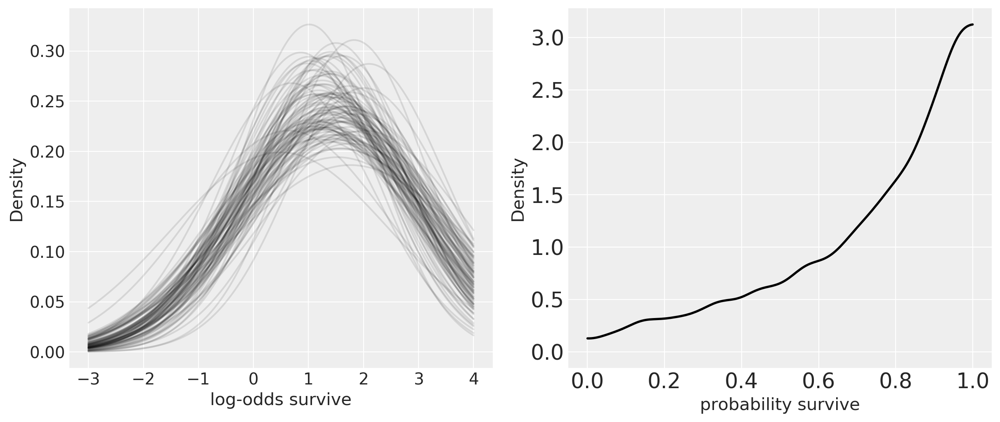

In [8]:
_, ax = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# show first 100 populations in the posterior
xrange = np.linspace(-3, 4, 200)
postcurve = [
    stats.norm.pdf(xrange, loc=trace_13_2["a_bar"][i], scale=trace_13_2["sigma"][i])
    for i in range(100)
]
ax[0].plot(xrange, np.asarray(postcurve).T, alpha=0.1, color="k")
ax[0].set_xlabel("log-odds survive")
ax[0].set_ylabel("Density")

# sample 8000 imaginary tanks from the posterior distribution
sim_tanks = np.random.normal(loc=trace_13_2["a_bar"], scale=trace_13_2["sigma"])

# transform to probability and visualize
az.plot_kde(logistic(sim_tanks), ax=ax[1], plot_kwargs={"color": "k"})
ax[1].set_xlabel("probability survive")
ax[1].set_ylabel("Density");

#### Code 13.7

In [9]:
a_bar, sigma, nponds = 1.5, 1.5, 60
Ni = np.repeat([5, 10, 25, 35], 15)

#### Code 13.8

In [10]:
a_pond = np.random.normal(loc=a_bar, scale=sigma, size=nponds)

#### Code 13.9

In [11]:
dsim = pd.DataFrame(dict(pond=np.arange(nponds), Ni=Ni, true_a=a_pond))
dsim.head()

,pond,Ni,true_a
0,0,5,2.171878
1,1,5,-0.355311
2,2,5,2.992474
3,3,5,2.133112
4,4,5,0.401375


#### Code 13.10
Data types related. Python is dynamically-typed.

#### Code 13.11

In [12]:
dsim["Si"] = np.random.binomial(dsim["Ni"], logistic(dsim["true_a"]))

#### Code 13.12

In [13]:
dsim["p_nopool"] = dsim.Si / dsim.Ni

#### Code 13.13

In [14]:
with pm.Model() as m_13_3:
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    sigma = pm.Exponential("sigma", 1.0)

    a_pond = pm.Normal("a_pond", a_bar, sigma, shape=nponds)
    p = pm.math.invlogit(a_pond[dsim.pond.values])

    Si = pm.Binomial("Si", n=dsim.Ni.values, p=p, observed=dsim.Si)
    trace_13_3 = pm.sample(random_seed=RANDOM_SEED)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a_pond, sigma, a_bar]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


#### Code 13.14

In [15]:
az.summary(trace_13_3, var_names=["a_bar", "sigma"], round_to=2)

,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a_bar,1.51,0.21,1.17,1.86,0.0,0.0,3968.14,3783.14,3998.70,3244.93,1.0
sigma,1.42,0.20,1.13,1.76,0.0,0.0,1688.99,1688.99,1701.77,2323.98,1.0


#### Code 13.15

In [16]:
dsim["p_partpool"] = logistic(trace_13_3["a_pond"].mean(0))

#### Code 13.16

In [17]:
dsim["p_true"] = logistic(dsim["true_a"].values)

#### Code 13.17

In [18]:
nopool_error = np.abs(dsim.p_nopool - dsim.p_true)
partpool_error = np.abs(dsim.p_partpool - dsim.p_true)

#### Code 13.18 and 13.19

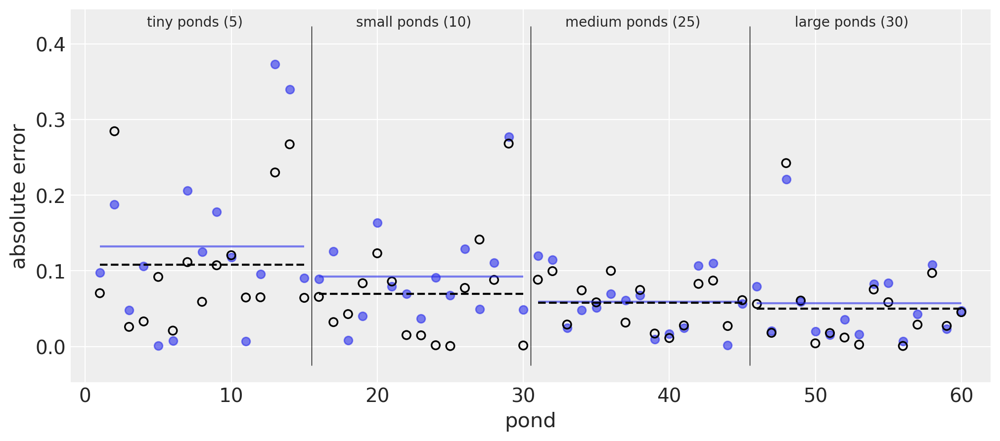

In [19]:
_, ax = plt.subplots(1, 1, figsize=(12, 5))
xrange = np.arange(60)
xrange_ = xrange.reshape((4, 15))

ax.scatter(xrange + 1, nopool_error, alpha=0.6)
ax.scatter(xrange + 1, partpool_error, facecolors="none", edgecolors="k", lw=1.2)
ax.vlines(xrange_[1:, 0] + 0.5, -0.025, max(nopool_error) + 0.05, lw=0.5)

textall = [
    "tiny ponds (5)",
    "small ponds (10)",
    "medium ponds (25)",
    "large ponds (30)",
]
for isem in range(4):
    ax.hlines(
        nopool_error[xrange_[isem, :]].mean(),
        xrange_[isem, 0] + 1,
        xrange_[isem, -1] + 1,
        color="C0",
        alpha=0.6,
    )
    ax.hlines(
        partpool_error[xrange_[isem, :]].mean(),
        xrange_[isem, 0] + 1,
        xrange_[isem, -1] + 1,
        color="k",
        linestyles="--",
    )
    ax.text(
        xrange_[isem, 7] + 0.5,
        max(nopool_error) + 0.05,
        textall[isem],
        horizontalalignment="center",
    )

ax.set_xlabel("pond")
ax.set_ylabel("absolute error")
ax.set_xlim(-1, 62);

#### Code 13.20

This part is Stan related. To do the same in PyMC3 (i.e., avoid compiling the same model twice), you need to set up the input data with `pm.Data`. There are examples in this repository, and you can also take a look at [this tutorial](https://docs.pymc.io/notebooks/data_container.html)

#### Code 13.21

In [20]:
d = pd.read_csv("Data/chimpanzees.csv", sep=";")

treatment = (d.prosoc_left + 2 * d.condition).values
Ntreatments = len(np.unique(treatment))

actor = (d.actor - 1).astype(int).values
Nactor = len(np.unique(actor))

block = (d.block - 1).astype(int).values
Nblock = len(np.unique(block))

with pm.Model() as m_13_4:
    # hyper-priors
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    sigma_a = pm.Exponential("sigma_a", 1.0)
    sigma_g = pm.Exponential("sigma_g", 1.0)

    # adaptive priors
    a = pm.Normal("a", a_bar, sigma_a, shape=Nactor)
    g = pm.Normal("g", 0.0, sigma_g, shape=Nblock)

    b = pm.Normal("b", 0.0, 0.5, shape=Ntreatments)
    p = pm.math.invlogit(a[actor] + g[block] + b[treatment])
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    trace_13_4 = pm.sample(tune=3000, target_accept=0.95, random_seed=RANDOM_SEED)
    idata_13_4 = az.from_pymc3(trace_13_4)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, g, a, sigma_g, sigma_a, a_bar]


Sampling 4 chains for 3_000 tune and 1_000 draw iterations (12_000 + 4_000 draws total) took 22 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.9011254649531759, but should be close to 0.95. Try to increase the number of tuning steps.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


#### Code 13.22

In [21]:
az.summary(idata_13_4, round_to=2)

,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a_bar,0.61,0.73,-0.56,1.74,0.02,0.01,1487.34,1487.34,1440.20,2154.06,1.00
a[0],-0.34,0.35,-0.91,0.20,0.01,0.01,1124.27,1124.27,1124.65,1795.98,1.00
a[1],4.72,1.32,2.87,6.60,0.04,0.03,1217.89,1107.96,1504.15,1253.72,1.00
a[2],-0.64,0.36,-1.23,-0.11,0.01,0.01,1129.29,1129.29,1136.58,1691.75,1.00
a[3],-0.64,0.36,-1.21,-0.06,0.01,0.01,1002.19,1002.19,995.10,1983.85,1.00
a[4],-0.34,0.36,-0.87,0.26,0.01,0.01,1074.80,1074.80,1072.57,2104.52,1.00
a[5],0.60,0.36,0.03,1.15,0.01,0.01,1093.27,1093.27,1093.82,1782.13,1.00
a[6],2.13,0.44,1.46,2.84,0.01,0.01,1489.88,1489.88,1488.86,2142.14,1.00
g[0],-0.16,0.22,-0.49,0.13,0.01,0.01,930.54,846.84,1068.90,1693.56,1.00
g[1],0.04,0.18,-0.23,0.31,0.00,0.00,1733.16,847.02,2321.42,1291.49,1.00


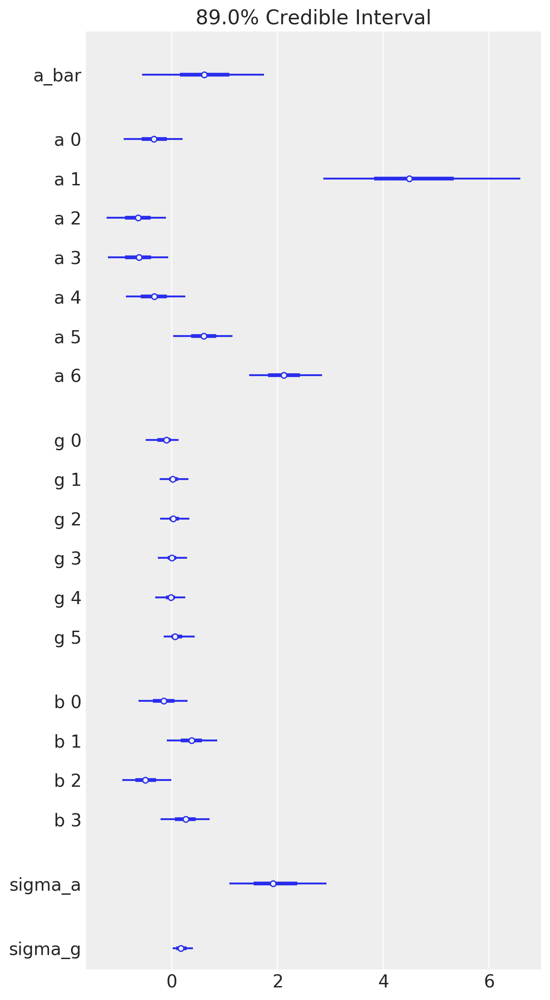

In [22]:
az.plot_forest(idata_13_4, combined=True);

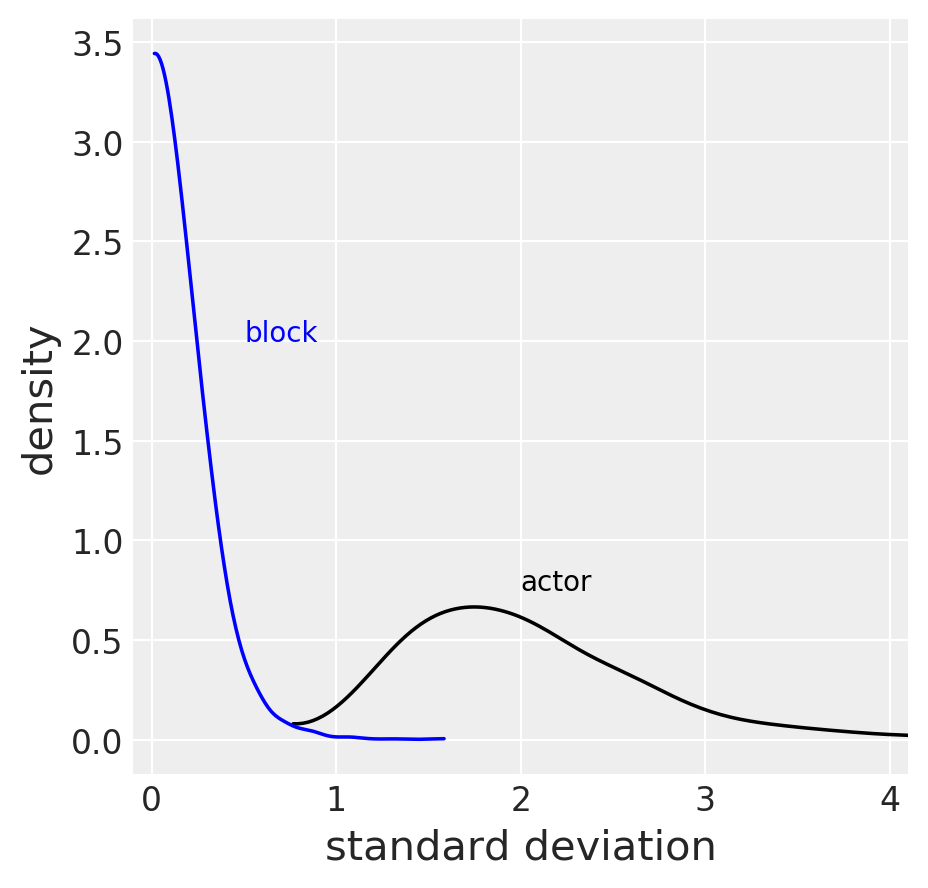

In [23]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))

az.plot_kde(idata_13_4.posterior["sigma_a"], ax=ax, plot_kwargs={"color": "black"})
az.plot_kde(idata_13_4.posterior["sigma_g"], ax=ax, plot_kwargs={"color": "blue"})

ax.text(2, 0.75, "actor", color="black")
ax.text(0.5, 2, "block", color="blue")
ax.set_xlabel("standard deviation")
ax.set_ylabel("density")
ax.set_xlim(-0.1, 4.1);

#### Code 13.23

In [24]:
with pm.Model() as m_13_5:
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    sigma_a = pm.Exponential("sigma_a", 1.0)

    a = pm.Normal("a", a_bar, sigma_a, shape=Nactor)
    b = pm.Normal("b", 0.0, 0.5, shape=Ntreatments)

    p = pm.math.invlogit(a[actor] + b[treatment])
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    trace_13_5 = pm.sample(random_seed=RANDOM_SEED)
    idata_13_5 = az.from_pymc3(trace_13_5)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, a, sigma_a, a_bar]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.
There were 97 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6908008384246643, but should be close to 0.8. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.


#### Code 13.24

In [25]:
az.compare({"m_13_4": idata_13_4, "m_13_5": idata_13_5})

,rank,waic,p_waic,d_waic,weight,se,dse,warning,waic_scale
m_13_5,0,530.863,8.43221,0,0.672904,18.3992,0,False,deviance
m_13_4,1,532.449,10.7065,1.58552,0.327096,18.393,1.61278,False,deviance


#### Code 13.25

In [26]:
with pm.Model() as m_13_6:
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    sigma_a = pm.Exponential("sigma_a", 1.0)
    sigma_g = pm.Exponential("sigma_g", 1.0)
    sigma_b = pm.Exponential("sigma_b", 1.0)

    a = pm.Normal("a", a_bar, sigma_a, shape=Nactor)
    g = pm.Normal("g", 0.0, sigma_g, shape=Nblock)
    b = pm.Normal("b", 0.0, sigma_b, shape=Ntreatments)

    p = pm.math.invlogit(a[actor] + g[block] + b[treatment])
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    trace_13_6 = pm.sample(tune=2000, target_accept=0.95, random_seed=RANDOM_SEED)
    idata_13_6 = az.from_pymc3(trace_13_6)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, g, a, sigma_b, sigma_g, sigma_a, a_bar]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 21 seconds.
There were 9 divergences after tuning. Increase `target_accept` or reparameterize.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


In [27]:
m13_4 = az.summary(idata_13_4, var_names=["b"], kind="stats", round_to=2)["mean"]
m13_4.name = "m13_4"
m13_6 = az.summary(idata_13_6, var_names=["b"], kind="stats", round_to=2)["mean"]
m13_6.name = "m13_6"
pd.concat([m13_4, m13_6], axis=1)

,m13_4,m13_6
b[0],-0.15,-0.12
b[1],0.38,0.36
b[2],-0.50,-0.44
b[3],0.26,0.26


#### Code 13.26

In [28]:
with pm.Model() as m_13_7:
    v = pm.Normal("v", 0.0, 3.0)
    x = pm.Normal("x", 0.0, pm.math.exp(v))

    trace_13_7 = pm.sample(random_seed=RANDOM_SEED)
    idata_13_7 = az.from_pymc3(trace_13_7)
az.summary(idata_13_7, round_to=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [x, v]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
There were 285 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.38402414793118334, but should be close to 0.8. Try to increase the number of tuning steps.
There were 273 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.5236870093086058, but should be close to 0.8. Try to increase the number of tuning steps.
There were 373 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.4149833310077266, but should be close to 0.8. Try to increase the number of tuning steps.
There were 286 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.4484671380347144, but should be close 

,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
v,3.00,1.72,-0.18,5.18,0.50,0.36,12.02,12.02,11.53,11.79,1.27
x,-10.31,169.77,-130.96,128.02,10.22,7.24,275.77,275.77,370.66,267.49,1.18


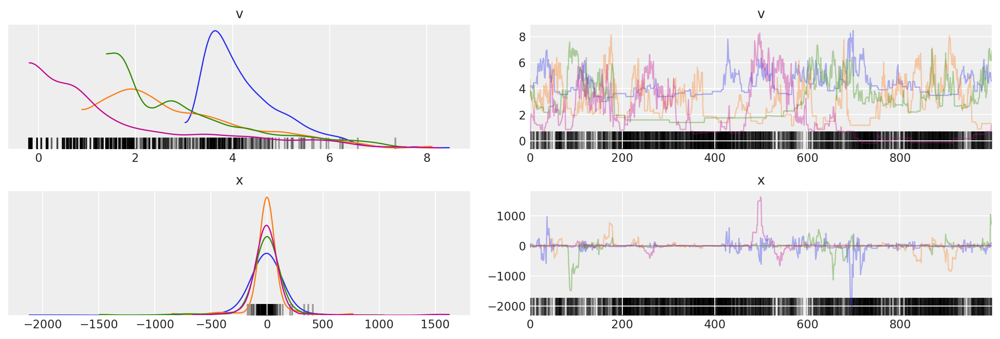

In [29]:
az.plot_trace(idata_13_7);

/Users/alex_andorra/opt/anaconda3/envs/stat-rethink-pymc3/lib/python3.7/site-packages/arviz/plots/pairplot.py:167: UserWarning: fill_last and contour will be deprecated. Please use kde_kwargs
  "fill_last and contour will be deprecated. Please use kde_kwargs", UserWarning,


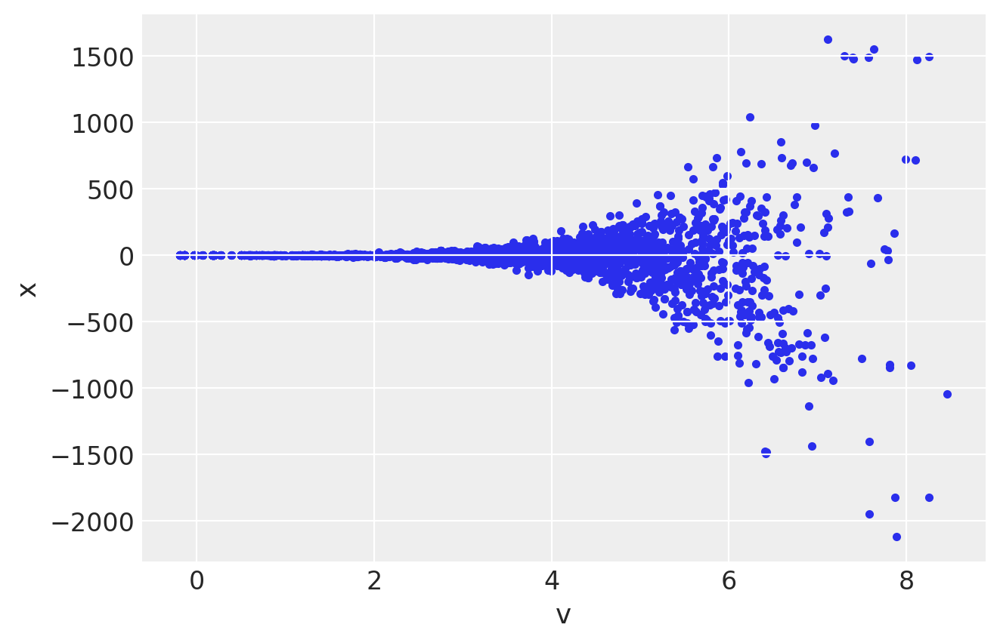

In [30]:
az.plot_pair(idata_13_7, textsize=12);

#### Code 13.27

In [31]:
with pm.Model() as m_13_7nc:
    v = pm.Normal("v", 0.0, 3.0)
    z = pm.Normal("z", 0.0, 1.0)
    x = pm.Deterministic("x", z * pm.math.exp(v))

    trace_13_7nc = pm.sample(random_seed=RANDOM_SEED)
    idata_13_7nc = az.from_pymc3(trace_13_7nc)
az.summary(idata_13_7nc, round_to=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [z, v]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
v,0.04,2.91,-4.50,4.71,0.05,0.05,3512.20,1986.09,3520.09,2816.31,1.0
z,-0.01,1.00,-1.58,1.60,0.02,0.02,3561.88,1796.93,3560.91,2759.12,1.0
x,-8.35,2814.79,-22.99,24.48,34.78,34.20,6549.52,3387.56,2900.48,2969.82,1.0


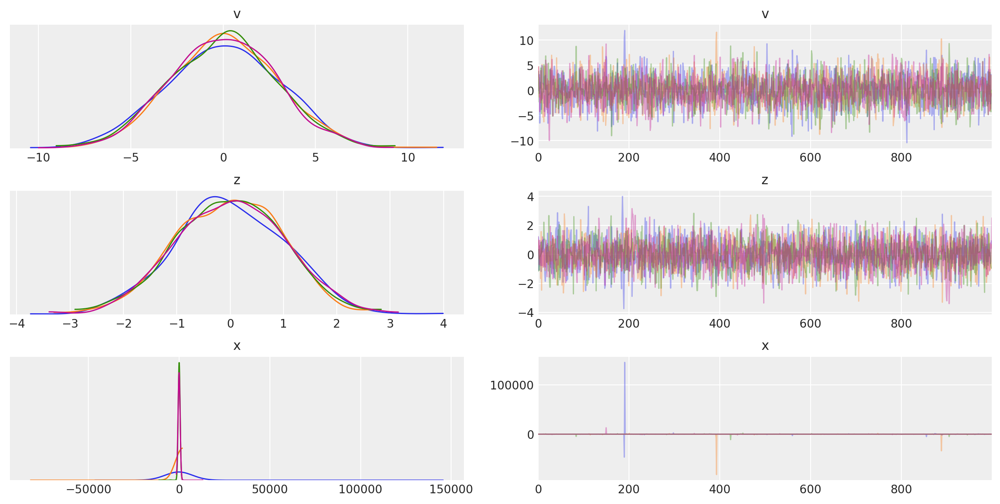

In [32]:
az.plot_trace(idata_13_7nc);

/Users/alex_andorra/opt/anaconda3/envs/stat-rethink-pymc3/lib/python3.7/site-packages/arviz/plots/pairplot.py:167: UserWarning: fill_last and contour will be deprecated. Please use kde_kwargs
  "fill_last and contour will be deprecated. Please use kde_kwargs", UserWarning,


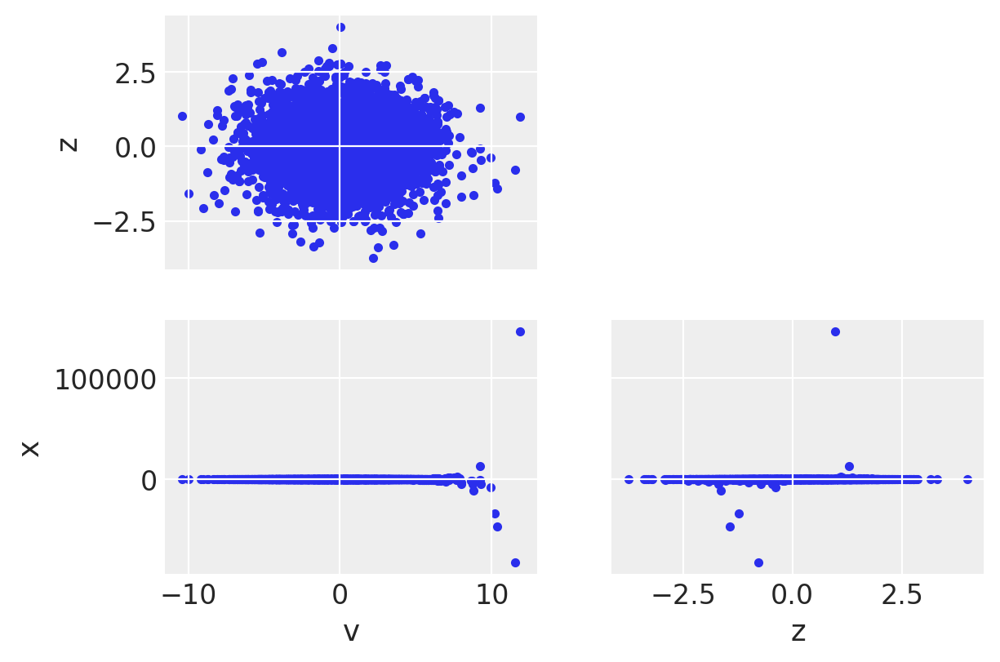

In [33]:
az.plot_pair(idata_13_7nc, textsize=12, figsize=(10, 7));

#### Code 13.28

In [34]:
with m_13_4:
    trace_13_4 = pm.sample(tune=3000, target_accept=0.99, random_seed=RANDOM_SEED)
    idata_13_4 = az.from_pymc3(trace_13_4)
az.summary(idata_13_4, round_to=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, g, a, sigma_g, sigma_a, a_bar]


Sampling 4 chains for 3_000 tune and 1_000 draw iterations (12_000 + 4_000 draws total) took 112 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


,mean,sd,hpd_5.5%,hpd_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a_bar,0.57,0.73,-0.63,1.65,0.02,0.01,1802.53,1356.89,1838.65,2235.24,1.00
a[0],-0.37,0.37,-0.92,0.26,0.01,0.01,920.73,920.73,920.34,1771.34,1.00
a[1],4.67,1.39,2.77,6.45,0.04,0.03,1103.85,884.25,1506.10,1149.55,1.00
a[2],-0.68,0.37,-1.28,-0.10,0.01,0.01,919.48,919.48,918.99,1684.09,1.00
a[3],-0.68,0.37,-1.29,-0.09,0.01,0.01,891.92,891.92,893.48,1556.00,1.00
a[4],-0.37,0.37,-0.99,0.20,0.01,0.01,947.74,947.74,949.05,1777.61,1.00
a[5],0.57,0.37,-0.01,1.18,0.01,0.01,941.65,941.65,940.13,1643.29,1.00
a[6],2.08,0.46,1.31,2.77,0.01,0.01,1248.87,1248.87,1250.34,1940.16,1.00
g[0],-0.16,0.21,-0.51,0.12,0.01,0.01,663.57,663.57,765.79,1626.80,1.00
g[1],0.04,0.17,-0.21,0.35,0.00,0.00,1745.48,854.40,2228.14,1599.47,1.01


#### Code 13.29

In [35]:
with pm.Model() as m_13_4nc:
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    sigma_a = pm.Exponential("sigma_a", 1.0)
    sigma_g = pm.Exponential("sigma_g", 1.0)

    z = pm.Normal("z", 0.0, 1.0, shape=Nactor)
    x = pm.Normal("x", 0.0, 1.0, shape=Nblock)
    b = pm.Normal("b", 0.0, 0.5, shape=Ntreatments)

    _ = pm.Deterministic("a", a_bar + z * sigma_a)  # actor intercepts
    _ = pm.Deterministic("g", x * sigma_g)  # block intercepts
    p = pm.math.invlogit(a_bar + z[actor] * sigma_a + x[block] * sigma_g + b[treatment])
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    trace_13_4nc = pm.sample(tune=3000, target_accept=0.9, random_seed=RANDOM_SEED)
    idata_13_4nc = az.from_pymc3(trace_13_4nc)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, x, z, sigma_g, sigma_a, a_bar]


Sampling 4 chains for 3_000 tune and 1_000 draw iterations (12_000 + 4_000 draws total) took 31 seconds.


#### Code 13.30

In [36]:
m13_4 = az.summary(idata_13_4, kind="diagnostics", round_to=2)["ess_bulk"]
m13_4.name = "m13_4"

m13_4nc = az.summary(idata_13_4nc, var_names=["~x", "~z"], kind="diagnostics", round_to=2)[
    "ess_bulk"
]
m13_4nc.name = "m13_4nc"

ess_bulk = pd.concat([m13_4, m13_4nc], axis=1, sort=True)

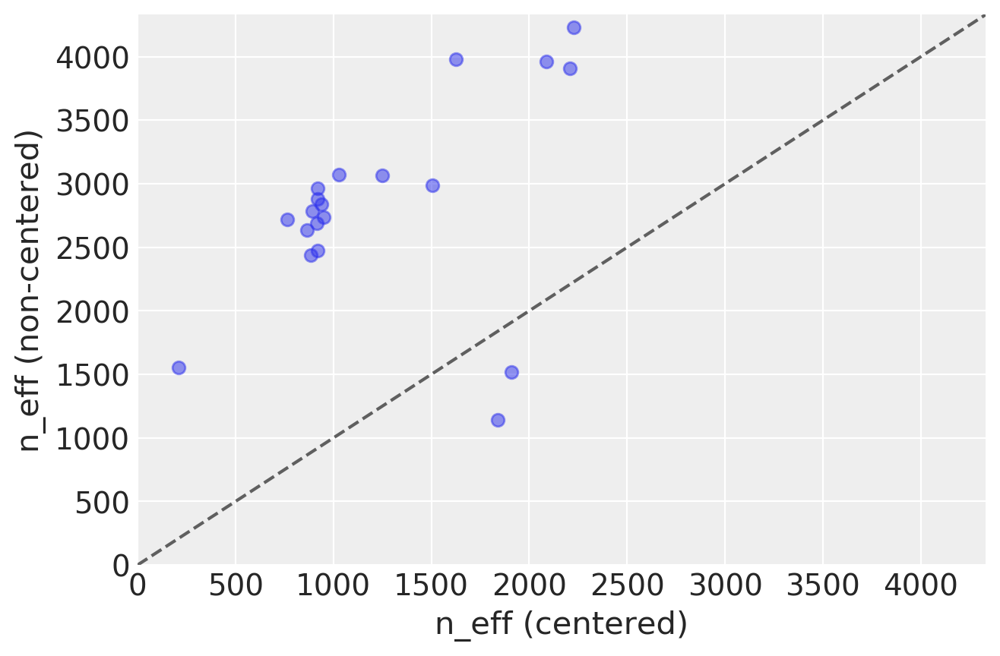

In [37]:
plt.plot(ess_bulk.m13_4.values, ess_bulk.m13_4nc.values, "o", alpha=0.5)

max_val = ess_bulk.m13_4nc.max() + 100
plt.plot(np.arange(max_val), np.arange(max_val), "k--", alpha=0.6)

plt.xlabel("n_eff (centered)")
plt.xlim(0, max_val)

plt.ylabel("n_eff (non-centered)")
plt.ylim(0, max_val);

#### Code 13.31

Before sampling posterior predictive samples, let's redefine the model with shared variables (`pm.Data`), to be able to change them when we'll do posterior predictive checks below:

In [38]:
with pm.Model() as m_13_4:
    a_bar = pm.Normal("a_bar", 0.0, 1.5)
    sigma_a = pm.Exponential("sigma_a", 1.0)
    sigma_g = pm.Exponential("sigma_g", 1.0)

    a = pm.Normal("a", a_bar, sigma_a, shape=Nactor)
    g = pm.Normal("g", 0.0, sigma_g, shape=Nblock)
    b = pm.Normal("b", 0.0, 0.5, shape=Ntreatments)

    actor_ = pm.Data("actor", actor)
    block_ = pm.Data("block", block)
    treatment_ = pm.Data("treatment", treatment)
    p = pm.Deterministic("p", pm.math.invlogit(a[actor_] + g[block_] + b[treatment_]))
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    trace_13_4 = pm.sample(tune=3000, target_accept=0.99, random_seed=RANDOM_SEED)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, g, a, sigma_g, sigma_a, a_bar]


Sampling 4 chains for 3_000 tune and 1_000 draw iterations (12_000 + 4_000 draws total) took 113 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


In [39]:
chimp = 2
new_data = dict(actor=np.repeat(chimp - 1, 4), block=np.repeat(0, 4), treatment=np.arange(4))

with m_13_4:
    pm.set_data(new_data)
    post_pred_p = pm.sample_posterior_predictive(
        trace_13_4, var_names=["p"], random_seed=RANDOM_SEED
    )["p"]

post_pred_p.mean(0).round(2), az.hpd(post_pred_p).round(2)

/Users/alex_andorra/opt/anaconda3/envs/stat-rethink-pymc3/lib/python3.7/site-packages/arviz/data/base.py:146: UserWarning: More chains (4000) than draws (4). Passed array should have shape (chains, draws, *shape)
  UserWarning,


(array([0.98, 0.99, 0.97, 0.99]),
 array([[0.95, 1.  ],
        [0.97, 1.  ],
        [0.93, 1.  ],
        [0.97, 1.  ]]))

In [40]:
def chimp_pp_plot(hpd_data, mean_data, title):
    _, ax = plt.subplots(1, 1, figsize=(5, 5))
    az.plot_hpd(range(4), hpd_data)
    ax.plot(mean_data)

    ax.set_ylim(0, 1.1)
    ax.set_xlabel("treatment")
    ax.set_ylabel("proportion pulled left")
    ax.set_xticks(range(4), ("R/N", "L/N", "R/P", "L/P"))
    plt.title(title);

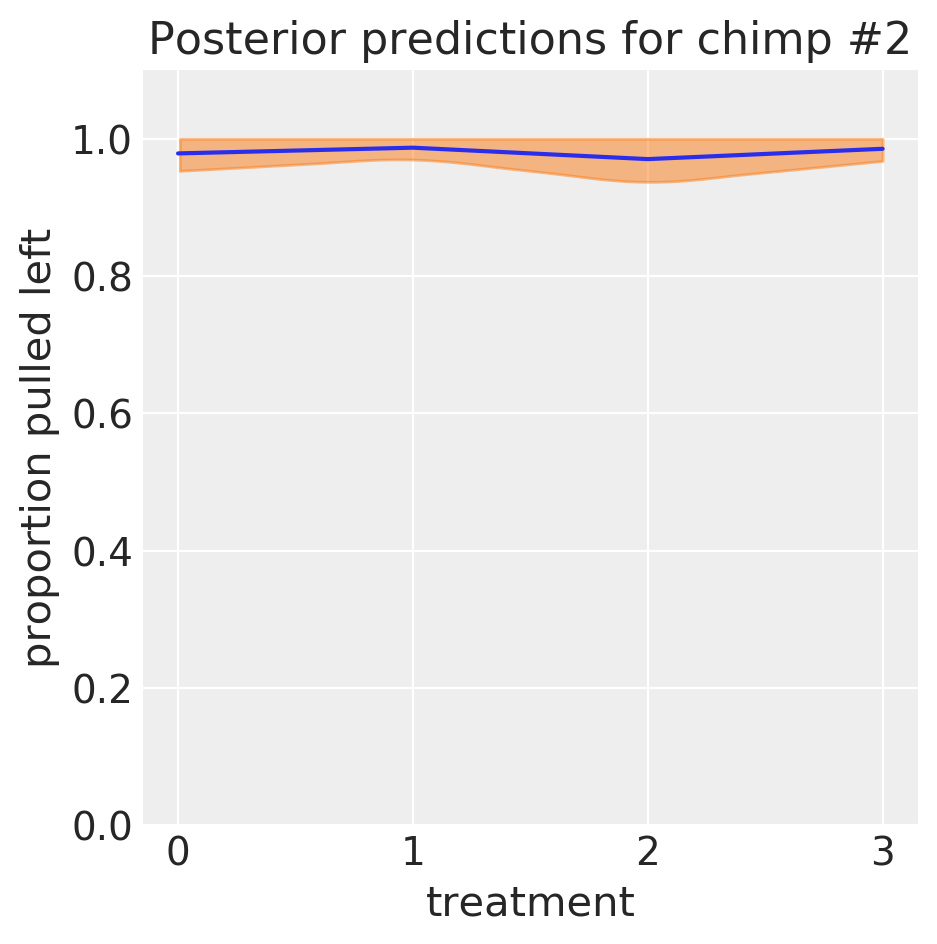

In [41]:
chimp_pp_plot(
    hpd_data=post_pred_p,
    mean_data=post_pred_p.mean(0),
    title=f"Posterior predictions for chimp #{chimp}",
)

#### Code 13.32

In [42]:
post = idata_13_4.posterior.rename_dims(
    {"a_dim_0": "actor", "g_dim_0": "block_id", "b_dim_0": "treatment"}
)
post

<xarray.Dataset>
Dimensions:  (actor: 7, block_id: 6, chain: 4, draw: 1000, treatment: 4)
Coordinates:
  * chain    (chain) int64 0 1 2 3
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999
    a_dim_0  (actor) int64 0 1 2 3 4 5 6
    g_dim_0  (block_id) int64 0 1 2 3 4 5
    b_dim_0  (treatment) int64 0 1 2 3
Dimensions without coordinates: actor, block_id, treatment
Data variables:
    a_bar    (chain, draw) float64 0.44 0.4718 0.6892 ... 2.199 1.418 0.2977
    a        (chain, draw, actor) float64 0.01955 6.252 -0.5251 ... 1.005 2.346
    g        (chain, draw, block_id) float64 -0.3874 -0.1333 ... 0.08376 0.272
    b        (chain, draw, treatment) float64 -0.05165 0.5962 ... -0.2943
    sigma_a  (chain, draw) float64 1.774 1.689 1.981 3.336 ... 2.335 3.045 1.062
    sigma_g  (chain, draw) float64 0.2173 0.2246 0.6527 ... 0.1854 0.1931 0.2906
Attributes:
    created_at:                 2020-05-18T15:37:47.591223
    arviz_version:              0.7.0
    

In [43]:
post["a"].shape

(4, 1000, 7)

#### Code 13.33

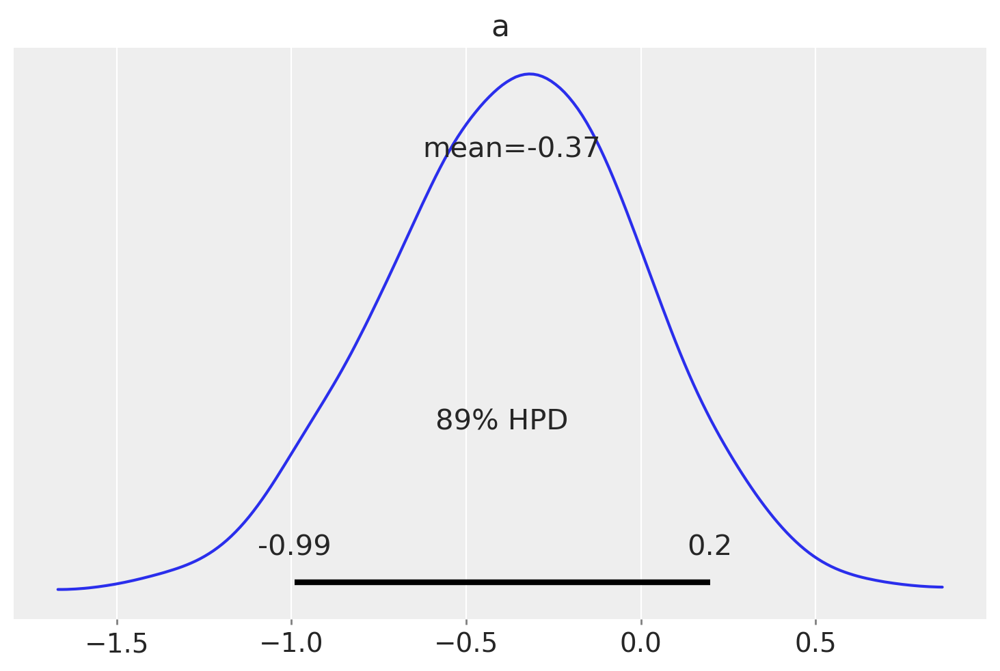

In [44]:
az.plot_posterior(post, var_names=["a"], coords={"actor": 4});

#### Code 13.34

In [45]:
def p_link(actor, block_id):
    logodds = post.sel(actor=actor)["a"] + post.sel(block_id=block_id)["g"] + post["b"]
    return logistic(logodds)

#### Code 13.35

In [46]:
p_raw = p_link(actor=1, block_id=0)
p_raw.mean(dim=("chain", "draw")).data.round(2), az.hpd(p_raw.data).round(2)

(array([0.98, 0.99, 0.97, 0.99]),
 array([[0.95, 1.  ],
        [0.97, 1.  ],
        [0.93, 1.  ],
        [0.97, 1.  ]]))

/Users/alex_andorra/opt/anaconda3/envs/stat-rethink-pymc3/lib/python3.7/site-packages/arviz/data/base.py:146: UserWarning: More chains (4000) than draws (4). Passed array should have shape (chains, draws, *shape)
  UserWarning,


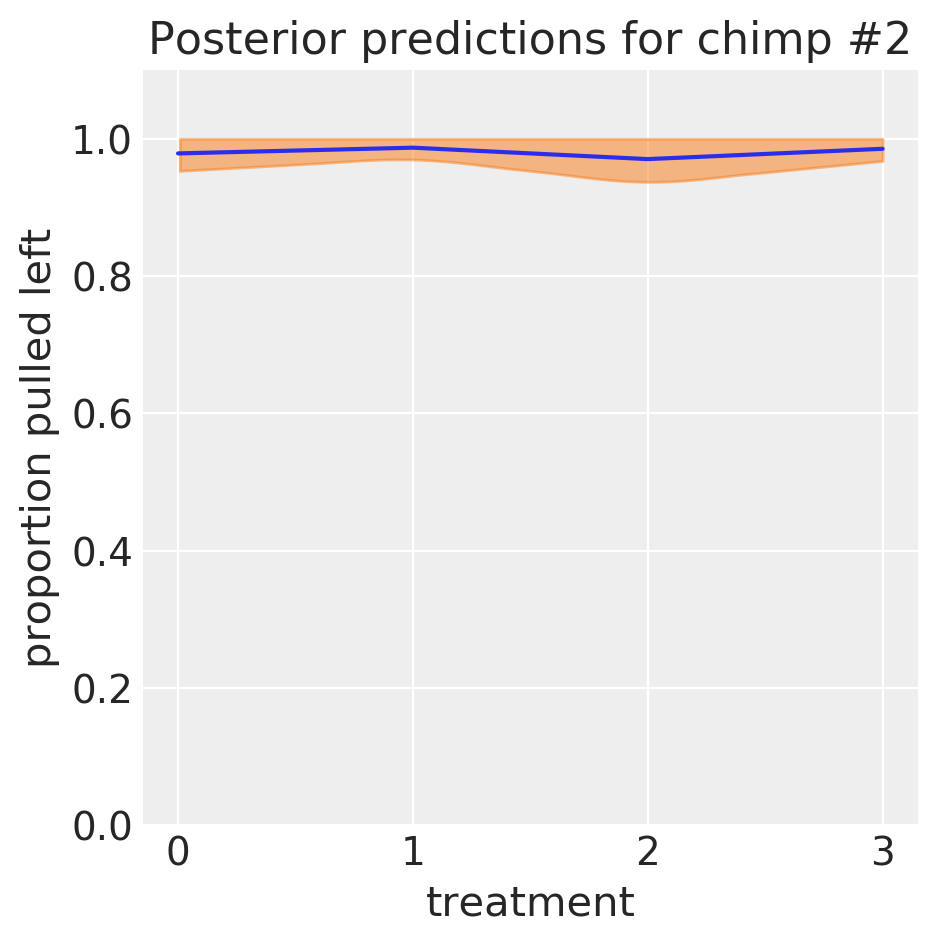

In [47]:
chimp_pp_plot(
    hpd_data=p_raw.data,
    mean_data=p_raw.mean(dim=("chain", "draw")).data,
    title=f"Posterior predictions for chimp #{chimp}",
)

#### Code 13.36

We don't need this function: we'll just add the posterior for `a_bar` and the posterior for `b`, and xarray (which is the format ArviZ uses for its `InferenceData`) will take care of the shape handling for us, even if `post["a_bar"]` and `post["b"]` have different shapes.

#### Code 13.37

/Users/alex_andorra/opt/anaconda3/envs/stat-rethink-pymc3/lib/python3.7/site-packages/arviz/data/base.py:146: UserWarning: More chains (4000) than draws (4). Passed array should have shape (chains, draws, *shape)
  UserWarning,


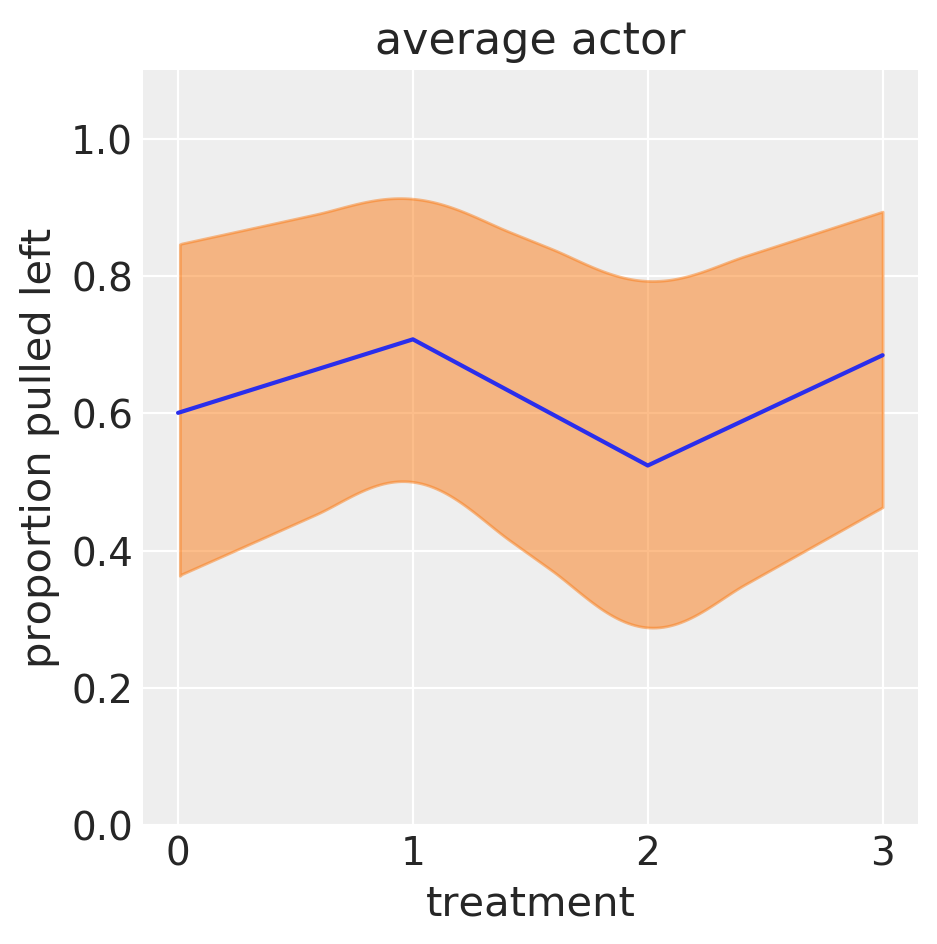

In [48]:
p_raw = logistic(post["a_bar"] + post["b"])

chimp_pp_plot(
    hpd_data=p_raw.data,
    mean_data=p_raw.mean(dim=("chain", "draw")).data,
    title="average actor",
)

#### Code 13.38

/Users/alex_andorra/opt/anaconda3/envs/stat-rethink-pymc3/lib/python3.7/site-packages/arviz/data/base.py:146: UserWarning: More chains (4000) than draws (4). Passed array should have shape (chains, draws, *shape)
  UserWarning,


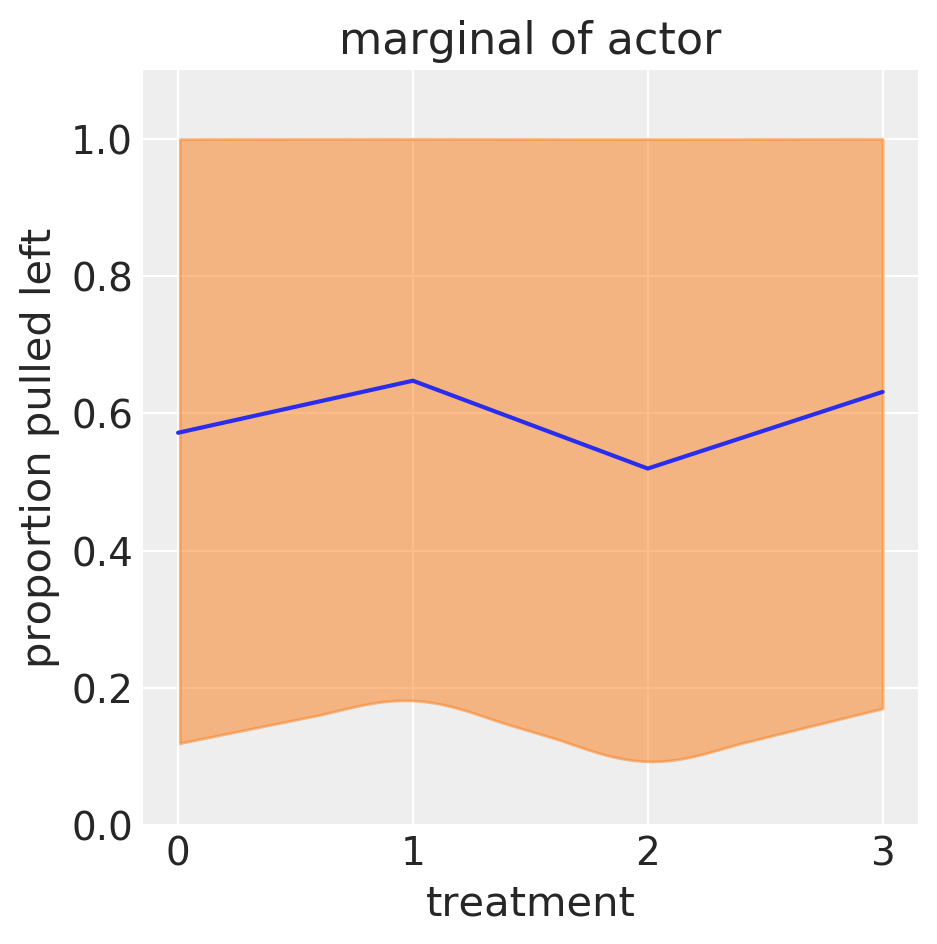

In [49]:
a_sim = np.random.normal(loc=post["a_bar"], scale=post["sigma_a"])
p_raw_asim = logistic(a_sim[:, :, None] + post["b"])

chimp_pp_plot(
    hpd_data=p_raw_asim.data,
    mean_data=p_raw_asim.mean(dim=("chain", "draw")).data,
    title="marginal of actor",
)

#### Code 13.39

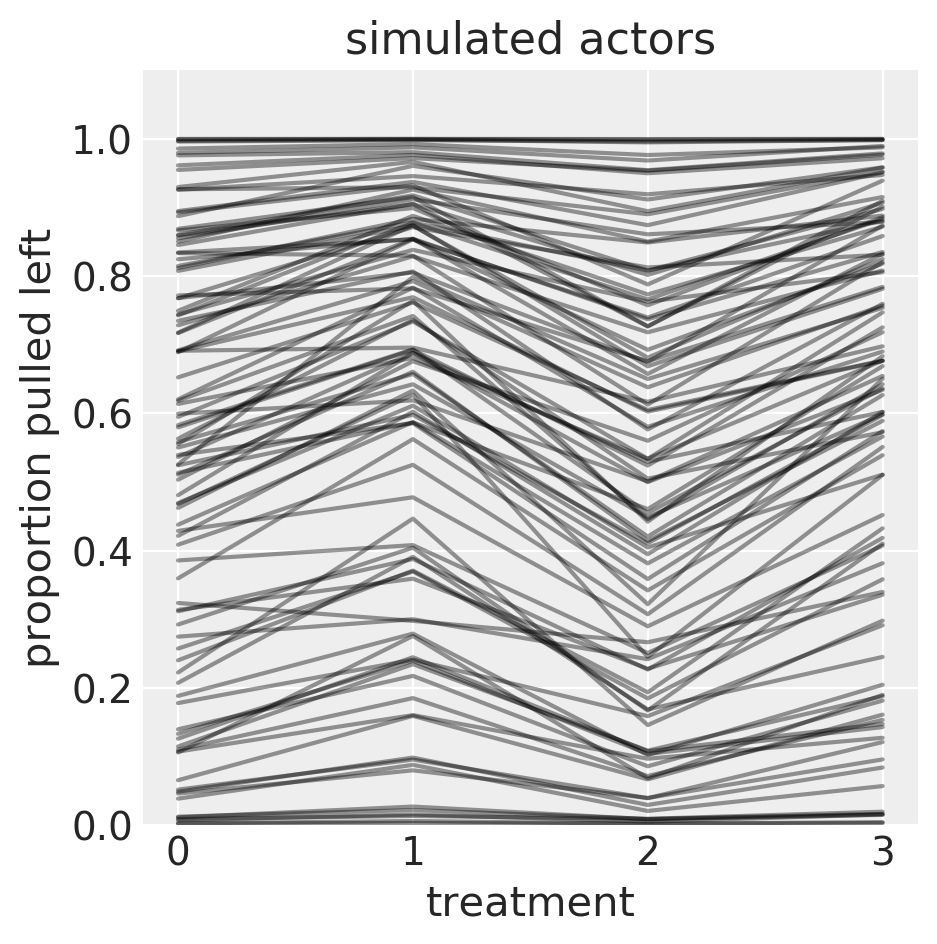

In [50]:
p_raw_asim = p_raw_asim.stack(sample=("chain", "draw"))

_, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.plot(np.tile(np.arange(4), (100, 1)).T, p_raw_asim[:, :100].data, "k", alpha=0.4)

ax.set_ylim(0, 1.1)
ax.set_xlabel("treatment")
ax.set_ylabel("proportion pulled left")
ax.set_xticks(range(4), ("R/N", "L/N", "R/P", "L/P"))
plt.title("simulated actors");

In [51]:
%load_ext watermark
%watermark -n -u -v -iv -w

scipy      1.4.1
pymc3      3.8
numpy      1.18.1
pandas     0.25.3
arviz      0.7.0
matplotlib 3.1.3
last updated: Mon May 18 2020 

CPython 3.7.6
IPython 7.12.0
watermark 2.0.1
